# init

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install -U git+https://github.com/UN-GCPDS/python-gcpds.filters.git
!pip install -U git+https://github.com/UN-GCPDS/python-gcpds.utils.git
!pip install mne==0.19
!pip install bctpy

  Cloning https://github.com/UN-GCPDS/python-gcpds.filters.git to /tmp/pip-req-build-gvt5zoy4
  Running command git clone -q https://github.com/UN-GCPDS/python-gcpds.filters.git /tmp/pip-req-build-gvt5zoy4
  Cloning https://github.com/UN-GCPDS/python-gcpds.utils.git to /tmp/pip-req-build-yg_h_une
  Running command git clone -q https://github.com/UN-GCPDS/python-gcpds.utils.git /tmp/pip-req-build-yg_h_une


In [ ]:
from scipy.spatial.distance import squareform
import mne
from mne.connectivity import spectral_connectivity as connectivity
# drive y datos
from google.colab import drive
import requests
# estructuras
import pandas as pd
# 
from ipywidgets import interact_manual
from ipywidgets import interact
# módulo para entrenamiento
from sklearn.pipeline import Pipeline
from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import make_scorer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
# system
import os
from time import time
# data
import pickle
import numpy as np
from numpy import angle, sin, cos, sqrt
from scipy.io import loadmat, savemat
import scipy as sp
from scipy.io import savemat
from scipy.signal import butter, lfilter, welch, hanning, filtfilt, hilbert
# figuras
import matplotlib.pyplot as plt
from gcpds.utils import loaddb
from gcpds.utils.visualizations import plot_eeg, plot_topoplot
# MNE toolbox
import mne
import bct
from mne.preprocessing import ICA
# módulo de multiproceso de las tareas.
import multiprocessing

# load data EEG

In [ ]:
# Sujetos de la base de datos
Subjects = list(np.arange(1,32))
# canales de la base de datos
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3', 'Pz', 'P4', 'T6', 'O1', 'O2']
n_channels = len(channels)
# Frecuencia de muestreo de la base de datos.
sampling_freq  = 1000
# ubicación de la base de datos.
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
# Método utilizado para la función de ICA de MNE.
method = 'fastica'
# Número de núcleos para ell multiproceso
# pool = multiprocessing.Pool(processes=multiprocessing.cpu_count())
# ciclo de los sujetos.
y = list()
data_ref_ica = list()
data_ref = list()
data_componentes = list()
for s in Subjects:
  # carga de la información del sujetos.
  S_ERP = loadmat(load_path + f"Sujeto_"+str(s)+".mat")
  print('sujeto: ', s)
  data = S_ERP['music']
  # data = np.transpose(data, (2,1,0)) # transponer en trials x canales x tiempo
  data_target = data

  # structure mne datos en (trials,canales,tiempo)
  ch_types = ['eeg']*n_channels
  info = mne.create_info(channels, ch_types=ch_types, sfreq=sampling_freq)
  # info.set_montage('standard_1005')
  raw = mne.EpochsArray(data_target, info)

  # filtro la señal de 0.5 - 50 Hz.
  raw.filter(1,45)

  # señal sin quitar los artefactos.
  # plt.figure(figsize=(20,8))
  # plot_eeg(raw.get_data()[0,:,:],channels,sampling_freq)

  # Repairing artifacts with ICA
  
  # ica = ICA(n_components=n_channels, method=method, max_iter='auto', random_state=0)
  # ica.fit(raw)
  # componentes = ica.get_sources(raw).get_data()
  # componentes_ = ica.get_components()
  # ica.plot_sources(raw, show_scrollbars=False)
  
  # raw_delta = raw.copy()
  # # filtro la señal de 0.5 - 4 Hz.
  # raw_delta.filter(0.5,4)
  # componentes_delta = ica.get_sources(raw_delta).get_data()

  # raw_theta = raw.copy()
  # # filtro la señal de 0.5 - 4 Hz.
  # raw_theta.filter(4,8)
  # componentes_theta = ica.get_sources(raw_theta).get_data()

  # raw_alpha = raw.copy()
  # # filtro la señal de 0.5 - 4 Hz.
  # raw_alpha.filter(8,12)
  # componentes_alpha = ica.get_sources(raw_alpha).get_data()

  # raw_beta_l = raw.copy()
  # # filtro la señal de 0.5 - 4 Hz.
  # raw_beta_l.filter(12,16)
  # componentes_beta_l = ica.get_sources(raw_beta_l).get_data()

  # raw_beta_h = raw.copy()
  # # filtro la señal de 0.5 - 4 Hz.
  # raw_beta_h.filter(16,30)
  # componentes_beta_h = ica.get_sources(raw_beta_h).get_data()

  # señal sin quitar los artefactos.
  # plt.figure(figsize=(20,8))
  # plot_eeg(componentes[0,:,:],channels,sampling_freq)
  
  # Parametros para el análisis de la entropia.
  # tau     = 10              # 20   30 
  # window  = 1*sampling_freq # 3,   3   segundo de la ventana.
  # step    = window*0.5      # 50%, 80% de traslape.
  # windows = list(np.arange(0,componentes.shape[2]-window,step))

  # start_time = time.time()
  # entropy_tr = list()
  # for tr in range(data_target.shape[0]):
  #   data = list()
  #   for time_ in range(len(windows)):
  #     signal = np.squeeze(raw.get_data()[tr,:,int(windows[time_]):int(windows[time_]+window)])
  #     data.append(signal)
  #   # estimación de la entropía de la señal.
  #   entropy_tr.append(np.asarray(pool.map(fun_entropy, data)))
  # entropy_raw = np.asarray(entropy_tr)
  # print('Tiempo de la entropia de componentes {tim}'.format(tim=(time.time()-start_time)))
  # # ica.plot_sources(mne.io.RawArray(raw.get_data()[0], info))
  
  # start_time = time.time()
  # entropy_tr = list()
  # for tr in range(data_target.shape[0]):
  #   data = list()
  #   for time_ in range(len(windows)):
  #     signal = np.squeeze(componentes[tr,:,int(windows[time_]):int(windows[time_]+window)])
  #     data.append(signal)
  #   # estimación de la entropía de las componentes.
  #   entropy_tr.append(np.asarray(pool.map(fun_entropy, data)))
  # entropy_com = np.asarray(entropy_tr)
  # print('Tiempo de la entropia de componentes {tim}'.format(tim=(time.time()-start_time)))
  
  # raw2 = raw.copy()
  # comp_ = []
  # for tr in range(entropy_com.shape[0]):
  #   datos_ = np.max(entropy_com[tr,:,:],axis=0)-np.min(entropy_com[0,:,:],axis=0)
  #   datos_f = np.asarray([round(a,1) for a in datos_])
  #   comp_.append(np.where((datos_f>0)==True)[0])
  # pos = list(np.unique(np.concatenate(comp_)))
  # ica.exclude = [0]          # indices chosen based on various plots above sujeto 2.
  # ica.apply(raw2)
  
  # # figura señal quitando artefactos
  # plt.figure(figsize=(20,8))
  # plot_eeg(raw2.get_data()[0,:,:],channels,sampling_freq)

  # start_time = time.time()
  # entropy_tr = list()
  # for tr in range(data_target.shape[0]):
  #   data = list()
  #   for time_ in range(len(windows)):
  #     signal = np.squeeze(raw2.get_data()[tr,:,int(windows[time_]):int(windows[time_]+window)])
  #     data.append(signal)
  #   # estimación de la entropía de la señal quitando artefactos.
  #   entropy_tr.append(np.asarray(pool.map(fun_entropy, data)))
  # entropy_ica = np.asarray(entropy_tr)
  # print('Tiempo de la entropia de la señal {tim}'.format(tim=(time.time()-start_time)))

  # # CAR common average reference
  # # En la señal.
  rereferenced_raw, ref_data = mne.set_eeg_reference(raw, ref_channels='average',projection=True,verbose=0)
  data_ref.append(rereferenced_raw.get_data())
  # data_ref = rereferenced_raw.get_data()
  # # En la señal reconstruida.
  # rereferenced_comp_ica, ref_data = mne.set_eeg_reference(raw2, ref_channels='average',projection=True,verbose=0)
  # data_componentes.append(componentes)
  # data_ref_ica = rereferenced_comp_ica.get_data()
  # savemat(load_path+f'Resultado_music_Sujeto'+str(s)+'.mat',{'X_ica':raw2.get_data(),'X_raw':raw.get_data(),'ref_raw':data_ref,
  #           'ref_ica':data_ref_ica,'H_raw':entropy_raw,'H_com':entropy_com,'H_ica':entropy_ica})
#   savemat(load_path+f'Resultado_music_Sujeto'+str(s)+'_componentes.mat',{'data_componentes':componentes,'Componentes':componentes_,
#                                                                          'data_compo_delta':componentes_delta,
#                                                                          'data_compo_theta':componentes_theta,
#                                                                          'data_compo_alpha':componentes_alpha,
#                                                                          'data_compo_beta_l':componentes_beta_l,
#                                                                          'data_compo_beta_h':componentes_beta_h})
# # savemat(load_path+f'Resultado_music_Sujeto'+str(s)+'_all_componentes.mat',{'all_componentes':data_componentes})

NameError: ignored

# Load functions deep cca

In [ ]:
cd /content/drive/Shareddrives/GCPDS/databases/Databases_musica/toolbox_deep/deep-cca-for-audio-EEG

/content/drive/Shareddrives/GCPDS/databases/Databases_musica/toolbox_deep/deep-cca-for-audio-EEG


In [ ]:
ls

cca_functions.py             lmcca.py
Cx_music.png                 lmdc.py
data_actual.npy              main_data.asv
data_gauss__2.mat            main_data.m
dat_gauss_.mat               main_deepcca
Datos_clases_estímulos.mat   MIfunctions.py
Datos_music.mat              modCSP.py
dcca.py                      music_helper.py
deep-cca-for-audio-EEG/      preProcessEEG_Audio_Chevigne_2018.m
deep_losses.py               preProcessEEG_Audio_Chevigne_2018_v2.m
deep_models.py               __pycache__/
deep_nets.py                 README.md
dmcca_1_0_1_0.1_60_0.05/     sbj0acc48.75.eps
dmcca_1_0_1_0.1_60_0.05_1/   sbj0acc50.0.eps
dmcca_1_0_1_0.1_60_0.05_10/  sbj1acc43.75.eps
dmcca_1_0_1_0.1_60_0.05_2/   sbj2acc50.0.eps
dmcca_1_0_1_0.1_60_0.05_3/   sbj3acc50.0.eps
dmcca_1_0_1_0.1_60_0.05_4/   sbj4acc51.25.eps
dmcca_1_0_1_0.1_60_0.05_5/   sbj5acc50.0.eps
dmcca_1_0_1_0.1_60_0.05_6/   sbj6acc45.0.eps
dmcca_1_0_1_0.1_60_0.05_7/   speech_helper.py
dmcca_1_0_1_0.1_60_0.05_8/   Subject0_Preproces

In [ ]:
import cca_functions

# load data por grupo

In [ ]:
import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
import sys
import os
from os import path
import scipy.io
from sklearn.model_selection import train_test_split,StratifiedShuffleSplit,KFold
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.model_selection import KFold, RepeatedKFold, StratifiedKFold
from sklearn.decomposition import PCA
import bct
from scipy.spatial.distance import squareform 
# from pdb import set_trace as bp  ################# added break point accessor####################
from cca_functions  import filtem2, pca_stim_filtem_pca_resp
from sklearn.decomposition import FactorAnalysis

In [ ]:

# folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here

# # data_psd = scipy.io.loadmat(folder_path+f"/PSD_data_music2.mat")['Data_pow']
# # data_psd = data_psd[:,:,:,:4,:]
# # data_psd = data_psd.reshape([data_psd.shape[0]*data_psd.shape[1],\
# #                               data_psd.shape[2]*data_psd.shape[3]*data_psd.shape[4]])
# # print(data_psd.shape) 
# # data_PLV_  = scipy.io.loadmat(folder_path+f"/PLV_all_subs31_music2.mat")['PLV']
# # # data_PLV = np.zeros((data_PLV_.shape[0],data_PLV_.shape[1],19,7,data_PLV_.shape[4]))
# # # for a1 in range(data_PLV_.shape[0]):
# # #   for a2 in range(data_PLV_.shape[1]):
# # #     for a3 in range(7):
# # #       for a4 in range(data_PLV_.shape[4]):
# # #         data_PLV[a1,a2,:,a3,a4] =  bct.strengths_und(squareform(data_PLV_[a1,a2,:,a3,a4]))
# # # data_PLV = data_PLV_[:,:,:,:,:]
# # print(data_PLV_.shape)
# # # del data_PLV_
# # data_PLV = np.zeros((data_PLV_.shape[0],data_PLV_.shape[1],data_PLV_.shape[2],\
# #                      data_PLV_.shape[3],20))
# # for win in range(20):
# #   data_PLV[:,:,:,:,win] = np.mean(data_PLV_[:,:,:,:,win:win+1],axis=4)
# # data_PLV = np.squeeze(data_PLV[:,:,:,0,:])
# # dim_PLV = data_PLV.shape
# # data_PLV = data_PLV.reshape([data_PLV.shape[0]*data_PLV.shape[1],\
# #                               data_PLV.shape[2]*data_PLV.shape[3]])
# # print(data_PLV.shape)
# # data_gauss_ = scipy.io.loadmat(folder_path+f"/conectividad_gauss.mat")['gaus']
# # data_gauss = np.zeros((data_gauss_.shape[0],data_gauss_.shape[1],19,data_gauss_.shape[3],data_gauss_.shape[4]))
# # for a1 in range(data_gauss_.shape[0]):
# #   for a2 in range(data_gauss_.shape[1]):
# #     for a3 in range(data_gauss_.shape[3]):
# #       for a4 in range(data_gauss_.shape[4]):
# #         data_gauss[a1,a2,:,a3,a4] =  bct.strengths_und(squareform(data_gauss_[a1,a2,:,a3,a4]))
# # data_gauss2 = np.squeeze(data_gauss_[:,:,:,0,:])
# # del data_gauss_

# # print(data_gauss2.shape)
# # data_gauss = np.zeros((data_gauss2.shape[0],data_gauss2.shape[1],
# #                         data_gauss2.shape[2],20))
# # for win in range(20):
# #   data_gauss[:,:,:,win] = np.mean(data_gauss2[:,:,:,win:win+2],axis=3)
# # data_gauss = data_gauss.reshape([data_gauss.shape[0]*data_gauss.shape[1],\
# #                                   data_gauss.shape[2]*data_gauss.shape[3]])
# # print(data_gauss.shape)

# data_pac = list()
# for s in range(31):
#   if s < 27:
#     data_pac.append(scipy.io.loadmat(folder_path+f"PLV_pac_music{s}_trials.mat")['temporal_plv'])
#   else:
#     data_pac.append(scipy.io.loadmat(folder_path+f"PLV_pac_music{s-20}_trials.mat")['temporal_plv'])
# data_pac_ = np.asarray(data_pac)
# del data_pac
# # print(data_pac_.shape)
# data_pac = np.zeros((data_pac_.shape[0],data_pac_.shape[1],171,data_pac_.shape[3],data_pac_.shape[4],data_pac_.shape[5]))
# # for a1 in range(data_pac_.shape[0]):
#   # for a2 in range(data_pac_.shape[1]):
# #     for a3 in range(data_pac_.shape[3]):
# #       for a4 in range(data_pac_.shape[4]):
# #         for a5 in range(data_pac_.shape[5]):
# #           data_pac[a1,a2,:,a3,a4,a5] = bct.strengths_und(squareform(data_pac_[a1,a2,:,a3,a4,a5]))
# # data_pac = data_pac[:,:,:,:4,:,:]
# # del data_pac_

# for win in range(20):
#   data_pac[:,:,:,:,:,win] = np.mean(data_pac_[:,:,:,:,:,win:win+2],axis=5)
# del data_pac_
# dim_pac = data_pac.shape
# data_pac = data_pac.reshape([data_pac.shape[0]*data_pac.shape[1],\
#                               data_pac.shape[2]*data_pac.shape[3]*data_pac.shape[4]*data_pac.shape[5]])
# print(data_pac.shape)
# # data_MuInf = scipy.io.loadmat(folder_path+'/mutual_inf_music2.mat')['Muinf']
# # data_MuInf = np.transpose(data_MuInf,[0,2,1,3])
# # data_MuInf = data_MuInf[:,:,:4,:]
# # data_MuInf = data_MuInf.reshape([data_MuInf.shape[0]*data_MuInf.shape[1],\
# #                                   data_MuInf.shape[2]*data_MuInf.shape[3]])
# # print(data_MuInf.shape)
# del data_pac

In [ ]:
# for sub in range(31):
#   print(sub,' ',data_pac[sub].shape)

In [ ]:
num_blocks = 20
# NUMBER OF CHANNELS IN THE PROCESSED STIMULI AFTER FILTERBANK
stim_chans = 19
# NUMBER OF CHANNELS IN prePREPROCESSED STIMULI (1D)
stim_chans_pre = 1

# HELPER FUNCTION TO LOAD DATA FOR SPEECH for DMCCA envolvente
def load_dmcca_data_all(subs, mid_shape, type, block=0):
    """
    THIS IS VALID FOR THE LIBERTO ET AL. AUDIOBOOK SPEECH DATA. OR DATA SIMILAR TO THAT (WHERE ALL THE SUBJECTS LISTEN TO THE SAME STIMULI).
    ARGUMENTS:
        subs:  IDS OF THE SUBJECTS FOR WHICH LCCA IS TO BE PERFORMED.
        mid_shape : TIME-LAGS APPLIED TO THE STIMLUS
        block: OUT OF THE 20 CROSS-FOLD VALIDATION BLOCKS, WHICH BLOCK IS TO BE CHOSEN FOR TESTING. 
               OUT OF THE REMAINING, 18 BLOCKS ARE FOR TRAINING AND 1 FOR VALIDATING.
    RETURNS: 
        data_subs: AN (N+1) ELEMENT LIST WITH FIRST N ELEMENTS FOR THE SUBJECTS' DATA AND THE LAST ELEMENT FOR THE COMMON STIMULUS DATA.
    """
    scaler = MinMaxScaler()#StandardScaler()#MinMaxScaler()
    # print('block: ' + str(block))
    # if block == num_blocks - 1: val_idx = 0
    # else:                       val_idx = block + 1
    # print(val_idx)
    # print(num_blocks)
    train_ratio = 0.8
    validation_ratio = 0.1
    test_ratio  = 0.1
    # Each subject's stimulus and response are preprocessed are saved as "Subject{sub}_Preprocessed_ENV_EEG.mat"
    # The data are processed using "preProcessEEG_Audio_Chevigne_2018.m"
    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/" # Path to the data folder here
    print('Data INITIALIZING for block : {}'.format(str(block)))
    
    for sub in subs:
        # resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1.mat")["resp"][0]
        if type == 1:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_all.mat")["resp"][0]
        elif type ==2:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_all.mat")["resp"][0]
        elif type ==3:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_all.mat")["resp"][0]
        elif type ==4:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_all.mat")["resp"][0]
        for tr in range(len(resp_data)):
          resp_data[tr][np.isnan(resp_data[tr])] = 0
        # Loading the response data, dividing them into training, validation and test data
        # resp_train = np.concat ate([resp_data[x] for x in range(len(resp_data)) if x not in [block, val_idx]], 0)
        # resp_val   = resp_data[val_idx]
        # resp_test  = resp_data[block]
    print('No trials '+str(len(resp_data)))
    print(resp_data[0].shape)
    # data_subs_pre.append([resp_train, resp_val, resp_test])
    # print(len(data_subs_pre))    
    # print(data_subs_pre[0].shape)
    # Loading the stimulus data, dividing them into training, validation and test data
    # stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1.mat")["stim"][0]
    if type == 1:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_all.mat")["stim"][0]
    elif type ==2:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_all.mat")["stim"][0]
    elif type ==3:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_all.mat")["stim"][0]
    elif type ==4:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_all.mat")["stim"][0]
    
      # max_ = list()
      # for tr in range(len(stim_data)):
      #   max_.append(np.max(np.max(stim_data[tr])))
      # mmax = np.max(np.asarray(max_))
    
    # train is now 80% of the entire data set
    # test is now 20% of the initial data set
    # print("stim "+str(len(stim_data)))
    # x_train, x_test, y_train, y_test = train_test_split(resp_data,stim_data, test_size= 1 - train_ratio,random_state=block)
    # print("y_test "+str(len(y_train)))
    # # validation is now 80-20% of the initial data set
    # x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=1 - train_ratio, random_state=0)
    # print(len(x_train), len(x_val), len(x_test))
    data_subs_pre_fold = list()
    # kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
    kf = StratifiedKFold(n_splits=10,random_state=0,shuffle=True)
    for train_index, test_index in kf.split(resp_data):
      data_subs_pre = list()
      print("TRAIN:", train_index, "TEST:", test_index)
      X_train_, x_test = resp_data[train_index], resp_data[test_index]
      y_train_, y_test = stim_data[train_index], stim_data[test_index]
      x_train, x_val, y_train, y_val = train_test_split(X_train_, y_train_, test_size=1 - train_ratio, random_state=0)
      # print(len(x_train), len(x_val), len(x_test))

      resp_train = np.concatenate([x_train[x] for x in range(len(x_train))],0)
      resp_val   = np.concatenate([x_val[x] for x in range(len(x_val))],0)
      resp_test  = np.concatenate([x_test[x] for x in range(len(x_test))],0)
      data_subs_pre.append([resp_train, resp_val, resp_test])

      stim_train = np.concatenate([y_train[x] for x in range(len(y_train))],0)
      stim_val   = np.concatenate([y_val[x] for x in range(len(y_val))],0)
      stim_test  = np.concatenate([y_test[x] for x in range(len(y_test))],0)
      # if type == 3:
      stim_train = scaler.fit_transform(stim_train)
      stim_val   = scaler.transform(stim_val)
      stim_test  = scaler.transform(stim_test)
      data_stim_pre = [stim_train, stim_val, stim_test]
      data_subs_pre.append(data_stim_pre)

      print("Stim_train "+str(stim_train.shape))
      # print(data_subs_pre[1].shape)    
      # Applying stimulus lag (d_S)
      stim_lagged_midshape = [None, None, None]
      for i in range(3):
          stim_lagged_midshape[i] = lagGen(data_subs_pre[-1][i], np.arange(mid_shape))
      data_subs_pre[-1] = stim_lagged_midshape
      data_subs_pre_fold.append(data_subs_pre)
    return data_subs_pre_fold

def load_dmcca_data_all_cx(subs, mid_shape, type, block=0):
    """
    THIS IS VALID FOR THE LIBERTO ET AL. AUDIOBOOK SPEECH DATA. OR DATA SIMILAR TO THAT (WHERE ALL THE SUBJECTS LISTEN TO THE SAME STIMULI).
    ARGUMENTS:
        subs:  IDS OF THE SUBJECTS FOR WHICH LCCA IS TO BE PERFORMED.
        mid_shape : TIME-LAGS APPLIED TO THE STIMLUS
        block: OUT OF THE 20 CROSS-FOLD VALIDATION BLOCKS, WHICH BLOCK IS TO BE CHOSEN FOR TESTING. 
               OUT OF THE REMAINING, 18 BLOCKS ARE FOR TRAINING AND 1 FOR VALIDATING.
    RETURNS: 
        data_subs: AN (N+1) ELEMENT LIST WITH FIRST N ELEMENTS FOR THE SUBJECTS' DATA AND THE LAST ELEMENT FOR THE COMMON STIMULUS DATA.
    """
    folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
    y = loadmat(folder_path_2+'clusters_.mat')['clus'].reshape(-1)+1
    scaler = MinMaxScaler()#StandardScaler()#MinMaxScaler()
    # print('block: ' + str(block))
    # if block == num_blocks - 1: val_idx = 0
    # else:                       val_idx = block + 1
    # print(val_idx)
    # print(num_blocks)
    train_ratio = 0.8
    validation_ratio = 0.1
    test_ratio  = 0.1
    # Each subject's stimulus and response are preprocessed are saved as "Subject{sub}_Preprocessed_ENV_EEG.mat"
    # The data are processed using "preProcessEEG_Audio_Chevigne_2018.m"
    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/" # Path to the data folder here
    print('Data INITIALIZING for block : {}'.format(str(block)))
    
    for sub in subs:
        # resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1.mat")["resp"][0]
        if type == 1:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_cx_all.mat")["resp"][0]
        elif type ==2:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["resp"][0]
        elif type ==3:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["resp"][0]
        elif type ==4:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["resp"][0]
        for tr in range(len(resp_data)):
          resp_data[tr][np.isnan(resp_data[tr])] = 0
        # Loading the response data, dividing them into training, validation and test data
        # resp_train = np.concat ate([resp_data[x] for x in range(len(resp_data)) if x not in [block, val_idx]], 0)
        # resp_val   = resp_data[val_idx]
        # resp_test  = resp_data[block]
    print('No trials '+str(len(resp_data)))
    print(resp_data[0].shape)
    # data_subs_pre.append([resp_train, resp_val, resp_test])
    # print(len(data_subs_pre))    
    # print(data_subs_pre[0].shape)
    # Loading the stimulus data, dividing them into training, validation and test data
    # stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1.mat")["stim"][0]
    if type == 1:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_cx_all.mat")["stim"][0]
    elif type ==2:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["stim"][0]
    elif type ==3:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["stim"][0]
    elif type ==4:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["stim"][0]
    
      # max_ = list()
      # for tr in range(len(stim_data)):
      #   max_.append(np.max(np.max(stim_data[tr])))
      # mmax = np.max(np.asarray(max_))
    
    # train is now 80% of the entire data set
    # test is now 20% of the initial data set
    # print("stim "+str(len(stim_data)))
    # x_train, x_test, y_train, y_test = train_test_split(resp_data,stim_data, test_size= 1 - train_ratio,random_state=block)
    # print("y_test "+str(len(y_train)))
    # # validation is now 80-20% of the initial data set
    # x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=1 - train_ratio, random_state=0)
    # print(len(x_train), len(x_val), len(x_test))
    data_subs_pre_fold = list()
    # kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
    # kf = StratifiedKFold(n_splits=10,random_state=0,shuffle=True)
    # for train_index, test_index in kf.split(resp_data,y):
    ind_s = np.arange(0,1240,40)
    
    for subj in range(31):
      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[subj]:ind_s[subj]+40] = False
      train_index = np.where(train_index_==True)[0]
      print(train_index.shape)
      test_index_ = np.abs(train_index_.astype(int)-1).astype(bool)
      test_index  = np.where(test_index_==True)[0]
      print(test_index.shape)
      data_subs_pre = list()
      print("TRAIN:", train_index, "TEST:", test_index)
      X_train_, x_test_ = resp_data[train_index], resp_data[test_index]
      y_train_, y_test_  = stim_data[train_index], stim_data[test_index]
      x_train_, x_val_, y_train_, y_val_ = train_test_split(X_train_, y_train_, test_size = 1 - train_ratio, random_state=0)
      print(len(x_train_), len(x_test_), len(x_val_))
      print(len(y_train_), len(y_test_), len(y_val_))

      X_train = np.zeros((len(x_train_),x_train_[0].shape[0],x_train_[0].shape[1]))
      x_test  = np.zeros((len(x_test_),x_test_[0].shape[0],x_test_[0].shape[1]))
      x_val   = np.zeros((len(x_val_),x_val_[0].shape[0],x_val_[0].shape[1]))
      for tr in range(len(x_train_)):
        X_train[tr,:,:] = x_train_[tr]
      for tr in range(len(x_test_)):
        x_test[tr,:,:] = x_test_[tr]
      for tr in range(len(x_val_)):
        x_val[tr,:,:] = x_val_[tr]
      X_train = np.reshape(X_train,(X_train.shape[0],X_train.shape[1]*X_train.shape[2]))
      X_test  = np.reshape(x_test,(x_test.shape[0],x_test.shape[1]*x_test.shape[2]))
      X_val   = np.reshape(x_val,(x_val.shape[0],x_val.shape[1]*x_val.shape[2]))
      X_train[np.isnan(X_train)]= 0
      X_test[np.isnan(X_test)]  = 0
      X_val[np.isnan(X_val)]    = 0

      resp_train = X_train #np.concatenate([x_train[x] for x in range(len(x_train))],1)
      resp_val   = X_val   #np.concatenate([x_val[x] for x in range(len(x_val))],1)
      resp_test  = X_test  #np.concatenate([x_test[x] for x in range(len(x_test))],1)
      
      data_subs_pre.append([resp_train, resp_val, resp_test])

      y_train = np.zeros((len(y_train_),y_train_[0].shape[0],y_train_[0].shape[1]))
      y_test  = np.zeros((len(y_test_),y_test_[0].shape[0],y_test_[0].shape[1]))
      y_val   = np.zeros((len(y_val_),y_val_[0].shape[0],y_val_[0].shape[1]))
      for tr in range(len(y_train_)):
        y_train[tr,:,:] = y_train_[tr]
      for tr in range(len(y_test_)):
        y_test[tr,:,:] = y_test_[tr]
      for tr in range(len(y_val_)):
        y_val[tr,:,:] = y_val_[tr]
      Y_train = np.reshape(y_train,(y_train.shape[0],y_train.shape[1]*y_train.shape[2]))
      Y_test  = np.reshape(y_test,(y_test.shape[0],y_test.shape[1]*y_test.shape[2]))
      Y_val   = np.reshape(y_val,(y_val.shape[0],y_val.shape[1]*y_val.shape[2]))
      
      stim_train = Y_train #np.concatenate([y_train[x] for x in range(len(y_train))],1)
      stim_val   = Y_val   #np.concatenate([y_val[x] for x in range(len(y_val))],1)
      stim_test  = Y_test  #np.concatenate([y_test[x] for x in range(len(y_test))],1)
      
      # if type == 3:
      stim_train = scaler.fit_transform(stim_train)
      stim_val   = scaler.transform(stim_val)
      stim_test  = scaler.transform(stim_test)

      data_stim_pre = [stim_train, stim_val, stim_test]
      data_subs_pre.append(data_stim_pre)

      print("Stim_train "+str(stim_train.shape))
      print("stim_val "+str(stim_val.shape))
      print("stim_test "+str(stim_test.shape))
      # print(data_subs_pre[1].shape)    
      # Applying stimulus lag (d_S)
      stim_lagged_midshape = [None, None, None]
      for i in range(3):
          stim_lagged_midshape[i] = lagGen(data_subs_pre[-1][i], np.arange(mid_shape))
      data_subs_pre[-1] = stim_lagged_midshape
      data_subs_pre_fold.append(data_subs_pre)
    return data_subs_pre_fold

def load_dmcca_data_all_cx_2(subs, mid_shape, type, block=0):
    """
    THIS IS VALID FOR THE LIBERTO ET AL. AUDIOBOOK SPEECH DATA. OR DATA SIMILAR TO THAT (WHERE ALL THE SUBJECTS LISTEN TO THE SAME STIMULI).
    ARGUMENTS:
        subs:  IDS OF THE SUBJECTS FOR WHICH LCCA IS TO BE PERFORMED.
        mid_shape : TIME-LAGS APPLIED TO THE STIMLUS
        block: OUT OF THE 20 CROSS-FOLD VALIDATION BLOCKS, WHICH BLOCK IS TO BE CHOSEN FOR TESTING. 
               OUT OF THE REMAINING, 18 BLOCKS ARE FOR TRAINING AND 1 FOR VALIDATING.
    RETURNS: 
        data_subs: AN (N+1) ELEMENT LIST WITH FIRST N ELEMENTS FOR THE SUBJECTS' DATA AND THE LAST ELEMENT FOR THE COMMON STIMULUS DATA.
    """
    folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
    y = loadmat(folder_path_2+'clusters_.mat')['clus'].reshape(-1)+1
    scaler = MinMaxScaler()#StandardScaler()#MinMaxScaler()
    # print('block: ' + str(block))
    # if block == num_blocks - 1: val_idx = 0
    # else:                       val_idx = block + 1
    # print(val_idx)
    # print(num_blocks)
    train_ratio = 0.8
    validation_ratio = 0.1
    test_ratio  = 0.1
    # Each subject's stimulus and response are preprocessed are saved as "Subject{sub}_Preprocessed_ENV_EEG.mat"
    # The data are processed using "preProcessEEG_Audio_Chevigne_2018.m"
    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/" # Path to the data folder here
    print('Data INITIALIZING for block : {}'.format(str(block)))
    
    for sub in subs:
        # resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1.mat")["resp"][0]
        if type == 1:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_cx_all.mat")["resp"][0]
        elif type ==2:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["resp"][0]
        elif type ==3:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["resp"][0]
        elif type ==4:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["resp"][0]
        for tr in range(len(resp_data)):
          resp_data[tr][np.isnan(resp_data[tr])] = 0
        # Loading the response data, dividing them into training, validation and test data
        # resp_train = np.concat ate([resp_data[x] for x in range(len(resp_data)) if x not in [block, val_idx]], 0)
        # resp_val   = resp_data[val_idx]
        # resp_test  = resp_data[block]
    print('No trials '+str(len(resp_data)))
    print(resp_data[0].shape)
    # data_subs_pre.append([resp_train, resp_val, resp_test])
    # print(len(data_subs_pre))    
    # print(data_subs_pre[0].shape)
    # Loading the stimulus data, dividing them into training, validation and test data
    # stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1.mat")["stim"][0]
    if type == 1:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_cx_all.mat")["stim"][0]
    elif type ==2:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["stim"][0]
    elif type ==3:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["stim"][0]
    elif type ==4:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["stim"][0]
    
      # max_ = list()
      # for tr in range(len(stim_data)):
      #   max_.append(np.max(np.max(stim_data[tr])))
      # mmax = np.max(np.asarray(max_))
    
    # train is now 80% of the entire data set
    # test is now 20% of the initial data set
    # print("stim "+str(len(stim_data)))
    # x_train, x_test, y_train, y_test = train_test_split(resp_data,stim_data, test_size= 1 - train_ratio,random_state=block)
    # print("y_test "+str(len(y_train)))
    # # validation is now 80-20% of the initial data set
    # x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=1 - train_ratio, random_state=0)
    # print(len(x_train), len(x_val), len(x_test))
    data_subs_pre_fold = list()
    # kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
    # kf = StratifiedKFold(n_splits=10,random_state=0,shuffle=True)
    # for train_index, test_index in kf.split(resp_data,y):
    ind_s = np.arange(0,1240,40)
    
    folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
    datos_stim_ = scipy.io.loadmat(folder_path_+f"/datos_stim_ord2.mat")["datos"]
    pca = PCA(n_components=9)
    datos_stim = np.zeros((31,40,20,9))
    for sub in range(31):
      for tr in range(40):
        datos_stim[sub,tr,:,:] = pca.fit_transform(datos_stim_[sub,tr,:,:])
    datos_r = datos_stim.reshape([datos_stim.shape[0]*datos_stim.shape[1],datos_stim.shape[2]*datos_stim.shape[3]])
    for subj in range(31):
      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[subj]:ind_s[subj]+40] = False
      train_index = np.where(train_index_==True)[0]
      print(train_index.shape)
      test_index_ = np.abs(train_index_.astype(int)-1).astype(bool)
      test_index  = np.where(test_index_==True)[0]
      print(test_index.shape)
      data_subs_pre = list()
      print("TRAIN:", train_index, "TEST:", test_index)
      X_train_, x_test_ = resp_data[train_index], resp_data[test_index]
      y_train_, y_test_  = datos_r[train_index,:], datos_r[test_index,:]
      x_train_, x_val_, y_train_, y_val_ = train_test_split(X_train_, y_train_, test_size = 1 - train_ratio, random_state=0)
      print(len(x_train_), len(x_test_), len(x_val_))
      print(len(y_train_), len(y_test_), len(y_val_))

      X_train = np.zeros((len(x_train_),x_train_[0].shape[0],x_train_[0].shape[1]))
      x_test  = np.zeros((len(x_test_),x_test_[0].shape[0],x_test_[0].shape[1]))
      x_val   = np.zeros((len(x_val_),x_val_[0].shape[0],x_val_[0].shape[1]))
      for tr in range(len(x_train_)):
        X_train[tr,:,:] = x_train_[tr]
      for tr in range(len(x_test_)):
        x_test[tr,:,:] = x_test_[tr]
      for tr in range(len(x_val_)):
        x_val[tr,:,:] = x_val_[tr]
      X_train = np.reshape(X_train,(X_train.shape[0],X_train.shape[1]*X_train.shape[2]))
      X_test  = np.reshape(x_test,(x_test.shape[0],x_test.shape[1]*x_test.shape[2]))
      X_val   = np.reshape(x_val,(x_val.shape[0],x_val.shape[1]*x_val.shape[2]))
      X_train[np.isnan(X_train)]= 0
      X_test[np.isnan(X_test)]  = 0
      X_val[np.isnan(X_val)]    = 0

      resp_train = X_train #np.concatenate([x_train[x] for x in range(len(x_train))],1)
      resp_val   = X_val   #np.concatenate([x_val[x] for x in range(len(x_val))],1)
      resp_test  = X_test  #np.concatenate([x_test[x] for x in range(len(x_test))],1)
      
      data_subs_pre.append([resp_train, resp_val, resp_test])

      y_train = np.zeros((len(x_train_),y_train_[0].shape[0]))
      y_test  = np.zeros((len(x_test_),y_test_[0].shape[0]))
      y_val   = np.zeros((len(x_val_),y_val_[0].shape[0]))
      for tr in range(len(y_train_)):
        y_train[tr,:] = y_train_[tr,:]
      for tr in range(len(y_test_)):
        y_test[tr,:] = y_test_[tr,:]
      for tr in range(len(y_val_)):
        y_val[tr,:] = y_val_[tr,:]
      Y_train = np.reshape(y_train,(y_train.shape[0],y_train.shape[1]))
      Y_test  = np.reshape(y_test,(y_test.shape[0],y_test.shape[1]))
      Y_val   = np.reshape(y_val,(y_val.shape[0],y_val.shape[1]))
      
      stim_train = Y_train #np.concatenate([y_train[x] for x in range(len(y_train))],1)
      stim_val   = Y_val   #np.concatenate([y_val[x] for x in range(len(y_val))],1)
      stim_test  = Y_test  #np.concatenate([y_test[x] for x in range(len(y_test))],1)
      
      # if type == 3:
      stim_train = scaler.fit_transform(stim_train)
      stim_val   = scaler.transform(stim_val)
      stim_test  = scaler.transform(stim_test)

      data_stim_pre = [stim_train, stim_val, stim_test]
      data_subs_pre.append(data_stim_pre)

      print("Stim_train "+str(stim_train.shape))
      print("stim_val "+str(stim_val.shape))
      print("stim_test "+str(stim_test.shape))
      # print(data_subs_pre[1].shape)    
      # Applying stimulus lag (d_S)
      stim_lagged_midshape = [None, None, None]
      for i in range(3):
          stim_lagged_midshape[i] = lagGen(data_subs_pre[-1][i], np.arange(mid_shape))
      data_subs_pre[-1] = stim_lagged_midshape
      data_subs_pre_fold.append(data_subs_pre)
    return data_subs_pre_fold

def load_dmcca_data_all_cx_gauss(subs, mid_shape, type, block=0):
    """
    THIS IS VALID FOR THE LIBERTO ET AL. AUDIOBOOK SPEECH DATA. OR DATA SIMILAR TO THAT (WHERE ALL THE SUBJECTS LISTEN TO THE SAME STIMULI).
    ARGUMENTS:
        subs:  IDS OF THE SUBJECTS FOR WHICH LCCA IS TO BE PERFORMED.
        mid_shape : TIME-LAGS APPLIED TO THE STIMLUS
        block: OUT OF THE 20 CROSS-FOLD VALIDATION BLOCKS, WHICH BLOCK IS TO BE CHOSEN FOR TESTING. 
               OUT OF THE REMAINING, 18 BLOCKS ARE FOR TRAINING AND 1 FOR VALIDATING.
    RETURNS: 
        data_subs: AN (N+1) ELEMENT LIST WITH FIRST N ELEMENTS FOR THE SUBJECTS' DATA AND THE LAST ELEMENT FOR THE COMMON STIMULUS DATA.
    """
    folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
    y = loadmat(folder_path_2+'clusters_.mat')['clus'].reshape(-1)+1
    scaler = MinMaxScaler()#StandardScaler()#MinMaxScaler()
    # print('block: ' + str(block))
    # if block == num_blocks - 1: val_idx = 0
    # else:                       val_idx = block + 1
    # print(val_idx)
    # print(num_blocks)
    train_ratio = 0.8
    validation_ratio = 0.1
    test_ratio  = 0.1
    # Each subject's stimulus and response are preprocessed are saved as "Subject{sub}_Preprocessed_ENV_EEG.mat"
    # The data are processed using "preProcessEEG_Audio_Chevigne_2018.m"
    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/" # Path to the data folder here
    print('Data INITIALIZING for block : {}'.format(str(block)))
    
    for sub in subs:
        # resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1.mat")["resp"][0]
        if type == 1:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_cx_all.mat")["resp"][0]
        elif type ==2:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["resp"][0]
        elif type ==3:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["resp"][0]
        elif type ==4:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["resp"][0]
        for tr in range(len(resp_data)):
          resp_data[tr][np.isnan(resp_data[tr])] = 0

        # Loading the response data, dividing them into training, validation and test data
        # resp_train = np.concat ate([resp_data[x] for x in range(len(resp_data)) if x not in [block, val_idx]], 0)
        # resp_val   = resp_data[val_idx]
        # resp_test  = resp_data[block]
    print('No trials '+str(len(resp_data)))
    print(resp_data[0].shape)
    # data_subs_pre.append([resp_train, resp_val, resp_test])
    # print(len(data_subs_pre))    
    # print(data_subs_pre[0].shape)
    # Loading the stimulus data, dividing them into training, validation and test data
    # stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1.mat")["stim"][0]
    if type == 1:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_cx_all.mat")["stim"][0]
    elif type ==2:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["stim"][0]
    elif type ==3:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["stim"][0]
    elif type ==4:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["stim"][0]
    
      # max_ = list()
      # for tr in range(len(stim_data)):
      #   max_.append(np.max(np.max(stim_data[tr])))
      # mmax = np.max(np.asarray(max_))
    
    # train is now 80% of the entire data set
    # test is now 20% of the initial data set
    # print("stim "+str(len(stim_data)))
    # x_train, x_test, y_train, y_test = train_test_split(resp_data,stim_data, test_size= 1 - train_ratio,random_state=block)
    # print("y_test "+str(len(y_train)))
    # # validation is now 80-20% of the initial data set
    # x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=1 - train_ratio, random_state=0)
    # print(len(x_train), len(x_val), len(x_test))
    data_subs_pre_fold = list()
    # kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
    # kf = StratifiedKFold(n_splits=10,random_state=0,shuffle=True)
    # for train_index, test_index in kf.split(resp_data,y):
    ind_s = np.arange(0,1240,40)
    
    folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
    datos_stim_ = scipy.io.loadmat(folder_path_+f"/datos_stim_ord2.mat")["datos"]
    pca = PCA(n_components=9)
    datos_stim = np.zeros((31,40,20,9))
    for sub in range(31):
      for tr in range(40):
        datos_stim[sub,tr,:,:] = pca.fit_transform(datos_stim_[sub,tr,:,:])
    datos_r = datos_stim.reshape([datos_stim.shape[0]*datos_stim.shape[1],datos_stim.shape[2]*datos_stim.shape[3]])
    datos_stim = scipy.io.loadmat(folder_path_+'/conectividad_gauss.mat')['gaus']
    datos_stim = datos_stim[:,:,:,2:5,:]
    datos_r2 = datos_stim.reshape([datos_stim.shape[0]*datos_stim.shape[1],datos_stim.shape[2]*3*datos_stim.shape[4]])

    for subj in range(31):
      train_index_  = np.ones((1240)).astype(bool)
      train_index_[ind_s[subj]:ind_s[subj]+40] = False
      train_index = np.where(train_index_==True)[0]
      print(train_index.shape)
      test_index_ = np.abs(train_index_.astype(int)-1).astype(bool)
      test_index  = np.where(test_index_==True)[0]
      print(test_index.shape)
      data_subs_pre = list()
      print("TRAIN:", train_index, "TEST:", test_index)
      X_train_, x_test_ = datos_r2[train_index,:], datos_r2[test_index,:]
      y_train_, y_test_  = datos_r[train_index,:], datos_r[test_index,:]
      x_train_, x_val_, y_train_, y_val_ = train_test_split(X_train_, y_train_, test_size = 1 - train_ratio, random_state=0)
      print(len(x_train_), len(x_test_), len(x_val_))
      print(len(y_train_), len(y_test_), len(y_val_))

      # X_train = np.zeros((len(x_train_),x_train_[0].shape[0],x_train_[0].shape[1]))
      # x_test  = np.zeros((len(x_test_),x_test_[0].shape[0],x_test_[0].shape[1]))
      # x_val   = np.zeros((len(x_val_),x_val_[0].shape[0],x_val_[0].shape[1]))
      # for tr in range(len(x_train_)):
      #   X_train[tr,:,:] = x_train_[tr]
      # for tr in range(len(x_test_)):
      #   x_test[tr,:,:] = x_test_[tr]
      # for tr in range(len(x_val_)):
      #   x_val[tr,:,:] = x_val_[tr]
      # X_train = np.reshape(X_train_,(X_train_.shape[0],X_train_.shape[1]*X_train_.shape[2]))
      # X_test  = np.reshape(x_test,(x_test_.shape[0],x_test_.shape[1]*x_test_.shape[2]))
      # X_val   = np.reshape(x_val,(x_val_.shape[0],x_val_.shape[1]*x_val_.shape[2]))
      x_train_[np.isnan(x_train_)]= 0
      x_test_[np.isnan(x_test_)]  = 0
      x_val_[np.isnan(x_val_)]    = 0

      resp_train = x_train_ #np.concatenate([x_train[x] for x in range(len(x_train))],1)
      resp_val   = x_val_   #np.concatenate([x_val[x] for x in range(len(x_val))],1)
      resp_test  = x_test_  #np.concatenate([x_test[x] for x in range(len(x_test))],1)
      
      data_subs_pre.append([resp_train, resp_val, resp_test])

      y_train = np.zeros((len(x_train_),y_train_[0].shape[0]))
      y_test  = np.zeros((len(x_test_),y_test_[0].shape[0]))
      y_val   = np.zeros((len(x_val_),y_val_[0].shape[0]))
      for tr in range(len(y_train_)):
        y_train[tr,:] = y_train_[tr,:]
      for tr in range(len(y_test_)):
        y_test[tr,:] = y_test_[tr,:]
      for tr in range(len(y_val_)):
        y_val[tr,:] = y_val_[tr,:]
      Y_train = np.reshape(y_train,(y_train.shape[0],y_train.shape[1]))
      Y_test  = np.reshape(y_test,(y_test.shape[0],y_test.shape[1]))
      Y_val   = np.reshape(y_val,(y_val.shape[0],y_val.shape[1]))
      
      stim_train = Y_train #np.concatenate([y_train[x] for x in range(len(y_train))],1)
      stim_val   = Y_val   #np.concatenate([y_val[x] for x in range(len(y_val))],1)
      stim_test  = Y_test  #np.concatenate([y_test[x] for x in range(len(y_test))],1)
      
      # if type == 3:
      stim_train = scaler.fit_transform(stim_train)
      stim_val   = scaler.transform(stim_val)
      stim_test  = scaler.transform(stim_test)

      data_stim_pre = [stim_train, stim_val, stim_test]
      data_subs_pre.append(data_stim_pre)

      print("Stim_train "+str(stim_train.shape))
      print("stim_val "+str(stim_val.shape))
      print("stim_test "+str(stim_test.shape))
      # print(data_subs_pre[1].shape)    
      # Applying stimulus lag (d_S)
      stim_lagged_midshape = [None, None, None]
      for i in range(3):
          stim_lagged_midshape[i] = lagGen(data_subs_pre[-1][i], np.arange(mid_shape))
      data_subs_pre[-1] = stim_lagged_midshape
      data_subs_pre_fold.append(data_subs_pre)
    return data_subs_pre_fold

def load_dmcca_data_all_cxs_and_PSD_MUinf(subs, mid_shape, type, block=0):
    """
    THIS IS VALID FOR THE LIBERTO ET AL. AUDIOBOOK SPEECH DATA. OR DATA SIMILAR TO THAT (WHERE ALL THE SUBJECTS LISTEN TO THE SAME STIMULI).
    ARGUMENTS:
        subs:  IDS OF THE SUBJECTS FOR WHICH LCCA IS TO BE PERFORMED.
        mid_shape : TIME-LAGS APPLIED TO THE STIMLUS
        block: OUT OF THE 20 CROSS-FOLD VALIDATION BLOCKS, WHICH BLOCK IS TO BE CHOSEN FOR TESTING. 
               OUT OF THE REMAINING, 18 BLOCKS ARE FOR TRAINING AND 1 FOR VALIDATING.
    RETURNS: 
        data_subs: AN (N+1) ELEMENT LIST WITH FIRST N ELEMENTS FOR THE SUBJECTS' DATA AND THE LAST ELEMENT FOR THE COMMON STIMULUS DATA.
    """
    folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
    y = loadmat(folder_path_2+'clusters_.mat')['clus'].reshape(-1)+1
    scaler = MinMaxScaler()#StandardScaler()#MinMaxScaler()
    # print('block: ' + str(block))
    # if block == num_blocks - 1: val_idx = 0
    # else:                       val_idx = block + 1
    # print(val_idx)
    # print(num_blocks)
    train_ratio = 0.8
    validation_ratio = 0.1
    test_ratio  = 0.1
    # Each subject's stimulus and response are preprocessed are saved as "Subject{sub}_Preprocessed_ENV_EEG.mat"
    # The data are processed using "preProcessEEG_Audio_Chevigne_2018.m"
    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/" # Path to the data folder here
    print('Data INITIALIZING for block : {}'.format(str(block)))
    
    # for sub in subs:
    #     # resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1.mat")["resp"][0]
    #     if type == 1:
    #       resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_cx_all.mat")["resp"][0]
    #     elif type ==2:
    #       resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["resp"][0]
    #     elif type ==3:
    #       resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["resp"][0]
    #     elif type ==4:
    #       resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["resp"][0]
    #     for tr in range(len(resp_data)):
    #       resp_data[tr][np.isnan(resp_data[tr])] = 0

        # Loading the response data, dividing them into training, validation and test data
        # resp_train = np.concat ate([resp_data[x] for x in range(len(resp_data)) if x not in [block, val_idx]], 0)
        # resp_val   = resp_data[val_idx]
        # resp_test  = resp_data[block]
    
    
    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here

    # data_psd = scipy.io.loadmat(folder_path+f"/PSD_data_music2.mat")['Data_pow']
    # data_psd = data_psd[:,:,:4,:,:]
    # data_psd = data_psd.reshape([data_psd.shape[0]*data_psd.shape[1],\
    #                               data_psd.shape[2]*data_psd.shape[3]*data_psd.shape[4]])
    # print(data_psd.shape)
    # data_PLV_ = scipy.io.loadmat(folder_path+f"/PLV_all_subs31_music2.mat")['PLV']
    # data_PLV = np.zeros((data_PLV_.shape[0],data_PLV_.shape[1],19,7,data_PLV_.shape[4]))
    # for a1 in range(data_PLV_.shape[0]):
    #   for a2 in range(data_PLV_.shape[1]):
    #     for a3 in range(7):
    #       for a4 in range(data_PLV_.shape[4]):
    #         data_PLV[a1,a2,:,a3,a4] =  bct.strengths_und(squareform(data_PLV_[a1,a2,:,a3,a4]))
    # data_PLV = data_PLV[:,:,:,:4,:]
    # del data_PLV_
    # data_PLV = data_PLV.reshape([data_PLV.shape[0]*data_PLV.shape[1],\
    #                               data_PLV.shape[2]*data_PLV.shape[3]*data_PLV.shape[4]])
    # print(data_PLV.shape)
    data_gauss_ = scipy.io.loadmat(folder_path+f"/conectividad_gauss.mat")['gaus']
    data_gauss = np.zeros((data_gauss_.shape[0],data_gauss_.shape[1],19,data_gauss_.shape[3],data_gauss_.shape[4]))
    for a1 in range(data_gauss_.shape[0]):
      for a2 in range(data_gauss_.shape[1]):
        for a3 in range(data_gauss_.shape[3]):
          for a4 in range(data_gauss_.shape[4]):
            data_gauss[a1,a2,:,a3,a4] =  bct.strengths_und(squareform(data_gauss_[a1,a2,:,a3,a4]))
    del data_gauss_
    data_gauss = data_gauss[:,:,:,:4,:]
    data_gauss = data_gauss.reshape([data_gauss.shape[0]*data_gauss.shape[1],\
                                      data_gauss.shape[2]*data_gauss.shape[3]*data_gauss.shape[4]])
    print(data_gauss.shape)
    data_pac = list()
    for s in range(31):
      data_pac.append(scipy.io.loadmat(folder_path+f"PLV_pac_music{s}_trials.mat")['temporal_plv'])
    data_pac_ = np.asarray(data_pac)
    del data_pac
    data_pac = np.zeros((data_pac_.shape[0],data_pac_.shape[1],19,data_pac_.shape[3],data_pac_.shape[4],data_pac_.shape[5]))
    for a1 in range(data_pac_.shape[0]):
      for a2 in range(data_pac_.shape[1]):
        for a3 in range(data_pac_.shape[3]):
          for a4 in range(data_pac_.shape[4]):
            for a5 in range(data_pac_.shape[5]):
              data_pac[a1,a2,:,a3,a4,a5] = bct.strengths_und(squareform(data_pac_[a1,a2,:,a3,a4,a5]))
    data_pac = data_pac[:,:,:,:4,:4,:]
    del data_pac_
    data_pac = data_pac.reshape([data_pac.shape[0]*data_pac.shape[1],\
                                  data_pac.shape[2]*data_pac.shape[3]*data_pac.shape[4]*data_pac.shape[5]])
    print(data_pac.shape)
    data_MuInf = scipy.io.loadmat(folder_path+'/mutual_inf_music2.mat')['Muinf']
    data_MuInf = np.transpose(data_MuInf,[0,2,1,3])
    data_MuInf = data_MuInf[:,:,:4,:]
    data_MuInf = data_MuInf.reshape([data_MuInf.shape[0]*data_MuInf.shape[1],\
                                      data_MuInf.shape[2]*data_MuInf.shape[3]])
    print(data_MuInf.shape)
    resp_data = np.concatenate([data_psd,data_PLV,data_gauss,data_pac,\
                                data_MuInf],axis=1)
    del data_psd,data_PLV,data_gauss,data_pac,data_MuInf
    # datos organizados
    resp_data[np.isnan(resp_data)] = 0
    print(resp_data.shape)

    print('No trials '+str(resp_data.shape[0]))
    print(resp_data.shape)
    # data_subs_pre.append([resp_train, resp_val, resp_test])
    # print(len(data_subs_pre))    
    # print(data_subs_pre[0].shape)
    # Loading the stimulus data, dividing them into training, validation and test data
    # stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1.mat")["stim"][0]
    # if type == 1:
    #   stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_cx_all.mat")["stim"][0]
    # elif type ==2:
    #   stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["stim"][0]
    # elif type ==3:
    #   stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["stim"][0]
    # elif type ==4:
    #   stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["stim"][0]
    
      # max_ = list()
      # for tr in range(len(stim_data)):
      #   max_.append(np.max(np.max(stim_data[tr])))
      # mmax = np.max(np.asarray(max_))
    
    # train is now 80% of the entire data set
    # test is now 20% of the initial data set
    # print("stim "+str(len(stim_data)))
    # x_train, x_test, y_train, y_test = train_test_split(resp_data,stim_data, test_size= 1 - train_ratio,random_state=block)
    # print("y_test "+str(len(y_train)))
    # # validation is now 80-20% of the initial data set
    # x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=1 - train_ratio, random_state=0)
    # print(len(x_train), len(x_val), len(x_test))
    data_subs_pre_fold = list()
    # kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
    # kf = StratifiedKFold(n_splits=10,random_state=0,shuffle=True)
    # for train_index, test_index in kf.split(resp_data,y):
    ind_s = np.arange(0,1240,40)
    
    folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
    # datos_stim_ = scipy.io.loadmat(folder_path_+f"/datos_stim_ord2.mat")["datos"]
    datos_stim_ = scipy.io.loadmat(folder_path_+f"/datos_stim_ord_all.mat")["datos"]
    datos_stim_[np.isnan(datos_stim_)]=0
    tr_cu      = loadmat(folder_path_+'/Trials_cuadrantes.mat')['trial_ord']
    tr_1 = tr_cu==1
    tr_2 = tr_cu==2
    tr_3 = tr_cu==3
    tr_4 = tr_cu==4
    tr_all = tr_1+tr_2+tr_3+tr_4
    pca = PCA(n_components=9)
    datos_stim = np.zeros((31,40,25,9))
    for sub in range(31):
      for tr in range(40):
        datos_stim[sub,tr,:,:] = pca.fit_transform(datos_stim_[sub,tr,:,:])
    datos_r = datos_stim.reshape([datos_stim.shape[0]*datos_stim.shape[1],datos_stim.shape[2]*datos_stim.shape[3]])
    plt.imshow(tr_all,aspect='auto')
    plt.show()
    tr_all   = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))
    
    # datos_stim = scipy.io.loadmat(folder_path_+'/conectividad_gauss.mat')['gaus']
    # datos_stim = datos_stim[:,:,:,2:5,:]
    # datos_r2 = datos_stim.reshape([datos_stim.shape[0]*datos_stim.shape[1],datos_stim.shape[2]*3*datos_stim.shape[4]])

    for subj in range(31):
      train_index_  = tr_all.astype(bool)
      train_index_[ind_s[subj]:ind_s[subj]+40] = False
      train_index = np.where(train_index_==True)[0]
      print(train_index.shape)
      test_index_ = np.zeros((1240)).astype(bool)
      test_index_[ind_s[subj]:ind_s[subj]+40] = True
      test_index_ = test_index_*tr_all
      # train_index_[ind_s[subj]:ind_s[subj]+40] = False
      test_index  = np.where(test_index_==True)[0]
      print(test_index.shape)
      data_subs_pre = list()
      print("TRAIN:", train_index, "TEST:", test_index)
      X_train_, x_test_ = resp_data[train_index,:], resp_data[test_index,:]
      y_train_, y_test_  = datos_r[train_index,:], datos_r[test_index,:]
      x_train_, x_val_, y_train_, y_val_ = train_test_split(X_train_, y_train_, test_size = 1 - train_ratio, random_state=0)
      print(len(x_train_), len(x_test_), len(x_val_))
      print(len(y_train_), len(y_test_), len(y_val_))

      # X_train = np.zeros((len(x_train_),x_train_[0].shape[0],x_train_[0].shape[1]))
      # x_test  = np.zeros((len(x_test_),x_test_[0].shape[0],x_test_[0].shape[1]))
      # x_val   = np.zeros((len(x_val_),x_val_[0].shape[0],x_val_[0].shape[1]))
      # for tr in range(len(x_train_)):
      #   X_train[tr,:,:] = x_train_[tr]
      # for tr in range(len(x_test_)):
      #   x_test[tr,:,:] = x_test_[tr]
      # for tr in range(len(x_val_)):
      #   x_val[tr,:,:] = x_val_[tr]
      # X_train = np.reshape(X_train_,(X_train_.shape[0],X_train_.shape[1]*X_train_.shape[2]))
      # X_test  = np.reshape(x_test,(x_test_.shape[0],x_test_.shape[1]*x_test_.shape[2]))
      # X_val   = np.reshape(x_val,(x_val_.shape[0],x_val_.shape[1]*x_val_.shape[2]))
      x_train_[np.isnan(x_train_)]= 0
      x_test_[np.isnan(x_test_)]  = 0
      x_val_[np.isnan(x_val_)]    = 0

      resp_train = x_train_ #np.concatenate([x_train[x] for x in range(len(x_train))],1)
      resp_val   = x_val_   #np.concatenate([x_val[x] for x in range(len(x_val))],1)
      resp_test  = x_test_  #np.concatenate([x_test[x] for x in range(len(x_test))],1)
      
      data_subs_pre.append([resp_train, resp_val, resp_test])
      y_train = np.zeros((len(x_train_),y_train_[0].shape[0]))
      y_test  = np.zeros((len(x_test_),y_test_[0].shape[0]))
      y_val   = np.zeros((len(x_val_),y_val_[0].shape[0]))
      for tr in range(len(y_train_)):
        y_train[tr,:] = y_train_[tr,:]
      for tr in range(len(y_test_)):
        y_test[tr,:] = y_test_[tr,:]
      for tr in range(len(y_val_)):
        y_val[tr,:] = y_val_[tr,:]
      Y_train = np.reshape(y_train,(y_train.shape[0],y_train.shape[1]))
      Y_test  = np.reshape(y_test,(y_test.shape[0],y_test.shape[1]))
      Y_val   = np.reshape(y_val,(y_val.shape[0],y_val.shape[1]))
      
      stim_train = Y_train #np.concatenate([y_train[x] for x in range(len(y_train))],1)
      stim_val   = Y_val   #np.concatenate([y_val[x] for x in range(len(y_val))],1)
      stim_test  = Y_test  #np.concatenate([y_test[x] for x in range(len(y_test))],1)
      
      # if type == 3:
      stim_train = scaler.fit_transform(stim_train)
      stim_val   = scaler.transform(stim_val)
      stim_test  = scaler.transform(stim_test)

      data_stim_pre = [stim_train, stim_val, stim_test]
      data_subs_pre.append(data_stim_pre)

      print("Stim_train "+str(stim_train.shape))
      print("stim_val "+str(stim_val.shape))
      print("stim_test "+str(stim_test.shape))
      # print(data_subs_pre[1].shape)    
      # Applying stimulus lag (d_S)
      stim_lagged_midshape = [None, None, None]
      for i in range(3):
          stim_lagged_midshape[i] = lagGen(data_subs_pre[-1][i], np.arange(mid_shape))
      data_subs_pre[-1] = stim_lagged_midshape
      data_subs_pre_fold.append(data_subs_pre)
    return data_subs_pre_fold

def load_dmcca_data_all_cxs_and_PSD_MUinf_freq(subs, mid_shape, type, freq, block=0):
    """
    THIS IS VALID FOR THE LIBERTO ET AL. AUDIOBOOK SPEECH DATA. OR DATA SIMILAR TO THAT (WHERE ALL THE SUBJECTS LISTEN TO THE SAME STIMULI).
    ARGUMENTS:
        subs:  IDS OF THE SUBJECTS FOR WHICH LCCA IS TO BE PERFORMED.
        mid_shape : TIME-LAGS APPLIED TO THE STIMLUS
        block: OUT OF THE 20 CROSS-FOLD VALIDATION BLOCKS, WHICH BLOCK IS TO BE CHOSEN FOR TESTING. 
               OUT OF THE REMAINING, 18 BLOCKS ARE FOR TRAINING AND 1 FOR VALIDATING.
    RETURNS: 
        data_subs: AN (N+1) ELEMENT LIST WITH FIRST N ELEMENTS FOR THE SUBJECTS' DATA AND THE LAST ELEMENT FOR THE COMMON STIMULUS DATA.
    """
    folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
    y = loadmat(folder_path_2+'clusters_.mat')['clus'].reshape(-1)+1
    scaler = MinMaxScaler()#StandardScaler()#MinMaxScaler()
    # print('block: ' + str(block))
    # if block == num_blocks - 1: val_idx = 0
    # else:                       val_idx = block + 1
    # print(val_idx)
    # print(num_blocks)
    train_ratio = 0.8
    validation_ratio = 0.1
    test_ratio  = 0.1
    # Each subject's stimulus and response are preprocessed are saved as "Subject{sub}_Preprocessed_ENV_EEG.mat"
    # The data are processed using "preProcessEEG_Audio_Chevigne_2018.m"
    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/" # Path to the data folder here
    print('Data INITIALIZING for block : {}'.format(str(block)))
    
    # for sub in subs:
    #     # resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1.mat")["resp"][0]
    #     if type == 1:
    #       resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_cx_all.mat")["resp"][0]
    #     elif type ==2:
    #       resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["resp"][0]
    #     elif type ==3:
    #       resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["resp"][0]
    #     elif type ==4:
    #       resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["resp"][0]
    #     for tr in range(len(resp_data)):
    #       resp_data[tr][np.isnan(resp_data[tr])] = 0

        # Loading the response data, dividing them into training, validation and test data
        # resp_train = np.concat ate([resp_data[x] for x in range(len(resp_data)) if x not in [block, val_idx]], 0)
        # resp_val   = resp_data[val_idx]
        # resp_test  = resp_data[block]
  
    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here

    # data_psd = scipy.io.loadmat(folder_path+f"/PSD_data_music2.mat")['Data_pow']
    # data_psd = np.squeeze(data_psd[:,:,:,freq:freq,:])
    # data_psd = data_psd.reshape([data_psd.shape[0]*data_psd.shape[1],\
    #                               data_psd.shape[2]*data_psd.shape[3]*data_psd.shape[4]])
    # print(data_psd.shape)
    data_PLV_  = scipy.io.loadmat(folder_path+f"/PLV_all_subs31_music2.mat")['PLV']
    # data_PLV = np.zeros((data_PLV_.shape[0],data_PLV_.shape[1],19,7,data_PLV_.shape[4]))
    # for a1 in range(data_PLV_.shape[0]):
    #   for a2 in range(data_PLV_.shape[1]):
    #     for a3 in range(7):
    #       for a4 in range(data_PLV_.shape[4]):
    #         data_PLV[a1,a2,:,a3,a4] =  bct.strengths_und(squareform(data_PLV_[a1,a2,:,a3,a4]))
    # data_PLV = data_PLV_[:,:,:,:,:]
    
    # print(data_PLV_.shape)
    # # del data_PLV_
    # data_PLV = np.zeros((data_PLV_.shape[0],data_PLV_.shape[1],data_PLV_.shape[2],
    #                     data_PLV_.shape[3],20))
    # for win in range(20):
    #   data_PLV[:,:,:,:,win] = np.mean(data_PLV_[:,:,:,:,win:win+1],axis=4)
    # data_PLV = np.squeeze(data_PLV[:,:,:,freq,:])
    # data_PLV = data_PLV.reshape([data_PLV.shape[0]*data_PLV.shape[1],\
    #                               data_PLV.shape[2]*data_PLV.shape[3]])
    # print(data_PLV.shape)

    data_gauss_ = scipy.io.loadmat(folder_path+f"/conectividad_gauss.mat")['gaus']
    # data_gauss = np.zeros((data_gauss_.shape[0],data_gauss_.shape[1],19,data_gauss_.shape[3],data_gauss_.shape[4]))
    # for a1 in range(data_gauss_.shape[0]):
    #   for a2 in range(data_gauss_.shape[1]):
    #     for a3 in range(data_gauss_.shape[3]):
    #       for a4 in range(data_gauss_.shape[4]):
    #         data_gauss[a1,a2,:,a3,a4] =  bct.strengths_und(squareform(data_gauss_[a1,a2,:,a3,a4]))
    # del data_gauss_
    data_gauss2 = np.squeeze(data_gauss_[:,:,:,0,:])
    print(data_gauss2.shape)
    data_gauss = np.zeros((data_gauss2.shape[0],data_gauss2.shape[1],
                            data_gauss2.shape[2],20))
    for win in range(20):
      data_gauss[:,:,:,win] = np.mean(data_gauss2[:,:,:,win:win+2],axis=3)
    data_gauss = data_gauss.reshape([data_gauss.shape[0]*data_gauss.shape[1],\
                                      data_gauss.shape[2]*data_gauss.shape[3]])
    print(data_gauss.shape)
    
    # data_pac = list()
    # for s in range(31):
    #   if s < 27:
    #     data_pac.append(scipy.io.loadmat(folder_path+f"PLV_pac_music{s}_trials.mat")['temporal_plv'])
    #   else:
    #     data_pac.append(scipy.io.loadmat(folder_path+f"PLV_pac_music{s-20}_trials.mat")['temporal_plv'])
    # data_pac_ = np.asarray(data_pac)
    # del data_pac
    # data_pac_.shape
    # data_pac = np.zeros((data_pac_.shape[0],data_pac_.shape[1],171,data_pac_.shape[3],data_pac_.shape[4],data_pac_.shape[5]))
    # # for a1 in range(data_pac_.shape[0]):
    #   # for a2 in range(data_pac_.shape[1]):
    # #     for a3 in range(data_pac_.shape[3]):
    # #       for a4 in range(data_pac_.shape[4]):
    # #         for a5 in range(data_pac_.shape[5]):
    # #           data_pac[a1,a2,:,a3,a4,a5] = bct.strengths_und(squareform(data_pac_[a1,a2,:,a3,a4,a5]))
    # # data_pac = data_pac[:,:,:,:4,:,:]
    # # del data_pac_

    # for win in range(20):
    #   data_pac[:,:,:,:,:,win] = np.mean(data_pac_[:,:,:,:,:,win:win+2],axis=5)
    # data_pac = np.squeeze(data_pac[:,:,:,freq,:,:])

    # data_pac = data_pac.reshape([data_pac.shape[0]*data_pac.shape[1],\
    #                               data_pac.shape[2]*data_pac.shape[3]*data_pac.shape[4]])
    # print(data_pac.shape)
    # data_MuInf = scipy.io.loadmat(folder_path+'/mutual_inf_music2.mat')['Muinf']
    # data_MuInf = np.transpose(data_MuInf,[0,2,1,3])
    # data_MuInf = np.squeeze(data_MuInf[:,:,freq:freq+1,:])
    # data_MuInf = data_MuInf.reshape([data_MuInf.shape[0]*data_MuInf.shape[1],\
    #                                   data_MuInf.shape[2]])
    # print(data_MuInf.shape)
    resp_data = data_gauss #np.concatenate([data_psd,data_PLV,data_gauss,data_pac],axis=1)
    del data_gauss #,data_PLV,data_gauss,data_pac,data_MuInf
    # datos organizados
    # resp_data[np.isnan(resp_data)] = 0
    print(resp_data.shape)

    print('No trials '+str(resp_data.shape[0]))
    print(resp_data.shape)
    # data_subs_pre.append([resp_train, resp_val, resp_test])
    # print(len(data_subs_pre))    
    # print(data_subs_pre[0].shape)
    # Loading the stimulus data, dividing them into training, validation and test data
    # stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1.mat")["stim"][0]
    # if type == 1:
    #   stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_cx_all.mat")["stim"][0]
    # elif type ==2:
    #   stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["stim"][0]
    # elif type ==3:
    #   stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["stim"][0]
    # elif type ==4:
    #   stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["stim"][0]
    
      # max_ = list()
      # for tr in range(len(stim_data)):
      #   max_.append(np.max(np.max(stim_data[tr])))
      # mmax = np.max(np.asarray(max_))
    
    # train is now 80% of the entire data set
    # test is now 20% of the initial data set
    # print("stim "+str(len(stim_data)))
    # x_train, x_test, y_train, y_test = train_test_split(resp_data,stim_data, test_size= 1 - train_ratio,random_state=block)
    # print("y_test "+str(len(y_train)))
    # # validation is now 80-20% of the initial data set
    # x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=1 - train_ratio, random_state=0)
    # print(len(x_train), len(x_val), len(x_test))
    data_subs_pre_fold = list()
    # kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
    # kf = StratifiedKFold(n_splits=10,random_state=0,shuffle=True)
    # for train_index, test_index in kf.split(resp_data,y):
    ind_s = np.arange(0,1240,40)
    
    folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
    # datos_stim_ = scipy.io.loadmat(folder_path_+f"/datos_stim_ord2.mat")["datos"]
    datos_stim_ = scipy.io.loadmat(folder_path_+f"/datos_stim_ord_all.mat")["datos"]
    datos_stim_[np.isnan(datos_stim_)]=0
    tr_cu      = loadmat(folder_path_+'/Trials_cuadrantes.mat')['trial_ord']
    tr_1 = tr_cu==1
    tr_2 = tr_cu==2
    tr_3 = tr_cu==3
    tr_4 = tr_cu==4
    if type == 1:
      tr_all = tr_1
    elif type == 2:
      tr_all = tr_2
    elif type == 3:
      tr_all = tr_3
    elif type == 4:
      tr_all = tr_4
    # +tr_2+tr_3+tr_4
    # pca = PCA(n_components=9)
    pca = FactorAnalysis(n_components=9, random_state=0,rotation='varimax')
    datos_stim = np.zeros((31,40,25,9))
    for sub in range(31):
      for tr in range(40):
        datos_stim[sub,tr,:,:] = pca.fit_transform(datos_stim_[sub,tr,:,:])
    datos_r = datos_stim.reshape([datos_stim.shape[0]*datos_stim.shape[1],datos_stim.shape[2]*datos_stim.shape[3]])
    plt.imshow(tr_all,aspect='auto')
    plt.show()
    tr_all   = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))
    
    # datos_stim = scipy.io.loadmat(folder_path_+'/conectividad_gauss.mat')['gaus']
    # datos_stim = datos_stim[:,:,:,2:5,:]
    # datos_r2 = datos_stim.reshape([datos_stim.shape[0]*datos_stim.shape[1],datos_stim.shape[2]*3*datos_stim.shape[4]])

    for subj in range(31):
      train_index_  = tr_all.astype(bool)
      train_index_[ind_s[subj]:ind_s[subj]+40] = False
      train_index = np.where(train_index_==True)[0]
      print(train_index.shape)
      test_index_ = np.zeros((1240)).astype(bool)
      test_index_[ind_s[subj]:ind_s[subj]+40] = True
      test_index_ = test_index_*tr_all
      # train_index_[ind_s[subj]:ind_s[subj]+40] = False
      test_index  = np.where(test_index_==True)[0]
      print(test_index.shape)
      data_subs_pre = list()
      print("TRAIN:", train_index, "TEST:", test_index)
      X_train_, x_test_ = resp_data[train_index,:], resp_data[test_index,:]
      y_train_, y_test_  = datos_r[train_index,:], datos_r[test_index,:]
      x_train_, x_val_, y_train_, y_val_ = train_test_split(X_train_, y_train_, test_size = 1 - train_ratio, random_state=0)
      print(len(x_train_), len(x_test_), len(x_val_))
      print(len(y_train_), len(y_test_), len(y_val_))

      # X_train = np.zeros((len(x_train_),x_train_[0].shape[0],x_train_[0].shape[1]))
      # x_test  = np.zeros((len(x_test_),x_test_[0].shape[0],x_test_[0].shape[1]))
      # x_val   = np.zeros((len(x_val_),x_val_[0].shape[0],x_val_[0].shape[1]))
      # for tr in range(len(x_train_)):
      #   X_train[tr,:,:] = x_train_[tr]
      # for tr in range(len(x_test_)):
      #   x_test[tr,:,:] = x_test_[tr]
      # for tr in range(len(x_val_)):
      #   x_val[tr,:,:] = x_val_[tr]
      # X_train = np.reshape(X_train_,(X_train_.shape[0],X_train_.shape[1]*X_train_.shape[2]))
      # X_test  = np.reshape(x_test,(x_test_.shape[0],x_test_.shape[1]*x_test_.shape[2]))
      # X_val   = np.reshape(x_val,(x_val_.shape[0],x_val_.shape[1]*x_val_.shape[2]))
      x_train_[np.isnan(x_train_)]= 0
      x_test_[np.isnan(x_test_)]  = 0
      x_val_[np.isnan(x_val_)]    = 0

      resp_train = x_train_ #np.concatenate([x_train[x] for x in range(len(x_train))],1)
      resp_val   = x_val_   #np.concatenate([x_val[x] for x in range(len(x_val))],1)
      resp_test  = x_test_  #np.concatenate([x_test[x] for x in range(len(x_test))],1)
      
      data_subs_pre.append([resp_train, resp_val, resp_test])
      
      y_train = np.zeros((len(x_train_),y_train_[0].shape[0]))
      y_test  = np.zeros((len(x_test_),y_test_[0].shape[0]))
      y_val   = np.zeros((len(x_val_),y_val_[0].shape[0]))
      for tr in range(len(y_train_)):
        y_train[tr,:] = y_train_[tr,:]
      for tr in range(len(y_test_)):
        y_test[tr,:] = y_test_[tr,:]
      for tr in range(len(y_val_)):
        y_val[tr,:] = y_val_[tr,:]
      Y_train = np.reshape(y_train,(y_train.shape[0],y_train.shape[1]))
      Y_test  = np.reshape(y_test,(y_test.shape[0],y_test.shape[1]))
      Y_val   = np.reshape(y_val,(y_val.shape[0],y_val.shape[1]))
      
      stim_train = Y_train #np.concatenate([y_train[x] for x in range(len(y_train))],1)
      stim_val   = Y_val   #np.concatenate([y_val[x] for x in range(len(y_val))],1)
      stim_test  = Y_test  #np.concatenate([y_test[x] for x in range(len(y_test))],1)
      
      # if type == 3:
      stim_train = scaler.fit_transform(stim_train)
      stim_val   = scaler.transform(stim_val)
      stim_test  = scaler.transform(stim_test)

      data_stim_pre = [stim_train, stim_val, stim_test]
      data_subs_pre.append(data_stim_pre)

      print("Stim_train "+str(stim_train.shape))
      print("stim_val "+str(stim_val.shape))
      print("stim_test "+str(stim_test.shape))
      # print(data_subs_pre[1].shape)    
      # Applying stimulus lag (d_S)
      # stim_lagged_midshape = [None, None, None]
      # for i in range(3):
      #     stim_lagged_midshape[i] = lagGen(data_subs_pre[-1][i], np.arange(mid_shape))
      # data_subs_pre[-1] = stim_lagged_midshape
      data_subs_pre_fold.append(data_subs_pre)
    return data_subs_pre_fold

# HELPER FUNCTION TO LOAD DATA FOR SPEECH for DMCCA RMS
def load_dmcca_data_cluster(subs, mid_shape, type, block=0):
    """
    THIS IS VALID FOR THE LIBERTO ET AL. AUDIOBOOK SPEECH DATA. OR DATA SIMILAR TO THAT (WHERE ALL THE SUBJECTS LISTEN TO THE SAME STIMULI).
    ARGUMENTS:
        subs:  IDS OF THE SUBJECTS FOR WHICH LCCA IS TO BE PERFORMED.
        mid_shape : TIME-LAGS APPLIED TO THE STIMLUS
        block: OUT OF THE 20 CROSS-FOLD VALIDATION BLOCKS, WHICH BLOCK IS TO BE CHOSEN FOR TESTING. 
               OUT OF THE REMAINING, 18 BLOCKS ARE FOR TRAINING AND 1 FOR VALIDATING.
    RETURNS: 
        data_subs: AN (N+1) ELEMENT LIST WITH FIRST N ELEMENTS FOR THE SUBJECTS' DATA AND THE LAST ELEMENT FOR THE COMMON STIMULUS DATA.
    """
    scaler = MinMaxScaler()#StandardScaler()#MinMaxScaler()
    # print('block: ' + str(block))
    # if block == num_blocks - 1: val_idx = 0
    # else:                       val_idx = block + 1
    # print(val_idx)
    # print(num_blocks)
    train_ratio = 0.8
    validation_ratio = 0.1
    test_ratio  = 0.1
    # Each subject's stimulus and response are preprocessed are saved as "Subject{sub}_Preprocessed_ENV_EEG.mat"
    # The data are processed using "preProcessEEG_Audio_Chevigne_2018.m"
    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/" # Path to the data folder here
    print('Data INITIALIZING for block : {}'.format(str(block)))
    data_subs_pre = list()
    for sub in subs:
        # resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1.mat")["resp"][0]
        if type == 1:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_cx (1).mat")["resp"][0]
        elif type ==2:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_cx.mat")["resp"][0]
        elif type ==3:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_cx.mat")["resp"][0]
        elif type ==4:
          resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_cx.mat")["resp"][0]
        for tr in range(len(resp_data)):
          resp_data[tr][np.isnan(resp_data[tr])] = 0
        # Loading the response data, dividing them into training, validation and test data
        # resp_train = np.concat ate([resp_data[x] for x in range(len(resp_data)) if x not in [block, val_idx]], 0)
        # resp_val   = resp_data[val_idx]
        # resp_test  = resp_data[block]
    print('No trials '+str(len(resp_data)))
    print(resp_data[0].shape)
    # data_subs_pre.append([resp_train, resp_val, resp_test])
    # print(len(data_subs_pre))    
    # print(data_subs_pre[0].shape)
    # Loading the stimulus data, dividing them into training, validation and test data
    # stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1.mat")["stim"][0]
    if type == 1:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_cx (1).mat")["stim"][0]
    elif type ==2:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_cx.mat")["stim"][0]
    elif type ==3:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_cx.mat")["stim"][0]
    elif type ==4:
      stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_cx.mat")["stim"][0]
    
      # max_ = list()
      # for tr in range(len(stim_data)):
      #   max_.append(np.max(np.max(stim_data[tr])))
      # mmax = np.max(np.asarray(max_))
    
    # train is now 80% of the entire data set
    # test is now 20% of the initial data set
    print("stim "+str(len(stim_data)))
    x_train, x_test, y_train, y_test = train_test_split(resp_data,stim_data, test_size= 1 - train_ratio,random_state=block)
    print("y_test "+str(len(y_train)))
    # validation is now 80-20% of the initial data set
    x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=1 - train_ratio, random_state=0)
    print(len(x_train), len(x_val), len(x_test))

    resp_train = np.concatenate([x_train[x] for x in range(len(x_train))],0)
    resp_val   = np.concatenate([x_val[x] for x in range(len(x_val))],0)
    resp_test  = np.concatenate([x_test[x] for x in range(len(x_test))],0)
    data_subs_pre.append([resp_train, resp_val, resp_test])

    stim_train = np.concatenate([y_train[x] for x in range(len(y_train))],0)
    stim_val   = np.concatenate([y_val[x] for x in range(len(y_val))],0)
    stim_test  = np.concatenate([y_test[x] for x in range(len(y_test))],0)
    # if type == 3:
    stim_train = scaler.fit_transform(stim_train)
    stim_val   = scaler.transform(stim_val)
    stim_test  = scaler.transform(stim_test)
    data_stim_pre = [stim_train, stim_val, stim_test]
    data_subs_pre.append(data_stim_pre)

    print("Stim_train "+str(stim_train.shape))
    # print(data_subs_pre[1].shape)    
    # Applying stimulus lag (d_S)
    stim_lagged_midshape = [None, None, None]
    for i in range(3):
        stim_lagged_midshape[i] = lagGen(data_subs_pre[-1][i], np.arange(mid_shape))
    data_subs_pre[-1] = stim_lagged_midshape

    return data_subs_pre

# HELPER FUNCTION TO LOAD DATA FOR SPEECH for DMCCA
def load_dmcca_data2(subs, mid_shape, block=0):
    """
    THIS IS VALID FOR THE LIBERTO ET AL. AUDIOBOOK SPEECH DATA. OR DATA SIMILAR TO THAT (WHERE ALL THE SUBJECTS LISTEN TO THE SAME STIMULI).
    ARGUMENTS:
        subs:  IDS OF THE SUBJECTS FOR WHICH LCCA IS TO BE PERFORMED.
        mid_shape : TIME-LAGS APPLIED TO THE STIMLUS
        block: OUT OF THE 20 CROSS-FOLD VALIDATION BLOCKS, WHICH BLOCK IS TO BE CHOSEN FOR TESTING. 
               OUT OF THE REMAINING, 18 BLOCKS ARE FOR TRAINING AND 1 FOR VALIDATING.
    
    RETURNS: 
        data_subs: AN (N+1) ELEMENT LIST WITH FIRST N ELEMENTS FOR THE SUBJECTS' DATA AND THE LAST ELEMENT FOR THE COMMON STIMULUS DATA.
    """
    print('block: ' + str(block))
    if block == num_blocks - 1: val_idx = 0
    else:                       val_idx = block + 1
    # Each subject's stimulus and response are preprocessed are saved as "Subject{sub}_Preprocessed_ENV_EEG.mat"
    # The data are processed using "preProcessEEG_Audio_Chevigne_2018.m"
    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/speech-EEG/" # Path to the data folder here
    print('Data INITIALIZING for block : {}'.format(str(block)))
    data_subs_pre = []
    for sub in subs:
        resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG.mat")["resp"][0]
        # Loading the response data, dividing them into training, validation and test data
        resp_train = np.concatenate([resp_data[x] for x in range(len(resp_data)) if x not in [block, val_idx]], 0)
        resp_val   = resp_data[val_idx]
        resp_test  = resp_data[block]
        data_subs_pre.append([resp_train, resp_val, resp_test])

    # Loading the stimulus data, dividing them into training, validation and test data
    stim_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG.mat")["stim"][0]
    stim_train = np.concatenate([stim_data[x] for x in range(len(stim_data)) if x not in [block, val_idx]], 0)
    stim_val   = stim_data[val_idx]
    stim_test  = stim_data[block]
    print("stim_train "+str(stim_train.shape))
    data_stim_pre = [stim_train, stim_val, stim_test]
    data_subs_pre.append(data_stim_pre)

    # Applying stimulus lag (d_S)
    stim_lagged_midshape = [None, None, None]
    for i in range(3):
        stim_lagged_midshape[i] = lagGen(data_subs_pre[-1][i], np.arange(mid_shape))
    data_subs_pre[-1] = stim_lagged_midshape
    return data_subs_pre

from sklearn.model_selection import train_test_split
# HELPER FUNCTION TO LOAD DATA FOR SPEECH for LCCA and DCCA
def load_mcca_data2(subs, k, block=0):
    """
    THIS IS VALID FOR THE LIBERTO ET AL. AUDIOBOOK SPEECH DATA. OR DATA SIMILAR TO THAT (WHERE ALL THE SUBJECTS LISTEN TO THE SAME STIMULI).
    ARGUMENTS:
        subs:  IDS OF THE SUBJECTS FOR WHICH LCCA IS TO BE PERFORMED.
        block: OUT OF THE 20 CROSS-FOLD VALIDATION BLOCKS, WHICH BLOCK IS TO BE CHOSEN FOR TESTING. 
               OUT OF THE REMAINING, 18 BLOCKS ARE FOR TRAINING AND 1 FOR VALIDATING.
    RETURNS: 
        data_subs: AN (N+1) ELEMENT LIST WITH FIRST N ELEMENTS FOR THE SUBJECTS' DATA AND THE LAST ELEMENT FOR THE COMMON STIMULUS DATA.
    """
    print('block: ' + str(block))
    if block == num_blocks - 1: val_idx = 0
    else:                       val_idx = block + 1
    # LOAD THE prePREPROCESSED DATA HERE 
    # AND THEN PROCESS IT
    # data_subs_pre will have N SUBJECTS' RESPONSES SUCH THAT
    # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
    # WHERE
    # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
    # data_stim_pre IS ALSO PRESENT IN THE SAME WAY AS data_subs_pre[n].
    # ASSUMPTION: THE STIMULI DATA IS OF 1 DIMENSION.
    # IF NOT:
    #    WE CAN either DO PCA ONTO 1D AND THEN DO FILTERBANK.
    #    or FILTERBANK AND THEN, PCA to 21D.
    # Each subject's stimulus and response are preprocessed are saved as "Subject{sub}_Preprocessed_ENV_EEG.mat"
    # The data are processed using "preProcessEEG_Audio_Chevigne_2018.m"
    folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
    load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
    # datos_stim_ = scipy.io.loadmat(folder_path_+f"/datos_stim_ord2.mat")["datos"]
    datos_stim_ = scipy.io.loadmat(folder_path_+f"/datos_stim_ord_all.mat")["datos"]
    datos_stim_[np.isnan(datos_stim_)]=0
    tr_cu      = loadmat(folder_path_+'/Trials_cuadrantes.mat')['trial_ord']
    tr_1 = tr_cu==1
    tr_2 = tr_cu==2
    tr_3 = tr_cu==3
    tr_4 = tr_cu==4
    tr_all = tr_1+tr_2+tr_3+tr_4
    tr_all   = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))
    
    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/speech-EEG/" # Path to the data folder here
    print('Data INITIALIZING for block : {}'.format(str(block)))
    data_subs_pre = []

    k = 48 # número de ventanas
    if k == 1:
      tau = 12
      overlap = 1-1  
      ti = 3
      tf = 15

    elif k == 3:
      tau = 4
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 6:
      tau = 2.75
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 12:
      tau = 1.7
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 24:
      tau = 0.9
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    elif k == 48:
      tau = 0.475
      overlap = 1-0.5  
      ti = 3
      tf = 15-tau

    # ventanas en el tiempo
    if k == 1:
      tti = np.arange(ti,tf,tau)
      ttf = np.arange(ti+tau,tf+tau,tau)
      vtw = np.array([tti,ttf]).T

      print(vtw.shape)
      windows = np.arange(int(ti*fs),int((tf)*fs),int(tau))
      print(windows.shape)
      
    else:
      tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
      ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
      vtw = np.array([tti,ttf]).T

      print(vtw.shape)
      windows = np.arange(int(ti*fs),int((tf-tau*overlap)*fs),int(tau*overlap*fs))
      print(windows.shape)


    Con_pearson = list() 
    for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
      Con_ = list()
      for s in range(31):
        #name_ = 'phy'
        #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
        name_ = 'giga'
        tem = pickle.load(open(load_path+'kcon_'+str(k)+'_music'+str(s)+'.p', "rb" ))
        Con_.append([np.asarray([tem[:,:,:,fr]])])
      Con_pearson.append(np.squeeze(np.asarray(Con_)))

    # from scipy.signal.waveforms import square 
    XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
    XT2[np.isnan(XT2)] = 0
    Nch = 16
    Ntr = 1240
    Nwin= 23
    v = Nch*(Nch-1)/2
    if k == 1:
      XT2_ = np.transpose(XT2,[1,2,3,0])
      XT2_ = np.mean(XT2_,axis=-1)
      del XT2
      XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],int(v)))
      for sub in range(XT2.shape[0]):
        for tr in range(XT2.shape[1]):
          tmm = squareform(XT2_[sub,tr,:])
          XT2[sub,tr,:] = squareform(tmm[:Nch,:Nch])
    else:
      XT2_ = np.transpose(XT2,[1,3,4,0,2])
      XT2_ = np.mean(XT2_,axis=-2)
      del XT2
      XT2 = np.zeros((XT2_.shape[0],XT2_.shape[1],int(v),int(k)))
      for sub in range(XT2.shape[0]):
        for tr in range(XT2.shape[1]):
          for tau in range(XT2.shape[-1]):
            tmm = squareform(XT2_[sub,tr,:,tau])
            XT2[sub,tr,:,tau] = squareform(tmm[:Nch,:Nch])
      
    if k == 1:
      XT2 = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]))
    else:
      XT2 = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]))
    print(XT2.shape)

    folder_path_= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
    datos_stim_env_ = scipy.io.loadmat(folder_path_+f"/Subject_11_Preprocessed_ENV_EEG2.mat")["stim"]
    # nwin = list(np.arange(0, 1500-125, 62))

    if k == 48:
      datos_stim_env = np.zeros((Ntr,int(v*41)))
      for tr in range(1240): 
        datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*41)])
      datos_stim_env = np.concatenate([datos_stim_env,datos_stim_env[:,:840]],axis=1)
      # YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
      
    else:
      datos_stim_env = np.zeros((Ntr,int(v*k)))
      for tr in range(1240): 
        datos_stim_env[tr,:] = np.squeeze(datos_stim_env_[0][tr][:int(v*k)])
      # YT2_ = datos_stim_env.reshape([datos_stim_env.shape[0],int(v),int(k)])
    YT2_ = np.squeeze(datos_stim_env)
    print(YT2_.shape)

    ind_s = np.arange(0,1240,40)
    for sub in subs:
      index_ = np.zeros((1240)).astype(bool)
      index_[ind_s[sub]:ind_s[sub]+40] = True
      index  = np.where(index_==True)[0]
      resp_train, resp_test= train_test_split(XT2[index,:], test_size=0.2, 
                                              random_state=0)
      resp_train, resp_val = train_test_split(resp_train, test_size=0.2, 
                                              random_state=0)
      data_subs_pre.append([resp_train, resp_val, resp_test])

    # for sub in subs:
    index_ = np.zeros((1240)).astype(bool)
    index_[ind_s[0]:ind_s[0]+40] = True
    index  = np.where(index_==True)[0]

    stim_train, stim_test = train_test_split(YT2_[index,:], test_size=0.2, 
                                            random_state=0)
    stim_train, stim_val = train_test_split(stim_train, test_size=0.2, 
                                            random_state=0)
    data_stim_pre = [stim_train, stim_val, stim_test]
    data_subs_pre.append(data_stim_pre)

    return data_subs_pre

# funiones

In [ ]:
# dmcca_model??

In [ ]:
import numpy as np
import pickle as pkl
import matplotlib.pyplot as plt
import sys
import os
from os import path
import scipy.io
import random
# from pdb import set_trace as bp  #################added break point accessor####################
from torch._C import * 
import torch
from cca_functions  import *
from speech_helper  import load_dmcca_data
from music_helper   import stim_resp
from deep_models    import dcca_model, dmcca_model

def plot_data(x, y,s):
    plt.clf()
    x = x[0]
    y = y[0]
    plt.plot(x, color='orange')
    plt.plot(y, color='blue')
    plt.legend(['stim', 'resp'])
    plt.savefig(f'{s}.eps', format="eps")

def plot_losses_tr_val_te(losses, s, marker="o"):
    plt.clf()
    plt.plot(losses[:, 0], marker=marker, color='red')
    plt.plot(losses[:, 1], marker=marker, color='blue')
    plt.plot(losses[:, 2], marker=marker, color='green')
    plt.legend(['training', 'valid', 'test'])
    # plt.savefig(s+'.png', format="png")
    plt.savefig(s+'.eps', format="eps")

# HELPER FUNCTION FOR PERFORMING DCCA
def dcca_method(stim_data, resp_data, dropout, dataset, saving_name_root):
    """
    CUSTOM DCCA METHOD
    """
    print(f"DCCA for {saving_name_root}")

    new_data_d, correlations, model_d = dcca_model(stim_data, resp_data, o_dim, learning_rate, use_all_singular_values, epoch_num, batch_size, reg_par, dropout, best_only, path_name, seed)

    x1 = new_data_d[2][0]
    x2 = new_data_d[2][1]
    x3 = new_data_d[1][0]
    x4 = new_data_d[1][1]
    corr_d     = np.squeeze(my_corr(x1, x2, o_dim))
    corr_d_val = np.squeeze(my_corr(x1, x2, o_dim))
    print(f'DCCA is : {[corr_d, corr_d_val]}')

    # PLOTTING THE NEW DATA
    plot_data_name = f"{path_name}/{dataset}_plot_dmdc_data_{saving_name_root}"
    plot_data(x1, x2, plot_data_name)

    # # PLOTTING THE TRAINING LOSSES
    # s = f"{path_name}/{dataset}_plot_losses_{saving_name_root}"
    # plot_losses_tr_val_te(correlations, s)

    # SAVING THE NEW DATA
    save_data_name = f"{path_name}/{dataset}_dmdc_data_{saving_name_root}.pkl"
    fp = open(save_data_name, 'wb')
    pkl.dump(new_data_d, fp)
    fp.close()

    # SAVING THE DCCA MODEL
    save_model_name = f"{path_name}/{dataset}_dmdc_model_{saving_name_root}.path.tar"
    torch.save(model_d, save_model_name)
    # save_dict_name = f"{path_name}/{dataset}_dmdc_model_dict_{saving_name_root}.pth.tar"
    # torch.save({'state_dict': model_d.state_dict()}, save_dict_name)
    del model_d

    return [corr_d, corr_d_val]

# HELPER FUNCTION FOR PERFORMING LCCA
def lcca_method(stim_data, resp_data, dataset, saving_name_root):
    """
    CUSTOM LCCA METHOD
    """
    print(f"LCCA for {saving_name_root}")

    _, new_data_l = cca_model(stim_data, resp_data, o_dim)
    x1 = new_data_l[2][0] ; x3 = new_data_l[1][0]
    x2 = new_data_l[2][1] ; x4 = new_data_l[1][1]
    corr_l = [np.squeeze(my_corr(x1, x2, o_dim)), np.squeeze(my_corr(x3, x4, o_dim))]
    print(f'LCCA is : {corr_l}')
    s = f"{path_name}/{dataset}_plot_dmlc_data_{saving_name_root}"
    plot_data(my_standardize(x1), my_standardize(x2), s)
    fp = open(f'{path_name}/{dataset}_dmlc_data_{saving_name_root}.pkl', 'wb')
    pkl.dump(new_data_l, fp)
    fp.close()
    fp_m = f'{path_name}/{dataset}_dmlc_data_{saving_name_root}.mat'
    savemat(fp_m,{'New_data_l':new_data_l})
    
    del new_data_l

    return corr_l[0], corr_l[1]

def dmcca_method(all_data, dataset, dropout, saving_name_root,freqs):
    o_dim = 10
    # providing the data to DMCCA model
    dmcca_data, training_losses, dmcca_model_ = dmcca_model(all_data, o_dim, learning_rate, use_all_singular_values, epoch_num, batch_size, reg_par, dropout, best_only, lambda_, path_name, mid_shape, seed)
    print('Colocar el valor de dimensión de los datos')
    print(dmcca_data[0][0][0].shape)
    data__ = dmcca_data
    # print(training_losses.shape)
    # SAVING THE DMCCA MODEL
    save_model_name = f"{path_name}/{dataset}_dmcca_model_{saving_name_root}.path.tar"
    torch.save(dmcca_model_, save_model_name)
    # save_dict_name = f"{path_name}/{dataset}_dmcca_dict_{saving_name_root}.pth.tar"
    # torch.save({'state_dict': dmcca_model.state_dict()}, save_dict_name)
    del dmcca_model_

    # TO MAKE SURE EVERYTHING IS in CPU and NUMPY
    for gg in range(3):
        for hh,_ in enumerate(dmcca_data[gg]):
            for ii,_ in enumerate(dmcca_data[gg][hh]):
                if torch.is_tensor(dmcca_data[gg][hh][ii]):
                    dmcca_data[gg][hh][ii] = dmcca_data[gg][hh][ii].cpu().numpy()

    new_dmcca_data = dmcca_data
    del dmcca_data

    # SAVING THE DMCCA DATA
    fp = open(f'{path_name}/{dataset}_dmcca_data_{saving_name_root}.pkl', 'wb')
    pkl.dump(new_dmcca_data, fp)
    fp.close()
    del new_dmcca_data
    n_subs = len(all_data) - 1
    print(n_subs)
    dmdc_corrs     = np.zeros((n_subs))
    dmdc_corrs_val = np.zeros((n_subs))
    dmlc_corrs     = np.zeros((n_subs))
    dmlc_corrs_val = np.zeros((n_subs))

    for sub in range(0, n_subs):
        print(f"Sub: {subs[sub]}")
        data_subs = pkl.load(open(f'{path_name}/{dataset}_dmcca_data_{saving_name_root}.pkl', 'rb'))
        data_stim = [data_subs[0][0][-1],  data_subs[1][0][-1],  data_subs[2][0][-1]]
        data_sub  = [data_subs[0][0][sub], data_subs[1][0][sub], data_subs[2][0][sub]]
        del data_subs
        # return data_subs
        new_stim_data, new_resp_data, _, _ = pca_stim_filtem_pca_resp(data_sub, data_stim,freqs)
        # DMCCA + LCCA
        print(f"DMCCA + LCCA : {saving_name_root}")
        dmlc_corrs[sub], dmlc_corrs_val[sub] = lcca_method(new_stim_data, new_resp_data, dataset, f"{saving_name_root}_sub_{sub}")
        print(f'DMLC corrs are : {dmlc_corrs}')
        # DMCCA + DCCA METHOD.
        print(f"DMCCA + DCCA : {saving_name_root}")
        dmdc_corrs[sub], dmdc_corrs_val[sub] = dcca_method(data_stim, data_sub, dropout, dataset, f"{saving_name_root}_sub_{sub}")
        print(f'DMDC corrs are : {dmdc_corrs}')    
    # os.remove(f'{path_name}/{dataset}_dmcca_data_{saving_name_root}.pkl')

    print(f'DONE {dataset} - {saving_name_root}.')
    return [dmlc_corrs, dmlc_corrs_val], [dmdc_corrs, dmdc_corrs_val] ,data__,data_sub

# prueba 1 para ver con envolvete en todos los trials

eyedee    : 1
best_only : True
epoch_num : 20
dropout   : 0.05
/content/drive/Shareddrives/GCPDS/databases/Databases_musica/music2_dmcca_1_0_1_0.1_9_0_1/
[17.]
n_subs     : 1
subs       : [5]
D          : [0.05, 0.1, 0.2]
num_blocks : 20
num_blocks_start: 0
num_blocks_end  : 1
num_blocks_net  : 1
block: 0
Data INITIALIZING for block : 0
DEEP MCCA + LCCA
Started multiway DCCA.
19
9
seed:     17.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.31622778039194094 - 0.6248876169576483 = 0.25373899936676025
  Validation corr LOSS : 0.3162
0.3162277936935425 - 0.3453972041606903 = 0.28168806433677673
torch.Size([1501, 28])
  Test corr LOSS       : 0.3162
0.3162277936935425 - 0.15488919615745544 = 0.3007388710975647
  val. loss is : -0.2817 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training corr LOSS   : 0.3162
0.31622778039194094 - 0.6250961335365381 = 0.25371822714805603
  Validation corr LOSS : 0.3162
0.31

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


4.803877795962529
CCA Model Ended.
LCCA is : [4.803877795962529, 4.481877498048649]
DMDC corrs are : [4.8038778]
DMCCA + DCCA : block_0_drpt_0.05
DCCA for block_0_drpt_0.05_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.1581
  Validation CORRELATION : 0.1581
  Test CORRELATION       : 0.1581
  val. loss is : -0.1581 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1581
  Validation CORRELATION : 0.1581
  Test CORRELATION       : 0.1581
  val. loss is : -0.1581 & the min. loss is : -0.1581
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1581
  Validation CORRELATION : 0.1581
  Test CORRELATION       : 0.1581
  val. loss is : -0.1581 & the min. loss is : -0.1581
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.1581
  Validation CORRELATION : 0.1581
  

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [0.058260040566012826, 0.058260040566012826]
DMDC corrs are : [0.05826004]
DONE speech - block_0_drpt_0.05.
[[[[4.8038778 ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


4.761658725664727
CCA Model Ended.
LCCA is : [4.761658725664727, 4.5592216845131945]
DMDC corrs are : [4.76165873]
DMCCA + DCCA : block_0_drpt_0.1
DCCA for block_0_drpt_0.1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.1581
  Validation CORRELATION : 0.1581
  Test CORRELATION       : 0.1581
  val. loss is : -0.1581 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1581
  Validation CORRELATION : 0.1581
  Test CORRELATION       : 0.1581
  val. loss is : -0.1581 & the min. loss is : -0.1581
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1581
  Validation CORRELATION : 0.1581
  Test CORRELATION       : 0.1581
  val. loss is : -0.1581 & the min. loss is : -0.1581
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.1581
  Validation CORRELATION : 0.1581
  

ValueError: ignored

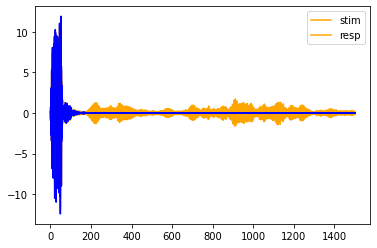

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
eyedee = str(1)  # ID OF THE EXPERIMENT.
o_dim = int(5)   # THE INTERESTED OUTPUTS DIMENSIONALITY
num_blocks_start = int(0)
num_blocks_end   = int(1)
lambda_          = float(0.1)
mid_shape        = int(9)
# D                = [0,0.05,0.02]
dropout    = 0.05
learning_rate = 1e-3
epoch_num  = 20
batch_size = 2048
reg_par    = 1e-4
# o_dim      = 1
use_all_singular_values = False
best_only  = True
print(f"eyedee    : {eyedee}")
print(f"best_only : {best_only}")
print(f"epoch_num : {epoch_num}")
print(f"dropout   : {dropout}")
device = torch.device('cuda')
torch.cuda.empty_cache()
# CREATING A FOLDER TO STORE THE RESULTS
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/music2_"
path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}/"
i = 1
while path.exists(path_name):
    path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
    i = i + 1
del i
os.mkdir(path_name)
print(path_name)

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

###############################################
## freqs
fmin = 3  # frecuencia mínima
fmax = 34 # frecuencia máxima
BW   = 2  # tamaño de ancho de banda
overlap = 0.25
step = BW*(1-overlap) # tamaño de traslape
freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
a = list()
b = list()
freqs_ = list()
N = 2 # Numero de orden del filtro
for fil in range(21):
    b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
    # b_, a_ = butter(N=N,Wn=Wn,btype='band')
    b.append(b_)
    a.append(a_)
freqs_.append([b,a])
###############################################

##################### SEED #####################
seed = np.ceil(np.random.rand(10)*100)
seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
print(seed)

###############################################
D = [0.05, 0.1, 0.2]
# D = [0.05, 0.2]
# CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
# COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
# lambda_       = 0.1
# MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
# IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
# mid_shape  = 60
speech_dmcca = True
if speech_dmcca:
    num_blocks = 10        # IF SPEECH DATA BY LIBERTO ET AL.

    # subs ARE THE SUBJECTS IDS TO WORK WITH
    subs = [5]       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
    subs = sorted(subs) # TO KEEP THEIR IDS SORTED
    n_subs = len(subs)

    str_subs = str(subs[0])
    for each_sub in subs[1:]: 
        str_subs += f"_{each_sub}"

    # num_blocks_start = 0
    # num_blocks_end   = 1
    # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
    # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

    tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
    val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
    tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
    val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

    print(f"n_subs     : {n_subs}")
    print(f"subs       : {subs}")
    print(f"D          : {D}")
    print(f"num_blocks : {num_blocks}")
    print(f"num_blocks_start: {num_blocks_start}")
    print(f"num_blocks_end  : {num_blocks_end}")
    print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

    for d_cnt, dropout in enumerate(D):
        for block in range(num_blocks_start, num_blocks_end):
            # THE DATA data_subs_pre IS LOADED SUCH THAT 
            # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
            # AND THE LAST LIST HAS STIMULUS
            # data_subs_pre IS A list OF SIZE N+1
            # EACH ELEMENT IS A list OF SIZE 3
            # SUCH THAT
            # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
            # AND
            # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
            data_subs_pre = load_dmcca_data3(subs, mid_shape, block)
            # DEEP MCCA
            print("DEEP MCCA + LCCA")
            dmlcs, dmdcs = dmcca_method(data_subs_pre, "speech", dropout, f"block_{block}_drpt_{dropout}",freqs_)
            tst_corrs[0, block, d_cnt] = dmlcs[0]
            tst_corrs[1, block, d_cnt] = dmdcs[0]
            print(tst_corrs)
            val_corrs[0, block, d_cnt] = dmlcs[1]
            val_corrs[1, block, d_cnt] = dmdcs[1]
            print(val_corrs)
            np.save(tst_corrs_name, tst_corrs)
            np.save(val_corrs_name, val_corrs)
            print('saved SPEECH')

# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

# prueba de envolvente con los trials de grupo 1

eyedee    : 1
best_only : True
epoch_num : 20
dropout   : 0.05
/content/drive/Shareddrives/GCPDS/databases/Databases_musica/music2_dmcca_1_0_1_0.1_8_0.05_1/
[93.]
n_subs     : 1
subs       : [5]
D          : [0.05, 0.02, 0.2]
num_blocks : 20
num_blocks_start: 0
num_blocks_end  : 1
num_blocks_net  : 1
block: 0
Data INITIALIZING for block : 0
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     93.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.3162277824124374 - 0.6249906067120827 = 0.2537287771701813
  Validation corr LOSS : 0.3162
0.3162277936935425 - 0.34187063574790955 = 0.28204071521759033
torch.Size([1501, 27])
  Test corr LOSS       : 0.3162
0.3162277936935425 - 0.15285290777683258 = 0.3009425103664398
  val. loss is : -0.2820 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training corr LOSS   : 0.3162
0.31622778089706505 - 0.6248990448854738 = 0.2537378966808319
  Validation corr LOSS : 0.3162
0.

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.966994506831047
CCA Model Ended.
LCCA is : [array(0.96699451), array(0.93987126)]
DMDC corrs are : [0.96699451]
DMCCA + DCCA : block_0_drpt_0.05
DCCA for block_0_drpt_0.05_sub_0
seed:     93.0
EPOCH : 0
  Training CORRELATION   : -0.0201
  Validation CORRELATION : 0.0215
  Test CORRELATION       : -0.0369
  val. loss is : -0.0215 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0207
  Validation CORRELATION : 0.0333
  Test CORRELATION       : 0.0018
  val. loss is : -0.0333 & the min. loss is : -0.0215
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : nan
  Validation CORRELATION : 0.0072
  Test CORRELATION       : nan
  val. loss is : -0.0072 & the min. loss is : -0.0333
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0060
  Validation CORRELATION : -0.0036
  Test 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00266181, dtype=float32), array(-0.00266181, dtype=float32)]
DMDC corrs are : [-0.00266181]
DONE speech - block_0_drpt_0.05.
[[[[ 0.96699451]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9726735532944454
CCA Model Ended.
LCCA is : [array(0.97267355), array(0.92750587)]
DMDC corrs are : [0.97267355]
DMCCA + DCCA : block_0_drpt_0.02
DCCA for block_0_drpt_0.02_sub_0
seed:     93.0
EPOCH : 0
  Training CORRELATION   : -0.0233
  Validation CORRELATION : -0.0111
  Test CORRELATION       : 0.0076
  val. loss is : 0.0111 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0035
  Validation CORRELATION : 0.0105
  Test CORRELATION       : 0.0048
  val. loss is : -0.0105 & the min. loss is : 0.0111
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0011
  Validation CORRELATION : 0.0163
  Test CORRELATION       : 0.0029
  val. loss is : -0.0163 & the min. loss is : -0.0105
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0144
  Validation CORRELATION : -0.0032
  Tes

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00854453, dtype=float32), array(0.00854453, dtype=float32)]
DMDC corrs are : [0.00854453]
DONE speech - block_0_drpt_0.02.
[[[[ 0.96699451]
   [ 0.97267355]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.   

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.8375959640869322
CCA Model Ended.
LCCA is : [array(0.83759596), array(0.8298515)]
DMDC corrs are : [0.83759596]
DMCCA + DCCA : block_0_drpt_0.2
DCCA for block_0_drpt_0.2_sub_0
seed:     93.0
EPOCH : 0
  Training CORRELATION   : 0.0153
  Validation CORRELATION : 0.0149
  Test CORRELATION       : 0.0193
  val. loss is : -0.0149 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0102
  Validation CORRELATION : -0.0324
  Test CORRELATION       : 0.0453
  val. loss is : 0.0324 & the min. loss is : -0.0149
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0036
  Validation CORRELATION : 0.0159
  Test CORRELATION       : 0.0121
  val. loss is : -0.0159 & the min. loss is : -0.0149
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0084
  Validation CORRELATION : 0.0274
  Test 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.0376744, dtype=float32), array(-0.0376744, dtype=float32)]
DMDC corrs are : [-0.0376744]
DONE speech - block_0_drpt_0.2.
[[[[ 0.96699451]
   [ 0.97267355]
   [ 0.83759596]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.    

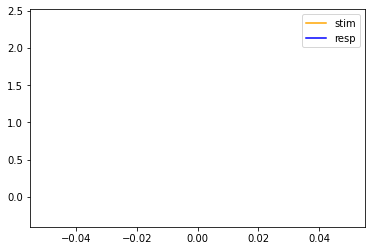

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
eyedee = str(1)  # ID OF THE EXPERIMENT.
o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
num_blocks_start = int(0)
num_blocks_end   = int(1)
lambda_          = float(0.1)
mid_shape        = int(8)
D                = [0.05,0.02,0.2]
dropout    = 0.05
learning_rate = 1e-3
epoch_num  = 20
batch_size = 2048
reg_par    = 1e-4
# o_dim      = 1
use_all_singular_values = False
best_only  = True
print(f"eyedee    : {eyedee}")
print(f"best_only : {best_only}")
print(f"epoch_num : {epoch_num}")
print(f"dropout   : {dropout}")
device = torch.device('cuda')
torch.cuda.empty_cache()
# CREATING A FOLDER TO STORE THE RESULTS
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/music2_"
path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}/"
i = 1
while path.exists(path_name):
    path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
    i = i + 1
del i
os.mkdir(path_name)
print(path_name)

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

###############################################
## freqs
fmin = 3  # frecuencia mínima
fmax = 34 # frecuencia máxima
BW   = 2  # tamaño de ancho de banda
overlap = 0.25
step = BW*(1-overlap) # tamaño de traslape
freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
a = list()
b = list()
freqs_ = list()
N = 2 # Numero de orden del filtro
for fil in range(21):
    b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
    # b_, a_ = butter(N=N,Wn=Wn,btype='band')
    b.append(b_)
    a.append(a_)
freqs_.append([b,a])
###############################################

##################### SEED #####################
seed = np.ceil(np.random.rand(10)*100)
seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
print(seed)

###############################################
# D = [0, 0.05, 0.1, 0.2]
# D = [0.05, 0.2]
# CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
# COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
# lambda_       = 0.1
# MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
# IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
# mid_shape  = 60
speech_dmcca = True
if speech_dmcca:
    num_blocks = 20        # IF SPEECH DATA BY LIBERTO ET AL.

    # subs ARE THE SUBJECTS IDS TO WORK WITH
    subs = [5]       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
    subs = sorted(subs) # TO KEEP THEIR IDS SORTED
    n_subs = len(subs)

    str_subs = str(subs[0])
    for each_sub in subs[1:]: 
        str_subs += f"_{each_sub}"

    # num_blocks_start = 0
    # num_blocks_end   = 1
    # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
    # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

    tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
    val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
    tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
    val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

    print(f"n_subs     : {n_subs}")
    print(f"subs       : {subs}")
    print(f"D          : {D}")
    print(f"num_blocks : {num_blocks}")
    print(f"num_blocks_start: {num_blocks_start}")
    print(f"num_blocks_end  : {num_blocks_end}")
    print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

    for d_cnt, dropout in enumerate(D):
        for block in range(num_blocks_start, num_blocks_end):
            # THE DATA data_subs_pre IS LOADED SUCH THAT 
            # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
            # AND THE LAST LIST HAS STIMULUS
            # data_subs_pre IS A list OF SIZE N+1
            # EACH ELEMENT IS A list OF SIZE 3
            # SUCH THAT
            # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
            # AND
            # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
            data_subs_pre = load_dmcca_data3(subs, mid_shape, block)
            # DEEP MCCA
            print("DEEP MCCA + LCCA")
            dmlcs, dmdcs = dmcca_method(data_subs_pre, "speech", dropout, f"block_{block}_drpt_{dropout}",freqs_)
            tst_corrs[0, block, d_cnt] = dmlcs[0]
            tst_corrs[1, block, d_cnt] = dmdcs[0]
            print(tst_corrs)
            val_corrs[0, block, d_cnt] = dmlcs[1]
            val_corrs[1, block, d_cnt] = dmdcs[1]
            print(val_corrs)
            np.save(tst_corrs_name, tst_corrs)
            np.save(val_corrs_name, val_corrs)
            print('saved SPEECH')

# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

# prueba de grupo 1 con envolvente

eyedee    : 1
best_only : True
epoch_num : 20
dropout   : 0.05
/content/drive/Shareddrives/GCPDS/databases/Databases_musica/music2_dmcca_1_0_2_0.1_8_0.05_1/
[17.]
n_subs     : 1
subs       : [5]
D          : [0.05, 0.02, 0.2]
num_blocks : 2
num_blocks_start: 0
num_blocks_end  : 2
num_blocks_net  : 2
block: 0
Data INITIALIZING for block : 0
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     17.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.3162277847696832 - 0.6249865748114505 = 0.2537292242050171
  Validation corr LOSS : 0.3162
0.3162277638912201 - 0.34566399455070496 = 0.28166136145591736
torch.Size([1501, 27])
  Test corr LOSS       : 0.3162
0.3162277638912201 - 0.1545804888010025 = 0.30076971650123596
  val. loss is : -0.2817 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training corr LOSS   : 0.3162
0.31622777752957104 - 0.6250704324851601 = 0.253720760345459
  Validation corr LOSS : 0.3162
0.31

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9256091426335538
CCA Model Ended.
LCCA is : [array(0.92560914), array(0.86557349)]
DMDC corrs are : [0.92560914]
DMCCA + DCCA : block_0_drpt_0.05
DCCA for block_0_drpt_0.05_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0104
  Validation CORRELATION : 0.0157
  Test CORRELATION       : -0.0710
  val. loss is : -0.0157 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0057
  Validation CORRELATION : -0.0103
  Test CORRELATION       : 0.0279
  val. loss is : 0.0103 & the min. loss is : -0.0157
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0106
  Validation CORRELATION : 0.0179
  Test CORRELATION       : -0.0667
  val. loss is : -0.0179 & the min. loss is : -0.0157
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0100
  Validation CORRELATION : -0.0195


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.06855629, dtype=float32), array(-0.06855629, dtype=float32)]
DMDC corrs are : [-0.06855629]
DONE speech - block_0_drpt_0.05.
[[[[ 0.92560914]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]]


 [[[-0.06855629]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]]]
[[[[ 0.86557349]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]]


 [[[-0.06855629]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]
   [ 0.        ]]]]
saved SPEECH
block: 1
Data INITIALIZING for block : 1
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     17.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.3162277847696832 - 0.6249865748114505 = 0.2537292242050171
  Validation corr LOSS : 0.3162
0.3162277638912201 - 0.1545804888010025 = 0.30076971650123596
torch.Size([1448, 27])
  Test corr LOSS       : 0.3162
0.3162277638912201 - 0.34566399455070496 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9163271701407067
CCA Model Ended.
LCCA is : [array(0.91632717), array(0.88179903)]
DMDC corrs are : [0.91632717]
DMCCA + DCCA : block_1_drpt_0.05
DCCA for block_1_drpt_0.05_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0104
  Validation CORRELATION : -0.0710
  Test CORRELATION       : 0.0157
  val. loss is : 0.0710 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0057
  Validation CORRELATION : 0.0279
  Test CORRELATION       : -0.0103
  val. loss is : -0.0279 & the min. loss is : 0.0710
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0028
  Validation CORRELATION : 0.0154
  Test CORRELATION       : -0.0096
  val. loss is : -0.0154 & the min. loss is : -0.0279
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0037
  Validation CORRELATION : -0.0135

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00238197, dtype=float32), array(-0.00238197, dtype=float32)]
DMDC corrs are : [-0.00238197]
DONE speech - block_1_drpt_0.05.
[[[[ 0.92560914]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.91632717]
   [ 0.        ]
   [ 0.        ]]]


 [[[-0.06855629]
   [ 0.        ]
   [ 0.        ]]

  [[-0.00238197]
   [ 0.        ]
   [ 0.        ]]]]
[[[[ 0.86557349]
   [ 0.        ]
   [ 0.        ]]

  [[ 0.88179903]
   [ 0.        ]
   [ 0.        ]]]


 [[[-0.06855629]
   [ 0.        ]
   [ 0.        ]]

  [[-0.00238197]
   [ 0.        ]
   [ 0.        ]]]]
saved SPEECH
block: 0
Data INITIALIZING for block : 0
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     17.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.3162277842645591 - 0.6249664856889153 = 0.2537311017513275
  Validation corr LOSS : 0.3162
0.3162277936935425 - 0.3463001251220703 = 0.2815977931022644
torch.Size([1501, 27])
  Test corr LOSS       : 0.3162
0.3162277638912201 - 0.1548728346824646 = 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9635374647361615
CCA Model Ended.
LCCA is : [array(0.96353746), array(0.90584173)]
DMDC corrs are : [0.96353746]
DMCCA + DCCA : block_0_drpt_0.02
DCCA for block_0_drpt_0.02_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0271
  Validation CORRELATION : 0.0129
  Test CORRELATION       : -0.0151
  val. loss is : -0.0129 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0172
  Validation CORRELATION : -0.0096
  Test CORRELATION       : 0.0121
  val. loss is : 0.0096 & the min. loss is : -0.0129
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0047
  Validation CORRELATION : -0.0060
  Test CORRELATION       : 0.0096
  val. loss is : 0.0060 & the min. loss is : -0.0129
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : nan
  Validation CORRELATION : 0.0000


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.01882264, dtype=float32), array(-0.01882264, dtype=float32)]
DMDC corrs are : [-0.01882264]
DONE speech - block_0_drpt_0.02.
[[[[ 0.92560914]
   [ 0.96353746]
   [ 0.        ]]

  [[ 0.91632717]
   [ 0.        ]
   [ 0.        ]]]


 [[[-0.06855629]
   [-0.01882264]
   [ 0.        ]]

  [[-0.00238197]
   [ 0.        ]
   [ 0.        ]]]]
[[[[ 0.86557349]
   [ 0.90584173]
   [ 0.        ]]

  [[ 0.88179903]
   [ 0.        ]
   [ 0.        ]]]


 [[[-0.06855629]
   [-0.01882264]
   [ 0.        ]]

  [[-0.00238197]
   [ 0.        ]
   [ 0.        ]]]]
saved SPEECH
block: 1
Data INITIALIZING for block : 1
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     17.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.3162277842645591 - 0.6249664856889153 = 0.2537311017513275
  Validation corr LOSS : 0.3162
0.3162277638912201 - 0.1548728346824646 = 0.30074048042297363
torch.Size([1448, 27])
  Test corr LOSS       : 0.3162
0.3162277936935425 - 0.3463001251220703 =

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9599121938550081
CCA Model Ended.
LCCA is : [array(0.95991219), array(0.9038063)]
DMDC corrs are : [0.95991219]
DMCCA + DCCA : block_1_drpt_0.02
DCCA for block_1_drpt_0.02_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0271
  Validation CORRELATION : -0.0151
  Test CORRELATION       : 0.0129
  val. loss is : 0.0151 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0172
  Validation CORRELATION : 0.0121
  Test CORRELATION       : -0.0096
  val. loss is : -0.0121 & the min. loss is : 0.0151
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0011
  Validation CORRELATION : 0.0031
  Test CORRELATION       : 0.0009
  val. loss is : -0.0031 & the min. loss is : -0.0121
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0036
  Validation CORRELATION : 0.0027
  T

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00076538, dtype=float32), array(-0.00076538, dtype=float32)]
DMDC corrs are : [-0.00076538]
DONE speech - block_1_drpt_0.02.
[[[[ 9.25609143e-01]
   [ 9.63537465e-01]
   [ 0.00000000e+00]]

  [[ 9.16327170e-01]
   [ 9.59912194e-01]
   [ 0.00000000e+00]]]


 [[[-6.85562864e-02]
   [-1.88226402e-02]
   [ 0.00000000e+00]]

  [[-2.38197343e-03]
   [-7.65379053e-04]
   [ 0.00000000e+00]]]]
[[[[ 8.65573488e-01]
   [ 9.05841734e-01]
   [ 0.00000000e+00]]

  [[ 8.81799029e-01]
   [ 9.03806300e-01]
   [ 0.00000000e+00]]]


 [[[-6.85562864e-02]
   [-1.88226402e-02]
   [ 0.00000000e+00]]

  [[-2.38197343e-03]
   [-7.65379053e-04]
   [ 0.00000000e+00]]]]
saved SPEECH
block: 0
Data INITIALIZING for block : 0
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     17.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.31622778039194094 - 0.6250346387173497 = 0.2537243366241455
  Validation corr LOSS : 0.3162
0.3162277638912201 - 0.34273549914360046 = 0.2819542288780212

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.8901216759051146
CCA Model Ended.
LCCA is : [array(0.89012168), array(0.83566722)]
DMDC corrs are : [0.89012168]
DMCCA + DCCA : block_0_drpt_0.2
DCCA for block_0_drpt_0.2_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0095
  Validation CORRELATION : 0.0069
  Test CORRELATION       : 0.0156
  val. loss is : -0.0069 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0067
  Validation CORRELATION : -0.0063
  Test CORRELATION       : -0.0005
  val. loss is : 0.0063 & the min. loss is : -0.0069
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0179
  Validation CORRELATION : 0.0261
  Test CORRELATION       : -0.0794
  val. loss is : -0.0261 & the min. loss is : -0.0069
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0040
  Validation CORRELATION : 0.0400
  T

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.03107312, dtype=float32), array(0.03107312, dtype=float32)]
DMDC corrs are : [0.03107312]
DONE speech - block_0_drpt_0.2.
[[[[ 9.25609143e-01]
   [ 9.63537465e-01]
   [ 8.90121676e-01]]

  [[ 9.16327170e-01]
   [ 9.59912194e-01]
   [ 0.00000000e+00]]]


 [[[-6.85562864e-02]
   [-1.88226402e-02]
   [ 3.10731158e-02]]

  [[-2.38197343e-03]
   [-7.65379053e-04]
   [ 0.00000000e+00]]]]
[[[[ 8.65573488e-01]
   [ 9.05841734e-01]
   [ 8.35667219e-01]]

  [[ 8.81799029e-01]
   [ 9.03806300e-01]
   [ 0.00000000e+00]]]


 [[[-6.85562864e-02]
   [-1.88226402e-02]
   [ 3.10731158e-02]]

  [[-2.38197343e-03]
   [-7.65379053e-04]
   [ 0.00000000e+00]]]]
saved SPEECH
block: 1
Data INITIALIZING for block : 1
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     17.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.31622778039194094 - 0.6250346387173497 = 0.2537243366241455
  Validation corr LOSS : 0.3162
0.3162277936935425 - 0.1532420516014099 = 0.3009035885334015
torc

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.8828787267660055
CCA Model Ended.
LCCA is : [array(0.88287873), array(0.84284491)]
DMDC corrs are : [0.88287873]
DMCCA + DCCA : block_1_drpt_0.2
DCCA for block_1_drpt_0.2_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0095
  Validation CORRELATION : 0.0156
  Test CORRELATION       : 0.0069
  val. loss is : -0.0156 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0067
  Validation CORRELATION : -0.0005
  Test CORRELATION       : -0.0063
  val. loss is : 0.0005 & the min. loss is : -0.0156
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0179
  Validation CORRELATION : -0.0794
  Test CORRELATION       : 0.0261
  val. loss is : 0.0794 & the min. loss is : -0.0156
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0104
  Validation CORRELATION : -0.0689

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.02788809, dtype=float32), array(0.02788809, dtype=float32)]
DMDC corrs are : [0.02788809]
DONE speech - block_1_drpt_0.2.
[[[[ 9.25609143e-01]
   [ 9.63537465e-01]
   [ 8.90121676e-01]]

  [[ 9.16327170e-01]
   [ 9.59912194e-01]
   [ 8.82878727e-01]]]


 [[[-6.85562864e-02]
   [-1.88226402e-02]
   [ 3.10731158e-02]]

  [[-2.38197343e-03]
   [-7.65379053e-04]
   [ 2.78880857e-02]]]]
[[[[ 8.65573488e-01]
   [ 9.05841734e-01]
   [ 8.35667219e-01]]

  [[ 8.81799029e-01]
   [ 9.03806300e-01]
   [ 8.42844915e-01]]]


 [[[-6.85562864e-02]
   [-1.88226402e-02]
   [ 3.10731158e-02]]

  [[-2.38197343e-03]
   [-7.65379053e-04]
   [ 2.78880857e-02]]]]
saved SPEECH


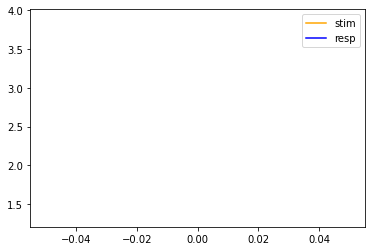

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
eyedee = str(1)  # ID OF THE EXPERIMENT.
o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
num_blocks_start = int(0)
num_blocks_end   = int(2)
lambda_          = float(0.1)
mid_shape        = int(8)
D                = [0.05,0.02,0.2]
dropout    = 0.05
learning_rate = 1e-3
epoch_num  = 20
batch_size = 2048
reg_par    = 1e-4
# o_dim      = 1
use_all_singular_values = False
best_only  = True
print(f"eyedee    : {eyedee}")
print(f"best_only : {best_only}")
print(f"epoch_num : {epoch_num}")
print(f"dropout   : {dropout}")
device = torch.device('cuda')
torch.cuda.empty_cache()
# CREATING A FOLDER TO STORE THE RESULTS
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/music2_"
path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}/"
i = 1
while path.exists(path_name):
    path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
    i = i + 1
del i
os.mkdir(path_name)
print(path_name)

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

###############################################
## freqs
fmin = 3  # frecuencia mínima
fmax = 34 # frecuencia máxima
BW   = 2  # tamaño de ancho de banda
overlap = 0.25
step = BW*(1-overlap) # tamaño de traslape
freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
a = list()
b = list()
freqs_ = list()
N = 2 # Numero de orden del filtro
for fil in range(21):
    b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
    # b_, a_ = butter(N=N,Wn=Wn,btype='band')
    b.append(b_)
    a.append(a_)
freqs_.append([b,a])
###############################################

##################### SEED #####################
seed = np.ceil(np.random.rand(10)*100)
seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
print(seed)

###############################################
# D = [0, 0.05, 0.1, 0.2]
# D = [0.05, 0.2]
# CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
# COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
# lambda_       = 0.1
# MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
# IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
# mid_shape  = 60
speech_dmcca = True
if speech_dmcca:
    num_blocks = 2        # IF SPEECH DATA BY LIBERTO ET AL.

    # subs ARE THE SUBJECTS IDS TO WORK WITH
    subs = [5]       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
    subs = sorted(subs) # TO KEEP THEIR IDS SORTED
    n_subs = len(subs)

    str_subs = str(subs[0])
    for each_sub in subs[1:]: 
        str_subs += f"_{each_sub}"

    # num_blocks_start = 0
    # num_blocks_end   = 1
    # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
    # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

    tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
    val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
    tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
    val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

    print(f"n_subs     : {n_subs}")
    print(f"subs       : {subs}")
    print(f"D          : {D}")
    print(f"num_blocks : {num_blocks}")
    print(f"num_blocks_start: {num_blocks_start}")
    print(f"num_blocks_end  : {num_blocks_end}")
    print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

    for d_cnt, dropout in enumerate(D):
        for block in range(num_blocks_start, num_blocks_end):
            # THE DATA data_subs_pre IS LOADED SUCH THAT 
            # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
            # AND THE LAST LIST HAS STIMULUS
            # data_subs_pre IS A list OF SIZE N+1
            # EACH ELEMENT IS A list OF SIZE 3
            # SUCH THAT
            # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
            # AND
            # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
            data_subs_pre = load_dmcca_data3(subs, mid_shape, block)
            # DEEP MCCA
            print("DEEP MCCA + LCCA")
            dmlcs, dmdcs = dmcca_method(data_subs_pre, "speech", dropout, f"block_{block}_drpt_{dropout}",freqs_)
            tst_corrs[0, block, d_cnt] = dmlcs[0]
            tst_corrs[1, block, d_cnt] = dmdcs[0]
            print(tst_corrs)
            val_corrs[0, block, d_cnt] = dmlcs[1]
            val_corrs[1, block, d_cnt] = dmdcs[1]
            print(val_corrs)
            np.save(tst_corrs_name, tst_corrs)
            np.save(val_corrs_name, val_corrs)
            print('saved SPEECH')

# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

In [ ]:
print(tst_corrs)

[[[[9.70127298e-01]
   [9.31354274e-01]
   [7.91402503e-01]]]


 [[[4.28949716e-03]
   [5.62073197e-04]
   [1.90229819e-03]]]]


# Prueba de grupo 1 con RMS

eyedee    : 2
best_only : True
epoch_num : 20
dropout   : 0.05
/content/drive/Shareddrives/GCPDS/databases/Databases_musica/music2_dmcca_2_0_1_0.1_8_0.05_12/
[89.]
n_subs     : 1
subs       : [5]
D          : [0.05, 0.02, 0.2]
num_blocks : 1
num_blocks_start: 0
num_blocks_end  : 1
num_blocks_net  : 1
block: 0
Data INITIALIZING for block : 0
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     89.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.3162277828244602 - 0.17275429350488325 = 0.2989523410797119
  Validation corr LOSS : 0.3162
0.3162277638912201 - 0.12715965509414673 = 0.3035117983818054
torch.Size([786, 27])
  Test corr LOSS       : 0.3162
0.3162277638912201 - 0.12715965509414673 = 0.3035117983818054
  val. loss is : -0.3035 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training corr LOSS   : 0.3162
0.31622778317507577 - 0.17281441443106707 = 0.2989463210105896
  Validation corr LOSS : 0.3162
0.

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.794822656408974
CCA Model Ended.
LCCA is : [array(0.79482266), array(0.71850363)]
DMDC corrs are : [0.79482266]
DMCCA + DCCA : block_0_drpt_0.05
DCCA for block_0_drpt_0.05_sub_0
seed:     89.0
EPOCH : 0
  Training CORRELATION   : 0.0123
  Validation CORRELATION : -0.0076
  Test CORRELATION       : -0.0076
  val. loss is : 0.0076 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0082
  Validation CORRELATION : -0.0536
  Test CORRELATION       : -0.0536
  val. loss is : 0.0536 & the min. loss is : 0.0076
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0093
  Validation CORRELATION : 0.0460
  Test CORRELATION       : 0.0460
  val. loss is : -0.0460 & the min. loss is : 0.0076
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0077
  Validation CORRELATION : -0.0675
  Te

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.07002074, dtype=float32), array(0.07002074, dtype=float32)]
DMDC corrs are : [0.07002074]
DONE speech - block_0_drpt_0.05.
[[[[0.79482266]
   [0.        ]
   [0.        ]]]


 [[[0.07002074]
   [0.        ]
   [0.        ]]]]
[[[[0.71850363]
   [0.        ]
   [0.        ]]]


 [[[0.07002074]
   [0.        ]
   [0.        ]]]]
saved SPEECH
block: 0
Data INITIALIZING for block : 0
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     89.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.31622778422692244 - 0.17274749471860773 = 0.29895299673080444
  Validation corr LOSS : 0.3162
0.3162277638912201 - 0.12713634967803955 = 0.30351412296295166
torch.Size([786, 27])
  Test corr LOSS       : 0.3162
0.3162277638912201 - 0.12713634967803955 = 0.30351412296295166
  val. loss is : -0.3035 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training corr LOSS   : 0.3162
0.3162277786170735 - 0.17281611281

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.7809685652095086
CCA Model Ended.
LCCA is : [array(0.78096857), array(0.69736953)]
DMDC corrs are : [0.78096857]
DMCCA + DCCA : block_0_drpt_0.02
DCCA for block_0_drpt_0.02_sub_0
seed:     89.0
EPOCH : 0
  Training CORRELATION   : -0.0009
  Validation CORRELATION : -0.0288
  Test CORRELATION       : -0.0288
  val. loss is : 0.0288 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0075
  Validation CORRELATION : 0.0229
  Test CORRELATION       : 0.0229
  val. loss is : -0.0229 & the min. loss is : 0.0288
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0130
  Validation CORRELATION : -0.0636
  Test CORRELATION       : -0.0636
  val. loss is : 0.0636 & the min. loss is : -0.0229
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0150
  Validation CORRELATION : -0.0346


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.08332019, dtype=float32), array(0.08332019, dtype=float32)]
DMDC corrs are : [0.08332019]
DONE speech - block_0_drpt_0.02.
[[[[0.79482266]
   [0.78096857]
   [0.        ]]]


 [[[0.07002074]
   [0.08332019]
   [0.        ]]]]
[[[[0.71850363]
   [0.69736953]
   [0.        ]]]


 [[[0.07002074]
   [0.08332019]
   [0.        ]]]]
saved SPEECH
block: 0
Data INITIALIZING for block : 0
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     89.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.3162277800195357 - 0.17276893766487347 = 0.2989508807659149
  Validation corr LOSS : 0.3162
0.3162277638912201 - 0.1272754967212677 = 0.3035002052783966
torch.Size([786, 27])
  Test corr LOSS       : 0.3162
0.3162277638912201 - 0.1272754967212677 = 0.3035002052783966
  val. loss is : -0.3035 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training corr LOSS   : 0.3162
0.3162277817726135 - 0.1728171581731123 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.8341842607136983
CCA Model Ended.
LCCA is : [array(0.83418426), array(0.76655782)]
DMDC corrs are : [0.83418426]
DMCCA + DCCA : block_0_drpt_0.2
DCCA for block_0_drpt_0.2_sub_0
seed:     89.0
EPOCH : 0
  Training CORRELATION   : 0.0023
  Validation CORRELATION : 0.0033
  Test CORRELATION       : 0.0033
  val. loss is : -0.0033 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0112
  Validation CORRELATION : 0.0487
  Test CORRELATION       : 0.0487
  val. loss is : -0.0487 & the min. loss is : -0.0033
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0113
  Validation CORRELATION : 0.0246
  Test CORRELATION       : 0.0246
  val. loss is : -0.0246 & the min. loss is : -0.0487
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0120
  Validation CORRELATION : 0.0028
  Test

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.06621514, dtype=float32), array(0.06621514, dtype=float32)]
DMDC corrs are : [0.06621514]
DONE speech - block_0_drpt_0.2.
[[[[0.79482266]
   [0.78096857]
   [0.83418426]]]


 [[[0.07002074]
   [0.08332019]
   [0.06621514]]]]
[[[[0.71850363]
   [0.69736953]
   [0.76655782]]]


 [[[0.07002074]
   [0.08332019]
   [0.06621514]]]]
saved SPEECH


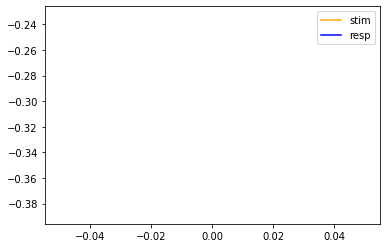

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
eyedee = str(2)  # ID OF THE EXPERIMENT.
o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
num_blocks_start = int(0)
num_blocks_end   = int(1)
lambda_          = float(0.1)
mid_shape        = int(8)
D                = [0.05,0.02,0.2]
dropout    = 0.05
learning_rate = 1e-3
epoch_num  = 20
batch_size = 2048
reg_par    = 1e-4
# o_dim      = 1
use_all_singular_values = False
best_only  = True
print(f"eyedee    : {eyedee}")
print(f"best_only : {best_only}")
print(f"epoch_num : {epoch_num}")
print(f"dropout   : {dropout}")
device = torch.device('cuda')
torch.cuda.empty_cache()
# CREATING A FOLDER TO STORE THE RESULTS
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/music2_"
path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}/"
i = 1
while path.exists(path_name):
    path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
    i = i + 1
del i
os.mkdir(path_name)
print(path_name)

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

###############################################
## freqs
fmin = 3  # frecuencia mínima
fmax = 34 # frecuencia máxima
BW   = 2  # tamaño de ancho de banda
overlap = 0.25
step = BW*(1-overlap) # tamaño de traslape
freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
a = list()
b = list()
freqs_ = list()
N = 2 # Numero de orden del filtro
for fil in range(21):
    b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
    # b_, a_ = butter(N=N,Wn=Wn,btype='band')
    b.append(b_)
    a.append(a_)
freqs_.append([b,a])
###############################################

##################### SEED #####################
seed = np.ceil(np.random.rand(10)*100)
seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
print(seed)

###############################################
# D = [0, 0.05, 0.1, 0.2]
# D = [0.05, 0.2]
# CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
# COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
# lambda_       = 0.1
# MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
# IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
# mid_shape  = 60
speech_dmcca = True
if speech_dmcca:
    num_blocks = 1        # IF SPEECH DATA BY LIBERTO ET AL.

    # subs ARE THE SUBJECTS IDS TO WORK WITH
    subs = [5]       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
    subs = sorted(subs) # TO KEEP THEIR IDS SORTED
    n_subs = len(subs)

    str_subs = str(subs[0])
    for each_sub in subs[1:]: 
        str_subs += f"_{each_sub}"

    # num_blocks_start = 0
    # num_blocks_end   = 1
    # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
    # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

    tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
    val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
    tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
    val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

    print(f"n_subs     : {n_subs}")
    print(f"subs       : {subs}")
    print(f"D          : {D}")
    print(f"num_blocks : {num_blocks}")
    print(f"num_blocks_start: {num_blocks_start}")
    print(f"num_blocks_end  : {num_blocks_end}")
    print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

    for d_cnt, dropout in enumerate(D):
        for block in range(num_blocks_start, num_blocks_end):
            # THE DATA data_subs_pre IS LOADED SUCH THAT 
            # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
            # AND THE LAST LIST HAS STIMULUS
            # data_subs_pre IS A list OF SIZE N+1
            # EACH ELEMENT IS A list OF SIZE 3
            # SUCH THAT
            # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
            # AND
            # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
            data_subs_pre = load_dmcca_data4(subs, mid_shape, block)
            # DEEP MCCA
            print("DEEP MCCA + LCCA")
            dmlcs, dmdcs = dmcca_method(data_subs_pre, "speech", dropout, f"block_{block}_drpt_{dropout}",freqs_)
            tst_corrs[0, block, d_cnt] = dmlcs[0]
            tst_corrs[1, block, d_cnt] = dmdcs[0]
            print(tst_corrs)
            val_corrs[0, block, d_cnt] = dmlcs[1]
            val_corrs[1, block, d_cnt] = dmdcs[1]
            print(val_corrs)
            np.save(tst_corrs_name, tst_corrs)
            np.save(val_corrs_name, val_corrs)
            print('saved SPEECH')

# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

# Prueba de grupo 1 con flujo espectral

eyedee    : 2
best_only : True
epoch_num : 20
dropout   : 0.05
/content/drive/Shareddrives/GCPDS/databases/Databases_musica/music2_dmcca_2_0_1_0.1_8_0.05_17/
[43.]
n_subs     : 1
subs       : [5]
D          : [0.05, 0.1, 0.2]
num_blocks : 1
num_blocks_start: 0
num_blocks_end  : 1
num_blocks_net  : 1
block: 0
Data INITIALIZING for block : 0
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     43.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.31622778072076685 - 311657.63272058824 = -31165.447265625
  Validation corr LOSS : 0.3162
0.3162277936935425 - 205757.59375 = -20575.443359375
torch.Size([785, 27])
  Test corr LOSS       : 0.3162
0.3162277936935425 - 205757.59375 = -20575.443359375
  val. loss is : 20575.4434 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training corr LOSS   : 0.3162
0.31622778247384464 - 300619.95735294116 = -30061.673828125
  Validation corr LOSS : 0.3162
0.3162277340888977 - 1

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.15954492360350817
CCA Model Ended.
LCCA is : [array(0.15954492), array(0.15054993)]
DMDC corrs are : [0.15954492]
DMCCA + DCCA : block_0_drpt_0.05
DCCA for block_0_drpt_0.05_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : nan
  Validation CORRELATION : nan
  Test CORRELATION       : nan
  val. loss is : nan & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : nan
  Validation CORRELATION : nan
  Test CORRELATION       : nan
  val. loss is : nan & the min. loss is : nan
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : nan
  Validation CORRELATION : nan
  Test CORRELATION       : nan
  val. loss is : nan & the min. loss is : nan
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : nan
  Validation CORRELATION : nan
  Test CORRELATION       : nan
  val. loss is : nan

/content/drive/Shareddrives/GCPDS/databases/Databases_musica/toolbox_deep/deep-cca-for-audio-EEG/cca_functions.py:229: RuntimeWarning: invalid value encountered in true_divide
  x = x / np.sqrt(var)
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(nan, dtype=float32), array(nan, dtype=float32)]
DMDC corrs are : [nan]
DONE speech - block_0_drpt_0.05.
[[[[0.15954492]
   [0.        ]
   [0.        ]]]


 [[[       nan]
   [0.        ]
   [0.        ]]]]
[[[[0.15054993]
   [0.        ]
   [0.        ]]]


 [[[       nan]
   [0.        ]
   [0.        ]]]]
saved SPEECH
block: 0
Data INITIALIZING for block : 0
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     43.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.3162277810713824 - 311669.1617647059 = -31166.599609375
  Validation corr LOSS : 0.3162
0.3162277936935425 - 205767.140625 = -20576.3984375
torch.Size([785, 27])
  Test corr LOSS       : 0.3162
0.3162277936935425 - 205767.140625 = -20576.3984375
  val. loss is : 20576.3984 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training corr LOSS   : 0.3162
0.3162277796689202 - 300628.2375 = -30062.51171875
  Validation corr LOSS : 0.3

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.03253667300974652
CCA Model Ended.
LCCA is : [array(0.03253667), array(0.01921197)]
DMDC corrs are : [0.03253667]
DMCCA + DCCA : block_0_drpt_0.1
DCCA for block_0_drpt_0.1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : nan
  Validation CORRELATION : 0.0000
  Test CORRELATION       : 0.0000
  val. loss is : -0.0000 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0057
  Validation CORRELATION : -0.0714
  Test CORRELATION       : -0.0714
  val. loss is : 0.0714 & the min. loss is : -0.0000
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : nan
  Validation CORRELATION : nan
  Test CORRELATION       : nan
  val. loss is : nan & the min. loss is : -0.0000
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0064
  Validation CORRELATION : -0.0906
  Test CORREL

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.09545118, dtype=float32), array(0.09545118, dtype=float32)]
DMDC corrs are : [0.09545118]
DONE speech - block_0_drpt_0.1.
[[[[0.15954492]
   [0.03253667]
   [0.        ]]]


 [[[       nan]
   [0.09545118]
   [0.        ]]]]
[[[[0.15054993]
   [0.01921197]
   [0.        ]]]


 [[[       nan]
   [0.09545118]
   [0.        ]]]]
saved SPEECH
block: 0
Data INITIALIZING for block : 0
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     43.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.3162277821232291 - 311680.94227941177 = -31167.78515625
  Validation corr LOSS : 0.3162
0.3162277936935425 - 205776.796875 = -20577.36328125
torch.Size([785, 27])
  Test corr LOSS       : 0.3162
0.3162277936935425 - 205776.796875 = -20577.36328125
  val. loss is : 20577.3633 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training corr LOSS   : 0.3162
0.3162277835256913 - 300649.06470588234 = -30064.5859375


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.213062174242681
CCA Model Ended.
LCCA is : [array(0.21306217), array(0.20339272)]
DMDC corrs are : [0.21306217]
DMCCA + DCCA : block_0_drpt_0.2
DCCA for block_0_drpt_0.2_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : nan
  Validation CORRELATION : nan
  Test CORRELATION       : nan
  val. loss is : nan & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0050
  Validation CORRELATION : nan
  Test CORRELATION       : nan
  val. loss is : nan & the min. loss is : nan
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0014
  Validation CORRELATION : -0.0171
  Test CORRELATION       : -0.0171
  val. loss is : 0.0171 & the min. loss is : nan
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : nan
  Validation CORRELATION : nan
  Test CORRELATION       : nan
  val.

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-3.9022707e-06, dtype=float32), array(-3.9022707e-06, dtype=float32)]
DMDC corrs are : [-3.90227069e-06]
DONE speech - block_0_drpt_0.2.
[[[[ 1.59544924e-01]
   [ 3.25366730e-02]
   [ 2.13062174e-01]]]


 [[[            nan]
   [ 9.54511836e-02]
   [-3.90227069e-06]]]]
[[[[ 1.50549934e-01]
   [ 1.92119666e-02]
   [ 2.03392718e-01]]]


 [[[            nan]
   [ 9.54511836e-02]
   [-3.90227069e-06]]]]
saved SPEECH


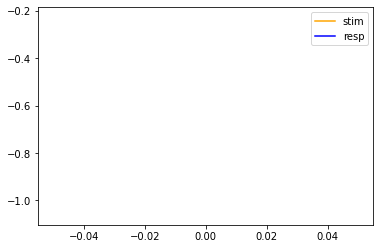

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
eyedee = str(2)  # ID OF THE EXPERIMENT.
o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
num_blocks_start = int(0)
num_blocks_end   = int(1)
lambda_          = float(0.1)
mid_shape        = int(8)
D                = [0.05,0.1,0.2]
dropout    = 0.05
learning_rate = 1e-3
epoch_num  = 20
batch_size = 2048
reg_par    = 1e-4
# o_dim      = 1
use_all_singular_values = False
best_only  = True
print(f"eyedee    : {eyedee}")
print(f"best_only : {best_only}")
print(f"epoch_num : {epoch_num}")
print(f"dropout   : {dropout}")
device = torch.device('cuda')
torch.cuda.empty_cache()
# CREATING A FOLDER TO STORE THE RESULTS
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/music2_"
path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}/"
i = 1
while path.exists(path_name):
    path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
    i = i + 1
del i
os.mkdir(path_name)
print(path_name)

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a

###############################################
## freqs
fmin = 3  # frecuencia mínima
fmax = 34 # frecuencia máxima
BW   = 2  # tamaño de ancho de banda
overlap = 0.25
step = BW*(1-overlap) # tamaño de traslape
freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
a = list()
b = list()
freqs_ = list()
N = 2 # Numero de orden del filtro
for fil in range(21):
    b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
    # b_, a_ = butter(N=N,Wn=Wn,btype='band')
    b.append(b_)
    a.append(a_)
freqs_.append([b,a])
###############################################

##################### SEED #####################
seed = np.ceil(np.random.rand(10)*100)
seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
print(seed)

###############################################
# D = [0, 0.05, 0.1, 0.2]
# D = [0.05, 0.2]
# CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
# COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
# lambda_       = 0.1
# MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
# IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
# mid_shape  = 60
speech_dmcca = True
if speech_dmcca:
    num_blocks = 1        # IF SPEECH DATA BY LIBERTO ET AL.

    # subs ARE THE SUBJECTS IDS TO WORK WITH
    subs = [5]       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
    subs = sorted(subs) # TO KEEP THEIR IDS SORTED
    n_subs = len(subs)

    str_subs = str(subs[0])
    for each_sub in subs[1:]: 
        str_subs += f"_{each_sub}"

    # num_blocks_start = 0
    # num_blocks_end   = 1
    # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
    # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

    tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
    val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
    tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
    val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

    print(f"n_subs     : {n_subs}")
    print(f"subs       : {subs}")
    print(f"D          : {D}")
    print(f"num_blocks : {num_blocks}")
    print(f"num_blocks_start: {num_blocks_start}")
    print(f"num_blocks_end  : {num_blocks_end}")
    print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

    for d_cnt, dropout in enumerate(D):
        for block in range(num_blocks_start, num_blocks_end):
            # THE DATA data_subs_pre IS LOADED SUCH THAT 
            # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
            # AND THE LAST LIST HAS STIMULUS
            # data_subs_pre IS A list OF SIZE N+1
            # EACH ELEMENT IS A list OF SIZE 3
            # SUCH THAT
            # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
            # AND
            # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
            data_subs_pre = load_dmcca_data5(subs, mid_shape, block)
            # DEEP MCCA
            print("DEEP MCCA + LCCA")
            dmlcs, dmdcs = dmcca_method(data_subs_pre, "speech", dropout, f"block_{block}_drpt_{dropout}",freqs_)
            tst_corrs[0, block, d_cnt] = dmlcs[0]
            tst_corrs[1, block, d_cnt] = dmdcs[0]
            print(tst_corrs)
            val_corrs[0, block, d_cnt] = dmlcs[1]
            val_corrs[1, block, d_cnt] = dmdcs[1]
            print(val_corrs)
            np.save(tst_corrs_name, tst_corrs)
            np.save(val_corrs_name, val_corrs)
            print('saved SPEECH')

# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

In [ ]:
lagGen??

# prueba on lo tres metodos en los 4 grupos

Método 1
eyedee    : 1
best_only : True
epoch_num : 20
dropout   : 0.05
/content/drive/Shareddrives/GCPDS/databases/Databases_musica/grupo_dmcca_1_0_1_0.1_8_0.05_1/
[45.]
Grupo 0
n_subs     : 1
subs       : [0]
D          : [0.05, 0.02]
num_blocks : 1
num_blocks_start: 0
num_blocks_end  : 1
num_blocks_net  : 1
block: 0
Data INITIALIZING for block : 0
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     45.0
Started training.


/content/drive/Shareddrives/GCPDS/databases/Databases_musica/toolbox_deep/deep-cca-for-audio-EEG/deep_losses.py:35: UserWarning: torch.symeig is deprecated in favor of torch.linalg.eigh and will be removed in a future PyTorch release.
The default behavior has changed from using the upper triangular portion of the matrix by default to using the lower triangular portion.
L, _ = torch.symeig(A, upper=upper)
should be replaced with
L = torch.linalg.eigvalsh(A, UPLO='U' if upper else 'L')
and
L, V = torch.symeig(A, eigenvectors=True)
should be replaced with
L, V = torch.linalg.eigh(A, UPLO='U' if upper else 'L') (Triggered internally at  /pytorch/aten/src/ATen/native/BatchLinearAlgebra.cpp:2500.)
  [D1, V1] = torch.symeig(SigmaHat11, eigenvectors=True)


EPOCH : 0
  Training corr LOSS   : 0.3162
0.3162277816306977 - 0.6281637994069902 = 0.2534113824367523
  Validation corr LOSS : 0.3162
0.3162277936935425 - 0.16905555129051208 = 0.299322247505188
torch.Size([961, 27])
  Test corr LOSS       : 0.3162
0.3162277936935425 - 0.16905555129051208 = 0.299322247505188
  val. loss is : -0.2993 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training corr LOSS   : 0.3162
0.31622778068459223 - 0.6280666173450531 = 0.2534211575984955
  Validation corr LOSS : 0.3162
0.3162277936935425 - 0.16359460353851318 = 0.2998683452606201
torch.Size([961, 27])
  Test corr LOSS       : 0.3162
0.3162277936935425 - 0.16359460353851318 = 0.2998683452606201
  val. loss is : -0.2999 & the min. loss is : -0.2993
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training corr LOSS   : 0.3162
0.3162277828133295 - 0.6280531097972204 = 0.25342249870300293
  Validation corr 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.98544711894353
CCA Model Ended.
LCCA is : [array(0.98544712), array(0.9361102)]
DMDC corrs are : [0.98544712]
DMCCA + DCCA : block_0_drpt_0.05
DCCA for block_0_drpt_0.05_sub_0
seed:     45.0
EPOCH : 0
  Training CORRELATION   : -0.0025
  Validation CORRELATION : -0.0277
  Test CORRELATION       : -0.0277
  val. loss is : 0.0277 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0120
  Validation CORRELATION : -0.0192
  Test CORRELATION       : -0.0192
  val. loss is : 0.0192 & the min. loss is : 0.0277
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0021
  Validation CORRELATION : 0.0310
  Test CORRELATION       : 0.0310
  val. loss is : -0.0310 & the min. loss is : 0.0192
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : nan
  Validation CORRELATION : nan
  Test CORRELATI

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.02457958, dtype=float32), array(0.02457958, dtype=float32)]
DMDC corrs are : [0.02457958]
DONE speech - block_0_drpt_0.05.
[[[[0.98544712]
   [0.        ]]]


 [[[0.02457958]
   [0.        ]]]]
[[[[0.9361102 ]
   [0.        ]]]


 [[[0.02457958]
   [0.        ]]]]
saved SPEECH
block: 0
Data INITIALIZING for block : 0
DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     45.0
Started training.
EPOCH : 0
  Training corr LOSS   : 0.3162
0.31622777855585493 - 0.6281299259927537 = 0.2534147799015045
  Validation corr LOSS : 0.3162
0.3162277936935425 - 0.16935142874717712 = 0.299292653799057
torch.Size([961, 27])
  Test corr LOSS       : 0.3162
0.3162277936935425 - 0.16935142874717712 = 0.299292653799057
  val. loss is : -0.2993 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training corr LOSS   : 0.3162
0.3162277825768032 - 0.6279910216255794 = 0.25342872738838196
  Validation corr LOSS : 0.3162
0.31622779

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9832812757238351
CCA Model Ended.
LCCA is : [array(0.98328128), array(0.93186051)]
DMDC corrs are : [0.98328128]
DMCCA + DCCA : block_0_drpt_0.02
DCCA for block_0_drpt_0.02_sub_0
seed:     45.0
EPOCH : 0
  Training CORRELATION   : -0.0039
  Validation CORRELATION : nan
  Test CORRELATION       : nan
  val. loss is : nan & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0024
  Validation CORRELATION : -0.0000
  Test CORRELATION       : -0.0000
  val. loss is : 0.0000 & the min. loss is : nan
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0003
  Validation CORRELATION : -0.0000
  Test CORRELATION       : -0.0000
  val. loss is : 0.0000 & the min. loss is : nan
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0063
  Validation CORRELATION : nan
  Test CORRELAT

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(2.1560118e-07, dtype=float32), array(2.1560118e-07, dtype=float32)]
DMDC corrs are : [2.15601176e-07]
DONE speech - block_0_drpt_0.02.
[[[[9.85447119e-01]
   [9.83281276e-01]]]


 [[[2.45795771e-02]
   [2.15601176e-07]]]]
[[[[9.36110200e-01]
   [9.31860513e-01]]]


 [[[2.45795771e-02]
   [2.15601176e-07]]]]
saved SPEECH
Grupo 1
n_subs     : 1
subs       : [1]
D          : [0.05, 0.02]
num_blocks : 1
num_blocks_start: 0
num_blocks_end  : 1
num_blocks_net  : 1
block: 0
Data INITIALIZING for block : 0
DEEP MCCA + LCCA
Started multiway DCCA.


ValueError: ignored

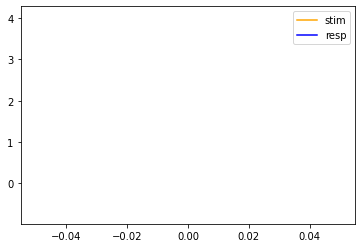

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
results = list()
for type in range(1,5):
  print("Método "+str(type))
  eyedee = str(type)  # ID OF THE EXPERIMENT.
  o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
  num_blocks_start = int(0)
  num_blocks_end   = int(1)
  lambda_          = float(0.1)
  mid_shape        = int(8)
  D                = [0.05,0.02]
  dropout    = 0.05
  learning_rate = 1e-3
  epoch_num  = 20
  batch_size = 2048
  reg_par    = 1e-4
  # o_dim      = 1
  use_all_singular_values = False
  best_only  = True
  print(f"eyedee    : {eyedee}")
  print(f"best_only : {best_only}")
  print(f"epoch_num : {epoch_num}")
  print(f"dropout   : {dropout}")
  device = torch.device('cuda')
  torch.cuda.empty_cache()
  # CREATING A FOLDER TO STORE THE RESULTS
  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/grupo_"
  path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}/"
  i = 1
  while path.exists(path_name):
      path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
      i = i + 1
  del i
  os.mkdir(path_name)
  print(path_name)

  def butter_bandpass(lowcut, highcut, fs, order=5):
      nyq = 0.5 * fs
      low = lowcut / nyq
      high = highcut / nyq
      b, a = butter(order, [low, high], btype='band')
      return b, a

  ###############################################
  ## freqs
  fmin = 3  # frecuencia mínima
  fmax = 34 # frecuencia máxima
  BW   = 2  # tamaño de ancho de banda
  overlap = 0.25
  step = BW*(1-overlap) # tamaño de traslape
  freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
  a = list()
  b = list()
  freqs_ = list()
  N = 2 # Numero de orden del filtro
  for fil in range(21):
      b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
      # b_, a_ = butter(N=N,Wn=Wn,btype='band')
      b.append(b_)
      a.append(a_)
  freqs_.append([b,a])
  ###############################################

  ##################### SEED #####################
  seed = np.ceil(np.random.rand(10)*100)
  seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
  print(seed)

  ###############################################
  # D = [0, 0.05, 0.1, 0.2]
  # D = [0.05, 0.2]
  # CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
  # COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
  # lambda_       = 0.1
  # MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
  # IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
  # mid_shape  = 60
  speech_dmcca = True
  if speech_dmcca:
      num_blocks = 1        # IF SPEECH DATA BY LIBERTO ET AL.

      # subs ARE THE SUBJECTS IDS TO WORK WITH
      for subs_ in range(4):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
        subs = [subs_]
        print("Grupo "+str(subs_))
        subs = sorted(subs) # TO KEEP THEIR IDS SORTED
        n_subs = len(subs)

        str_subs = str(subs[0])
        for each_sub in subs[1:]: 
            str_subs += f"_{each_sub}"

        # num_blocks_start = 0
        # num_blocks_end   = 1
        # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
        # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

        tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
        val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

        print(f"n_subs     : {n_subs}")
        print(f"subs       : {subs}")
        print(f"D          : {D}")
        print(f"num_blocks : {num_blocks}")
        print(f"num_blocks_start: {num_blocks_start}")
        print(f"num_blocks_end  : {num_blocks_end}")
        print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

        for d_cnt, dropout in enumerate(D):
            for block in range(num_blocks_start, num_blocks_end):
                # THE DATA data_subs_pre IS LOADED SUCH THAT 
                # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
                # AND THE LAST LIST HAS STIMULUS
                # data_subs_pre IS A list OF SIZE N+1
                # EACH ELEMENT IS A list OF SIZE 3
                # SUCH THAT
                # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
                # AND
                # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
                data_subs_pre = load_dmcca_data_cluster(subs, mid_shape, type, block)
                # DEEP MCCA
                print("DEEP MCCA + LCCA")
                dmlcs, dmdcs = dmcca_method(data_subs_pre, "speech", dropout, f"block_{block}_drpt_{dropout}",freqs_)
                tst_corrs[0, block, d_cnt] = dmlcs[0]
                tst_corrs[1, block, d_cnt] = dmdcs[0]
                print(tst_corrs)
                val_corrs[0, block, d_cnt] = dmlcs[1]
                val_corrs[1, block, d_cnt] = dmdcs[1]
                print(val_corrs)
                np.save(tst_corrs_name, tst_corrs)
                np.save(val_corrs_name, val_corrs)              
                print('saved SPEECH')
        results.append([tst_corrs,val_corrs])
      results_name = f'{path_name}/results_{str(type)}.npy'
      np.save(results_name, results)
# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
results = list()
for type in range(1):
  print("Método "+str(type))
  eyedee = str(type)  # ID OF THE EXPERIMENT.
  o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
  num_blocks_start = int(0)
  num_blocks_end   = int(2)
  lambda_          = float(0.1)
  mid_shape        = int(8)
  D                = [0.05,0.02,0.2]
  dropout    = 0.05
  learning_rate = 1e-3
  epoch_num  = 20
  batch_size = 2048
  reg_par    = 1e-4
  # o_dim      = 1
  use_all_singular_values = False
  best_only  = True
  print(f"eyedee    : {eyedee}")
  print(f"best_only : {best_only}")
  print(f"epoch_num : {epoch_num}")
  print(f"dropout   : {dropout}")
  device = torch.device('cuda')
  torch.cuda.empty_cache()
  # CREATING A FOLDER TO STORE THE RESULTS
  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/grupo_"
  path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}/"
  i = 1
  while path.exists(path_name):
      path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
      i = i + 1
  del i
  os.mkdir(path_name)
  print(path_name)

  def butter_bandpass(lowcut, highcut, fs, order=5):
      nyq = 0.5 * fs
      low = lowcut / nyq
      high = highcut / nyq
      b, a = butter(order, [low, high], btype='band')
      return b, a

  ###############################################
  ## freqs
  fmin = 3  # frecuencia mínima
  fmax = 34 # frecuencia máxima
  BW   = 2  # tamaño de ancho de banda
  overlap = 0.25
  step = BW*(1-overlap) # tamaño de traslape
  freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
  a = list()
  b = list()
  freqs_ = list()
  N = 2 # Numero de orden del filtro
  for fil in range(21):
      b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
      # b_, a_ = butter(N=N,Wn=Wn,btype='band')
      b.append(b_)
      a.append(a_)
  freqs_.append([b,a])
  ###############################################

  ##################### SEED #####################
  seed = np.ceil(np.random.rand(10)*100)
  seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
  print(seed)

  ###############################################
  # D = [0, 0.05, 0.1, 0.2]
  # D = [0.05, 0.2]
  # CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
  # COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
  # lambda_       = 0.1
  # MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
  # IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
  # mid_shape  = 60
  speech_dmcca = True
  if speech_dmcca:
      num_blocks = 2        # IF SPEECH DATA BY LIBERTO ET AL.

      # subs ARE THE SUBJECTS IDS TO WORK WITH
      for subs_ in range(4):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
        subs = [subs_]
        print("Grupo "+str(subs_))
        subs = sorted(subs) # TO KEEP THEIR IDS SORTED
        n_subs = len(subs)

        str_subs = str(subs[0])
        for each_sub in subs[1:]: 
            str_subs += f"_{each_sub}"

        # num_blocks_start = 0
        # num_blocks_end   = 1
        # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
        # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

        tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
        val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

        print(f"n_subs     : {n_subs}")
        print(f"subs       : {subs}")
        print(f"D          : {D}")
        print(f"num_blocks : {num_blocks}")
        print(f"num_blocks_start: {num_blocks_start}")
        print(f"num_blocks_end  : {num_blocks_end}")
        print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

        for d_cnt, dropout in enumerate(D):
            for block in range(num_blocks_start, num_blocks_end):
                # THE DATA data_subs_pre IS LOADED SUCH THAT 
                # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
                # AND THE LAST LIST HAS STIMULUS
                # data_subs_pre IS A list OF SIZE N+1
                # EACH ELEMENT IS A list OF SIZE 3
                # SUCH THAT
                # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
                # AND
                # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
                data_subs_pre = load_dmcca_data_cluster(subs, mid_shape, type, block)
                # DEEP MCCA
                print("DEEP MCCA + LCCA")
                dmlcs, dmdcs = dmcca_method(data_subs_pre, "speech", dropout, f"block_{block}_drpt_{dropout}",freqs_)
                tst_corrs[0, block, d_cnt] = dmlcs[0]
                tst_corrs[1, block, d_cnt] = dmdcs[0]
                print(tst_corrs)
                val_corrs[0, block, d_cnt] = dmlcs[1]
                val_corrs[1, block, d_cnt] = dmdcs[1]
                print(val_corrs)
                np.save(tst_corrs_name, tst_corrs)
                np.save(val_corrs_name, val_corrs)              
                print('saved SPEECH')
        results.append([tst_corrs,val_corrs])
      results_name = f'{path_name}/results_{str(type)}.npy'
      np.save(results_name, results)
# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
results = list()
for type in range(3,4):
  print("Método "+str(type))
  eyedee = str(type)  # ID OF THE EXPERIMENT.
  o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
  num_blocks_start = int(0)
  num_blocks_end   = int(2)
  lambda_          = float(0.1)
  mid_shape        = int(8)
  D                = [0.05,0.02,0.2]
  dropout    = 0.05
  learning_rate = 1e-3
  epoch_num  = 20
  batch_size = 2048
  reg_par    = 1e-4
  # o_dim      = 1
  use_all_singular_values = False
  best_only  = True
  print(f"eyedee    : {eyedee}")
  print(f"best_only : {best_only}")
  print(f"epoch_num : {epoch_num}")
  print(f"dropout   : {dropout}")
  device = torch.device('cuda')
  torch.cuda.empty_cache()
  # CREATING A FOLDER TO STORE THE RESULTS
  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/grupo_"
  path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}/"
  i = 1
  while path.exists(path_name):
      path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
      i = i + 1
  del i
  os.mkdir(path_name)
  print(path_name)

  def butter_bandpass(lowcut, highcut, fs, order=5):
      nyq = 0.5 * fs
      low = lowcut / nyq
      high = highcut / nyq
      b, a = butter(order, [low, high], btype='band')
      return b, a

  ###############################################
  ## freqs
  fmin = 3  # frecuencia mínima
  fmax = 34 # frecuencia máxima
  BW   = 2  # tamaño de ancho de banda
  overlap = 0.25
  step = BW*(1-overlap) # tamaño de traslape
  freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
  a = list()
  b = list()
  freqs_ = list()
  N = 2 # Numero de orden del filtro
  for fil in range(21):
      b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
      # b_, a_ = butter(N=N,Wn=Wn,btype='band')
      b.append(b_)
      a.append(a_)
  freqs_.append([b,a])
  ###############################################

  ##################### SEED #####################
  seed = np.ceil(np.random.rand(10)*100)
  seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
  print(seed)

  ###############################################
  # D = [0, 0.05, 0.1, 0.2]
  # D = [0.05, 0.2]
  # CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
  # COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
  # lambda_       = 0.1
  # MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
  # IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
  # mid_shape  = 60
  speech_dmcca = True
  if speech_dmcca:
      num_blocks = 2        # IF SPEECH DATA BY LIBERTO ET AL.

      # subs ARE THE SUBJECTS IDS TO WORK WITH
      for subs_ in range(4):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
        subs = [subs_]
        print("Grupo "+str(subs_))
        subs = sorted(subs) # TO KEEP THEIR IDS SORTED
        n_subs = len(subs)

        str_subs = str(subs[0])
        for each_sub in subs[1:]: 
            str_subs += f"_{each_sub}"

        # num_blocks_start = 0
        # num_blocks_end   = 1
        # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
        # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

        tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
        val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

        print(f"n_subs     : {n_subs}")
        print(f"subs       : {subs}")
        print(f"D          : {D}")
        print(f"num_blocks : {num_blocks}")
        print(f"num_blocks_start: {num_blocks_start}")
        print(f"num_blocks_end  : {num_blocks_end}")
        print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

        for d_cnt, dropout in enumerate(D):
            for block in range(num_blocks_start, num_blocks_end):
                # THE DATA data_subs_pre IS LOADED SUCH THAT 
                # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
                # AND THE LAST LIST HAS STIMULUS
                # data_subs_pre IS A list OF SIZE N+1
                # EACH ELEMENT IS A list OF SIZE 3
                # SUCH THAT
                # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
                # AND
                # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
                data_subs_pre = load_dmcca_data_cluster(subs, mid_shape, type, block)
                # DEEP MCCA
                print("DEEP MCCA + LCCA")
                dmlcs, dmdcs = dmcca_method(data_subs_pre, "speech", dropout, f"block_{block}_drpt_{dropout}",freqs_)
                tst_corrs[0, block, d_cnt] = dmlcs[0]
                tst_corrs[1, block, d_cnt] = dmdcs[0]
                print(tst_corrs)
                val_corrs[0, block, d_cnt] = dmlcs[1]
                val_corrs[1, block, d_cnt] = dmdcs[1]
                print(val_corrs)
                np.save(tst_corrs_name, tst_corrs)
                np.save(val_corrs_name, val_corrs)              
                print('saved SPEECH')
        results.append([tst_corrs,val_corrs])
      results_name = f'{path_name}/results_{str(type)}.npy'
      np.save(results_name, results)
# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

# prueba 2 con variación a 80-20

In [ ]:
for tr in range(len(data_subs_pre[0])):
  data_subs_pre[0][tr][np.isnan(data_subs_pre[0][tr])] = 0
sum(sum(np.isnan(data_subs_pre[0][0])))

0

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
results = list()
for type in range(1,2):
  print("Método "+str(type))
  eyedee = str(type)  # ID OF THE EXPERIMENT.
  o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
  num_blocks_start = int(5)
  num_blocks_end   = int(10)
  lambda_          = float(0.01)
  mid_shape        = int(80)
  D                = [0.05]
  dropout    = 0.05
  learning_rate = 1e-3
  epoch_num  = 20
  batch_size = 2048
  reg_par    = 1e-4
  # o_dim      = 1
  use_all_singular_values = False
  best_only  = True
  print(f"eyedee    : {eyedee}")
  print(f"best_only : {best_only}")
  print(f"epoch_num : {epoch_num}")
  print(f"dropout   : {dropout}")
  device = torch.device('cuda')
  torch.cuda.empty_cache()
  # CREATING A FOLDER TO STORE THE RESULTS
  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Prubas_finales_2/grupo_cx_componentes_"
  path_name = folder_path+f"dmcca_{eyedee}_{lambda_}_{mid_shape}_{D[0]}/"
  # i = 1
  if not path.exists(path_name):
  #     path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
  #     i = i + 1
  # del i
    os.mkdir(path_name)
  print(path_name)

  def butter_bandpass(lowcut, highcut, fs, order=5):
      nyq = 0.5 * fs
      low = lowcut / nyq
      high = highcut / nyq
      b, a = butter(order, [low, high], btype='band')
      return b, a

  ###############################################
  ## freqs
  fmin = 3  # frecuencia mínima
  fmax = 34 # frecuencia máxima
  BW   = 2  # tamaño de ancho de banda
  overlap = 0.25
  step = BW*(1-overlap) # tamaño de traslape
  freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
  a = list()
  b = list()
  freqs_ = list()
  N = 2 # Numero de orden del filtro
  for fil in range(21):
      b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
      # b_, a_ = butter(N=N,Wn=Wn,btype='band')
      b.append(b_)
      a.append(a_)
  freqs_.append([b,a])
  ###############################################

  ##################### SEED #####################
  seed = np.ceil(np.random.rand(10)*100)
  seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
  print(seed)

  ###############################################
  # D = [0, 0.05, 0.1, 0.2]
  # D = [0.05, 0.2]
  # CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
  # COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
  # lambda_       = 0.1
  # MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
  # IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
  # mid_shape  = 60
  speech_dmcca = True
  if speech_dmcca:
      num_blocks = 1   # IF SPEECH DATA BY LIBERTO ET AL.

      # subs ARE THE SUBJECTS IDS TO WORK WITH
      for subs_ in range(1):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
        subs = [subs_]
        print("Grupo "+str(subs_))
        subs = sorted(subs) # TO KEEP THEIR IDS SORTED
        n_subs = len(subs)

        str_subs = str(subs[0])
        for each_sub in subs[1:]: 
            str_subs += f"_{each_sub}"

        # num_blocks_start = 0
        # num_blocks_end   = 1
        # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
        # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

        tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
        val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

        print(f"n_subs     : {n_subs}")
        print(f"subs       : {subs}")
        print(f"D          : {D}")
        print(f"num_blocks : {num_blocks}")
        print(f"num_blocks_start: {num_blocks_start}")
        print(f"num_blocks_end  : {num_blocks_end}")
        print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

        data_subs_pre = list()
        results_name = f'{path_name}/Datos_{str(type)}.npy'
        if path.exists(results_name):
          data_subs_pre = np.save(results_name)
        else:
          for block in range(num_blocks):
            data_subs_pre.append(load_dmcca_data_cluster(subs, mid_shape, type, block))
          # np.save(results_name, data_subs_pre)
        for d_cnt, dropout in enumerate(D):
            for block in range(num_blocks):#(num_blocks_start, num_blocks_end):
                # THE DATA data_subs_pre IS LOADED SUCH THAT 
                # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
                # AND THE LAST LIST HAS STIMULUS
                # data_subs_pre IS A list OF SIZE N+1
                # EACH ELEMENT IS A list OF SIZE 3
                # SUCH THAT
                # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
                # AND
                # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
                
                # DEEP MCCA
                print("DEEP MCCA + LCCA")
                dmlcs, dmdcs, data__,data_sub = dmcca_method(data_subs_pre[block], "speech", dropout, f"block_{block}_drpt_{dropout}_sub_{subs_}",freqs_)
                tst_corrs[0, block, d_cnt] = dmlcs[0]
                tst_corrs[1, block, d_cnt] = dmdcs[0]
                print(tst_corrs)
                val_corrs[0, block, d_cnt] = dmlcs[1]
                val_corrs[1, block, d_cnt] = dmdcs[1]
                print(val_corrs)
                np.save(tst_corrs_name, tst_corrs)
                np.save(val_corrs_name, val_corrs)              
                print('saved SPEECH')
        results.append([tst_corrs,val_corrs])
      results_name = f'{path_name}/results_{str(type)}.npy'
      np.save(results_name, results)
# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

Método 1
eyedee    : 1
best_only : True
epoch_num : 20
dropout   : 0.05
/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Prubas_finales_2/grupo_cx_componentes_dmcca_1_0.01_80_0.05/
[29.]
Grupo 0
n_subs     : 1
subs       : [0]
D          : [0.05]
num_blocks : 1
num_blocks_start: 5
num_blocks_end  : 10
num_blocks_net  : 5
Data INITIALIZING for block : 0
No trials 271
(59, 171)
stim 271
y_test 216
172 44 55
Stim_train (10148, 1)


In [ ]:
data_subs_pre[0][0][0].shape

(10148, 171)

In [ ]:
data__[0][1][0].shape

(10148, 171)

In [ ]:
sum(sum(data_subs_pre[0][0][0] == data__[0][1][0]))

0

In [ ]:
len(data_subs_pre[0][0])

3

# prueba 2 con variación a 80-20 ALL-EEG

Método 1
eyedee    : 1
best_only : True
epoch_num : 20
dropout   : 0.05
/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales_all/grupo_eeg_dmcca_1_0.1_8_0.05/
[71.]
Grupo 1
n_subs     : 1
subs       : [1]
D          : [0.05, 0.02]
num_blocks : 1
num_blocks_start: 5
num_blocks_end  : 10
num_blocks_net  : 5
Data INITIALIZING for block : 1
No trials 1238
(961, 19)
TRAIN: [   0    2    3 ... 1235 1236 1237] TEST: [   1    5    8   14   18   39   45   52   55   75   85   92  108  124
  141  142  152  156  161  184  186  192  194  202  224  233  251  254
  270  283  295  298  299  308  311  319  351  361  390  399  412  422
  427  434  443  465  466  467  471  477  492  494  503  505  528  535
  546  569  571  578  583  630  649  654  655  668  671  682  686  689
  699  713  740  746  747  748  773  775  790  793  795  805  829  834
  837  839  840  841  852  858  864  869  875  895  898  902  912  921
  924  935  974  990 1003 1009 1025 1031 1036 1038 1054 1075 1084 

/content/drive/Shareddrives/GCPDS/databases/Databases_musica/toolbox_deep/deep-cca-for-audio-EEG/deep_losses.py:35: UserWarning: torch.symeig is deprecated in favor of torch.linalg.eigh and will be removed in a future PyTorch release.
The default behavior has changed from using the upper triangular portion of the matrix by default to using the lower triangular portion.
L, _ = torch.symeig(A, upper=upper)
should be replaced with
L = torch.linalg.eigvalsh(A, UPLO='U' if upper else 'L')
and
L, V = torch.symeig(A, eigenvectors=True)
should be replaced with
L, V = torch.linalg.eigh(A, UPLO='U' if upper else 'L') (Triggered internally at  ../aten/src/ATen/native/BatchLinearAlgebra.cpp:2499.)
  [D1, V1] = torch.symeig(SigmaHat11, eigenvectors=True)


EPOCH : 0
  Training corr LOSS   : 0.3162
0.3162277847599926 - 0.0034304936070272104 = 0.3158847689628601
  Validation corr LOSS : 0.3162
0.3162277936935425 - 0.0034338366240262985 = 0.31588441133499146
torch.Size([118850, 27])
  Test corr LOSS       : 0.3162
0.3162277638912201 - 0.003438281361013651 = 0.31588393449783325
  val. loss is : -0.3159 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training corr LOSS   : 0.3162
0.3162277842597138 - 0.0034316835491705854 = 0.31588470935821533
  Validation corr LOSS : 0.3162
0.3162277638912201 - 0.0034349984489381313 = 0.3158842623233795
torch.Size([118850, 27])
  Test corr LOSS       : 0.3162
0.3162277936935425 - 0.003439441090449691 = 0.3158838450908661
  val. loss is : -0.3159 & the min. loss is : -0.3159
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training corr LOSS   : 0.3162
0.31622778418824543 - 0.0034350651708304238 = 0.31588

0.949628802294942
CCA Model Ended.
LCCA is : [array(0.9496288), array(0.86966122)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.9496288]
DMCCA + DCCA : block_2_drpt_0.05_sub_1
DCCA for block_2_drpt_0.05_sub_1_sub_0
seed:     71.0
EPOCH : 0
  Training CORRELATION   : 0.0000
  Validation CORRELATION : -0.0023
  Test CORRELATION       : -0.0010
  val. loss is : 0.0023 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0002


RuntimeError: ignored

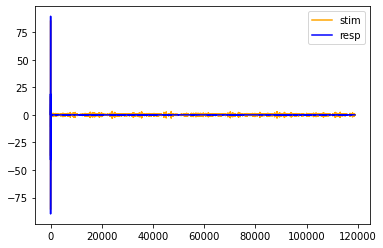

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
results = list()
for type in range(1,4):
  print("Método "+str(type))
  eyedee = str(type)  # ID OF THE EXPERIMENT.
  o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
  num_blocks_start = int(5)
  num_blocks_end   = int(10)
  lambda_          = float(0.1)
  mid_shape        = int(8)
  D                = [0.05,0.02]
  dropout    = 0.05
  learning_rate = 1e-3
  epoch_num  = 20
  batch_size = 2048
  reg_par    = 1e-4
  # o_dim      = 1
  use_all_singular_values = False
  best_only  = True
  print(f"eyedee    : {eyedee}")
  print(f"best_only : {best_only}")
  print(f"epoch_num : {epoch_num}")
  print(f"dropout   : {dropout}")
  device = torch.device('cuda')
  torch.cuda.empty_cache()
  # CREATING A FOLDER TO STORE THE RESULTS
  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales_all/grupo_eeg_"
  path_name = folder_path+f"dmcca_{eyedee}_{lambda_}_{mid_shape}_{D[0]}/"
  # i = 1
  if not path.exists(path_name):
  #     path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
  #     i = i + 1
  # del i
    os.mkdir(path_name)
  print(path_name)

  def butter_bandpass(lowcut, highcut, fs, order=5):
      nyq = 0.5 * fs
      low = lowcut / nyq
      high = highcut / nyq
      b, a = butter(order, [low, high], btype='band')
      return b, a

  ###############################################
  ## freqs
  fmin = 3  # frecuencia mínima
  fmax = 34 # frecuencia máxima
  BW   = 2  # tamaño de ancho de banda
  overlap = 0.25
  step = BW*(1-overlap) # tamaño de traslape
  freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
  a = list()
  b = list()
  freqs_ = list()
  N = 2 # Numero de orden del filtro
  for fil in range(21):
      b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
      # b_, a_ = butter(N=N,Wn=Wn,btype='band')
      b.append(b_)
      a.append(a_)
  freqs_.append([b,a])
  ###############################################

  ##################### SEED #####################
  seed = np.ceil(np.random.rand(10)*100)
  seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
  print(seed)

  ###############################################
  # D = [0, 0.05, 0.1, 0.2]
  # D = [0.05, 0.2]
  # CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
  # COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
  # lambda_       = 0.1
  # MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
  # IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
  # mid_shape  = 60
  speech_dmcca = True
  if speech_dmcca:
      num_blocks = 1   # IF SPEECH DATA BY LIBERTO ET AL.

      # subs ARE THE SUBJECTS IDS TO WORK WITH
      for subs_ in range(1,2):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
        subs = [subs_]
        print("Grupo "+str(subs_))
        subs = sorted(subs) # TO KEEP THEIR IDS SORTED
        n_subs = len(subs)

        str_subs = str(subs[0])
        for each_sub in subs[1:]: 
            str_subs += f"_{each_sub}"

        # num_blocks_start = 0
        # num_blocks_end   = 1
        # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
        # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

        tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
        val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

        print(f"n_subs     : {n_subs}")
        print(f"subs       : {subs}")
        print(f"D          : {D}")
        print(f"num_blocks : {num_blocks}")
        print(f"num_blocks_start: {num_blocks_start}")
        print(f"num_blocks_end  : {num_blocks_end}")
        print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

        # data_subs_pre = list()
        results_name = f'{path_name}/Datos_{str(type)}.npy'
        if path.exists(results_name):
          data_subs_pre = np.save(results_name)
        else:
          # for block in range(num_blocks):
          data_subs_pre=load_dmcca_data_all(subs, mid_shape, type, num_blocks)
          # np.save(results_name, data_subs_pre)
        for d_cnt, dropout in enumerate(D):
            for block in range(2,3):#(num_blocks_start, num_blocks_end):
                # THE DATA data_subs_pre IS LOADED SUCH THAT 
                # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
                # AND THE LAST LIST HAS STIMULUS
                # data_subs_pre IS A list OF SIZE N+1
                # EACH ELEMENT IS A list OF SIZE 3
                # SUCH THAT
                # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
                # AND
                # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
                
                # DEEP MCCA
                print("DEEP MCCA + LCCA")
                dmlcs, dmdcs, data__,data_sub = dmcca_method(data_subs_pre[block], "speech", dropout, f"block_{block}_drpt_{dropout}_sub_{subs_}",freqs_)
                tst_corrs[0, block, d_cnt] = dmlcs[0]
                tst_corrs[1, block, d_cnt] = dmdcs[0]
                print(tst_corrs)
                val_corrs[0, block, d_cnt] = dmlcs[1]
                val_corrs[1, block, d_cnt] = dmdcs[1]
                print(val_corrs)
                np.save(tst_corrs_name, tst_corrs)
                np.save(val_corrs_name, val_corrs)              
                print('saved SPEECH')
        results.append([tst_corrs,val_corrs])
      results_name = f'{path_name}/results_{str(type)}.npy'
      np.save(results_name, results)
# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

In [ ]:
len(data_subs_pre[0][0][0])

3

Método 1
eyedee    : 1
best_only : True
epoch_num : 20
dropout   : 0.05
/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales/grupo_cx_componentes_dmcca_1_0.01_80_0.05/
[48.]
Grupo 0
n_subs     : 1
subs       : [0]
D          : [0.05, 0.02]
num_blocks : 10
num_blocks_start: 5
num_blocks_end  : 10
num_blocks_net  : 5
Data INITIALIZING for block : 0
stim 271
y_test 216
172 44 55
Stim_train (10148, 1)
Data INITIALIZING for block : 1
stim 271
y_test 216
172 44 55
Stim_train (10148, 1)
Data INITIALIZING for block : 2
stim 271
y_test 216
172 44 55
Stim_train (10148, 1)
Data INITIALIZING for block : 3
stim 271
y_test 216
172 44 55
Stim_train (10148, 1)
Data INITIALIZING for block : 4
stim 271
y_test 216
172 44 55
Stim_train (10148, 1)
Data INITIALIZING for block : 5
stim 271
y_test 216
172 44 55
Stim_train (10148, 1)
Data INITIALIZING for block : 6
stim 271
y_test 216
172 44 55
Stim_train (10148, 1)
Data INITIALIZING for block : 7
stim 271
y_test 216
172 44 55
Stim_trai

0.07808250559366858
CCA Model Ended.
LCCA is : [array(0.07808251), array(0.00451863)]
DMLC corrs are : [0.07808251]
DMCCA + DCCA : block_0_drpt_0.05
DCCA for block_0_drpt_0.05_sub_0
seed:     48.0
EPOCH : 0
  Training CORRELATION   : 0.0133
  Validation CORRELATION : -0.0208
  Test CORRELATION       : -0.0220
  val. loss is : 0.0208 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0201
  Validation CORRELATION : 0.0020
  Test CORRELATION       : 0.0010
  val. loss is : -0.0020 & the min. loss is : 0.0208
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0227
  Validation CORRELATION : 0.0065
  Test CORRELATION       : 0.0027
  val. loss is : -0.0065 & the min. loss is : -0.0020
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0260
  Validation CORRELATION : 0.0110
  Test C

DMDC corrs are : [0.00512515]
DONE speech - block_0_drpt_0.05.
[[[[0.07808251]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]]


 [[[0.00512515]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]]]
[[[[0.00451863]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]


DMLC corrs are : [-0.00186526]
DMCCA + DCCA : block_1_drpt_0.05
DCCA for block_1_drpt_0.05_sub_0
seed:     48.0
EPOCH : 0
  Training CORRELATION   : 0.0165
  Validation CORRELATION : -0.0001
  Test CORRELATION       : -0.0080
  val. loss is : 0.0001 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0229
  Validation CORRELATION : 0.0037
  Test CORRELATION       : -0.0094
  val. loss is : -0.0037 & the min. loss is : 0.0001
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0256
  Validation CORRELATION : 0.0015
  Test CORRELATION       : -0.0076
  val. loss is : -0.0015 & the min. loss is : -0.0037
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0261
  Validation CORRELATION : 0.0007
  Test CORRELATION       : -0.0096
  val. loss is : -0.0007 & the min. loss is : -0.00

KeyboardInterrupt: ignored

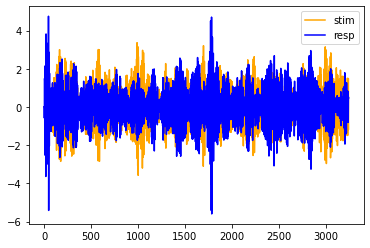

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
results = list()
for type in range(1,2):
  print("Método "+str(type))
  eyedee = str(type)  # ID OF THE EXPERIMENT.
  o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
  num_blocks_start = int(5)
  num_blocks_end   = int(10)
  lambda_          = float(0.1)
  mid_shape        = int(80)
  D                = [0.02]
  dropout    = 0.05
  learning_rate = 1e-3
  epoch_num  = 20
  batch_size = 2048
  reg_par    = 1e-4
  # o_dim      = 1
  use_all_singular_values = False
  best_only  = True
  print(f"eyedee    : {eyedee}")
  print(f"best_only : {best_only}")
  print(f"epoch_num : {epoch_num}")
  print(f"dropout   : {dropout}")
  device = torch.device('cuda')
  torch.cuda.empty_cache()
  # CREATING A FOLDER TO STORE THE RESULTS
  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales/grupo_cx_componentes_"
  path_name = folder_path+f"dmcca_{eyedee}_{lambda_}_{mid_shape}_{D[0]}/"
  # i = 1
  if not path.exists(path_name):
  #     path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
  #     i = i + 1
  # del i
    os.mkdir(path_name)
  print(path_name)

  def butter_bandpass(lowcut, highcut, fs, order=5):
      nyq = 0.5 * fs
      low = lowcut / nyq
      high = highcut / nyq
      b, a = butter(order, [low, high], btype='band')
      return b, a

  ###############################################
  ## freqs
  fmin = 3  # frecuencia mínima
  fmax = 34 # frecuencia máxima
  BW   = 2  # tamaño de ancho de banda
  overlap = 0.25
  step = BW*(1-overlap) # tamaño de traslape
  freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
  a = list()
  b = list()
  freqs_ = list()
  N = 2 # Numero de orden del filtro
  for fil in range(21):
      b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
      # b_, a_ = butter(N=N,Wn=Wn,btype='band')
      b.append(b_)
      a.append(a_)
  freqs_.append([b,a])
  ###############################################

  ##################### SEED #####################
  seed = np.ceil(np.random.rand(10)*100)
  seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
  print(seed)

  ###############################################
  # D = [0, 0.05, 0.1, 0.2]
  # D = [0.05, 0.2]
  # CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
  # COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
  # lambda_       = 0.1
  # MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
  # IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
  # mid_shape  = 60
  speech_dmcca = True
  if speech_dmcca:
      num_blocks = 10   # IF SPEECH DATA BY LIBERTO ET AL.

      # subs ARE THE SUBJECTS IDS TO WORK WITH
      for subs_ in range(4):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
        subs = [subs_]
        print("Grupo "+str(subs_))
        subs = sorted(subs) # TO KEEP THEIR IDS SORTED
        n_subs = len(subs)

        str_subs = str(subs[0])
        for each_sub in subs[1:]: 
            str_subs += f"_{each_sub}"

        # num_blocks_start = 0
        # num_blocks_end   = 1
        # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
        # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

        tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
        val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

        print(f"n_subs     : {n_subs}")
        print(f"subs       : {subs}")
        print(f"D          : {D}")
        print(f"num_blocks : {num_blocks}")
        print(f"num_blocks_start: {num_blocks_start}")
        print(f"num_blocks_end  : {num_blocks_end}")
        print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

        data_subs_pre = list()
        results_name = f'{path_name}/Datos_{str(type)}.npy'
        if path.exists(results_name):
          data_subs_pre = np.save(results_name)
        else:
          for block in range(num_blocks):
            data_subs_pre.append(load_dmcca_data_cluster(subs, mid_shape, type, block))
          # np.save(results_name, data_subs_pre)
        for d_cnt, dropout in enumerate(D):
            for block in range(num_blocks):#(num_blocks_start, num_blocks_end):
                # THE DATA data_subs_pre IS LOADED SUCH THAT 
                # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
                # AND THE LAST LIST HAS STIMULUS
                # data_subs_pre IS A list OF SIZE N+1
                # EACH ELEMENT IS A list OF SIZE 3
                # SUCH THAT
                # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
                # AND
                # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
                
                # DEEP MCCA
                print("DEEP MCCA + LCCA")
                dmlcs, dmdcs = dmcca_method(data_subs_pre[block], "speech", dropout, f"block_{block}_drpt_{dropout}",freqs_)
                tst_corrs[0, block, d_cnt] = dmlcs[0]
                tst_corrs[1, block, d_cnt] = dmdcs[0]
                print(tst_corrs)
                val_corrs[0, block, d_cnt] = dmlcs[1]
                val_corrs[1, block, d_cnt] = dmdcs[1]
                print(val_corrs)
                np.save(tst_corrs_name, tst_corrs)
                np.save(val_corrs_name, val_corrs)              
                print('saved SPEECH')
        results.append([tst_corrs,val_corrs])
      results_name = f'{path_name}/results_{str(type)}.npy'
      np.save(results_name, results)
# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

# prueba 2 con variación a 80-20 ALL-Cx

Método 2
eyedee    : 2
best_only : True
epoch_num : 20
dropout   : 0.05
/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales_all_5/grupo50_freq4_cx_dmcca_2_0.01_10_0.05/
[17.]
Grupo 1
n_subs     : 1
subs       : [1]
D          : [0.05, 0.02]
num_blocks : 31
num_blocks_start: 5
num_blocks_end  : 10
num_blocks_net  : 5
Data INITIALIZING for block : 31
(31, 40, 171, 23)
(1240, 3420)
(1240, 3420)
No trials 1240
(1240, 3420)


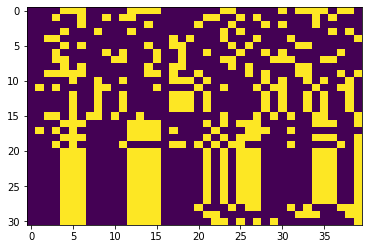

(392,)
(16,)
TRAIN: [  43   46   49   51   52   61   62   65   67   74   76   86   94  100
  104  108  110  114  124  128  132  143  145  156  158  162  163  177
  179  183  187  191  199  204  206  214  217  218  224  226  232  233
  243  249  251  255  258  261  265  268  270  277  283  284  290  291
  295  298  303  304  309  310  311  315  316  324  326  334  337  338
  344  346  352  353  362  363  364  365  366  374  375  377  380  386
  388  392  393  397  399  405  408  411  417  418  419  421  428  430
  433  435  438  441  443  448  449  455  460  463  467  469  470  474
  477  478  485  488  491  497  498  499  501  508  510  513  515  518
  525  528  531  537  538  539  541  548  550  553  555  558  565  568
  571  577  578  579  581  588  590  593  595  598  602  603  605  607
  608  610  613  623  627  629  631  634  635  639  644  645  646  652
  653  654  655  661  663  665  666  667  674  675  676  679  681  683
  685  692  693  694  695  697  702  706  707  708  711  

/content/drive/Shareddrives/GCPDS/databases/Databases_musica/toolbox_deep/deep-cca-for-audio-EEG/deep_losses.py:35: UserWarning: torch.symeig is deprecated in favor of torch.linalg.eigh and will be removed in a future PyTorch release.
The default behavior has changed from using the upper triangular portion of the matrix by default to using the lower triangular portion.
L, _ = torch.symeig(A, upper=upper)
should be replaced with
L = torch.linalg.eigvalsh(A, UPLO='U' if upper else 'L')
and
L, V = torch.symeig(A, eigenvectors=True)
should be replaced with
L, V = torch.linalg.eigh(A, UPLO='U' if upper else 'L') (Triggered internally at  ../aten/src/ATen/native/BatchLinearAlgebra.cpp:2499.)
  [D1, V1] = torch.symeig(SigmaHat11, eigenvectors=True)


EPOCH : 0
  Training corr LOSS   : 0.3163
0.31625163555145264 - 0.7199625968933105 = 0.3090520203113556
  Validation corr LOSS : 0.3165
0.31653082370758057 - 0.7126638293266296 = 0.309404194355011
torch.Size([16, 3645])
  Test corr LOSS       : 0.3169
0.31687283515930176 - 0.7219542264938354 = 0.30965328216552734
  val. loss is : -0.3094 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training corr LOSS   : 0.3162
0.3162457048892975 - 0.6633424758911133 = 0.3096122741699219
  Validation corr LOSS : 0.3165
0.3164558410644531 - 0.6566454768180847 = 0.30988937616348267
torch.Size([16, 3645])
  Test corr LOSS       : 0.3164
0.31642624735832214 - 0.6650687456130981 = 0.30977556109428406
  val. loss is : -0.3099 & the min. loss is : -0.3094
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training corr LOSS   : 0.3162
0.31624746322631836 - 0.6130043864250183 = 0.3101174235343933
  Validation 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.28192094]
DMCCA + DCCA : block_0_drpt_0.05_sub_1
DCCA for block_0_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0241
  Validation CORRELATION : -0.0671
  Test CORRELATION       : 0.3108
  val. loss is : 0.0671 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0238
  Validation CORRELATION : 0.0334
  Test CORRELATION       : -0.0001
  val. loss is : -0.0334 & the min. loss is : 0.0671
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0352
  Validation CORRELATION : 0.0319
  Test CORRELATION       : -0.0262
  val. loss is : -0.0319 & the min. loss is : -0.0334
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0358
  Validation CORRELATION : 0.0350
  Test CORRELATION       : -0.0135
  val. loss is : -0.0350 & the min. loss

  Loaded the model from epoch : 9.

DCCA is : [array(-0.00505366, dtype=float32), array(-0.00505366, dtype=float32)]
DMDC corrs are : [-0.00505366]
DONE speech - block_0_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.03869392]
DMCCA + DCCA : block_1_drpt_0.05_sub_1
DCCA for block_1_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0650
  Validation CORRELATION : -0.0499
  Test CORRELATION       : 0.5084
  val. loss is : 0.0499 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1354
  Validation CORRELATION : -0.1462
  Test CORRELATION       : 0.7310
  val. loss is : 0.1462 & the min. loss is : 0.0499
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1160
  Validation CORRELATION : -0.1573
  Test CORRELATION       : 0.6122
  val. loss is : 0.1573 & the min. loss is : 0.0499
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.1200
  Validation CORRELATION : -0.1996
  Test CORRELATION       : 0.6933
  val. loss is : 0.1996 & the min. los

  Loaded the model from epoch : 0.

DCCA is : [array(0.5084127, dtype=float32), array(0.5084127, dtype=float32)]
DMDC corrs are : [0.50841272]
DONE speech - block_1_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.06952221]
DMCCA + DCCA : block_2_drpt_0.05_sub_1
DCCA for block_2_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0192
  Validation CORRELATION : 0.0325
  Test CORRELATION       : -0.1815
  val. loss is : -0.0325 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0154
  Validation CORRELATION : 0.0216
  Test CORRELATION       : -0.3824
  val. loss is : -0.0216 & the min. loss is : -0.0325
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0303
  Validation CORRELATION : 0.0223
  Test CORRELATION       : -0.4357
  val. loss is : -0.0223 & the min. loss is : -0.0325
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0090
  Validation CORRELATION : 0.0355
  Test CORRELATION       : -0.4360
  val. loss is : -0.0355 & the

  Loaded the model from epoch : 4.

DCCA is : [array(-0.507615, dtype=float32), array(-0.507615, dtype=float32)]
DMDC corrs are : [-0.50761497]
DONE speech - block_2_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0. 

Filtered.
DMCCA + LCCA : block_3_drpt_0.05_sub_1
LCCA for block_3_drpt_0.05_sub_1_sub_0
CCA Model Started...
0.9900415035426624
CCA Model Ended.
LCCA is : [array(0.9900415), array(-0.03849808)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.9900415]
DMCCA + DCCA : block_3_drpt_0.05_sub_1
DCCA for block_3_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0369
  Validation CORRELATION : -0.0490
  Test CORRELATION       : -0.2986
  val. loss is : 0.0490 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0384
  Validation CORRELATION : -0.0112
  Test CORRELATION       : -0.1355
  val. loss is : 0.0112 & the min. loss is : 0.0490
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0257
  Validation CORRELATION : -0.0156
  Test CORRELATION       : -0.1311
  val. loss is : 0.0156 & the min. loss is : 0.0112
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0171
  Validation CORRELATION : -0.0133
  Test CORRELATION       : -0.1318
  val. loss is : 0.0133 & the min. lo

  Loaded the model from epoch : 1.

DCCA is : [array(-0.13552219, dtype=float32), array(-0.13552219, dtype=float32)]
DMDC corrs are : [-0.13552219]
DONE speech - block_3_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.86617019]
DMCCA + DCCA : block_4_drpt_0.05_sub_1
DCCA for block_4_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0266
  Validation CORRELATION : 0.0841
  Test CORRELATION       : 0.3218
  val. loss is : -0.0841 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0506
  Validation CORRELATION : 0.0574
  Test CORRELATION       : 0.3998
  val. loss is : -0.0574 & the min. loss is : -0.0841
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0282
  Validation CORRELATION : 0.0424
  Test CORRELATION       : 0.2936
  val. loss is : -0.0424 & the min. loss is : -0.0841
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0402
  Validation CORRELATION : 0.0969
  Test CORRELATION       : 0.3809
  val. loss is : -0.0969 & the min. l

  Loaded the model from epoch : 17.

DCCA is : [array(0.40995565, dtype=float32), array(0.40995565, dtype=float32)]
DMDC corrs are : [0.40995565]
DONE speech - block_4_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0

Filtering loaded.
Filtered.
DMCCA + LCCA : block_5_drpt_0.05_sub_1
LCCA for block_5_drpt_0.05_sub_1_sub_0
CCA Model Started...
0.01793019461595442
CCA Model Ended.
LCCA is : [array(0.01793019), array(-0.22163556)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.01793019]
DMCCA + DCCA : block_5_drpt_0.05_sub_1
DCCA for block_5_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0298
  Validation CORRELATION : -0.0335
  Test CORRELATION       : -0.4727
  val. loss is : 0.0335 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0478
  Validation CORRELATION : 0.0194
  Test CORRELATION       : -0.4303
  val. loss is : -0.0194 & the min. loss is : 0.0335
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0442
  Validation CORRELATION : 0.0257
  Test CORRELATION       : -0.4485
  val. loss is : -0.0257 & the min. loss is : -0.0194
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0403
  Validation CORRELATION : 0.0286
  Test CORRELATION       : -0.4453
  val. loss is : -0.0286 & the min. loss 

  Saved the model at epoch : 19

DCCA is : [array(-0.36662987, dtype=float32), array(-0.36662987, dtype=float32)]
DMDC corrs are : [-0.36662987]
DONE speech - block_5_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.70492767]
DMCCA + DCCA : block_6_drpt_0.05_sub_1
DCCA for block_6_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0182
  Validation CORRELATION : -0.0568
  Test CORRELATION       : -0.4737
  val. loss is : 0.0568 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0705
  Validation CORRELATION : -0.0402
  Test CORRELATION       : -0.4317
  val. loss is : 0.0402 & the min. loss is : 0.0568
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0870
  Validation CORRELATION : 0.0059
  Test CORRELATION       : -0.3809
  val. loss is : -0.0059 & the min. loss is : 0.0402
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1014
  Validation CORRELATION : 0.0378
  Test CORRELATION       : -0.3131
  val. loss is : -0.0378 & the min. loss is :

  Saved the model at epoch : 19

DCCA is : [array(0.12259461, dtype=float32), array(0.12259461, dtype=float32)]
DMDC corrs are : [0.12259461]
DONE speech - block_6_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.36335105]
DMCCA + DCCA : block_7_drpt_0.05_sub_1
DCCA for block_7_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0082
  Validation CORRELATION : 0.0288
  Test CORRELATION       : 0.0131
  val. loss is : -0.0288 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0506
  Validation CORRELATION : -0.0056
  Test CORRELATION       : -0.0561
  val. loss is : 0.0056 & the min. loss is : -0.0288
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0526
  Validation CORRELATION : -0.0052
  Test CORRELATION       : -0.0622
  val. loss is : 0.0052 & the min. loss is : -0.0288
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0510
  Validation CORRELATION : -0.0028
  Test CORRELATION       : -0.0860
  val. loss is : 0.0028 & the min. 

  Loaded the model from epoch : 16.

DCCA is : [array(-0.20151, dtype=float32), array(-0.20151, dtype=float32)]
DMDC corrs are : [-0.20151]
DONE speech - block_7_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.     

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.13904658]
DMCCA + DCCA : block_8_drpt_0.05_sub_1
DCCA for block_8_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.1046
  Validation CORRELATION : -0.0580
  Test CORRELATION       : 0.2308
  val. loss is : 0.0580 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1125
  Validation CORRELATION : -0.0387
  Test CORRELATION       : 0.3082
  val. loss is : 0.0387 & the min. loss is : 0.0580
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0832
  Validation CORRELATION : -0.0199
  Test CORRELATION       : 0.2484
  val. loss is : 0.0199 & the min. loss is : 0.0387
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1095
  Validation CORRELATION : -0.1120
  Test CORRELATION       : 0.3088
  val. loss is : 0.1120 & the min. loss is : 0.01

  Loaded the model from epoch : 2.

DCCA is : [array(0.24838737, dtype=float32), array(0.24838737, dtype=float32)]
DMDC corrs are : [0.24838737]
DONE speech - block_8_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.02376378]
DMCCA + DCCA : block_9_drpt_0.05_sub_1
DCCA for block_9_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0182
  Validation CORRELATION : 0.1483
  Test CORRELATION       : 0.2669
  val. loss is : -0.1483 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0056
  Validation CORRELATION : 0.1385
  Test CORRELATION       : 0.0246
  val. loss is : -0.1385 & the min. loss is : -0.1483
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0722
  Validation CORRELATION : 0.1063
  Test CORRELATION       : 0.0846
  val. loss is : -0.1063 & the min. loss is : -0.1483
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0726
  Validation CORRELATION : 0.0865
  Test CORRELATION       : 0.0318
  val. loss is : -0.0865 & the min. lo

  Loaded the model from epoch : 0.

DCCA is : [array(0.26693404, dtype=float32), array(0.26693404, dtype=float32)]
DMDC corrs are : [0.26693404]
DONE speech - block_9_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.25600245]
DMCCA + DCCA : block_10_drpt_0.05_sub_1
DCCA for block_10_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0009
  Validation CORRELATION : -0.1616
  Test CORRELATION       : 0.3571
  val. loss is : 0.1616 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0304
  Validation CORRELATION : -0.1716
  Test CORRELATION       : 0.1226
  val. loss is : 0.1716 & the min. loss is : 0.1616
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0480
  Validation CORRELATION : -0.1616
  Test CORRELATION       : 0.1788
  val. loss is : 0.1616 & the min. loss is : 0.1616
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0251
  Validation CORRELATION : -0.1517
  Test CORRELATION       : 0.4606
  val. loss is : 0.1517 & the min. l

  Loaded the model from epoch : 7.

DCCA is : [array(0.5125515, dtype=float32), array(0.5125515, dtype=float32)]
DMDC corrs are : [0.51255149]
DONE speech - block_10_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0. 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.80742617]
DMCCA + DCCA : block_11_drpt_0.05_sub_1
DCCA for block_11_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0042
  Validation CORRELATION : 0.0759
  Test CORRELATION       : 0.3207
  val. loss is : -0.0759 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0531
  Validation CORRELATION : 0.0458
  Test CORRELATION       : 0.3991
  val. loss is : -0.0458 & the min. loss is : -0.0759
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0456
  Validation CORRELATION : 0.0446
  Test CORRELATION       : 0.3517
  val. loss is : -0.0446 & the min. loss is : -0.0759
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0511
  Validation CORRELATION : 0.0416
  Test CORRELATION       : 0.4008
  val. loss is : -0.0416 & the min. 

  Loaded the model from epoch : 5.

DCCA is : [array(0.35959455, dtype=float32), array(0.35959455, dtype=float32)]
DMDC corrs are : [0.35959455]
DONE speech - block_11_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.55537599]
DMCCA + DCCA : block_12_drpt_0.05_sub_1
DCCA for block_12_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0471
  Validation CORRELATION : -0.0189
  Test CORRELATION       : 0.0101
  val. loss is : 0.0189 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0150
  Validation CORRELATION : 0.0638
  Test CORRELATION       : -0.0080
  val. loss is : -0.0638 & the min. loss is : 0.0189
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0019
  Validation CORRELATION : -0.0247
  Test CORRELATION       : 0.1145
  val. loss is : 0.0247 & the min. loss is : -0.0638
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0427
  Validation CORRELATION : 0.0396
  Test CORRELATION       : 0.0032
  val. loss is : -0.0396 & the min. l

  Loaded the model from epoch : 1.

DCCA is : [array(-0.00800265, dtype=float32), array(-0.00800265, dtype=float32)]
DMDC corrs are : [-0.00800265]
DONE speech - block_12_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.1434329]
DMCCA + DCCA : block_13_drpt_0.05_sub_1
DCCA for block_13_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0414
  Validation CORRELATION : -0.0193
  Test CORRELATION       : -0.0353
  val. loss is : 0.0193 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0050
  Validation CORRELATION : 0.0296
  Test CORRELATION       : 0.0956
  val. loss is : -0.0296 & the min. loss is : 0.0193
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0233
  Validation CORRELATION : -0.0317
  Test CORRELATION       : -0.1566
  val. loss is : 0.0317 & the min. loss is : -0.0296
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0163
  Validation CORRELATION : -0.0486
  Test CORRELATION       : -0.2183
  val. loss is : 0.0486 & the min. 

  Loaded the model from epoch : 1.

DCCA is : [array(0.09560787, dtype=float32), array(0.09560787, dtype=float32)]
DMDC corrs are : [0.09560787]
DONE speech - block_13_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0

Filtered.
DMCCA + LCCA : block_14_drpt_0.05_sub_1
LCCA for block_14_drpt_0.05_sub_1_sub_0
CCA Model Started...
0.8000399736053708
CCA Model Ended.
LCCA is : [array(0.80003997), array(-0.11181097)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.80003997]
DMCCA + DCCA : block_14_drpt_0.05_sub_1
DCCA for block_14_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0297
  Validation CORRELATION : 0.0650
  Test CORRELATION       : -0.1143
  val. loss is : -0.0650 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0157
  Validation CORRELATION : 0.1202
  Test CORRELATION       : -0.0345
  val. loss is : -0.1202 & the min. loss is : -0.0650
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0080
  Validation CORRELATION : 0.1252
  Test CORRELATION       : 0.0091
  val. loss is : -0.1252 & the min. loss is : -0.1202
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0011
  Validation CORRELATION : 0.1215
  Test CORRELATION       : 0.0628
  val. loss is : -0.1215 & the min. loss i

  Loaded the model from epoch : 7.

DCCA is : [array(0.05861309, dtype=float32), array(0.05861309, dtype=float32)]
DMDC corrs are : [0.05861309]
DONE speech - block_14_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0

DMCCA + LCCA : block_15_drpt_0.05_sub_1
LCCA for block_15_drpt_0.05_sub_1_sub_0
CCA Model Started...
-0.06006804624747238
CCA Model Ended.
LCCA is : [array(-0.06006805), array(0.0053579)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.06006805]
DMCCA + DCCA : block_15_drpt_0.05_sub_1
DCCA for block_15_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0175
  Validation CORRELATION : -0.0096
  Test CORRELATION       : 0.3014
  val. loss is : 0.0096 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0050
  Validation CORRELATION : -0.1119
  Test CORRELATION       : 0.5518
  val. loss is : 0.1119 & the min. loss is : 0.0096
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0184
  Validation CORRELATION : -0.0360
  Test CORRELATION       : 0.3635
  val. loss is : 0.0360 & the min. loss is : 0.0096
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0110
  Validation CORRELATION : -0.0787
  Test CORRELATION       : 0.4836
  val. loss is : 0.0787 & the mi

  Loaded the model from epoch : 15.

DCCA is : [array(0.40866694, dtype=float32), array(0.40866694, dtype=float32)]
DMDC corrs are : [0.40866694]
DONE speech - block_15_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.88512328]
DMCCA + DCCA : block_16_drpt_0.05_sub_1
DCCA for block_16_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0227
  Validation CORRELATION : -0.0502
  Test CORRELATION       : 0.0625
  val. loss is : 0.0502 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0268
  Validation CORRELATION : -0.0888
  Test CORRELATION       : 0.2870
  val. loss is : 0.0888 & the min. loss is : 0.0502
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0155
  Validation CORRELATION : -0.1121
  Test CORRELATION       : 0.3555
  val. loss is : 0.1121 & the min. loss is : 0.0502
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0194
  Validation CORRELATION : -0.1071
  Test CORRELATION       : 0.3583
  val. loss is : 0.1071 & the mi

  Loaded the model from epoch : 7.

DCCA is : [array(0.37347522, dtype=float32), array(0.37347522, dtype=float32)]
DMDC corrs are : [0.37347522]
DONE speech - block_16_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.77233676]
DMCCA + DCCA : block_17_drpt_0.05_sub_1
DCCA for block_17_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0782
  Validation CORRELATION : 0.1147
  Test CORRELATION       : 0.4536
  val. loss is : -0.1147 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0777
  Validation CORRELATION : 0.0530
  Test CORRELATION       : 0.3233
  val. loss is : -0.0530 & the min. loss is : -0.1147
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1294
  Validation CORRELATION : 0.0302
  Test CORRELATION       : 0.2632
  val. loss is : -0.0302 & the min. loss is : -0.1147
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.1299
  Validation CORRELATION : 0.0199
  Test CORRELATION       : 0.2235
  val. loss is : -0.0199 & the min. l

  Loaded the model from epoch : 18.

DCCA is : [array(0.12392574, dtype=float32), array(0.12392574, dtype=float32)]
DMDC corrs are : [0.12392574]
DONE speech - block_17_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.17281832]
DMCCA + DCCA : block_18_drpt_0.05_sub_1
DCCA for block_18_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0209
  Validation CORRELATION : -0.1219
  Test CORRELATION       : 0.3058
  val. loss is : 0.1219 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0128
  Validation CORRELATION : -0.1272
  Test CORRELATION       : 0.1426
  val. loss is : 0.1272 & the min. loss is : 0.1219
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0062
  Validation CORRELATION : -0.1324
  Test CORRELATION       : 0.1401
  val. loss is : 0.1324 & the min. loss is : 0.1219
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0187
  Validation CORRELATION : -0.1140
  Test CORRELATION       : 0.1636
  val. loss is : 0.1140 & the min.

  Loaded the model from epoch : 7.

DCCA is : [array(0.2744162, dtype=float32), array(0.2744162, dtype=float32)]
DMDC corrs are : [0.27441621]
DONE speech - block_18_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0. 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.03518743]
DMCCA + DCCA : block_19_drpt_0.05_sub_1
DCCA for block_19_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0246
  Validation CORRELATION : -0.1516
  Test CORRELATION       : 0.1455
  val. loss is : 0.1516 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0811
  Validation CORRELATION : -0.1792
  Test CORRELATION       : 0.1520
  val. loss is : 0.1792 & the min. loss is : 0.1516
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0642
  Validation CORRELATION : -0.1092
  Test CORRELATION       : 0.0614
  val. loss is : 0.1092 & the min. loss is : 0.1516
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1040
  Validation CORRELATION : -0.1070
  Test CORRELATION       : 0.0344
  val. loss is : 0.1070 & the min. loss is

  Loaded the model from epoch : 3.

DCCA is : [array(0.03438395, dtype=float32), array(0.03438395, dtype=float32)]
DMDC corrs are : [0.03438395]
DONE speech - block_19_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.68262082]
DMCCA + DCCA : block_20_drpt_0.05_sub_1
DCCA for block_20_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0007
  Validation CORRELATION : -0.0792
  Test CORRELATION       : -0.2635
  val. loss is : 0.0792 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0450
  Validation CORRELATION : -0.1866
  Test CORRELATION       : -0.2114
  val. loss is : 0.1866 & the min. loss is : 0.0792
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0100
  Validation CORRELATION : -0.1256
  Test CORRELATION       : -0.1898
  val. loss is : 0.1256 & the min. loss is : 0.0792
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0420
  Validation CORRELATION : -0.1815
  Test CORRELATION       : -0.2012
  val. loss is : 0.1815 & the 

  Loaded the model from epoch : 11.

DCCA is : [array(-0.13894139, dtype=float32), array(-0.13894139, dtype=float32)]
DMDC corrs are : [-0.13894139]
DONE speech - block_20_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.15764766]
DMCCA + DCCA : block_21_drpt_0.05_sub_1
DCCA for block_21_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0175
  Validation CORRELATION : 0.0678
  Test CORRELATION       : -0.1197
  val. loss is : -0.0678 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0467
  Validation CORRELATION : -0.0034
  Test CORRELATION       : -0.2232
  val. loss is : 0.0034 & the min. loss is : -0.0678
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0100
  Validation CORRELATION : -0.0215
  Test CORRELATION       : -0.3643
  val. loss is : 0.0215 & the min. loss is : -0.0678
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0289
  Validation CORRELATION : -0.0768
  Test CORRELATION       : -0.3596
  val. loss is : 0.0768 & t

  Loaded the model from epoch : 4.

DCCA is : [array(-0.29368255, dtype=float32), array(-0.29368255, dtype=float32)]
DMDC corrs are : [-0.29368255]
DONE speech - block_21_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[ 0.        ]
   

1
Sub: 1
Filtering loaded.
Filtered.
DMCCA + LCCA : block_22_drpt_0.05_sub_1
LCCA for block_22_drpt_0.05_sub_1_sub_0
CCA Model Started...
-0.07303114051802811
CCA Model Ended.
LCCA is : [array(-0.07303114), array(-0.18160203)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.07303114]
DMCCA + DCCA : block_22_drpt_0.05_sub_1
DCCA for block_22_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0227
  Validation CORRELATION : -0.0251
  Test CORRELATION       : -0.3855
  val. loss is : 0.0251 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0540
  Validation CORRELATION : -0.2048
  Test CORRELATION       : -0.5006
  val. loss is : 0.2048 & the min. loss is : 0.0251
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0334
  Validation CORRELATION : -0.2305
  Test CORRELATION       : -0.4272
  val. loss is : 0.2305 & the min. loss is : 0.0251
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0496
  Validation CORRELATION : -0.2050
  Test CORRELATION       : -0.5096
  val. loss is : 0.2050 & the

  Loaded the model from epoch : 0.

DCCA is : [array(-0.38545743, dtype=float32), array(-0.38545743, dtype=float32)]
DMDC corrs are : [-0.38545743]
DONE speech - block_22_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   

DMCCA + LCCA : block_23_drpt_0.05_sub_1
LCCA for block_23_drpt_0.05_sub_1_sub_0
CCA Model Started...
-0.2577756444130272
CCA Model Ended.
LCCA is : [array(-0.25777564), array(-0.34863066)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.25777564]
DMCCA + DCCA : block_23_drpt_0.05_sub_1
DCCA for block_23_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0064
  Validation CORRELATION : 0.0332
  Test CORRELATION       : -0.1896
  val. loss is : -0.0332 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0054
  Validation CORRELATION : -0.0422
  Test CORRELATION       : -0.2839
  val. loss is : 0.0422 & the min. loss is : -0.0332
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0124
  Validation CORRELATION : -0.0290
  Test CORRELATION       : -0.2221
  val. loss is : 0.0290 & the min. loss is : -0.0332
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0182
  Validation CORRELATION : -0.0278
  Test CORRELATION       : -0.2920
  val. loss is : 0.0278 & th

  Loaded the model from epoch : 0.

DCCA is : [array(-0.18964688, dtype=float32), array(-0.18964688, dtype=float32)]
DMDC corrs are : [-0.18964688]
DONE speech - block_23_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.64966745]
DMCCA + DCCA : block_24_drpt_0.05_sub_1
DCCA for block_24_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0166
  Validation CORRELATION : 0.0380
  Test CORRELATION       : 0.1805
  val. loss is : -0.0380 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0391
  Validation CORRELATION : -0.0127
  Test CORRELATION       : 0.1900
  val. loss is : 0.0127 & the min. loss is : -0.0380
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0930
  Validation CORRELATION : -0.1396
  Test CORRELATION       : 0.0893
  val. loss is : 0.1396 & the min. loss is : -0.0380
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0929
  Validation CORRELATION : -0.1417
  Test CORRELATION       : 0.0991
  val. loss is : 0.1417 & the mi

DMDC corrs are : [0.1804702]
DONE speech - block_24_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0.        ]]

  [[-0.25777564]
   [ 0.        ]]

  [[ 0.64966745]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.       

DMCCA + LCCA : block_25_drpt_0.05_sub_1
LCCA for block_25_drpt_0.05_sub_1_sub_0
CCA Model Started...
0.8479099741694645
CCA Model Ended.
LCCA is : [array(0.84790997), array(-0.30462173)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.84790997]
DMCCA + DCCA : block_25_drpt_0.05_sub_1
DCCA for block_25_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0254
  Validation CORRELATION : 0.0816
  Test CORRELATION       : -0.0235
  val. loss is : -0.0816 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0796
  Validation CORRELATION : 0.0523
  Test CORRELATION       : -0.2687
  val. loss is : -0.0523 & the min. loss is : -0.0816
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0886
  Validation CORRELATION : -0.0793
  Test CORRELATION       : -0.3942
  val. loss is : 0.0793 & the min. loss is : -0.0816
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0872
  Validation CORRELATION : -0.0719
  Test CORRELATION       : -0.3832
  val. loss is : 0.0719 & th

  Loaded the model from epoch : 0.

DCCA is : [array(-0.02353704, dtype=float32), array(-0.02353704, dtype=float32)]
DMDC corrs are : [-0.02353704]
DONE speech - block_25_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.46559201]
DMCCA + DCCA : block_26_drpt_0.05_sub_1
DCCA for block_26_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0643
  Validation CORRELATION : -0.0139
  Test CORRELATION       : -0.2133
  val. loss is : 0.0139 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0841
  Validation CORRELATION : -0.0059
  Test CORRELATION       : -0.1155
  val. loss is : 0.0059 & the min. loss is : 0.0139
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0640
  Validation CORRELATION : -0.0034
  Test CORRELATION       : -0.1702
  val. loss is : 0.0034 & the min. loss is : 0.0059
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0519
  Validation CORRELATION : -0.0457
  Test CORRELATION       : -0.1835
  val. loss is : 0.0457 & the min. loss

  Loaded the model from epoch : 2.

DCCA is : [array(-0.1701687, dtype=float32), array(-0.1701687, dtype=float32)]
DMDC corrs are : [-0.1701687]
DONE speech - block_26_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.64365771]
DMCCA + DCCA : block_27_drpt_0.05_sub_1
DCCA for block_27_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0414
  Validation CORRELATION : -0.0152
  Test CORRELATION       : -0.2578
  val. loss is : 0.0152 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.1053
  Validation CORRELATION : -0.0751
  Test CORRELATION       : -0.2602
  val. loss is : 0.0751 & the min. loss is : 0.0152
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.1017
  Validation CORRELATION : -0.0845
  Test CORRELATION       : -0.2714
  val. loss is : 0.0845 & the min. loss is : 0.0152
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.1026
  Validation CORRELATION : -0.0792
  Test CORRELATION       : -0.2649
  val. loss is : 0.0792 & the

  Loaded the model from epoch : 0.

DCCA is : [array(-0.2578087, dtype=float32), array(-0.2578087, dtype=float32)]
DMDC corrs are : [-0.25780869]
DONE speech - block_27_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 

0.8584500617893042
CCA Model Ended.
LCCA is : [array(0.85845006), array(0.04435053)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.85845006]
DMCCA + DCCA : block_28_drpt_0.05_sub_1
DCCA for block_28_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0804
  Validation CORRELATION : -0.1214
  Test CORRELATION       : -0.3666
  val. loss is : 0.1214 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0885
  Validation CORRELATION : -0.1457
  Test CORRELATION       : -0.4078
  val. loss is : 0.1457 & the min. loss is : 0.1214
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0569
  Validation CORRELATION : -0.1456
  Test CORRELATION       : -0.4065
  val. loss is : 0.1456 & the min. loss is : 0.1214
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0840
  Validation CORRELATION : -0.1598
  Test CORRELATION       : -0.4210
  val. loss is : 0.1598 & the

  Loaded the model from epoch : 12.

DCCA is : [array(-0.4724507, dtype=float32), array(-0.4724507, dtype=float32)]
DMDC corrs are : [-0.4724507]
DONE speech - block_28_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.89496861]
DMCCA + DCCA : block_29_drpt_0.05_sub_1
DCCA for block_29_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0384
  Validation CORRELATION : -0.1895
  Test CORRELATION       : 0.0225
  val. loss is : 0.1895 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0662
  Validation CORRELATION : -0.1244
  Test CORRELATION       : -0.0772
  val. loss is : 0.1244 & the min. loss is : 0.1895
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1207
  Validation CORRELATION : -0.0391
  Test CORRELATION       : -0.2550
  val. loss is : 0.0391 & the min. loss is : 0.1244
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1572
  Validation CORRELATION : 0.0350
  Test CORRELATION       : -0.3599
  val. loss is : -0.0350 & the min. loss is 

  Loaded the model from epoch : 5.

DCCA is : [array(-0.38708103, dtype=float32), array(-0.38708103, dtype=float32)]
DMDC corrs are : [-0.38708103]
DONE speech - block_29_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   

Filtered.
DMCCA + LCCA : block_30_drpt_0.05_sub_1
LCCA for block_30_drpt_0.05_sub_1_sub_0
CCA Model Started...
0.869764322920577
CCA Model Ended.
LCCA is : [array(0.86976432), array(0.15343282)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.86976432]
DMCCA + DCCA : block_30_drpt_0.05_sub_1
DCCA for block_30_drpt_0.05_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0253
  Validation CORRELATION : 0.0099
  Test CORRELATION       : 0.2863
  val. loss is : -0.0099 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0136
  Validation CORRELATION : 0.0413
  Test CORRELATION       : 0.2557
  val. loss is : -0.0413 & the min. loss is : -0.0099
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0736
  Validation CORRELATION : -0.0818
  Test CORRELATION       : 0.2951
  val. loss is : 0.0818 & the min. loss is : -0.0413
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0796
  Validation CORRELATION : -0.1300
  Test CORRELATION       : 0.3011
  val. loss is : 0.1300 & the min. loss 

  Loaded the model from epoch : 1.

DCCA is : [array(0.25572658, dtype=float32), array(0.25572658, dtype=float32)]
DMDC corrs are : [0.25572658]
DONE speech - block_30_drpt_0.05_sub_1.
[[[[ 0.28192094]
   [ 0.        ]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.47445933]
DMCCA + DCCA : block_0_drpt_0.02_sub_1
DCCA for block_0_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0297
  Validation CORRELATION : 0.1227
  Test CORRELATION       : 0.3179
  val. loss is : -0.1227 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1354
  Validation CORRELATION : 0.0843
  Test CORRELATION       : 0.2442
  val. loss is : -0.0843 & the min. loss is : -0.1227
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.1051
  Validation CORRELATION : -0.0348
  Test CORRELATION       : -0.2968
  val. loss is : 0.0348 & the min. loss is : -0.1227
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0943
  Validation CORRELATION : 0.0236
  Test CORRELATION       : 0.2702
  val. loss is : -0.0236 & the min. 

  Loaded the model from epoch : 0.

DCCA is : [array(0.31789646, dtype=float32), array(0.31789646, dtype=float32)]
DMDC corrs are : [0.31789646]
DONE speech - block_0_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.        ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.0430974]
DMCCA + DCCA : block_1_drpt_0.02_sub_1
DCCA for block_1_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0084
  Validation CORRELATION : 0.0575
  Test CORRELATION       : 0.5993
  val. loss is : -0.0575 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0185
  Validation CORRELATION : 0.0538
  Test CORRELATION       : 0.7000
  val. loss is : -0.0538 & the min. loss is : -0.0575
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0058
  Validation CORRELATION : 0.0096
  Test CORRELATION       : 0.6240
  val. loss is : -0.0096 & the min. loss is : -0.0575
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0059
  Validation CORRELATION : 0.0414
  Test CORRELATION       : 0.6962
  val. loss is : -0.0414 & the min. los

  Loaded the model from epoch : 10.

DCCA is : [array(0.6899968, dtype=float32), array(0.6899968, dtype=float32)]
DMDC corrs are : [0.68999678]
DONE speech - block_1_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.        ]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0. 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.70642139]
DMCCA + DCCA : block_2_drpt_0.02_sub_1
DCCA for block_2_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0077
  Validation CORRELATION : -0.2423
  Test CORRELATION       : 0.0262
  val. loss is : 0.2423 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0185
  Validation CORRELATION : -0.1862
  Test CORRELATION       : -0.3698
  val. loss is : 0.1862 & the min. loss is : 0.2423
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0290
  Validation CORRELATION : -0.2763
  Test CORRELATION       : -0.0174
  val. loss is : 0.2763 & the min. loss is : 0.1862
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0296
  Validation CORRELATION : -0.2392
  Test CORRELATION       : -0.0738
  val. loss is : 0.2392 & the min. loss

  Loaded the model from epoch : 1.

DCCA is : [array(-0.36980078, dtype=float32), array(-0.36980078, dtype=float32)]


DMDC corrs are : [-0.36980078]
DONE speech - block_2_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.        ]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0.        ]]

  [[-0.25777564]
   [ 0.        ]]

  [[ 0.64966745]
   [ 0.        ]]

  [[ 0.84790997]
   [ 0.      

Filtering loaded.
Filtered.
DMCCA + LCCA : block_3_drpt_0.02_sub_1
LCCA for block_3_drpt_0.02_sub_1_sub_0
CCA Model Started...
0.2174678697204285
CCA Model Ended.
LCCA is : [array(0.21746787), array(-0.10611692)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.21746787]
DMCCA + DCCA : block_3_drpt_0.02_sub_1
DCCA for block_3_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0136
  Validation CORRELATION : -0.2342
  Test CORRELATION       : 0.2408
  val. loss is : 0.2342 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0117
  Validation CORRELATION : -0.1838
  Test CORRELATION       : 0.1989
  val. loss is : 0.1838 & the min. loss is : 0.2342
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0065
  Validation CORRELATION : -0.2077
  Test CORRELATION       : 0.2272
  val. loss is : 0.2077 & the min. loss is : 0.1838
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0032
  Validation CORRELATION : -0.1972
  Test CORRELATION       : 0.2150
  val. loss is : 0.1972 & the min. loss is

  Loaded the model from epoch : 1.

DCCA is : [array(0.19886678, dtype=float32), array(0.19886678, dtype=float32)]
DMDC corrs are : [0.19886678]
DONE speech - block_3_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [ 0.        ]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.80612047]
DMCCA + DCCA : block_4_drpt_0.02_sub_1
DCCA for block_4_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0078
  Validation CORRELATION : -0.1361
  Test CORRELATION       : -0.0160
  val. loss is : 0.1361 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0308
  Validation CORRELATION : -0.1553
  Test CORRELATION       : -0.0428
  val. loss is : 0.1553 & the min. loss is : 0.1361
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0247
  Validation CORRELATION : -0.1813
  Test CORRELATION       : 0.0802
  val. loss is : 0.1813 & the min. loss is : 0.1361
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0363
  Validation CORRELATION : -0.2066
  Test CORRELATION       : 0.1125
  val. loss is : 0.2066 & the min.

  Loaded the model from epoch : 0.

DCCA is : [array(-0.01603711, dtype=float32), array(-0.01603711, dtype=float32)]
DMDC corrs are : [-0.01603711]
DONE speech - block_4_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.        ]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.90248571]
DMCCA + DCCA : block_5_drpt_0.02_sub_1
DCCA for block_5_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0910
  Validation CORRELATION : -0.0655
  Test CORRELATION       : 0.1971
  val. loss is : 0.0655 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0864
  Validation CORRELATION : -0.0279
  Test CORRELATION       : 0.1409
  val. loss is : 0.0279 & the min. loss is : 0.0655
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0423
  Validation CORRELATION : -0.0801
  Test CORRELATION       : 0.1130
  val. loss is : 0.0801 & the min. loss is : 0.0279
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0422
  Validation CORRELATION : -0.0646
  Test CORRELATION       : 0.1059
  val. loss is : 0.0646 & the min. loss 

  Loaded the model from epoch : 1.

DCCA is : [array(0.14089711, dtype=float32), array(0.14089711, dtype=float32)]
DMDC corrs are : [0.14089711]
DONE speech - block_5_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [ 0.        ]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0.

Filtering loaded.
Filtered.
DMCCA + LCCA : block_6_drpt_0.02_sub_1
LCCA for block_6_drpt_0.02_sub_1_sub_0
CCA Model Started...
-0.3610358827600964
CCA Model Ended.
LCCA is : [array(-0.36103588), array(-0.27931478)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.36103588]
DMCCA + DCCA : block_6_drpt_0.02_sub_1
DCCA for block_6_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0644
  Validation CORRELATION : -0.0986
  Test CORRELATION       : 0.0020
  val. loss is : 0.0986 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0394
  Validation CORRELATION : -0.0737
  Test CORRELATION       : -0.0176
  val. loss is : 0.0737 & the min. loss is : 0.0986
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0213
  Validation CORRELATION : -0.0361
  Test CORRELATION       : -0.1149
  val. loss is : 0.0361 & the min. loss is : 0.0737
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0057
  Validation CORRELATION : -0.1125
  Test CORRELATION       : -0.1269
  val. loss is : 0.1125 & the min. loss is 

  Loaded the model from epoch : 2.

DCCA is : [array(-0.11493868, dtype=float32), array(-0.11493868, dtype=float32)]
DMDC corrs are : [-0.11493868]
DONE speech - block_6_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [ 0.        ]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [

Filtering loaded.
Filtered.
DMCCA + LCCA : block_7_drpt_0.02_sub_1
LCCA for block_7_drpt_0.02_sub_1_sub_0
CCA Model Started...
-0.39997584956909044
CCA Model Ended.
LCCA is : [array(-0.39997585), array(0.06676945)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.39997585]
DMCCA + DCCA : block_7_drpt_0.02_sub_1
DCCA for block_7_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0561
  Validation CORRELATION : 0.2279
  Test CORRELATION       : -0.1522
  val. loss is : -0.2279 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0666
  Validation CORRELATION : 0.2586
  Test CORRELATION       : -0.1742
  val. loss is : -0.2586 & the min. loss is : -0.2279
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0756
  Validation CORRELATION : 0.2549
  Test CORRELATION       : -0.2075
  val. loss is : -0.2549 & the min. loss is : -0.2586
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0769
  Validation CORRELATION : 0.2517
  Test CORRELATION       : -0.2131
  val. loss is : -0.2517 & the min. los

  Loaded the model from epoch : 1.

DCCA is : [array(-0.17424308, dtype=float32), array(-0.17424308, dtype=float32)]
DMDC corrs are : [-0.17424308]
DONE speech - block_7_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [ 0.        ]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [

Filtering loaded.
Filtered.
DMCCA + LCCA : block_8_drpt_0.02_sub_1
LCCA for block_8_drpt_0.02_sub_1_sub_0
CCA Model Started...
-0.7533203601096116
CCA Model Ended.
LCCA is : [array(-0.75332036), array(0.30661358)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.75332036]
DMCCA + DCCA : block_8_drpt_0.02_sub_1
DCCA for block_8_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0111
  Validation CORRELATION : 0.0565
  Test CORRELATION       : -0.2751
  val. loss is : -0.0565 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0738
  Validation CORRELATION : 0.0849
  Test CORRELATION       : -0.1053
  val. loss is : -0.0849 & the min. loss is : -0.0565
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0802
  Validation CORRELATION : 0.1008
  Test CORRELATION       : 0.0546
  val. loss is : -0.1008 & the min. loss is : -0.0849
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0841
  Validation CORRELATION : 0.1061
  Test CORRELATION       : 0.1537
  val. loss is : -0.1061 & the min. loss is : 

DMDC corrs are : [0.21180891]
DONE speech - block_8_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.        ]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0.        ]]

  [[-0.25777564]
   [ 0.        ]]

  [[ 0.64966745]
   [ 0.        ]]

  [[ 0.84790997]
   [ 0.       

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.26341336]
DMCCA + DCCA : block_9_drpt_0.02_sub_1
DCCA for block_9_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0474
  Validation CORRELATION : 0.0167
  Test CORRELATION       : 0.1809
  val. loss is : -0.0167 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0587
  Validation CORRELATION : 0.0342
  Test CORRELATION       : 0.1138
  val. loss is : -0.0342 & the min. loss is : -0.0167
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0611
  Validation CORRELATION : 0.0966
  Test CORRELATION       : -0.0002
  val. loss is : -0.0966 & the min. loss is : -0.0342
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0582
  Validation CORRELATION : 0.0991
  Test CORRELATION       : -0.0574
  val. loss is : -0.0991 & the min. loss is : -

  Loaded the model from epoch : 3.

DCCA is : [array(-0.05743718, dtype=float32), array(-0.05743718, dtype=float32)]
DMDC corrs are : [-0.05743718]
DONE speech - block_9_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.        ]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.01324101]
DMCCA + DCCA : block_10_drpt_0.02_sub_1
DCCA for block_10_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0219
  Validation CORRELATION : 0.0384
  Test CORRELATION       : 0.0609
  val. loss is : -0.0384 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0248
  Validation CORRELATION : 0.0424
  Test CORRELATION       : 0.0938
  val. loss is : -0.0424 & the min. loss is : -0.0384
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0115
  Validation CORRELATION : 0.0632
  Test CORRELATION       : 0.2539
  val. loss is : -0.0632 & the min. loss is : -0.0424
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0283
  Validation CORRELATION : 0.0370
  Test CORRELATION       : 0.2745
  val. loss is : -0.0370 & the min. loss is :

  Loaded the model from epoch : 2.

DCCA is : [array(0.25387597, dtype=float32), array(0.25387597, dtype=float32)]
DMDC corrs are : [0.25387597]
DONE speech - block_10_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [ 0.        ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0

-0.19251379619535197
CCA Model Ended.
LCCA is : [array(-0.1925138), array(-0.10075051)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.1925138]
DMCCA + DCCA : block_11_drpt_0.02_sub_1
DCCA for block_11_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0597
  Validation CORRELATION : -0.1549
  Test CORRELATION       : 0.5118
  val. loss is : 0.1549 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0274
  Validation CORRELATION : 0.1737
  Test CORRELATION       : 0.0740
  val. loss is : -0.1737 & the min. loss is : 0.1549
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0429
  Validation CORRELATION : 0.2429
  Test CORRELATION       : -0.1013
  val. loss is : -0.2429 & the min. loss is : -0.1737
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0454
  Validation CORRELATION : 0.2373
  Test CORRELATION       : -0.1316
  val. loss is : -0.2373 & the min. loss is 

  Loaded the model from epoch : 2.

DCCA is : [array(-0.10130116, dtype=float32), array(-0.10130116, dtype=float32)]
DMDC corrs are : [-0.10130116]
DONE speech - block_11_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.        ]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.69441743]
DMCCA + DCCA : block_12_drpt_0.02_sub_1
DCCA for block_12_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0696
  Validation CORRELATION : -0.0455
  Test CORRELATION       : 0.2433
  val. loss is : 0.0455 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0648
  Validation CORRELATION : -0.0189
  Test CORRELATION       : 0.4351
  val. loss is : 0.0189 & the min. loss is : 0.0455
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0318
  Validation CORRELATION : 0.0477
  Test CORRELATION       : 0.4878
  val. loss is : -0.0477 & the min. loss is : 0.0189
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0379
  Validation CORRELATION : 0.0737
  Test CORRELATION       : 0.5032
  val. loss is : -0.0737 & the min. loss is 

DCCA is : [array(0.5417538, dtype=float32), array(0.5417538, dtype=float32)]
DMDC corrs are : [0.54175383]
DONE speech - block_12_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.        ]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0.        ]]

  [[-0.25777564]
   [ 0. 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.52073019]
DMCCA + DCCA : block_13_drpt_0.02_sub_1
DCCA for block_13_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0865
  Validation CORRELATION : 0.0648
  Test CORRELATION       : 0.4507
  val. loss is : -0.0648 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0645
  Validation CORRELATION : 0.0813
  Test CORRELATION       : 0.4820
  val. loss is : -0.0813 & the min. loss is : -0.0648
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0321
  Validation CORRELATION : 0.1560
  Test CORRELATION       : 0.2623
  val. loss is : -0.1560 & the min. loss is : -0.0813
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0143
  Validation CORRELATION : 0.1648
  Test CORRELATION       : 0.2288
  val. loss is : -0.1648 & the min. loss is

  Loaded the model from epoch : 9.

DCCA is : [array(0.1881952, dtype=float32), array(0.1881952, dtype=float32)]
DMDC corrs are : [0.1881952]
DONE speech - block_13_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [ 0.        ]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0.  

Sub: 1
Filtering loaded.
Filtered.
DMCCA + LCCA : block_14_drpt_0.02_sub_1
LCCA for block_14_drpt_0.02_sub_1_sub_0
CCA Model Started...
-0.8627670805290605
CCA Model Ended.
LCCA is : [array(-0.86276708), array(0.04243561)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.86276708]
DMCCA + DCCA : block_14_drpt_0.02_sub_1
DCCA for block_14_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.1125
  Validation CORRELATION : 0.2395
  Test CORRELATION       : -0.1729
  val. loss is : -0.2395 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0478
  Validation CORRELATION : 0.2221
  Test CORRELATION       : -0.2257
  val. loss is : -0.2221 & the min. loss is : -0.2395
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0767
  Validation CORRELATION : 0.2388
  Test CORRELATION       : 0.0112
  val. loss is : -0.2388 & the min. loss is : -0.2395
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0826
  Validation CORRELATION : 0.2704
  Test CORRELATION       : 0.0916
  val. loss is : -0.2704 & the

  Loaded the model from epoch : 3.

DCCA is : [array(0.09161391, dtype=float32), array(0.09161391, dtype=float32)]
DMDC corrs are : [0.09161391]
DONE speech - block_14_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.        ]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0

Filtering loaded.
Filtered.
DMCCA + LCCA : block_15_drpt_0.02_sub_1
LCCA for block_15_drpt_0.02_sub_1_sub_0
CCA Model Started...
0.28846061941927326
CCA Model Ended.
LCCA is : [array(0.28846062), array(-0.13738792)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.28846062]
DMCCA + DCCA : block_15_drpt_0.02_sub_1
DCCA for block_15_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0590
  Validation CORRELATION : -0.0494
  Test CORRELATION       : 0.0758
  val. loss is : 0.0494 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0110
  Validation CORRELATION : -0.0571
  Test CORRELATION       : 0.0894
  val. loss is : 0.0571 & the min. loss is : 0.0494
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0123
  Validation CORRELATION : -0.0538
  Test CORRELATION       : 0.0931
  val. loss is : 0.0538 & the min. loss is : 0.0494
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0099
  Validation CORRELATION : -0.0545
  Test CORRELATION       : 0.0920
  val. loss is : 0.0545 & the min

  Saved the model at epoch : 19

DCCA is : [array(0.2189698, dtype=float32), array(0.2189698, dtype=float32)]
DMDC corrs are : [0.21896981]
DONE speech - block_15_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [ 0.        ]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0.    

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.15783405]
DMCCA + DCCA : block_16_drpt_0.02_sub_1
DCCA for block_16_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0353
  Validation CORRELATION : 0.1131
  Test CORRELATION       : -0.2971
  val. loss is : -0.1131 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0470
  Validation CORRELATION : 0.1038
  Test CORRELATION       : -0.4510
  val. loss is : -0.1038 & the min. loss is : -0.1131
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0378
  Validation CORRELATION : -0.0088
  Test CORRELATION       : -0.4323
  val. loss is : 0.0088 & the min. loss is : -0.1131
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0344
  Validation CORRELATION : -0.0153
  Test CORRELATION       : -0.7129
  val. loss is : 0.0153 & t

  Loaded the model from epoch : 13.

DCCA is : [array(-0.3057365, dtype=float32), array(-0.3057365, dtype=float32)]
DMDC corrs are : [-0.30573651]
DONE speech - block_16_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [ 0.        ]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [

-0.3531025545340778
CCA Model Ended.
LCCA is : [array(-0.35310255), array(-0.27723461)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.35310255]
DMCCA + DCCA : block_17_drpt_0.02_sub_1
DCCA for block_17_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0324
  Validation CORRELATION : -0.0573
  Test CORRELATION       : -0.2550
  val. loss is : 0.0573 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0154
  Validation CORRELATION : -0.0528
  Test CORRELATION       : -0.3016
  val. loss is : 0.0528 & the min. loss is : 0.0573
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0054
  Validation CORRELATION : -0.0459
  Test CORRELATION       : -0.3260
  val. loss is : 0.0459 & the min. loss is : 0.0528
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0230
  Validation CORRELATION : -0.0461
  Test CORRELATION       : -0.3543
  val. loss is : 0.0461 & the min. loss 

  Saved the model at epoch : 19

DCCA is : [array(-0.49986163, dtype=float32), array(-0.49986163, dtype=float32)]
DMDC corrs are : [-0.49986163]
DONE speech - block_17_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [-0.35310255]]

  [[ 0.17281832]
   [ 0.        ]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0

0.15843102549700633
CCA Model Ended.
LCCA is : [array(0.15843103), array(0.0769778)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.15843103]
DMCCA + DCCA : block_18_drpt_0.02_sub_1
DCCA for block_18_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0020
  Validation CORRELATION : -0.0791
  Test CORRELATION       : -0.5957
  val. loss is : 0.0791 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0245
  Validation CORRELATION : -0.0336
  Test CORRELATION       : -0.5606
  val. loss is : 0.0336 & the min. loss is : 0.0791
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0330
  Validation CORRELATION : -0.0476
  Test CORRELATION       : -0.5581
  val. loss is : 0.0476 & the min. loss is : 0.0336
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0187
  Validation CORRELATION : -0.0590
  Test CORRELATION       : -0.5659
  val. loss is : 0.0590 & the min. los

  Loaded the model from epoch : 4.

DCCA is : [array(-0.3781134, dtype=float32), array(-0.3781134, dtype=float32)]
DMDC corrs are : [-0.37811339]
DONE speech - block_18_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [-0.35310255]]

  [[ 0.17281832]
   [ 0.15843103]]

  [[ 0.03518743]
   [ 0.        ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.8045979]
DMCCA + DCCA : block_19_drpt_0.02_sub_1
DCCA for block_19_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.1029
  Validation CORRELATION : -0.0592
  Test CORRELATION       : 0.2508
  val. loss is : 0.0592 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0552
  Validation CORRELATION : 0.0088
  Test CORRELATION       : 0.2380
  val. loss is : -0.0088 & the min. loss is : 0.0592
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0643
  Validation CORRELATION : -0.0405
  Test CORRELATION       : 0.2600
  val. loss is : 0.0405 & the min. loss is : -0.0088
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0631
  Validation CORRELATION : -0.0384
  Test CORRELATION       : 0.2565
  val. loss is : 0.0384 & the min. los

  Loaded the model from epoch : 1.

DCCA is : [array(0.23803686, dtype=float32), array(0.23803686, dtype=float32)]
DMDC corrs are : [0.23803686]
DONE speech - block_19_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [-0.35310255]]

  [[ 0.17281832]
   [ 0.15843103]]

  [[ 0.03518743]
   [ 0.8045979 ]]

  [[ 0.68262082]
   [ 0.        ]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.63428491]
DMCCA + DCCA : block_20_drpt_0.02_sub_1
DCCA for block_20_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0470
  Validation CORRELATION : 0.0502
  Test CORRELATION       : -0.0096
  val. loss is : -0.0502 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0658
  Validation CORRELATION : 0.0870
  Test CORRELATION       : -0.0140
  val. loss is : -0.0870 & the min. loss is : -0.0502
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0690
  Validation CORRELATION : 0.1029
  Test CORRELATION       : -0.0477
  val. loss is : -0.1029 & the min. loss is : -0.0870
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0728
  Validation CORRELATION : 0.1052
  Test CORRELATION       : -0.0720
  val. loss is : -0.1052 & the min. loss i

  Loaded the model from epoch : 12.

DCCA is : [array(-0.11698003, dtype=float32), array(-0.11698003, dtype=float32)]
DMDC corrs are : [-0.11698003]
DONE speech - block_20_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [-0.35310255]]

  [[ 0.17281832]
   [ 0.15843103]]

  [[ 0.03518743]
   [ 0.8045979 ]]

  [[ 0.68262082]
   [-0.63428491]]

  [[-0.15764766]
   [ 0.        ]]

  [[-0.07303114]
  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.38190226]
DMCCA + DCCA : block_21_drpt_0.02_sub_1
DCCA for block_21_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0388
  Validation CORRELATION : 0.0272
  Test CORRELATION       : 0.0852
  val. loss is : -0.0272 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0562
  Validation CORRELATION : 0.0703
  Test CORRELATION       : 0.2345
  val. loss is : -0.0703 & the min. loss is : -0.0272
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0575
  Validation CORRELATION : 0.0689
  Test CORRELATION       : 0.2531
  val. loss is : -0.0689 & the min. loss is : -0.0703
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0579
  Validation CORRELATION : 0.0693
  Test CORRELATION       : 0.2585
  val. loss is : -0.0693 & the min. loss i

  Saved the model at epoch : 19

DCCA is : [array(0.36557215, dtype=float32), array(0.36557215, dtype=float32)]
DMDC corrs are : [0.36557215]
DONE speech - block_21_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [-0.35310255]]

  [[ 0.17281832]
   [ 0.15843103]]

  [[ 0.03518743]
   [ 0.8045979 ]]

  [[ 0.68262082]
   [-0.63428491]]

  [[-0.15764766]
   [ 0.38190226]]

  [[-0.07303114]
   [ 0.  

1
Sub: 1
Filtering loaded.
Filtered.
DMCCA + LCCA : block_22_drpt_0.02_sub_1
LCCA for block_22_drpt_0.02_sub_1_sub_0
CCA Model Started...
0.31710322599567414
CCA Model Ended.
LCCA is : [array(0.31710323), array(0.22945456)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.31710323]
DMCCA + DCCA : block_22_drpt_0.02_sub_1
DCCA for block_22_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0369
  Validation CORRELATION : 0.0130
  Test CORRELATION       : -0.2205
  val. loss is : -0.0130 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0645
  Validation CORRELATION : 0.1142
  Test CORRELATION       : -0.2749
  val. loss is : -0.1142 & the min. loss is : -0.0130
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0722
  Validation CORRELATION : 0.1304
  Test CORRELATION       : -0.2931
  val. loss is : -0.1304 & the min. loss is : -0.1142
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0749
  Validation CORRELATION : 0.1344
  Test CORRELATION       : -0.3005
  val. loss is : -0.1344 & the min. loss is

  Saved the model at epoch : 19

DCCA is : [array(-0.3960198, dtype=float32), array(-0.3960198, dtype=float32)]
DMDC corrs are : [-0.39601979]
DONE speech - block_22_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [-0.35310255]]

  [[ 0.17281832]
   [ 0.15843103]]

  [[ 0.03518743]
   [ 0.8045979 ]]

  [[ 0.68262082]
   [-0.63428491]]

  [[-0.15764766]
   [ 0.38190226]]

  [[-0.07303114]
   [ 0.3

Filtering loaded.
Filtered.
DMCCA + LCCA : block_23_drpt_0.02_sub_1
LCCA for block_23_drpt_0.02_sub_1_sub_0
CCA Model Started...
-0.6507838611927388
CCA Model Ended.
LCCA is : [array(-0.65078386), array(0.07865127)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.65078386]
DMCCA + DCCA : block_23_drpt_0.02_sub_1
DCCA for block_23_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0390
  Validation CORRELATION : -0.0354
  Test CORRELATION       : 0.2184
  val. loss is : 0.0354 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0590
  Validation CORRELATION : 0.0526
  Test CORRELATION       : 0.2841
  val. loss is : -0.0526 & the min. loss is : 0.0354
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0619
  Validation CORRELATION : 0.0638
  Test CORRELATION       : 0.2906
  val. loss is : -0.0638 & the min. loss is : -0.0526
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0653
  Validation CORRELATION : 0.0669
  Test CORRELATION       : 0.2932
  val. loss is : -0.0669 & the min. loss is : 

  Saved the model at epoch : 19

DCCA is : [array(0.26899126, dtype=float32), array(0.26899126, dtype=float32)]
DMDC corrs are : [0.26899126]
DONE speech - block_23_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [-0.35310255]]

  [[ 0.17281832]
   [ 0.15843103]]

  [[ 0.03518743]
   [ 0.8045979 ]]

  [[ 0.68262082]
   [-0.63428491]]

  [[-0.15764766]
   [ 0.38190226]]

  [[-0.07303114]
   [ 0.31

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.73665701]
DMCCA + DCCA : block_24_drpt_0.02_sub_1
DCCA for block_24_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0557
  Validation CORRELATION : -0.0584
  Test CORRELATION       : -0.1368
  val. loss is : 0.0584 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0758
  Validation CORRELATION : 0.0443
  Test CORRELATION       : -0.1262
  val. loss is : -0.0443 & the min. loss is : 0.0584
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0838
  Validation CORRELATION : 0.0655
  Test CORRELATION       : -0.1159
  val. loss is : -0.0655 & the min. loss is : -0.0443
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0896
  Validation CORRELATION : 0.0782
  Test CORRELATION       : -0.1117
  val. loss is : -0.0782 & the min. loss i

  Saved the model at epoch : 19

DCCA is : [array(0.04466888, dtype=float32), array(0.04466888, dtype=float32)]
DMDC corrs are : [0.04466888]
DONE speech - block_24_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [-0.35310255]]

  [[ 0.17281832]
   [ 0.15843103]]

  [[ 0.03518743]
   [ 0.8045979 ]]

  [[ 0.68262082]
   [-0.63428491]]

  [[-0.15764766]
   [ 0.38190226]]

  [[-0.07303114]
   [ 0.31

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.43787472]
DMCCA + DCCA : block_25_drpt_0.02_sub_1
DCCA for block_25_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0466
  Validation CORRELATION : -0.0977
  Test CORRELATION       : 0.1547
  val. loss is : 0.0977 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0611
  Validation CORRELATION : -0.0636
  Test CORRELATION       : 0.2326
  val. loss is : 0.0636 & the min. loss is : 0.0977
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0708
  Validation CORRELATION : -0.0073
  Test CORRELATION       : 0.2917
  val. loss is : 0.0073 & the min. loss is : 0.0636
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0739
  Validation CORRELATION : 0.0149
  Test CORRELATION       : 0.2941
  val. loss is : -0.0149 & the min. loss is : 0.

  Loaded the model from epoch : 18.

DCCA is : [array(0.36720645, dtype=float32), array(0.36720645, dtype=float32)]
DMDC corrs are : [0.36720645]
DONE speech - block_25_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [-0.35310255]]

  [[ 0.17281832]
   [ 0.15843103]]

  [[ 0.03518743]
   [ 0.8045979 ]]

  [[ 0.68262082]
   [-0.63428491]]

  [[-0.15764766]
   [ 0.38190226]]

  [[-0.07303114]
   [ 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.59386205]
DMCCA + DCCA : block_26_drpt_0.02_sub_1
DCCA for block_26_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0372
  Validation CORRELATION : -0.1062
  Test CORRELATION       : -0.4075
  val. loss is : 0.1062 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0446
  Validation CORRELATION : -0.1085
  Test CORRELATION       : -0.3788
  val. loss is : 0.1085 & the min. loss is : 0.1062
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0473
  Validation CORRELATION : -0.0902
  Test CORRELATION       : -0.3695
  val. loss is : 0.0902 & the min. loss is : 0.1062
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0494
  Validation CORRELATION : -0.0587
  Test CORRELATION       : -0.3396
  val. loss is : 0.0587 & the min. los

  Loaded the model from epoch : 12.

DCCA is : [array(-0.2333249, dtype=float32), array(-0.2333249, dtype=float32)]
DMDC corrs are : [-0.2333249]
DONE speech - block_26_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [-0.35310255]]

  [[ 0.17281832]
   [ 0.15843103]]

  [[ 0.03518743]
   [ 0.8045979 ]]

  [[ 0.68262082]
   [-0.63428491]]

  [[-0.15764766]
   [ 0.38190226]]

  [[-0.07303114]
   [ 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.75390046]
DMCCA + DCCA : block_27_drpt_0.02_sub_1
DCCA for block_27_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0438
  Validation CORRELATION : -0.1118
  Test CORRELATION       : 0.2134
  val. loss is : 0.1118 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0501
  Validation CORRELATION : 0.0054
  Test CORRELATION       : 0.2391
  val. loss is : -0.0054 & the min. loss is : 0.1118
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0525
  Validation CORRELATION : 0.0125
  Test CORRELATION       : 0.2298
  val. loss is : -0.0125 & the min. loss is : -0.0054
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0546
  Validation CORRELATION : 0.0099
  Test CORRELATION       : 0.2186
  val. loss is : -0.0099 & the min. loss is : -

  Loaded the model from epoch : 13.

DCCA is : [array(0.21647768, dtype=float32), array(0.21647768, dtype=float32)]
DMDC corrs are : [0.21647768]
DONE speech - block_27_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [-0.35310255]]

  [[ 0.17281832]
   [ 0.15843103]]

  [[ 0.03518743]
   [ 0.8045979 ]]

  [[ 0.68262082]
   [-0.63428491]]

  [[-0.15764766]
   [ 0.38190226]]

  [[-0.07303114]
   [ 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.77532388]
DMCCA + DCCA : block_28_drpt_0.02_sub_1
DCCA for block_28_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : 0.0396
  Validation CORRELATION : 0.0685
  Test CORRELATION       : -0.2235
  val. loss is : -0.0685 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0503
  Validation CORRELATION : 0.0849
  Test CORRELATION       : -0.2443
  val. loss is : -0.0849 & the min. loss is : -0.0685
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0536
  Validation CORRELATION : 0.0850
  Test CORRELATION       : -0.2661
  val. loss is : -0.0850 & the min. loss is : -0.0849
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0559
  Validation CORRELATION : 0.0826
  Test CORRELATION       : -0.2746
  val. loss is : -0.0826 & the min. loss i

  Saved the model at epoch : 19

DCCA is : [array(-0.33894238, dtype=float32), array(-0.33894238, dtype=float32)]
DMDC corrs are : [-0.33894238]
DONE speech - block_28_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [-0.35310255]]

  [[ 0.17281832]
   [ 0.15843103]]

  [[ 0.03518743]
   [ 0.8045979 ]]

  [[ 0.68262082]
   [-0.63428491]]

  [[-0.15764766]
   [ 0.38190226]]

  [[-0.07303114]
   [ 0

DMCCA + LCCA : block_29_drpt_0.02_sub_1
LCCA for block_29_drpt_0.02_sub_1_sub_0
CCA Model Started...
-0.5842896316583336
CCA Model Ended.
LCCA is : [array(-0.58428963), array(0.22448204)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.58428963]
DMCCA + DCCA : block_29_drpt_0.02_sub_1
DCCA for block_29_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.0517
  Validation CORRELATION : -0.0390
  Test CORRELATION       : -0.1773
  val. loss is : 0.0390 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0676
  Validation CORRELATION : -0.0228
  Test CORRELATION       : -0.1124
  val. loss is : 0.0228 & the min. loss is : 0.0390
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0579
  Validation CORRELATION : -0.0194
  Test CORRELATION       : -0.0696
  val. loss is : 0.0194 & the min. loss is : 0.0228
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0535
  Validation CORRELATION : -0.0138
  Test CORRELATION       : -0.0305
  val. loss is : 0.0138 & the min. los

  Loaded the model from epoch : 13.

DCCA is : [array(0.08938437, dtype=float32), array(0.08938437, dtype=float32)]
DMDC corrs are : [0.08938437]
DONE speech - block_29_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [-0.35310255]]

  [[ 0.17281832]
   [ 0.15843103]]

  [[ 0.03518743]
   [ 0.8045979 ]]

  [[ 0.68262082]
   [-0.63428491]]

  [[-0.15764766]
   [ 0.38190226]]

  [[-0.07303114]
   [ 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.20715618]
DMCCA + DCCA : block_30_drpt_0.02_sub_1
DCCA for block_30_drpt_0.02_sub_1_sub_0
seed:     17.0
EPOCH : 0
  Training CORRELATION   : -0.1333
  Validation CORRELATION : -0.2228
  Test CORRELATION       : 0.1612
  val. loss is : 0.2228 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0862
  Validation CORRELATION : -0.3336
  Test CORRELATION       : 0.1714
  val. loss is : 0.3336 & the min. loss is : 0.2228
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.1012
  Validation CORRELATION : -0.2327
  Test CORRELATION       : 0.0603
  val. loss is : 0.2327 & the min. loss is : 0.2228
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0976
  Validation CORRELATION : -0.3042
  Test CORRELATION       : 0.1556
  val. loss is : 0.3042 & the min

  Loaded the model from epoch : 10.

DCCA is : [array(-0.09213191, dtype=float32), array(-0.09213191, dtype=float32)]
DMDC corrs are : [-0.09213191]
DONE speech - block_30_drpt_0.02_sub_1.
[[[[ 0.28192094]
   [-0.47445933]]

  [[-0.03869392]
   [ 0.0430974 ]]

  [[-0.06952221]
   [ 0.70642139]]

  [[ 0.9900415 ]
   [ 0.21746787]]

  [[-0.86617019]
   [-0.80612047]]

  [[ 0.01793019]
   [ 0.90248571]]

  [[-0.70492767]
   [-0.36103588]]

  [[ 0.36335105]
   [-0.39997585]]

  [[ 0.13904658]
   [-0.75332036]]

  [[ 0.02376378]
   [ 0.26341336]]

  [[ 0.25600245]
   [ 0.01324101]]

  [[-0.80742617]
   [-0.1925138 ]]

  [[ 0.55537599]
   [ 0.69441743]]

  [[ 0.1434329 ]
   [ 0.52073019]]

  [[ 0.80003997]
   [-0.86276708]]

  [[-0.06006805]
   [ 0.28846062]]

  [[-0.88512328]
   [-0.15783405]]

  [[ 0.77233676]
   [-0.35310255]]

  [[ 0.17281832]
   [ 0.15843103]]

  [[ 0.03518743]
   [ 0.8045979 ]]

  [[ 0.68262082]
   [-0.63428491]]

  [[-0.15764766]
   [ 0.38190226]]

  [[-0.07303114]
  

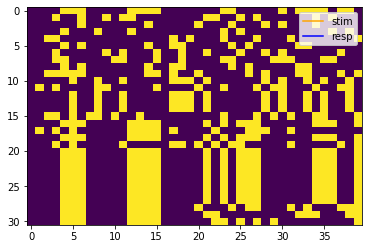

(392,)
(16,)
TRAIN: [  43   46   49   51   52   61   62   65   67   74   76   86   94  100
  104  108  110  114  124  128  132  143  145  156  158  162  163  177
  179  183  187  191  199  204  206  214  217  218  224  226  232  233
  243  249  251  255  258  261  265  268  270  277  283  284  290  291
  295  298  303  304  309  310  311  315  316  324  326  334  337  338
  344  346  352  353  362  363  364  365  366  374  375  377  380  386
  388  392  393  397  399  405  408  411  417  418  419  421  428  430
  433  435  438  441  443  448  449  455  460  463  467  469  470  474
  477  478  485  488  491  497  498  499  501  508  510  513  515  518
  525  528  531  537  538  539  541  548  550  553  555  558  565  568
  571  577  578  579  581  588  590  593  595  598  602  603  605  607
  608  610  613  623  627  629  631  634  635  639  644  645  646  652
  653  654  655  661  663  665  666  667  674  675  676  679  681  683
  685  692  693  694  695  697  702  706  707  708  711  

Filtered.
DMCCA + LCCA : block_0_drpt_0.05_sub_1
LCCA for block_0_drpt_0.05_sub_1_sub_0
CCA Model Started...
0.8634416544930146
CCA Model Ended.
LCCA is : [array(0.86344165), array(0.07213394)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.86344165]
DMCCA + DCCA : block_0_drpt_0.05_sub_1
DCCA for block_0_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0278
  Validation CORRELATION : 0.1309
  Test CORRELATION       : 0.0796
  val. loss is : -0.1309 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0463
  Validation CORRELATION : 0.1235
  Test CORRELATION       : 0.1491
  val. loss is : -0.1235 & the min. loss is : -0.1309
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0507
  Validation CORRELATION : 0.1214
  Test CORRELATION       : 0.1862
  val. loss is : -0.1214 & the min. loss is : -0.1309
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0474
  Validation CORRELATION : 0.1258
  Test CORRELATION       : 0.1697
  val. loss is : -0.1258 & the min. los

DCCA is : [array(0.25670636, dtype=float32), array(0.25670636, dtype=float32)]
DMDC corrs are : [0.25670636]
DONE speech - block_0_drpt_0.05_sub_1.
[[[[0.86344165]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.09334713]
DMCCA + DCCA : block_1_drpt_0.05_sub_1
DCCA for block_1_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0024
  Validation CORRELATION : 0.0320
  Test CORRELATION       : -0.4515
  val. loss is : -0.0320 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0769
  Validation CORRELATION : -0.0586
  Test CORRELATION       : 0.2486
  val. loss is : 0.0586 & the min. loss is : -0.0320
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0754
  Validation CORRELATION : -0.0451
  Test CORRELATION       : 0.2615
  val. loss is : 0.0451 & the min. loss is : -0.0320
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0797
  Validation CORRELATION : -0.0138
  Test CORRELATION       : 0.1844
  val. loss is : 0.0138 & the min. l

  Loaded the model from epoch : 0.

DCCA is : [array(-0.45153674, dtype=float32), array(-0.45153674, dtype=float32)]
DMDC corrs are : [-0.45153674]
DONE speech - block_1_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.97816344]
DMCCA + DCCA : block_2_drpt_0.05_sub_1
DCCA for block_2_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0547
  Validation CORRELATION : -0.0434
  Test CORRELATION       : -0.6382
  val. loss is : 0.0434 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0247
  Validation CORRELATION : 0.0187
  Test CORRELATION       : -0.6494
  val. loss is : -0.0187 & the min. loss is : 0.0434
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0067
  Validation CORRELATION : 0.0538
  Test CORRELATION       : -0.6553
  val. loss is : -0.0538 & the min. loss is : -0.0187
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0062
  Validation CORRELATION : 0.0779
  Test CORRELATION       : -0.6608
  val. loss is : -0.0779 & the min. loss 

  Saved the model at epoch : 19

DCCA is : [array(-0.26498744, dtype=float32), array(-0.26498744, dtype=float32)]
DMDC corrs are : [-0.26498744]
DONE speech - block_2_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.

-0.6510348935425474
CCA Model Ended.
LCCA is : [array(-0.65103489), array(0.26549659)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.65103489]
DMCCA + DCCA : block_3_drpt_0.05_sub_1
DCCA for block_3_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0483
  Validation CORRELATION : 0.0764
  Test CORRELATION       : -0.3415
  val. loss is : -0.0764 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0208
  Validation CORRELATION : 0.1042
  Test CORRELATION       : -0.2621
  val. loss is : -0.1042 & the min. loss is : -0.0764
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0029
  Validation CORRELATION : 0.1179
  Test CORRELATION       : -0.2056
  val. loss is : -0.1179 & the min. loss is : -0.1042
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0100
  Validation CORRELATION : 0.1266
  Test CORRELATION       : -0.1629
  val. loss is : -0.1266 & the min. loss 

  Saved the model at epoch : 19

DCCA is : [array(0.10781745, dtype=float32), array(0.10781745, dtype=float32)]
DMDC corrs are : [0.10781745]
DONE speech - block_3_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.65546246]
DMCCA + DCCA : block_4_drpt_0.05_sub_1
DCCA for block_4_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0110
  Validation CORRELATION : -0.2322
  Test CORRELATION       : -0.2011
  val. loss is : 0.2322 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1327
  Validation CORRELATION : -0.1115
  Test CORRELATION       : -0.1360
  val. loss is : 0.1115 & the min. loss is : 0.2322
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1725
  Validation CORRELATION : -0.0016
  Test CORRELATION       : -0.0376
  val. loss is : 0.0016 & the min. loss is : 0.1115
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1780
  Validation CORRELATION : 0.0535
  Test CORRELATION       : 0.0301
  val. loss is : -0.0535 & the min. loss is : 

DMDC corrs are : [0.1118788]
DONE speech - block_4_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.76881109]
DMCCA + DCCA : block_5_drpt_0.05_sub_1
DCCA for block_5_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0265
  Validation CORRELATION : 0.1939
  Test CORRELATION       : -0.4062
  val. loss is : -0.1939 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0184
  Validation CORRELATION : 0.1971
  Test CORRELATION       : -0.3707
  val. loss is : -0.1971 & the min. loss is : -0.1939
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0114
  Validation CORRELATION : 0.1991
  Test CORRELATION       : -0.3267
  val. loss is : -0.1991 & the min. loss is : -0.1971
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0057
  Validation CORRELATION : 0.1996
  Test CORRELATION       : -0.2788
  val. loss is : -0.1996 & the min. loss 

DMDC corrs are : [-0.27879822]
DONE speech - block_5_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.97551633]
DMCCA + DCCA : block_6_drpt_0.05_sub_1
DCCA for block_6_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0390
  Validation CORRELATION : 0.0215
  Test CORRELATION       : 0.1171
  val. loss is : -0.0215 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0395
  Validation CORRELATION : -0.0215
  Test CORRELATION       : 0.0550
  val. loss is : 0.0215 & the min. loss is : -0.0215
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0301
  Validation CORRELATION : -0.0124
  Test CORRELATION       : 0.0992
  val. loss is : 0.0124 & the min. loss is : -0.0215
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0389
  Validation CORRELATION : -0.0137
  Test CORRELATION       : 0.0721
  val. loss is : 0.0137 & the min. lo

  Loaded the model from epoch : 0.

DCCA is : [array(0.11712559, dtype=float32), array(0.11712559, dtype=float32)]
DMDC corrs are : [0.11712559]
DONE speech - block_6_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.06986171]
DMCCA + DCCA : block_7_drpt_0.05_sub_1
DCCA for block_7_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0276
  Validation CORRELATION : 0.0077
  Test CORRELATION       : 0.4320
  val. loss is : -0.0077 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1219
  Validation CORRELATION : 0.1333
  Test CORRELATION       : 0.3677
  val. loss is : -0.1333 & the min. loss is : -0.0077
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0772
  Validation CORRELATION : 0.0639
  Test CORRELATION       : 0.4054
  val. loss is : -0.0639 & the min. loss is : -0.1333
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0975
  Validation CORRELATION : 0.0837
  Test CORRELATION       : 0.4131
  val. loss is : -0.0837 & the min. loss is 

DMDC corrs are : [0.39702043]
DONE speech - block_7_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.       

DMCCA + LCCA : block_8_drpt_0.05_sub_1
LCCA for block_8_drpt_0.05_sub_1_sub_0
CCA Model Started...
0.671492292362645
CCA Model Ended.
LCCA is : [array(0.67149229), array(0.39571866)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.67149229]
DMCCA + DCCA : block_8_drpt_0.05_sub_1
DCCA for block_8_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0791
  Validation CORRELATION : 0.1060
  Test CORRELATION       : -0.2666
  val. loss is : -0.1060 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0247
  Validation CORRELATION : 0.0985
  Test CORRELATION       : -0.2287
  val. loss is : -0.0985 & the min. loss is : -0.1060
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0025
  Validation CORRELATION : 0.0966
  Test CORRELATION       : -0.1527
  val. loss is : -0.0966 & the min. loss is : -0.1060
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0094
  Validation CORRELATION : 0.0480
  Test CORRELATION       : -0.1683
  val. loss is : -0.0480 & the m

DMDC corrs are : [-0.23577511]
DONE speech - block_8_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.02398509]
DMCCA + DCCA : block_9_drpt_0.05_sub_1
DCCA for block_9_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0241
  Validation CORRELATION : -0.0017
  Test CORRELATION       : -0.0422
  val. loss is : 0.0017 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0174
  Validation CORRELATION : 0.0340
  Test CORRELATION       : -0.0979
  val. loss is : -0.0340 & the min. loss is : 0.0017
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0391
  Validation CORRELATION : 0.0496
  Test CORRELATION       : -0.1205
  val. loss is : -0.0496 & the min. loss is : -0.0340
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0511
  Validation CORRELATION : 0.0578
  Test CORRELATION       : -0.1241
  val. loss is : -0.0578 & the min. loss is

  Saved the model at epoch : 19

DCCA is : [array(-0.05723461, dtype=float32), array(-0.05723461, dtype=float32)]
DMDC corrs are : [-0.05723461]
DONE speech - block_9_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.

DMCCA + LCCA : block_10_drpt_0.05_sub_1
LCCA for block_10_drpt_0.05_sub_1_sub_0
CCA Model Started...
0.028745284805559154
CCA Model Ended.
LCCA is : [array(0.02874528), array(0.09515881)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.02874528]
DMCCA + DCCA : block_10_drpt_0.05_sub_1
DCCA for block_10_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0688
  Validation CORRELATION : 0.0664
  Test CORRELATION       : -0.5056
  val. loss is : -0.0664 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0550
  Validation CORRELATION : -0.0128
  Test CORRELATION       : -0.3164
  val. loss is : 0.0128 & the min. loss is : -0.0664
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0739
  Validation CORRELATION : -0.0089
  Test CORRELATION       : -0.3985
  val. loss is : 0.0089 & the min. loss is : -0.0664
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0401
  Validation CORRELATION : -0.0511
  Test CORRELATION       : -0.2159
  val. loss is : 0.0511 & the mi

  Loaded the model from epoch : 0.

DCCA is : [array(-0.50558, dtype=float32), array(-0.50558, dtype=float32)]
DMDC corrs are : [-0.50558001]
DONE speech - block_10_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.11163826]
DMCCA + DCCA : block_11_drpt_0.05_sub_1
DCCA for block_11_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0470
  Validation CORRELATION : -0.0340
  Test CORRELATION       : -0.2552
  val. loss is : 0.0340 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0627
  Validation CORRELATION : -0.0137
  Test CORRELATION       : -0.2010
  val. loss is : 0.0137 & the min. loss is : 0.0340
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0681
  Validation CORRELATION : -0.0021
  Test CORRELATION       : -0.1775
  val. loss is : 0.0021 & the min. loss is : 0.0137
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0727
  Validation CORRELATION : 0.0070
  Test CORRELATION       : -0.1521
  val. loss is : -0.0070 & the min. loss is

  Saved the model at epoch : 19

DCCA is : [array(0.07093835, dtype=float32), array(0.07093835, dtype=float32)]
DMDC corrs are : [0.07093835]
DONE speech - block_11_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.  

1
Sub: 1
Filtering loaded.
Filtered.
DMCCA + LCCA : block_12_drpt_0.05_sub_1
LCCA for block_12_drpt_0.05_sub_1_sub_0
CCA Model Started...
-0.023580265076932914
CCA Model Ended.
LCCA is : [array(-0.02358027), array(-0.03347944)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.02358027]
DMCCA + DCCA : block_12_drpt_0.05_sub_1
DCCA for block_12_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0437
  Validation CORRELATION : 0.0248
  Test CORRELATION       : 0.2188
  val. loss is : -0.0248 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0582
  Validation CORRELATION : 0.0436
  Test CORRELATION       : 0.1148
  val. loss is : -0.0436 & the min. loss is : -0.0248
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0585
  Validation CORRELATION : 0.0402
  Test CORRELATION       : 0.1113
  val. loss is : -0.0402 & the min. loss is : -0.0436
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0589
  Validation CORRELATION : 0.0424
  Test CORRELATION       : 0.1074
  val. loss is : -0.0424 & the min. l

DMDC corrs are : [0.11479813]
DONE speech - block_12_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.92722434]
DMCCA + DCCA : block_13_drpt_0.05_sub_1
DCCA for block_13_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0170
  Validation CORRELATION : -0.0573
  Test CORRELATION       : 0.5755
  val. loss is : 0.0573 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0158
  Validation CORRELATION : -0.0116
  Test CORRELATION       : 0.6842
  val. loss is : 0.0116 & the min. loss is : 0.0573
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0475
  Validation CORRELATION : -0.0642
  Test CORRELATION       : 0.5816
  val. loss is : 0.0642 & the min. loss is : 0.0116
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0531
  Validation CORRELATION : -0.0778
  Test CORRELATION       : 0.5065
  val. loss is : 0.0778 & the min. loss is

DCCA is : [array(0.6842436, dtype=float32), array(0.6842436, dtype=float32)]
DMDC corrs are : [0.68424362]
DONE speech - block_13_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0. 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.20998247]
DMCCA + DCCA : block_14_drpt_0.05_sub_1
DCCA for block_14_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0248
  Validation CORRELATION : -0.0485
  Test CORRELATION       : 0.2652
  val. loss is : 0.0485 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0447
  Validation CORRELATION : -0.0134
  Test CORRELATION       : 0.4826
  val. loss is : 0.0134 & the min. loss is : 0.0485
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0512
  Validation CORRELATION : -0.0086
  Test CORRELATION       : 0.5296
  val. loss is : 0.0086 & the min. loss is : 0.0134
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0477
  Validation CORRELATION : -0.0061
  Test CORRELATION       : 0.5389
  val. loss is : 0.0061 & the min. loss is : 0

  Loaded the model from epoch : 3.

DCCA is : [array(0.5388918, dtype=float32), array(0.5388918, dtype=float32)]
DMDC corrs are : [0.53889179]
DONE speech - block_14_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0. 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.58319237]
DMCCA + DCCA : block_15_drpt_0.05_sub_1
DCCA for block_15_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0183
  Validation CORRELATION : 0.0183
  Test CORRELATION       : 0.3386
  val. loss is : -0.0183 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0364
  Validation CORRELATION : 0.0358
  Test CORRELATION       : 0.3585
  val. loss is : -0.0358 & the min. loss is : -0.0183
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0473
  Validation CORRELATION : 0.0460
  Test CORRELATION       : 0.3500
  val. loss is : -0.0460 & the min. loss is : -0.0358
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0594
  Validation CORRELATION : 0.0528
  Test CORRELATION       : 0.3316
  val. loss is : -0.0528 & the min. loss is : 

DMDC corrs are : [0.30847672]
DONE speech - block_15_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.      

-0.5836642613905361
CCA Model Ended.
LCCA is : [array(-0.58366426), array(-0.19004484)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.58366426]
DMCCA + DCCA : block_16_drpt_0.05_sub_1
DCCA for block_16_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0941
  Validation CORRELATION : 0.0806
  Test CORRELATION       : 0.1938
  val. loss is : -0.0806 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0292
  Validation CORRELATION : 0.1032
  Test CORRELATION       : -0.0954
  val. loss is : -0.1032 & the min. loss is : -0.0806
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0162
  Validation CORRELATION : 0.1070
  Test CORRELATION       : -0.3190
  val. loss is : -0.1070 & the min. loss is : -0.1032
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0409
  Validation CORRELATION : 0.1011
  Test CORRELATION       : -0.4267
  val. loss is : -0.1011 & the min. loss 

  Loaded the model from epoch : 13.

DCCA is : [array(-0.48381335, dtype=float32), array(-0.48381335, dtype=float32)]
DMDC corrs are : [-0.48381335]
DONE speech - block_16_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.22955728]
DMCCA + DCCA : block_17_drpt_0.05_sub_1
DCCA for block_17_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0660
  Validation CORRELATION : -0.1383
  Test CORRELATION       : 0.2547
  val. loss is : 0.1383 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0693
  Validation CORRELATION : -0.1575
  Test CORRELATION       : 0.2474
  val. loss is : 0.1575 & the min. loss is : 0.1383
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0701
  Validation CORRELATION : -0.1547
  Test CORRELATION       : 0.2520
  val. loss is : 0.1547 & the min. loss is : 0.1383
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0718
  Validation CORRELATION : -0.1433
  Test CORRELATION       : 0.2481
  val. loss is : 0.1433 & the min. l

  Saved the model at epoch : 19

DCCA is : [array(0.06002561, dtype=float32), array(0.06002561, dtype=float32)]
DMDC corrs are : [0.06002561]
DONE speech - block_17_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.40399342]
DMCCA + DCCA : block_18_drpt_0.05_sub_1
DCCA for block_18_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0576
  Validation CORRELATION : -0.0545
  Test CORRELATION       : 0.0457
  val. loss is : 0.0545 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0927
  Validation CORRELATION : -0.0905
  Test CORRELATION       : 0.0391
  val. loss is : 0.0905 & the min. loss is : 0.0545
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0793
  Validation CORRELATION : -0.0831
  Test CORRELATION       : 0.0228
  val. loss is : 0.0831 & the min. loss is : 0.0545
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0948
  Validation CORRELATION : -0.1247
  Test CORRELATION       : 0.0199
  val. loss is : 0.1247 & the min. l

  Loaded the model from epoch : 0.

DCCA is : [array(0.04566144, dtype=float32), array(0.04566144, dtype=float32)]
DMDC corrs are : [0.04566144]
DONE speech - block_18_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0

Filtering loaded.
Filtered.
DMCCA + LCCA : block_19_drpt_0.05_sub_1
LCCA for block_19_drpt_0.05_sub_1_sub_0
CCA Model Started...
-0.28058691892109816
CCA Model Ended.
LCCA is : [array(-0.28058692), array(-0.42453445)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.28058692]
DMCCA + DCCA : block_19_drpt_0.05_sub_1
DCCA for block_19_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0780
  Validation CORRELATION : -0.0323
  Test CORRELATION       : -0.0908
  val. loss is : 0.0323 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0694
  Validation CORRELATION : -0.0069
  Test CORRELATION       : -0.0957
  val. loss is : 0.0069 & the min. loss is : 0.0323
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0701
  Validation CORRELATION : -0.0119
  Test CORRELATION       : -0.1057
  val. loss is : 0.0119 & the min. loss is : 0.0069
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0722
  Validation CORRELATION : -0.0165
  Test CORRELATION       : -0.1097
  val. loss is : 0.0165 & the min. lo

DMDC corrs are : [-0.12094676]
DONE speech - block_19_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.     

Filtering loaded.
Filtered.
DMCCA + LCCA : block_20_drpt_0.05_sub_1
LCCA for block_20_drpt_0.05_sub_1_sub_0
CCA Model Started...
-0.6605430222173461
CCA Model Ended.
LCCA is : [array(-0.66054302), array(0.22040038)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.66054302]
DMCCA + DCCA : block_20_drpt_0.05_sub_1
DCCA for block_20_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0702
  Validation CORRELATION : -0.0728
  Test CORRELATION       : -0.0164
  val. loss is : 0.0728 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0791
  Validation CORRELATION : -0.0661
  Test CORRELATION       : 0.0094
  val. loss is : 0.0661 & the min. loss is : 0.0728
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0830
  Validation CORRELATION : -0.0630
  Test CORRELATION       : 0.0239
  val. loss is : 0.0630 & the min. loss is : 0.0661
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0859
  Validation CORRELATION : -0.0618
  Test CORRELATION       : 0.0253
  val. loss is : 0.0618 & the min. loss is : 

  Saved the model at epoch : 19

DCCA is : [array(0.01990735, dtype=float32), array(0.01990735, dtype=float32)]
DMDC corrs are : [0.01990735]
DONE speech - block_20_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.93447041]
DMCCA + DCCA : block_21_drpt_0.05_sub_1
DCCA for block_21_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0883
  Validation CORRELATION : -0.0458
  Test CORRELATION       : -0.1132
  val. loss is : 0.0458 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0943
  Validation CORRELATION : -0.0250
  Test CORRELATION       : -0.0911
  val. loss is : 0.0250 & the min. loss is : 0.0458
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0970
  Validation CORRELATION : -0.0175
  Test CORRELATION       : -0.0762
  val. loss is : 0.0175 & the min. loss is : 0.0250
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0990
  Validation CORRELATION : -0.0127
  Test CORRELATION       : -0.0659
  val. loss is : 0.0127 & the min. loss is

  Saved the model at epoch : 19

DCCA is : [array(-0.00258137, dtype=float32), array(-0.00258137, dtype=float32)]
DMDC corrs are : [-0.00258137]
DONE speech - block_21_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[ 0.        ]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.40334687]
DMCCA + DCCA : block_22_drpt_0.05_sub_1
DCCA for block_22_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0955
  Validation CORRELATION : -0.0819
  Test CORRELATION       : 0.1131
  val. loss is : 0.0819 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1080
  Validation CORRELATION : -0.0230
  Test CORRELATION       : 0.1776
  val. loss is : 0.0230 & the min. loss is : 0.0819
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1115
  Validation CORRELATION : -0.0515
  Test CORRELATION       : 0.1678
  val. loss is : 0.0515 & the min. loss is : 0.0230
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.1148
  Validation CORRELATION : -0.0435
  Test CORRELATION       : 0.1745
  val. loss is : 0.0435 & the min. loss i

  Saved the model at epoch : 19

DCCA is : [array(0.34511128, dtype=float32), array(0.34511128, dtype=float32)]
DMDC corrs are : [0.34511128]
DONE speech - block_22_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.50137004]
DMCCA + DCCA : block_23_drpt_0.05_sub_1
DCCA for block_23_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0973
  Validation CORRELATION : -0.1155
  Test CORRELATION       : -0.0138
  val. loss is : 0.1155 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1049
  Validation CORRELATION : -0.1070
  Test CORRELATION       : -0.0091
  val. loss is : 0.1070 & the min. loss is : 0.1155
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1081
  Validation CORRELATION : -0.0983
  Test CORRELATION       : -0.0046
  val. loss is : 0.0983 & the min. loss is : 0.1070
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1110
  Validation CORRELATION : -0.0964
  Test CORRELATION       : -0.0040
  val. loss is : 0.0964 & the min. loss is

  Saved the model at epoch : 19

DCCA is : [array(0.04029197, dtype=float32), array(0.04029197, dtype=float32)]
DMDC corrs are : [0.04029197]
DONE speech - block_23_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.6729488]
DMCCA + DCCA : block_24_drpt_0.05_sub_1
DCCA for block_24_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0877
  Validation CORRELATION : -0.1181
  Test CORRELATION       : -0.1775
  val. loss is : 0.1181 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1013
  Validation CORRELATION : -0.1040
  Test CORRELATION       : -0.1330
  val. loss is : 0.1040 & the min. loss is : 0.1181
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1064
  Validation CORRELATION : -0.0945
  Test CORRELATION       : -0.1152
  val. loss is : 0.0945 & the min. loss is : 0.1040
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1098
  Validation CORRELATION : -0.0901
  Test CORRELATION       : -0.1014
  val. loss is : 0.0901 & the min. loss is 

  Saved the model at epoch : 19

DCCA is : [array(0.02445471, dtype=float32), array(0.02445471, dtype=float32)]
DMDC corrs are : [0.02445471]
DONE speech - block_24_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.  

1
Sub: 1
Filtering loaded.
Filtered.
DMCCA + LCCA : block_25_drpt_0.05_sub_1
LCCA for block_25_drpt_0.05_sub_1_sub_0
CCA Model Started...
-0.5339803238496579
CCA Model Ended.
LCCA is : [array(-0.53398032), array(0.09954979)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.53398032]
DMCCA + DCCA : block_25_drpt_0.05_sub_1
DCCA for block_25_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0748
  Validation CORRELATION : -0.0976
  Test CORRELATION       : 0.1378
  val. loss is : 0.0976 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0892
  Validation CORRELATION : -0.0683
  Test CORRELATION       : 0.1253
  val. loss is : 0.0683 & the min. loss is : 0.0976
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0950
  Validation CORRELATION : -0.0522
  Test CORRELATION       : 0.1176
  val. loss is : 0.0522 & the min. loss is : 0.0683
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0992
  Validation CORRELATION : -0.0398
  Test CORRELATION       : 0.1069
  val. loss is : 0.0398 & the min. loss is : 0

  Saved the model at epoch : 19

DCCA is : [array(-0.1235754, dtype=float32), array(-0.1235754, dtype=float32)]
DMDC corrs are : [-0.1235754]
DONE speech - block_25_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.  

1
Sub: 1
Filtering loaded.
Filtered.
DMCCA + LCCA : block_26_drpt_0.05_sub_1
LCCA for block_26_drpt_0.05_sub_1_sub_0
CCA Model Started...
0.2168869026952047
CCA Model Ended.
LCCA is : [array(0.2168869), array(0.31613524)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.2168869]
DMCCA + DCCA : block_26_drpt_0.05_sub_1
DCCA for block_26_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0790
  Validation CORRELATION : -0.1011
  Test CORRELATION       : 0.4120
  val. loss is : 0.1011 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0937
  Validation CORRELATION : -0.0809
  Test CORRELATION       : 0.4214
  val. loss is : 0.0809 & the min. loss is : 0.1011
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0995
  Validation CORRELATION : -0.0692
  Test CORRELATION       : 0.4143
  val. loss is : 0.0692 & the min. loss is : 0.0809
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1032
  Validation CORRELATION : -0.0599
  Test CORRELATION       : 0.4086
  val. loss is : 0.0599 & the min. loss is : 0.0

  Saved the model at epoch : 19

DCCA is : [array(0.37799472, dtype=float32), array(0.37799472, dtype=float32)]
DMDC corrs are : [0.37799472]
DONE speech - block_26_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.40358123]
DMCCA + DCCA : block_27_drpt_0.05_sub_1
DCCA for block_27_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0866
  Validation CORRELATION : -0.1113
  Test CORRELATION       : 0.1364
  val. loss is : 0.1113 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0974
  Validation CORRELATION : -0.0950
  Test CORRELATION       : 0.1333
  val. loss is : 0.0950 & the min. loss is : 0.1113
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1025
  Validation CORRELATION : -0.0833
  Test CORRELATION       : 0.1316
  val. loss is : 0.0833 & the min. loss is : 0.0950
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1059
  Validation CORRELATION : -0.0737
  Test CORRELATION       : 0.1303
  val. loss is : 0.0737 & the min. loss is : 0

  Saved the model at epoch : 19

DCCA is : [array(0.20065098, dtype=float32), array(0.20065098, dtype=float32)]
DMDC corrs are : [0.20065098]
DONE speech - block_27_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.72386939]
DMCCA + DCCA : block_28_drpt_0.05_sub_1
DCCA for block_28_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0653
  Validation CORRELATION : -0.1656
  Test CORRELATION       : -0.1925
  val. loss is : 0.1656 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0786
  Validation CORRELATION : -0.1449
  Test CORRELATION       : -0.1933
  val. loss is : 0.1449 & the min. loss is : 0.1656
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0853
  Validation CORRELATION : -0.1303
  Test CORRELATION       : -0.1902
  val. loss is : 0.1303 & the min. loss is : 0.1449
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0898
  Validation CORRELATION : -0.1170
  Test CORRELATION       : -0.1839
  val. loss is : 0.1170 & the min. loss is

  Saved the model at epoch : 19

DCCA is : [array(-0.0844226, dtype=float32), array(-0.0844226, dtype=float32)]
DMDC corrs are : [-0.0844226]
DONE speech - block_28_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.08898588]
DMCCA + DCCA : block_29_drpt_0.05_sub_1
DCCA for block_29_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.1259
  Validation CORRELATION : 0.0938
  Test CORRELATION       : 0.3088
  val. loss is : -0.0938 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1026
  Validation CORRELATION : -0.0975
  Test CORRELATION       : -0.2944
  val. loss is : 0.0975 & the min. loss is : -0.0938
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0898
  Validation CORRELATION : -0.1438
  Test CORRELATION       : -0.2795
  val. loss is : 0.1438 & the min. loss is : -0.0938
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0834
  Validation CORRELATION : -0.1566
  Test CORRELATION       : -0.3056
  val. loss is : 0.1566 & the m

DCCA is : [array(0.30878848, dtype=float32), array(0.30878848, dtype=float32)]
DMDC corrs are : [0.30878848]
DONE speech - block_29_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.        ]]

  [[-0.50137004]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.69527013]
DMCCA + DCCA : block_30_drpt_0.05_sub_1
DCCA for block_30_drpt_0.05_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0283
  Validation CORRELATION : -0.1360
  Test CORRELATION       : -0.2828
  val. loss is : 0.1360 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0317
  Validation CORRELATION : -0.1209
  Test CORRELATION       : -0.2291
  val. loss is : 0.1209 & the min. loss is : 0.1360
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0353
  Validation CORRELATION : -0.1133
  Test CORRELATION       : -0.1894
  val. loss is : 0.1133 & the min. loss is : 0.1209
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0383
  Validation CORRELATION : -0.1062
  Test CORRELATION       : -0.1522
  val. loss is : 0.1062 & the min. loss is 

  Saved the model at epoch : 19

DCCA is : [array(0.133752, dtype=float32), array(0.133752, dtype=float32)]
DMDC corrs are : [0.133752]
DONE speech - block_30_drpt_0.05_sub_1.
[[[[ 0.86344165]
   [ 0.        ]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.        

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.69614309]
DMCCA + DCCA : block_0_drpt_0.02_sub_1
DCCA for block_0_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0067
  Validation CORRELATION : 0.0580
  Test CORRELATION       : -0.2556
  val. loss is : -0.0580 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0455
  Validation CORRELATION : 0.0405
  Test CORRELATION       : -0.2008
  val. loss is : -0.0405 & the min. loss is : -0.0580
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0435
  Validation CORRELATION : 0.0436
  Test CORRELATION       : -0.2054
  val. loss is : -0.0436 & the min. loss is : -0.0580
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0446
  Validation CORRELATION : 0.0439
  Test CORRELATION       : -0.2036
  val. loss is : -0.0439 & the min

DCCA is : [array(-0.25559497, dtype=float32), array(-0.25559497, dtype=float32)]
DMDC corrs are : [-0.25559497]
DONE speech - block_0_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [ 0.        ]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.        ]]

  [[-0.50137004]
   [

-0.11970850773881798
CCA Model Ended.
LCCA is : [array(-0.11970851), array(-0.07250633)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.11970851]
DMCCA + DCCA : block_1_drpt_0.02_sub_1
DCCA for block_1_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0318
  Validation CORRELATION : 0.1056
  Test CORRELATION       : 0.2377
  val. loss is : -0.1056 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0316
  Validation CORRELATION : 0.1189
  Test CORRELATION       : 0.3854
  val. loss is : -0.1189 & the min. loss is : -0.1056
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0578
  Validation CORRELATION : 0.1573
  Test CORRELATION       : 0.3854
  val. loss is : -0.1573 & the min. loss is : -0.1189
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0777
  Validation CORRELATION : 0.1540
  Test CORRELATION       : 0.3984
  val. loss is : -0.1540 & the min. loss is : -

DCCA is : [array(0.3853623, dtype=float32), array(0.3853623, dtype=float32)]
DMDC corrs are : [0.3853623]
DONE speech - block_1_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [ 0.        ]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.        ]]

  [[-0.50137004]
   [ 0.   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.59281319]
DMCCA + DCCA : block_2_drpt_0.02_sub_1
DCCA for block_2_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.1044
  Validation CORRELATION : -0.1680
  Test CORRELATION       : 0.1429
  val. loss is : 0.1680 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0373
  Validation CORRELATION : -0.2813
  Test CORRELATION       : 0.3144
  val. loss is : 0.2813 & the min. loss is : 0.1680
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0429
  Validation CORRELATION : -0.2562
  Test CORRELATION       : 0.2021
  val. loss is : 0.2562 & the min. loss is : 0.1680
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0396
  Validation CORRELATION : -0.2730
  Test CORRELATION       : 0.2642
  val. loss is : 0.2730 & the min. los

DMDC corrs are : [0.2418766]
DONE speech - block_2_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [ 0.        ]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.        ]]

  [[-0.50137004]
   [ 0.        ]]

  [[-0.6729488 ]
   [ 0.        ]]

  [[-0.53398032]
   [ 0.        

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.96163238]
DMCCA + DCCA : block_3_drpt_0.02_sub_1
DCCA for block_3_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0411
  Validation CORRELATION : 0.2052
  Test CORRELATION       : -0.2147
  val. loss is : -0.2052 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0628
  Validation CORRELATION : -0.1722
  Test CORRELATION       : 0.4927
  val. loss is : 0.1722 & the min. loss is : -0.2052
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0322
  Validation CORRELATION : -0.2523
  Test CORRELATION       : 0.5107
  val. loss is : 0.2523 & the min. loss is : -0.2052
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0311
  Validation CORRELATION : -0.2645
  Test CORRELATION       : 0.4868
  val. loss is : 0.2645 & the min. 

DMDC corrs are : [-0.21467535]
DONE speech - block_3_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.        ]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.        ]]

  [[-0.50137004]
   [ 0.        ]]

  [[-0.6729488 ]
   [ 0.        ]]

  [[-0.53398032]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.91396841]
DMCCA + DCCA : block_4_drpt_0.02_sub_1
DCCA for block_4_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0155
  Validation CORRELATION : -0.1265
  Test CORRELATION       : -0.3165
  val. loss is : 0.1265 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0125
  Validation CORRELATION : -0.1130
  Test CORRELATION       : -0.3581
  val. loss is : 0.1130 & the min. loss is : 0.1265
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0252
  Validation CORRELATION : -0.1030
  Test CORRELATION       : -0.3277
  val. loss is : 0.1030 & the min. loss is : 0.1130
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0331
  Validation CORRELATION : -0.0900
  Test CORRELATION       : -0.3159
  val. loss is : 0.0900 & the min. loss is :

  Saved the model at epoch : 19

DCCA is : [array(-0.65057456, dtype=float32), array(-0.65057456, dtype=float32)]
DMDC corrs are : [-0.65057456]
DONE speech - block_4_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [ 0.        ]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.36350123]
DMCCA + DCCA : block_5_drpt_0.02_sub_1
DCCA for block_5_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.1276
  Validation CORRELATION : -0.1211
  Test CORRELATION       : 0.7025
  val. loss is : 0.1211 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1656
  Validation CORRELATION : -0.0337
  Test CORRELATION       : 0.4860
  val. loss is : 0.0337 & the min. loss is : 0.1211
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1592
  Validation CORRELATION : -0.0507
  Test CORRELATION       : 0.5981
  val. loss is : 0.0507 & the min. loss is : 0.0337
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.1435
  Validation CORRELATION : -0.1398
  Test CORRELATION       : 0.6941
  val. loss is : 0.1398 & the min. loss is 

DMDC corrs are : [0.4824754]
DONE speech - block_5_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.        ]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.        ]]

  [[-0.50137004]
   [ 0.        ]]

  [[-0.6729488 ]
   [ 0.        ]]

  [[-0.53398032]
   [ 0.        

1
Sub: 1
Filtering loaded.
Filtered.
DMCCA + LCCA : block_6_drpt_0.02_sub_1
LCCA for block_6_drpt_0.02_sub_1_sub_0
CCA Model Started...
0.2207466296063494
CCA Model Ended.
LCCA is : [array(0.22074663), array(0.14011778)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.22074663]
DMCCA + DCCA : block_6_drpt_0.02_sub_1
DCCA for block_6_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0602
  Validation CORRELATION : 0.0164
  Test CORRELATION       : 0.1409
  val. loss is : -0.0164 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0846
  Validation CORRELATION : 0.0392
  Test CORRELATION       : 0.1550
  val. loss is : -0.0392 & the min. loss is : -0.0164
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0954
  Validation CORRELATION : 0.0446
  Test CORRELATION       : 0.1598
  val. loss is : -0.0446 & the min. loss is : -0.0392
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1010
  Validation CORRELATION : 0.0454
  Test CORRELATION       : 0.1577
  val. loss is : -0.0454 & the min. loss is : -0.

  Loaded the model from epoch : 3.

DCCA is : [array(0.1576554, dtype=float32), array(0.1576554, dtype=float32)]
DMDC corrs are : [0.1576554]
DONE speech - block_6_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.        ]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.20366701]
DMCCA + DCCA : block_7_drpt_0.02_sub_1
DCCA for block_7_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.1270
  Validation CORRELATION : 0.0560
  Test CORRELATION       : -0.0873
  val. loss is : -0.0560 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.1209
  Validation CORRELATION : 0.0510
  Test CORRELATION       : -0.0841
  val. loss is : -0.0510 & the min. loss is : -0.0560
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.1204
  Validation CORRELATION : 0.0511
  Test CORRELATION       : -0.0836
  val. loss is : -0.0511 & the min. loss is : -0.0560
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.1212
  Validation CORRELATION : 0.0543
  Test CORRELATION       : -0.0821
  val. loss is : -0.0543 & the 

  Loaded the model from epoch : 0.

DCCA is : [array(-0.08728894, dtype=float32), array(-0.08728894, dtype=float32)]
DMDC corrs are : [-0.08728894]
DONE speech - block_7_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.        ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.159472]
DMCCA + DCCA : block_8_drpt_0.02_sub_1
DCCA for block_8_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0844
  Validation CORRELATION : 0.0500
  Test CORRELATION       : 0.4338
  val. loss is : -0.0500 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1094
  Validation CORRELATION : 0.0470
  Test CORRELATION       : 0.3467
  val. loss is : -0.0470 & the min. loss is : -0.0500
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1165
  Validation CORRELATION : 0.0357
  Test CORRELATION       : 0.3571
  val. loss is : -0.0357 & the min. loss is : -0.0500
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.1336
  Validation CORRELATION : 0.1308
  Test CORRELATION       : 0.3157
  val. loss is : -0.1308 & the min. loss 

DCCA is : [array(0.3157407, dtype=float32), array(0.3157407, dtype=float32)]
DMDC corrs are : [0.3157407]
DONE speech - block_8_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.        ]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.        ]]

  [[-0.50137004]
   [ 0.   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.17231137]
DMCCA + DCCA : block_9_drpt_0.02_sub_1
DCCA for block_9_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0906
  Validation CORRELATION : 0.1141
  Test CORRELATION       : -0.3663
  val. loss is : -0.1141 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0690
  Validation CORRELATION : 0.0534
  Test CORRELATION       : -0.2811
  val. loss is : -0.0534 & the min. loss is : -0.1141
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0597
  Validation CORRELATION : 0.0575
  Test CORRELATION       : -0.2310
  val. loss is : -0.0575 & the min. loss is : -0.1141
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0626
  Validation CORRELATION : 0.0577
  Test CORRELATION       : -0.2498
  val. loss is : -0.0577 & the 

  Loaded the model from epoch : 0.

DCCA is : [array(-0.3662977, dtype=float32), array(-0.3662977, dtype=float32)]
DMDC corrs are : [-0.36629769]
DONE speech - block_9_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [ 0.        ]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.71711452]
DMCCA + DCCA : block_10_drpt_0.02_sub_1
DCCA for block_10_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0158
  Validation CORRELATION : 0.1679
  Test CORRELATION       : 0.2740
  val. loss is : -0.1679 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0427
  Validation CORRELATION : 0.1737
  Test CORRELATION       : 0.1074
  val. loss is : -0.1737 & the min. loss is : -0.1679
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0186
  Validation CORRELATION : 0.1562
  Test CORRELATION       : 0.2207
  val. loss is : -0.1562 & the min. loss is : -0.1737
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0271
  Validation CORRELATION : 0.1737
  Test CORRELATION       : 0.1315
  val. loss is : -0.1737 & the min. lo

  Loaded the model from epoch : 3.

DCCA is : [array(0.13150635, dtype=float32), array(0.13150635, dtype=float32)]
DMDC corrs are : [0.13150635]
DONE speech - block_10_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [ 0.        ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.4210584]
DMCCA + DCCA : block_11_drpt_0.02_sub_1
DCCA for block_11_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.1022
  Validation CORRELATION : 0.0744
  Test CORRELATION       : -0.1238
  val. loss is : -0.0744 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0625
  Validation CORRELATION : 0.0095
  Test CORRELATION       : 0.0138
  val. loss is : -0.0095 & the min. loss is : -0.0744
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0655
  Validation CORRELATION : 0.0172
  Test CORRELATION       : -0.0055
  val. loss is : -0.0172 & the min. loss is : -0.0744
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0659
  Validation CORRELATION : 0.0158
  Test CORRELATION       : -0.0063
  val. loss is : -0.0158 & the

  Loaded the model from epoch : 0.

DCCA is : [array(-0.12377262, dtype=float32), array(-0.12377262, dtype=float32)]
DMDC corrs are : [-0.12377262]
DONE speech - block_11_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.        ]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.58279897]
DMCCA + DCCA : block_12_drpt_0.02_sub_1
DCCA for block_12_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0220
  Validation CORRELATION : 0.1941
  Test CORRELATION       : 0.4397
  val. loss is : -0.1941 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0004
  Validation CORRELATION : 0.1804
  Test CORRELATION       : 0.4601
  val. loss is : -0.1804 & the min. loss is : -0.1941
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0034
  Validation CORRELATION : 0.1759
  Test CORRELATION       : 0.4539
  val. loss is : -0.1759 & the min. loss is : -0.1941
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0025
  Validation CORRELATION : 0.1746
  Test CORRELATION       : 0.4513
  val. loss is : -0.1746 & the min. 

  Loaded the model from epoch : 0.

DCCA is : [array(0.43970785, dtype=float32), array(0.43970785, dtype=float32)]
DMDC corrs are : [0.43970785]
DONE speech - block_12_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.        ]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0

1
Sub: 1
Filtering loaded.
Filtered.
DMCCA + LCCA : block_13_drpt_0.02_sub_1
LCCA for block_13_drpt_0.02_sub_1_sub_0
CCA Model Started...
0.8868039936932318
CCA Model Ended.
LCCA is : [array(0.88680399), array(0.10775533)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.88680399]
DMCCA + DCCA : block_13_drpt_0.02_sub_1
DCCA for block_13_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0182
  Validation CORRELATION : 0.1618
  Test CORRELATION       : -0.1615
  val. loss is : -0.1618 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0222
  Validation CORRELATION : 0.1608
  Test CORRELATION       : -0.1728
  val. loss is : -0.1608 & the min. loss is : -0.1618
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0226
  Validation CORRELATION : 0.1595
  Test CORRELATION       : -0.1752
  val. loss is : -0.1595 & the min. loss is : -0.1618
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0223
  Validation CORRELATION : 0.1593
  Test CORRELATION       : -0.1751
  val. loss is : -0.1593 & the mi

DCCA is : [array(-0.16146067, dtype=float32), array(-0.16146067, dtype=float32)]
DMDC corrs are : [-0.16146067]
DONE speech - block_13_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.        ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.        ]]

  [[-0.50137004]
   

1
Sub: 1
Filtering loaded.
Filtered.
DMCCA + LCCA : block_14_drpt_0.02_sub_1
LCCA for block_14_drpt_0.02_sub_1_sub_0
CCA Model Started...
0.5472410984328032
CCA Model Ended.
LCCA is : [array(0.5472411), array(-0.09756841)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.5472411]
DMCCA + DCCA : block_14_drpt_0.02_sub_1
DCCA for block_14_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0207
  Validation CORRELATION : 0.1913
  Test CORRELATION       : -0.0431
  val. loss is : -0.1913 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0269
  Validation CORRELATION : 0.1921
  Test CORRELATION       : -0.0659
  val. loss is : -0.1921 & the min. loss is : -0.1913
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0315
  Validation CORRELATION : 0.1912
  Test CORRELATION       : -0.0866
  val. loss is : -0.1912 & the min. loss is : -0.1921
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0314
  Validation CORRELATION : 0.1911
  Test CORRELATION       : -0.0866
  val. loss is : -0.1911 & the min. los

DMDC corrs are : [-0.06585691]
DONE speech - block_14_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.        ]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.        ]]

  [[-0.50137004]
   [ 0.        ]]

  [[-0.6729488 ]
   [ 0.        ]]

  [[-0.53398032]
   [ 0.     

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.40798552]
DMCCA + DCCA : block_15_drpt_0.02_sub_1
DCCA for block_15_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0368
  Validation CORRELATION : -0.1023
  Test CORRELATION       : -0.7611
  val. loss is : 0.1023 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0466
  Validation CORRELATION : -0.1006
  Test CORRELATION       : -0.7799
  val. loss is : 0.1006 & the min. loss is : 0.1023
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0544
  Validation CORRELATION : -0.0993
  Test CORRELATION       : -0.7933
  val. loss is : 0.0993 & the min. loss is : 0.1006
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0613
  Validation CORRELATION : -0.0978
  Test CORRELATION       : -0.8033
  val. loss is : 0.0978 & the min. loss is 

  Saved the model at epoch : 19

DCCA is : [array(-0.7970732, dtype=float32), array(-0.7970732, dtype=float32)]
DMDC corrs are : [-0.79707319]
DONE speech - block_15_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.        ]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0. 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.79535219]
DMCCA + DCCA : block_16_drpt_0.02_sub_1
DCCA for block_16_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.1086
  Validation CORRELATION : 0.0621
  Test CORRELATION       : 0.1085
  val. loss is : -0.0621 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1153
  Validation CORRELATION : 0.0711
  Test CORRELATION       : 0.0950
  val. loss is : -0.0711 & the min. loss is : -0.0621
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1173
  Validation CORRELATION : 0.0858
  Test CORRELATION       : 0.0979
  val. loss is : -0.0858 & the min. loss is : -0.0711
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1141
  Validation CORRELATION : 0.0985
  Test CORRELATION       : 0.1104
  val. loss is : -0.0985 & the min. loss is : -

  Loaded the model from epoch : 4.

DCCA is : [array(0.10313468, dtype=float32), array(0.10313468, dtype=float32)]
DMDC corrs are : [0.10313468]
DONE speech - block_16_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.        ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.1371097]
DMCCA + DCCA : block_17_drpt_0.02_sub_1
DCCA for block_17_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0636
  Validation CORRELATION : 0.0024
  Test CORRELATION       : 0.0659
  val. loss is : -0.0024 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0599
  Validation CORRELATION : -0.0437
  Test CORRELATION       : 0.0495
  val. loss is : 0.0437 & the min. loss is : -0.0024
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0615
  Validation CORRELATION : -0.0403
  Test CORRELATION       : 0.0570
  val. loss is : 0.0403 & the min. loss is : -0.0024
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0584
  Validation CORRELATION : -0.0397
  Test CORRELATION       : 0.0556
  val. loss is : 0.0397 & the min

DCCA is : [array(-0.00716098, dtype=float32), array(-0.00716098, dtype=float32)]
DMDC corrs are : [-0.00716098]
DONE speech - block_17_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.1371097 ]]

  [[-0.40399342]
   [ 0.        ]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.        ]]

  [[-0.50137004]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.18106657]
DMCCA + DCCA : block_18_drpt_0.02_sub_1
DCCA for block_18_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.1044
  Validation CORRELATION : -0.0442
  Test CORRELATION       : 0.1485
  val. loss is : 0.0442 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1044
  Validation CORRELATION : -0.0475
  Test CORRELATION       : 0.1520
  val. loss is : 0.0475 & the min. loss is : 0.0442
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1046
  Validation CORRELATION : -0.0487
  Test CORRELATION       : 0.1579
  val. loss is : 0.0487 & the min. loss is : 0.0442
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.1051
  Validation CORRELATION : -0.0495
  Test CORRELATION       : 0.1543
  val. loss is : 0.0495 & the min. l

DMDC corrs are : [0.14852279]
DONE speech - block_18_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.1371097 ]]

  [[-0.40399342]
   [-0.18106657]]

  [[-0.28058692]
   [ 0.        ]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.        ]]

  [[-0.50137004]
   [ 0.        ]]

  [[-0.6729488 ]
   [ 0.        ]]

  [[-0.53398032]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.18219168]
DMCCA + DCCA : block_19_drpt_0.02_sub_1
DCCA for block_19_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.1094
  Validation CORRELATION : 0.0970
  Test CORRELATION       : -0.4956
  val. loss is : -0.0970 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1496
  Validation CORRELATION : 0.1022
  Test CORRELATION       : -0.6093
  val. loss is : -0.1022 & the min. loss is : -0.0970
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1573
  Validation CORRELATION : 0.1193
  Test CORRELATION       : -0.5217
  val. loss is : -0.1193 & the min. loss is : -0.1022
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1368
  Validation CORRELATION : 0.1561
  Test CORRELATION       : -0.5360
  val. loss is : -0.1561 & the min. loss is

DCCA is : [array(-0.535984, dtype=float32), array(-0.535984, dtype=float32)]
DMDC corrs are : [-0.53598398]
DONE speech - block_19_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.1371097 ]]

  [[-0.40399342]
   [-0.18106657]]

  [[-0.28058692]
   [ 0.18219168]]

  [[-0.66054302]
   [ 0.        ]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   [ 0.        ]]

  [[-0.50137004]
   [ 0.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.50271488]
DMCCA + DCCA : block_20_drpt_0.02_sub_1
DCCA for block_20_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.1095
  Validation CORRELATION : 0.0036
  Test CORRELATION       : -0.0156
  val. loss is : -0.0036 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1115
  Validation CORRELATION : -0.0013
  Test CORRELATION       : -0.0192
  val. loss is : 0.0013 & the min. loss is : -0.0036
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1114
  Validation CORRELATION : -0.0015
  Test CORRELATION       : -0.0193
  val. loss is : 0.0015 & the min. loss is : -0.0036
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.1119
  Validation CORRELATION : -0.0025
  Test CORRELATION       : -0.0195
  val. loss is : 0.0025 & the mi

  Loaded the model from epoch : 0.

DCCA is : [array(-0.01561749, dtype=float32), array(-0.01561749, dtype=float32)]
DMDC corrs are : [-0.01561749]
DONE speech - block_20_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.1371097 ]]

  [[-0.40399342]
   [-0.18106657]]

  [[-0.28058692]
   [ 0.18219168]]

  [[-0.66054302]
   [ 0.50271488]]

  [[-0.93447041]
   [ 0.        ]]

  [[-0.40334687]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.75775331]
DMCCA + DCCA : block_21_drpt_0.02_sub_1
DCCA for block_21_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.1088
  Validation CORRELATION : 0.0002
  Test CORRELATION       : 0.1772
  val. loss is : -0.0002 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1111
  Validation CORRELATION : -0.0051
  Test CORRELATION       : 0.1719
  val. loss is : 0.0051 & the min. loss is : -0.0002
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1111
  Validation CORRELATION : -0.0053
  Test CORRELATION       : 0.1720
  val. loss is : 0.0053 & the min. loss is : -0.0002
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.1116
  Validation CORRELATION : -0.0064
  Test CORRELATION       : 0.1715
  val. loss is : 0.0064 & the min. 

DCCA is : [array(0.17721975, dtype=float32), array(0.17721975, dtype=float32)]
DMDC corrs are : [0.17721975]
DONE speech - block_21_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.1371097 ]]

  [[-0.40399342]
   [-0.18106657]]

  [[-0.28058692]
   [ 0.18219168]]

  [[-0.66054302]
   [ 0.50271488]]

  [[-0.93447041]
   [-0.75775331]]

  [[-0.40334687]
   [ 0.        ]]

  [[-0.50137004]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.21587221]
DMCCA + DCCA : block_22_drpt_0.02_sub_1
DCCA for block_22_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.1017
  Validation CORRELATION : 0.0373
  Test CORRELATION       : 0.2351
  val. loss is : -0.0373 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1022
  Validation CORRELATION : 0.0324
  Test CORRELATION       : 0.2280
  val. loss is : -0.0324 & the min. loss is : -0.0373
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1022
  Validation CORRELATION : 0.0322
  Test CORRELATION       : 0.2286
  val. loss is : -0.0322 & the min. loss is : -0.0373
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.1026
  Validation CORRELATION : 0.0310
  Test CORRELATION       : 0.2278
  val. loss is : -0.0310 & the min. l

DMDC corrs are : [0.23510098]
DONE speech - block_22_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.1371097 ]]

  [[-0.40399342]
   [-0.18106657]]

  [[-0.28058692]
   [ 0.18219168]]

  [[-0.66054302]
   [ 0.50271488]]

  [[-0.93447041]
   [-0.75775331]]

  [[-0.40334687]
   [ 0.21587221]]

  [[-0.50137004]
   [ 0.        ]]

  [[-0.6729488 ]
   [ 0.        ]]

  [[-0.53398032]
   [ 0.      

1
Sub: 1
Filtering loaded.
Filtered.
DMCCA + LCCA : block_23_drpt_0.02_sub_1
LCCA for block_23_drpt_0.02_sub_1_sub_0
CCA Model Started...
-0.2540546934185857
CCA Model Ended.
LCCA is : [array(-0.25405469), array(0.13360195)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.25405469]
DMCCA + DCCA : block_23_drpt_0.02_sub_1
DCCA for block_23_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.1074
  Validation CORRELATION : 0.0330
  Test CORRELATION       : -0.0896
  val. loss is : -0.0330 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1090
  Validation CORRELATION : 0.0279
  Test CORRELATION       : -0.0999
  val. loss is : -0.0279 & the min. loss is : -0.0330
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1090
  Validation CORRELATION : 0.0276
  Test CORRELATION       : -0.1003
  val. loss is : -0.0276 & the min. loss is : -0.0330
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.1094
  Validation CORRELATION : 0.0267
  Test CORRELATION       : -0.1013
  val. loss is : -0.0267 & the m

  Loaded the model from epoch : 0.

DCCA is : [array(-0.08955292, dtype=float32), array(-0.08955292, dtype=float32)]
DMDC corrs are : [-0.08955292]
DONE speech - block_23_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.1371097 ]]

  [[-0.40399342]
   [-0.18106657]]

  [[-0.28058692]
   [ 0.18219168]]

  [[-0.66054302]
   [ 0.50271488]]

  [[-0.93447041]
   [-0.75775331]]

  [[-0.40334687]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.21468509]
DMCCA + DCCA : block_24_drpt_0.02_sub_1
DCCA for block_24_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.1005
  Validation CORRELATION : 0.0420
  Test CORRELATION       : 0.1436
  val. loss is : -0.0420 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1035
  Validation CORRELATION : 0.0402
  Test CORRELATION       : 0.1330
  val. loss is : -0.0402 & the min. loss is : -0.0420
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1064
  Validation CORRELATION : 0.0484
  Test CORRELATION       : 0.1325
  val. loss is : -0.0484 & the min. loss is : -0.0420
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1218
  Validation CORRELATION : 0.0615
  Test CORRELATION       : 0.1231
  val. loss is : -0.0615 & the min. loss i

DCCA is : [array(0.10332016, dtype=float32), array(0.10332016, dtype=float32)]
DMDC corrs are : [0.10332016]
DONE speech - block_24_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.1371097 ]]

  [[-0.40399342]
   [-0.18106657]]

  [[-0.28058692]
   [ 0.18219168]]

  [[-0.66054302]
   [ 0.50271488]]

  [[-0.93447041]
   [-0.75775331]]

  [[-0.40334687]
   [ 0.21587221]]

  [[-0.50137004]
   [-0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.77762633]
DMCCA + DCCA : block_25_drpt_0.02_sub_1
DCCA for block_25_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.1142
  Validation CORRELATION : -0.0030
  Test CORRELATION       : -0.0528
  val. loss is : 0.0030 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1152
  Validation CORRELATION : -0.0103
  Test CORRELATION       : -0.0550
  val. loss is : 0.0103 & the min. loss is : 0.0030
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1152
  Validation CORRELATION : -0.0106
  Test CORRELATION       : -0.0542
  val. loss is : 0.0106 & the min. loss is : 0.0030
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.1159
  Validation CORRELATION : -0.0117
  Test CORRELATION       : -0.0549
  val. loss is : 0.0117 & the mi

DMDC corrs are : [-0.05283758]
DONE speech - block_25_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.1371097 ]]

  [[-0.40399342]
   [-0.18106657]]

  [[-0.28058692]
   [ 0.18219168]]

  [[-0.66054302]
   [ 0.50271488]]

  [[-0.93447041]
   [-0.75775331]]

  [[-0.40334687]
   [ 0.21587221]]

  [[-0.50137004]
   [-0.25405469]]

  [[-0.6729488 ]
   [ 0.21468509]]

  [[-0.53398032]
   [-0.77762

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.70881484]
DMCCA + DCCA : block_26_drpt_0.02_sub_1
DCCA for block_26_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.1195
  Validation CORRELATION : -0.0644
  Test CORRELATION       : 0.0918
  val. loss is : 0.0644 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1199
  Validation CORRELATION : -0.0700
  Test CORRELATION       : 0.0922
  val. loss is : 0.0700 & the min. loss is : 0.0644
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1199
  Validation CORRELATION : -0.0701
  Test CORRELATION       : 0.0916
  val. loss is : 0.0701 & the min. loss is : 0.0644
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.1204
  Validation CORRELATION : -0.0708
  Test CORRELATION       : 0.0918
  val. loss is : 0.0708 & the min. lo

DMDC corrs are : [0.09176534]
DONE speech - block_26_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.1371097 ]]

  [[-0.40399342]
   [-0.18106657]]

  [[-0.28058692]
   [ 0.18219168]]

  [[-0.66054302]
   [ 0.50271488]]

  [[-0.93447041]
   [-0.75775331]]

  [[-0.40334687]
   [ 0.21587221]]

  [[-0.50137004]
   [-0.25405469]]

  [[-0.6729488 ]
   [ 0.21468509]]

  [[-0.53398032]
   [-0.777626

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.24068098]
DMCCA + DCCA : block_27_drpt_0.02_sub_1
DCCA for block_27_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.1371
  Validation CORRELATION : -0.0795
  Test CORRELATION       : 0.2566
  val. loss is : 0.0795 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1369
  Validation CORRELATION : -0.0845
  Test CORRELATION       : 0.2534
  val. loss is : 0.0845 & the min. loss is : 0.0795
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1368
  Validation CORRELATION : -0.0843
  Test CORRELATION       : 0.2537
  val. loss is : 0.0843 & the min. loss is : 0.0795
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.1375
  Validation CORRELATION : -0.0852
  Test CORRELATION       : 0.2513
  val. loss is : 0.0852 & the min. lo

  Loaded the model from epoch : 0.

DCCA is : [array(0.25656644, dtype=float32), array(0.25656644, dtype=float32)]
DMDC corrs are : [0.25656644]
DONE speech - block_27_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.1371097 ]]

  [[-0.40399342]
   [-0.18106657]]

  [[-0.28058692]
   [ 0.18219168]]

  [[-0.66054302]
   [ 0.50271488]]

  [[-0.93447041]
   [-0.75775331]]

  [[-0.40334687]
   [ 0

Filtering loaded.
Filtered.
DMCCA + LCCA : block_28_drpt_0.02_sub_1
LCCA for block_28_drpt_0.02_sub_1_sub_0
CCA Model Started...
-0.29109953933830873
CCA Model Ended.
LCCA is : [array(-0.29109954), array(-0.54765272)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.29109954]
DMCCA + DCCA : block_28_drpt_0.02_sub_1
DCCA for block_28_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.1396
  Validation CORRELATION : -0.0774
  Test CORRELATION       : -0.1001
  val. loss is : 0.0774 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1488
  Validation CORRELATION : -0.0741
  Test CORRELATION       : -0.1657
  val. loss is : 0.0741 & the min. loss is : 0.0774
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1503
  Validation CORRELATION : -0.0623
  Test CORRELATION       : -0.2121
  val. loss is : 0.0623 & the min. loss is : 0.0741
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1505
  Validation CORRELATION : -0.0619
  Test CORRELATION       : -0.2295
  val. loss is : 0.0619 & the min. loss is

  Loaded the model from epoch : 3.

DCCA is : [array(-0.22949699, dtype=float32), array(-0.22949699, dtype=float32)]
DMDC corrs are : [-0.22949699]
DONE speech - block_28_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.1371097 ]]

  [[-0.40399342]
   [-0.18106657]]

  [[-0.28058692]
   [ 0.18219168]]

  [[-0.66054302]
   [ 0.50271488]]

  [[-0.93447041]
   [-0.75775331]]

  [[-0.40334687]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.60374545]
DMCCA + DCCA : block_29_drpt_0.02_sub_1
DCCA for block_29_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : -0.0331
  Validation CORRELATION : -0.0960
  Test CORRELATION       : 0.3270
  val. loss is : 0.0960 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0119
  Validation CORRELATION : -0.0802
  Test CORRELATION       : 0.3582
  val. loss is : 0.0802 & the min. loss is : 0.0960
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0287
  Validation CORRELATION : -0.0827
  Test CORRELATION       : 0.3730
  val. loss is : 0.0827 & the min. loss is : 0.0802
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0287
  Validation CORRELATION : -0.0832
  Test CORRELATION       : 0.3691
  val. loss is : 0.0832 & the min. loss i

  Saved the model at epoch : 19

DCCA is : [array(-0.38986078, dtype=float32), array(-0.38986078, dtype=float32)]
DMDC corrs are : [-0.38986078]
DONE speech - block_29_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.1371097 ]]

  [[-0.40399342]
   [-0.18106657]]

  [[-0.28058692]
   [ 0.18219168]]

  [[-0.66054302]
   [ 0.50271488]]

  [[-0.93447041]
   [-0.75775331]]

  [[-0.40334687]
   [ 0

0.22194947912584181
CCA Model Ended.
LCCA is : [array(0.22194948), array(-0.6575925)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.22194948]
DMCCA + DCCA : block_30_drpt_0.02_sub_1
DCCA for block_30_drpt_0.02_sub_1_sub_0
seed:     74.0
EPOCH : 0
  Training CORRELATION   : 0.0129
  Validation CORRELATION : -0.0274
  Test CORRELATION       : -0.2896
  val. loss is : 0.0274 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0225
  Validation CORRELATION : -0.0083
  Test CORRELATION       : -0.1986
  val. loss is : 0.0083 & the min. loss is : 0.0274
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0234
  Validation CORRELATION : -0.0121
  Test CORRELATION       : -0.1739
  val. loss is : 0.0121 & the min. loss is : 0.0083
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0233
  Validation CORRELATION : -0.0122
  Test CORRELATION       : -0.1745
  val. loss is : 0.0122 & the min. los

DMDC corrs are : [-0.19863081]
DONE speech - block_30_drpt_0.02_sub_1.
[[[[ 0.86344165]
   [-0.69614309]]

  [[ 0.09334713]
   [-0.11970851]]

  [[-0.97816344]
   [-0.59281319]]

  [[-0.65103489]
   [-0.96163238]]

  [[-0.65546246]
   [ 0.91396841]]

  [[ 0.76881109]
   [-0.36350123]]

  [[ 0.97551633]
   [ 0.22074663]]

  [[ 0.06986171]
   [ 0.20366701]]

  [[ 0.67149229]
   [ 0.159472  ]]

  [[-0.02398509]
   [ 0.17231137]]

  [[ 0.02874528]
   [-0.71711452]]

  [[-0.11163826]
   [-0.4210584 ]]

  [[-0.02358027]
   [ 0.58279897]]

  [[ 0.92722434]
   [ 0.88680399]]

  [[-0.20998247]
   [ 0.5472411 ]]

  [[-0.58319237]
   [ 0.40798552]]

  [[-0.58366426]
   [ 0.79535219]]

  [[-0.22955728]
   [ 0.1371097 ]]

  [[-0.40399342]
   [-0.18106657]]

  [[-0.28058692]
   [ 0.18219168]]

  [[-0.66054302]
   [ 0.50271488]]

  [[-0.93447041]
   [-0.75775331]]

  [[-0.40334687]
   [ 0.21587221]]

  [[-0.50137004]
   [-0.25405469]]

  [[-0.6729488 ]
   [ 0.21468509]]

  [[-0.53398032]
   [-0.77762

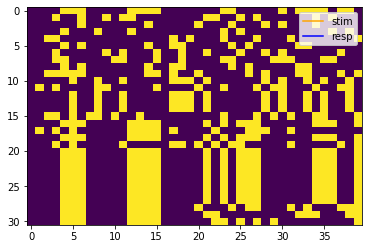

(392,)
(16,)
TRAIN: [  43   46   49   51   52   61   62   65   67   74   76   86   94  100
  104  108  110  114  124  128  132  143  145  156  158  162  163  177
  179  183  187  191  199  204  206  214  217  218  224  226  232  233
  243  249  251  255  258  261  265  268  270  277  283  284  290  291
  295  298  303  304  309  310  311  315  316  324  326  334  337  338
  344  346  352  353  362  363  364  365  366  374  375  377  380  386
  388  392  393  397  399  405  408  411  417  418  419  421  428  430
  433  435  438  441  443  448  449  455  460  463  467  469  470  474
  477  478  485  488  491  497  498  499  501  508  510  513  515  518
  525  528  531  537  538  539  541  548  550  553  555  558  565  568
  571  577  578  579  581  588  590  593  595  598  602  603  605  607
  608  610  613  623  627  629  631  634  635  639  644  645  646  652
  653  654  655  661  663  665  666  667  674  675  676  679  681  683
  685  692  693  694  695  697  702  706  707  708  711  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.05630276]
DMCCA + DCCA : block_0_drpt_0.05_sub_1
DCCA for block_0_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0410
  Validation CORRELATION : -0.1486
  Test CORRELATION       : 0.4508
  val. loss is : 0.1486 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0170
  Validation CORRELATION : -0.1100
  Test CORRELATION       : 0.4539
  val. loss is : 0.1100 & the min. loss is : 0.1486
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0061
  Validation CORRELATION : -0.0639
  Test CORRELATION       : 0.4319
  val. loss is : 0.0639 & the min. loss is : 0.1100
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0248
  Validation CORRELATION : -0.0257
  Test CORRELATION       : 0.3945
  val. loss is : 0.0257 & the min. loss is : 0.

  Saved the model at epoch : 19

DCCA is : [array(-0.0510515, dtype=float32), array(-0.0510515, dtype=float32)]
DMDC corrs are : [-0.0510515]
DONE speech - block_0_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.   

1
Sub: 1
Filtering loaded.
Filtered.
DMCCA + LCCA : block_1_drpt_0.05_sub_1
LCCA for block_1_drpt_0.05_sub_1_sub_0
CCA Model Started...
-0.5071428505031453
CCA Model Ended.
LCCA is : [array(-0.50714285), array(-0.49459164)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.50714285]
DMCCA + DCCA : block_1_drpt_0.05_sub_1
DCCA for block_1_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0092
  Validation CORRELATION : -0.0159
  Test CORRELATION       : 0.3811
  val. loss is : 0.0159 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0074
  Validation CORRELATION : -0.0181
  Test CORRELATION       : 0.4051
  val. loss is : 0.0181 & the min. loss is : 0.0159
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0079
  Validation CORRELATION : -0.0171
  Test CORRELATION       : 0.3979
  val. loss is : 0.0171 & the min. loss is : 0.0159
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0079
  Validation CORRELATION : -0.0175
  Test CORRELATION       : 0.3970
  val. loss is : 0.0175 & the min.

DMDC corrs are : [0.40243608]
DONE speech - block_1_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.       

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.92544894]
DMCCA + DCCA : block_2_drpt_0.05_sub_1
DCCA for block_2_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0857
  Validation CORRELATION : 0.2251
  Test CORRELATION       : -0.1521
  val. loss is : -0.2251 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0745
  Validation CORRELATION : 0.1983
  Test CORRELATION       : -0.0964
  val. loss is : -0.1983 & the min. loss is : -0.2251
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0798
  Validation CORRELATION : 0.2165
  Test CORRELATION       : -0.1174
  val. loss is : -0.2165 & the min. loss is : -0.2251
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0762
  Validation CORRELATION : 0.2092
  Test CORRELATION       : -0.1022
  val. loss is : -0.2092 & the

DMDC corrs are : [-0.15207827]
DONE speech - block_2_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.76550862]
DMCCA + DCCA : block_3_drpt_0.05_sub_1
DCCA for block_3_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0583
  Validation CORRELATION : 0.2020
  Test CORRELATION       : 0.7030
  val. loss is : -0.2020 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0381
  Validation CORRELATION : 0.1697
  Test CORRELATION       : 0.7743
  val. loss is : -0.1697 & the min. loss is : -0.2020
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0436
  Validation CORRELATION : 0.1801
  Test CORRELATION       : 0.7704
  val. loss is : -0.1801 & the min. loss is : -0.2020
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0410
  Validation CORRELATION : 0.1791
  Test CORRELATION       : 0.7743
  val. loss is : -0.1791 & the min

DMDC corrs are : [0.70300996]
DONE speech - block_3_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.       

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.19396309]
DMCCA + DCCA : block_4_drpt_0.05_sub_1
DCCA for block_4_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0350
  Validation CORRELATION : 0.1307
  Test CORRELATION       : 0.1836
  val. loss is : -0.1307 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0837
  Validation CORRELATION : 0.1575
  Test CORRELATION       : 0.0301
  val. loss is : -0.1575 & the min. loss is : -0.1307
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1094
  Validation CORRELATION : 0.1662
  Test CORRELATION       : 0.0045
  val. loss is : -0.1662 & the min. loss is : -0.1575
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1246
  Validation CORRELATION : 0.1646
  Test CORRELATION       : 0.0425
  val. loss is : -0.1646 & the min. loss is : -0.

DMDC corrs are : [0.0180179]
DONE speech - block_4_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.79341329]
DMCCA + DCCA : block_5_drpt_0.05_sub_1
DCCA for block_5_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0135
  Validation CORRELATION : 0.0479
  Test CORRELATION       : -0.3112
  val. loss is : -0.0479 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0241
  Validation CORRELATION : 0.0760
  Test CORRELATION       : -0.1276
  val. loss is : -0.0760 & the min. loss is : -0.0479
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0455
  Validation CORRELATION : 0.0293
  Test CORRELATION       : -0.2795
  val. loss is : -0.0293 & the min. loss is : -0.0760
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0476
  Validation CORRELATION : 0.0151
  Test CORRELATION       : -0.5171
  val. loss is : -0.0151 & the min. los

DCCA is : [array(0.23558831, dtype=float32), array(0.23558831, dtype=float32)]
DMDC corrs are : [0.23558831]
DONE speech - block_5_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.

Filtered.
DMCCA + LCCA : block_6_drpt_0.05_sub_1
LCCA for block_6_drpt_0.05_sub_1_sub_0
CCA Model Started...
-0.6409574883325675
CCA Model Ended.
LCCA is : [array(-0.64095749), array(-0.03618789)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.64095749]
DMCCA + DCCA : block_6_drpt_0.05_sub_1
DCCA for block_6_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0303
  Validation CORRELATION : -0.0449
  Test CORRELATION       : -0.4786
  val. loss is : 0.0449 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0157
  Validation CORRELATION : -0.0163
  Test CORRELATION       : -0.4608
  val. loss is : 0.0163 & the min. loss is : 0.0449
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0284
  Validation CORRELATION : -0.0131
  Test CORRELATION       : -0.4484
  val. loss is : 0.0131 & the min. loss is : 0.0163
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0360
  Validation CORRELATION : -0.0128
  Test CORRELATION       : -0.4400
  val. loss is : 0.0128 & the min. loss is 

DMDC corrs are : [-0.44003597]
DONE speech - block_6_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.65982715]
DMCCA + DCCA : block_7_drpt_0.05_sub_1
DCCA for block_7_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0215
  Validation CORRELATION : -0.0278
  Test CORRELATION       : 0.5990
  val. loss is : 0.0278 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0060
  Validation CORRELATION : -0.0090
  Test CORRELATION       : 0.5346
  val. loss is : 0.0090 & the min. loss is : 0.0278
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0237
  Validation CORRELATION : 0.0050
  Test CORRELATION       : 0.4869
  val. loss is : -0.0050 & the min. loss is : 0.0090
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0357
  Validation CORRELATION : 0.0155
  Test CORRELATION       : 0.4521
  val. loss is : -0.0155 & the min. loss is : -0.

  Saved the model at epoch : 19

DCCA is : [array(0.10289864, dtype=float32), array(0.10289864, dtype=float32)]
DMDC corrs are : [0.10289864]
DONE speech - block_7_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.   

0.460907461010748
CCA Model Ended.
LCCA is : [array(0.46090746), array(-0.10966463)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.46090746]
DMCCA + DCCA : block_8_drpt_0.05_sub_1
DCCA for block_8_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0143
  Validation CORRELATION : 0.0897
  Test CORRELATION       : 0.1053
  val. loss is : -0.0897 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0338
  Validation CORRELATION : 0.1469
  Test CORRELATION       : 0.5842
  val. loss is : -0.1469 & the min. loss is : -0.0897
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0049
  Validation CORRELATION : 0.1235
  Test CORRELATION       : 0.5470
  val. loss is : -0.1235 & the min. loss is : -0.1469
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0145
  Validation CORRELATION : 0.1248
  Test CORRELATION       : 0.5120
  val. loss is : -0.1248 & the min. loss

DMDC corrs are : [0.56242424]
DONE speech - block_8_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.       

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.09468768]
DMCCA + DCCA : block_9_drpt_0.05_sub_1
DCCA for block_9_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0459
  Validation CORRELATION : -0.1209
  Test CORRELATION       : 0.0374
  val. loss is : 0.1209 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0677
  Validation CORRELATION : -0.1695
  Test CORRELATION       : -0.0697
  val. loss is : 0.1695 & the min. loss is : 0.1209
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0628
  Validation CORRELATION : -0.1609
  Test CORRELATION       : -0.0897
  val. loss is : 0.1609 & the min. loss is : 0.1209
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0776
  Validation CORRELATION : -0.1957
  Test CORRELATION       : -0.1120
  val. loss is : 0.1957 & the min. 

DMDC corrs are : [0.0374114]
DONE speech - block_9_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.07609059]
DMCCA + DCCA : block_10_drpt_0.05_sub_1
DCCA for block_10_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0142
  Validation CORRELATION : 0.0461
  Test CORRELATION       : -0.5108
  val. loss is : -0.0461 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0662
  Validation CORRELATION : -0.2144
  Test CORRELATION       : 0.5812
  val. loss is : 0.2144 & the min. loss is : -0.0461
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0687
  Validation CORRELATION : -0.2421
  Test CORRELATION       : 0.6188
  val. loss is : 0.2421 & the min. loss is : -0.0461
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0517
  Validation CORRELATION : -0.1362
  Test CORRELATION       : 0.3734
  val. loss is : 0.1362 & the min.

DMDC corrs are : [-0.51075208]
DONE speech - block_10_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.     

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.95294309]
DMCCA + DCCA : block_11_drpt_0.05_sub_1
DCCA for block_11_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0511
  Validation CORRELATION : 0.0879
  Test CORRELATION       : -0.2201
  val. loss is : -0.0879 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0548
  Validation CORRELATION : 0.0885
  Test CORRELATION       : -0.2135
  val. loss is : -0.0885 & the min. loss is : -0.0879
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0840
  Validation CORRELATION : 0.0599
  Test CORRELATION       : -0.4497
  val. loss is : -0.0599 & the min. loss is : -0.0885
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0748
  Validation CORRELATION : 0.0786
  Test CORRELATION       : -0.2626
  val. loss is : -0.0786 & the min. lo

DCCA is : [array(-0.38785523, dtype=float32), array(-0.38785523, dtype=float32)]
DMDC corrs are : [-0.38785523]
DONE speech - block_11_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.28801989]
DMCCA + DCCA : block_12_drpt_0.05_sub_1
DCCA for block_12_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0128
  Validation CORRELATION : -0.0067
  Test CORRELATION       : -0.1019
  val. loss is : 0.0067 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0252
  Validation CORRELATION : -0.1841
  Test CORRELATION       : 0.1073
  val. loss is : 0.1841 & the min. loss is : 0.0067
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0203
  Validation CORRELATION : -0.1684
  Test CORRELATION       : 0.2429
  val. loss is : 0.1684 & the min. loss is : 0.0067
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0194
  Validation CORRELATION : -0.0918
  Test CORRELATION       : 0.0291
  val. loss is : 0.0918 & the min

  Loaded the model from epoch : 0.

DCCA is : [array(-0.10190638, dtype=float32), array(-0.10190638, dtype=float32)]
DMDC corrs are : [-0.10190638]
DONE speech - block_12_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.62610892]
DMCCA + DCCA : block_13_drpt_0.05_sub_1
DCCA for block_13_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0086
  Validation CORRELATION : -0.0329
  Test CORRELATION       : 0.1638
  val. loss is : 0.0329 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0579
  Validation CORRELATION : -0.1681
  Test CORRELATION       : -0.7422
  val. loss is : 0.1681 & the min. loss is : 0.0329
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0741
  Validation CORRELATION : -0.1856
  Test CORRELATION       : -0.8507
  val. loss is : 0.1856 & the min. loss is : 0.0329
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0505
  Validation CORRELATION : -0.1437
  Test CORRELATION       : -0.8196
  val. loss is : 0.1437 & the mi

DMDC corrs are : [0.16384305]
DONE speech - block_13_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.67884805]
DMCCA + DCCA : block_14_drpt_0.05_sub_1
DCCA for block_14_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0025
  Validation CORRELATION : -0.0766
  Test CORRELATION       : 0.1121
  val. loss is : 0.0766 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0445
  Validation CORRELATION : -0.1732
  Test CORRELATION       : -0.4454
  val. loss is : 0.1732 & the min. loss is : 0.0766
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0412
  Validation CORRELATION : -0.1563
  Test CORRELATION       : -0.4921
  val. loss is : 0.1563 & the min. loss is : 0.0766
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0391
  Validation CORRELATION : -0.1398
  Test CORRELATION       : -0.4061
  val. loss is : 0.1398 & the mi

DMDC corrs are : [0.11211286]
DONE speech - block_14_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.74574409]
DMCCA + DCCA : block_15_drpt_0.05_sub_1
DCCA for block_15_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0509
  Validation CORRELATION : 0.0276
  Test CORRELATION       : -0.7273
  val. loss is : -0.0276 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0112
  Validation CORRELATION : 0.0136
  Test CORRELATION       : -0.6671
  val. loss is : -0.0136 & the min. loss is : -0.0276
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0123
  Validation CORRELATION : 0.0130
  Test CORRELATION       : -0.6770
  val. loss is : -0.0130 & the min. loss is : -0.0276
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0188
  Validation CORRELATION : 0.0189
  Test CORRELATION       : -0.6471
  val. loss is : -0.0189 & the 

  Loaded the model from epoch : 7.

DCCA is : [array(-0.28808323, dtype=float32), array(-0.28808323, dtype=float32)]
DMDC corrs are : [-0.28808323]
DONE speech - block_15_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.36010193]
DMCCA + DCCA : block_16_drpt_0.05_sub_1
DCCA for block_16_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0028
  Validation CORRELATION : 0.0794
  Test CORRELATION       : 0.1364
  val. loss is : -0.0794 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0468
  Validation CORRELATION : 0.1752
  Test CORRELATION       : 0.3235
  val. loss is : -0.1752 & the min. loss is : -0.0794
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0684
  Validation CORRELATION : 0.1850
  Test CORRELATION       : 0.3571
  val. loss is : -0.1850 & the min. loss is : -0.1752
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0840
  Validation CORRELATION : 0.1835
  Test CORRELATION       : 0.3763
  val. loss is : -0.1835 & the min. loss is : -

  Loaded the model from epoch : 10.

DCCA is : [array(0.40755963, dtype=float32), array(0.40755963, dtype=float32)]
DMDC corrs are : [0.40755963]
DONE speech - block_16_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.52492679]
DMCCA + DCCA : block_17_drpt_0.05_sub_1
DCCA for block_17_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0748
  Validation CORRELATION : 0.1043
  Test CORRELATION       : 0.2194
  val. loss is : -0.1043 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0824
  Validation CORRELATION : 0.0866
  Test CORRELATION       : 0.2406
  val. loss is : -0.0866 & the min. loss is : -0.1043
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0841
  Validation CORRELATION : 0.1000
  Test CORRELATION       : 0.2489
  val. loss is : -0.1000 & the min. loss is : -0.1043
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0833
  Validation CORRELATION : 0.0903
  Test CORRELATION       : 0.2426
  val. loss is : -0.0903 & the min. 

  Saved the model at epoch : 19

DCCA is : [array(0.25354013, dtype=float32), array(0.25354013, dtype=float32)]
DMDC corrs are : [0.25354013]
DONE speech - block_17_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.58015696]
DMCCA + DCCA : block_18_drpt_0.05_sub_1
DCCA for block_18_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0290
  Validation CORRELATION : 0.1063
  Test CORRELATION       : 0.1442
  val. loss is : -0.1063 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0791
  Validation CORRELATION : 0.1429
  Test CORRELATION       : 0.2502
  val. loss is : -0.1429 & the min. loss is : -0.1063
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1026
  Validation CORRELATION : 0.1414
  Test CORRELATION       : 0.2998
  val. loss is : -0.1414 & the min. loss is : -0.1429
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.1001
  Validation CORRELATION : 0.1451
  Test CORRELATION       : 0.2920
  val. loss is : -0.1451 & the min. loss 

DMDC corrs are : [0.29199648]
DONE speech - block_18_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.94067573]
DMCCA + DCCA : block_19_drpt_0.05_sub_1
DCCA for block_19_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.1170
  Validation CORRELATION : 0.2308
  Test CORRELATION       : -0.0630
  val. loss is : -0.2308 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0861
  Validation CORRELATION : -0.0031
  Test CORRELATION       : 0.2228
  val. loss is : 0.0031 & the min. loss is : -0.2308
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0845
  Validation CORRELATION : -0.0628
  Test CORRELATION       : 0.3254
  val. loss is : 0.0628 & the min. loss is : -0.2308
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0740
  Validation CORRELATION : -0.0798
  Test CORRELATION       : 0.1982
  val. loss is : 0.0798 & the min

  Loaded the model from epoch : 0.

DCCA is : [array(-0.06297322, dtype=float32), array(-0.06297322, dtype=float32)]
DMDC corrs are : [-0.06297322]
DONE speech - block_19_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.69071381]
DMCCA + DCCA : block_20_drpt_0.05_sub_1
DCCA for block_20_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0884
  Validation CORRELATION : 0.1343
  Test CORRELATION       : -0.1475
  val. loss is : -0.1343 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0600
  Validation CORRELATION : 0.1034
  Test CORRELATION       : -0.1170
  val. loss is : -0.1034 & the min. loss is : -0.1343
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0580
  Validation CORRELATION : 0.0753
  Test CORRELATION       : -0.0918
  val. loss is : -0.0753 & the min. loss is : -0.1343
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0525
  Validation CORRELATION : 0.0856
  Test CORRELATION       : -0.0955
  val. loss is : -0.0856 & t

DMDC corrs are : [-0.14750108]
DONE speech - block_20_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0.     

Filtered.
DMCCA + LCCA : block_21_drpt_0.05_sub_1
LCCA for block_21_drpt_0.05_sub_1_sub_0
CCA Model Started...
-0.615926402424217
CCA Model Ended.
LCCA is : [array(-0.6159264), array(0.16005138)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.6159264]
DMCCA + DCCA : block_21_drpt_0.05_sub_1
DCCA for block_21_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0121
  Validation CORRELATION : 0.0369
  Test CORRELATION       : 0.1843
  val. loss is : -0.0369 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0988
  Validation CORRELATION : -0.1473
  Test CORRELATION       : 0.4238
  val. loss is : 0.1473 & the min. loss is : -0.0369
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0647
  Validation CORRELATION : -0.0236
  Test CORRELATION       : 0.4288
  val. loss is : 0.0236 & the min. loss is : -0.0369
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0472
  Validation CORRELATION : -0.0193
  Test CORRELATION       : 0.4029
  val. loss is : 0.0193 & the min. l

  Loaded the model from epoch : 0.

DCCA is : [array(0.1842578, dtype=float32), array(0.1842578, dtype=float32)]
DMDC corrs are : [0.18425781]
DONE speech - block_21_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[ 0.        ]
   [ 0. 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.40686588]
DMCCA + DCCA : block_22_drpt_0.05_sub_1
DCCA for block_22_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0690
  Validation CORRELATION : 0.0471
  Test CORRELATION       : -0.1122
  val. loss is : -0.0471 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0204
  Validation CORRELATION : -0.0262
  Test CORRELATION       : -0.1549
  val. loss is : 0.0262 & the min. loss is : -0.0471
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0165
  Validation CORRELATION : -0.0298
  Test CORRELATION       : -0.1684
  val. loss is : 0.0298 & the min. loss is : -0.0471
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0117
  Validation CORRELATION : -0.0190
  Test CORRELATION       : -0.1889
  val. loss is : 0.0190 & t

DCCA is : [array(-0.11219631, dtype=float32), array(-0.11219631, dtype=float32)]
DMDC corrs are : [-0.11219631]
DONE speech - block_22_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[ 0.        ]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.32516234]
DMCCA + DCCA : block_23_drpt_0.05_sub_1
DCCA for block_23_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0833
  Validation CORRELATION : 0.0432
  Test CORRELATION       : 0.1774
  val. loss is : -0.0432 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0350
  Validation CORRELATION : -0.0320
  Test CORRELATION       : 0.2334
  val. loss is : 0.0320 & the min. loss is : -0.0432
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0288
  Validation CORRELATION : -0.0357
  Test CORRELATION       : 0.2420
  val. loss is : 0.0357 & the min. loss is : -0.0432
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0242
  Validation CORRELATION : -0.0218
  Test CORRELATION       : 0.2544
  val. loss is : 0.0218 & the m

  Loaded the model from epoch : 0.

DCCA is : [array(0.17735922, dtype=float32), array(0.17735922, dtype=float32)]
DMDC corrs are : [0.17735922]
DONE speech - block_23_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.06239039]
DMCCA + DCCA : block_24_drpt_0.05_sub_1
DCCA for block_24_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0750
  Validation CORRELATION : 0.0268
  Test CORRELATION       : 0.1735
  val. loss is : -0.0268 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0266
  Validation CORRELATION : -0.0300
  Test CORRELATION       : 0.1475
  val. loss is : 0.0300 & the min. loss is : -0.0268
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0331
  Validation CORRELATION : -0.0469
  Test CORRELATION       : 0.1884
  val. loss is : 0.0469 & the min. loss is : -0.0268
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0236
  Validation CORRELATION : -0.0420
  Test CORRELATION       : 0.2097
  val. loss is : 0.0420 & the m

DCCA is : [array(0.17351393, dtype=float32), array(0.17351393, dtype=float32)]
DMDC corrs are : [0.17351393]
DONE speech - block_24_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.58729306]
DMCCA + DCCA : block_25_drpt_0.05_sub_1
DCCA for block_25_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0622
  Validation CORRELATION : 0.0699
  Test CORRELATION       : -0.2778
  val. loss is : -0.0699 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0448
  Validation CORRELATION : -0.0011
  Test CORRELATION       : 0.3831
  val. loss is : 0.0011 & the min. loss is : -0.0699
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0086
  Validation CORRELATION : 0.0348
  Test CORRELATION       : 0.1458
  val. loss is : -0.0348 & the min. loss is : -0.0699
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0085
  Validation CORRELATION : 0.0260
  Test CORRELATION       : 0.1366
  val. loss is : -0.0260 & the mi

DMDC corrs are : [0.00585343]
DONE speech - block_25_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.31888174]
DMCCA + DCCA : block_26_drpt_0.05_sub_1
DCCA for block_26_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0651
  Validation CORRELATION : 0.0391
  Test CORRELATION       : 0.2248
  val. loss is : -0.0391 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0522
  Validation CORRELATION : 0.0237
  Test CORRELATION       : -0.2865
  val. loss is : -0.0237 & the min. loss is : -0.0391
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0213
  Validation CORRELATION : 0.0696
  Test CORRELATION       : -0.1371
  val. loss is : -0.0696 & the min. loss is : -0.0391
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0381
  Validation CORRELATION : 0.0465
  Test CORRELATION       : -0.2478
  val. loss is : -0.0465 & the min. l

DMDC corrs are : [-0.13705289]
DONE speech - block_26_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.     

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.26558078]
DMCCA + DCCA : block_27_drpt_0.05_sub_1
DCCA for block_27_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0673
  Validation CORRELATION : -0.0490
  Test CORRELATION       : -0.0479
  val. loss is : 0.0490 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0942
  Validation CORRELATION : -0.0898
  Test CORRELATION       : -0.0086
  val. loss is : 0.0898 & the min. loss is : 0.0490
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1016
  Validation CORRELATION : -0.0596
  Test CORRELATION       : 0.0163
  val. loss is : 0.0596 & the min. loss is : 0.0490
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0909
  Validation CORRELATION : -0.0855
  Test CORRELATION       : 0.0817
  val. loss is : 0.0855 & the min. 

  Saved the model at epoch : 19

DCCA is : [array(0.04229447, dtype=float32), array(0.04229447, dtype=float32)]
DMDC corrs are : [0.04229447]
DONE speech - block_27_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.94374358]
DMCCA + DCCA : block_28_drpt_0.05_sub_1
DCCA for block_28_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0431
  Validation CORRELATION : 0.0035
  Test CORRELATION       : 0.0953
  val. loss is : -0.0035 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0122
  Validation CORRELATION : -0.0266
  Test CORRELATION       : 0.1740
  val. loss is : 0.0266 & the min. loss is : -0.0035
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0084
  Validation CORRELATION : -0.0240
  Test CORRELATION       : 0.1879
  val. loss is : 0.0240 & the min. loss is : -0.0035
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0080
  Validation CORRELATION : -0.0117
  Test CORRELATION       : 0.2231
  val. loss is : 0.0117 & the mi

DMDC corrs are : [0.09532829]
DONE speech - block_28_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.39918891]
DMCCA + DCCA : block_29_drpt_0.05_sub_1
DCCA for block_29_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0370
  Validation CORRELATION : -0.0824
  Test CORRELATION       : -0.1795
  val. loss is : 0.0824 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0496
  Validation CORRELATION : -0.0935
  Test CORRELATION       : -0.1263
  val. loss is : 0.0935 & the min. loss is : 0.0824
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0556
  Validation CORRELATION : -0.1000
  Test CORRELATION       : -0.0823
  val. loss is : 0.1000 & the min. loss is : 0.0824
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0599
  Validation CORRELATION : -0.0797
  Test CORRELATION       : -0.0922
  val. loss is : 0.0797 & the mi

DMDC corrs are : [0.05623341]
DONE speech - block_29_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.29751924]
DMCCA + DCCA : block_30_drpt_0.05_sub_1
DCCA for block_30_drpt_0.05_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0475
  Validation CORRELATION : 0.0992
  Test CORRELATION       : 0.0034
  val. loss is : -0.0992 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0911
  Validation CORRELATION : 0.0021
  Test CORRELATION       : -0.2245
  val. loss is : -0.0021 & the min. loss is : -0.0992
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0828
  Validation CORRELATION : -0.2501
  Test CORRELATION       : -0.0629
  val. loss is : 0.2501 & the min. loss is : -0.0992
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0834
  Validation CORRELATION : 0.0384
  Test CORRELATION       : -0.3154
  val. loss is : -0.0384 & the mi

  Loaded the model from epoch : 13.

DCCA is : [array(-0.2282786, dtype=float32), array(-0.2282786, dtype=float32)]
DMDC corrs are : [-0.22827861]
DONE speech - block_30_drpt_0.05_sub_1.
[[[[ 0.05630276]
   [ 0.        ]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [

Filtering loaded.
Filtered.
DMCCA + LCCA : block_0_drpt_0.02_sub_1
LCCA for block_0_drpt_0.02_sub_1_sub_0
CCA Model Started...
0.15170607109662465
CCA Model Ended.
LCCA is : [array(0.15170607), array(0.05625187)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.15170607]
DMCCA + DCCA : block_0_drpt_0.02_sub_1
DCCA for block_0_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0700
  Validation CORRELATION : 0.1929
  Test CORRELATION       : -0.0217
  val. loss is : -0.1929 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0789
  Validation CORRELATION : 0.2054
  Test CORRELATION       : -0.0104
  val. loss is : -0.2054 & the min. loss is : -0.1929
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0853
  Validation CORRELATION : 0.2119
  Test CORRELATION       : 0.0019
  val. loss is : -0.2119 & the min. loss is : -0.2054
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0909
  Validation CORRELATION : 0.2155
  Test CORRELATION       : 0.0143
  val. loss is : -0.2155 & the min. loss is : -

DMDC corrs are : [0.04037302]
DONE speech - block_0_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.        ]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.       

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.26793219]
DMCCA + DCCA : block_1_drpt_0.02_sub_1
DCCA for block_1_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.1346
  Validation CORRELATION : -0.0786
  Test CORRELATION       : 0.3419
  val. loss is : 0.0786 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.1172
  Validation CORRELATION : 0.0057
  Test CORRELATION       : 0.4922
  val. loss is : -0.0057 & the min. loss is : 0.0786
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.1073
  Validation CORRELATION : 0.0300
  Test CORRELATION       : 0.5407
  val. loss is : -0.0300 & the min. loss is : -0.0057
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.1017
  Validation CORRELATION : 0.0312
  Test CORRELATION       : 0.5373
  val. loss is : -0.0312 & the min. loss is :

  Saved the model at epoch : 19

DCCA is : [array(0.46298423, dtype=float32), array(0.46298423, dtype=float32)]
DMDC corrs are : [0.46298423]
DONE speech - block_1_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.        ]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.40402015]
DMCCA + DCCA : block_2_drpt_0.02_sub_1
DCCA for block_2_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0011
  Validation CORRELATION : 0.0109
  Test CORRELATION       : 0.3633
  val. loss is : -0.0109 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0588
  Validation CORRELATION : -0.0212
  Test CORRELATION       : 0.1603
  val. loss is : 0.0212 & the min. loss is : -0.0109
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0533
  Validation CORRELATION : -0.0408
  Test CORRELATION       : 0.1525
  val. loss is : 0.0408 & the min. loss is : -0.0109
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0642
  Validation CORRELATION : -0.0250
  Test CORRELATION       : 0.1533
  val. loss is : 0.0250 & the min. lo

DMDC corrs are : [0.36325887]
DONE speech - block_2_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [ 0.        ]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.       

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.66432032]
DMCCA + DCCA : block_3_drpt_0.02_sub_1
DCCA for block_3_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0180
  Validation CORRELATION : -0.0158
  Test CORRELATION       : 0.2057
  val. loss is : 0.0158 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0723
  Validation CORRELATION : -0.0524
  Test CORRELATION       : -0.2991
  val. loss is : 0.0524 & the min. loss is : 0.0158
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0784
  Validation CORRELATION : -0.0650
  Test CORRELATION       : -0.2992
  val. loss is : 0.0650 & the min. loss is : 0.0158
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0689
  Validation CORRELATION : -0.0738
  Test CORRELATION       : -0.2954
  val. loss is : 0.0738 & the min. 

DMDC corrs are : [0.20574303]
DONE speech - block_3_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [ 0.        ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.       

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.1210315]
DMCCA + DCCA : block_4_drpt_0.02_sub_1
DCCA for block_4_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0726
  Validation CORRELATION : -0.0019
  Test CORRELATION       : -0.5127
  val. loss is : 0.0019 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0351
  Validation CORRELATION : -0.1075
  Test CORRELATION       : -0.5333
  val. loss is : 0.1075 & the min. loss is : 0.0019
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0338
  Validation CORRELATION : -0.1148
  Test CORRELATION       : -0.5125
  val. loss is : 0.1148 & the min. loss is : 0.0019
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0446
  Validation CORRELATION : -0.0455
  Test CORRELATION       : -0.4995
  val. loss is : 0.0455 & the m

DMDC corrs are : [-0.51265913]
DONE speech - block_4_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [ 0.        ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.9178469]
DMCCA + DCCA : block_5_drpt_0.02_sub_1
DCCA for block_5_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0757
  Validation CORRELATION : -0.0165
  Test CORRELATION       : -0.0817
  val. loss is : 0.0165 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0326
  Validation CORRELATION : 0.0072
  Test CORRELATION       : 0.0294
  val. loss is : -0.0072 & the min. loss is : 0.0165
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0000
  Validation CORRELATION : 0.0330
  Test CORRELATION       : -0.1326
  val. loss is : -0.0330 & the min. loss is : -0.0072
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0146
  Validation CORRELATION : 0.0434
  Test CORRELATION       : -0.1466
  val. loss is : -0.0434 & the min. loss is 

DMDC corrs are : [-0.20396997]
DONE speech - block_5_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [ 0.        ]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.25908915]
DMCCA + DCCA : block_6_drpt_0.02_sub_1
DCCA for block_6_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.1143
  Validation CORRELATION : 0.0169
  Test CORRELATION       : 0.3950
  val. loss is : -0.0169 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0789
  Validation CORRELATION : -0.0174
  Test CORRELATION       : 0.4184
  val. loss is : 0.0174 & the min. loss is : -0.0169
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0827
  Validation CORRELATION : -0.0164
  Test CORRELATION       : 0.4183
  val. loss is : 0.0164 & the min. loss is : -0.0169
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0831
  Validation CORRELATION : -0.0198
  Test CORRELATION       : 0.4324
  val. loss is : 0.0198 & the min

DMDC corrs are : [0.39498514]
DONE speech - block_6_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [ 0.        ]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.       

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.25552704]
DMCCA + DCCA : block_7_drpt_0.02_sub_1
DCCA for block_7_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0180
  Validation CORRELATION : 0.0156
  Test CORRELATION       : -0.2399
  val. loss is : -0.0156 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0138
  Validation CORRELATION : 0.0189
  Test CORRELATION       : -0.3544
  val. loss is : -0.0189 & the min. loss is : -0.0156
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0108
  Validation CORRELATION : 0.0007
  Test CORRELATION       : -0.3402
  val. loss is : -0.0007 & the min. loss is : -0.0189
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0101
  Validation CORRELATION : 0.0025
  Test CORRELATION       : -0.3413
  val. loss is : -0.0025 & the min.

  Loaded the model from epoch : 1.

DCCA is : [array(-0.35441276, dtype=float32), array(-0.35441276, dtype=float32)]
DMDC corrs are : [-0.35441276]
DONE speech - block_7_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [ 0.        ]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.88366589]
DMCCA + DCCA : block_8_drpt_0.02_sub_1
DCCA for block_8_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0478
  Validation CORRELATION : 0.0417
  Test CORRELATION       : 0.1782
  val. loss is : -0.0417 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0178
  Validation CORRELATION : 0.0608
  Test CORRELATION       : 0.1404
  val. loss is : -0.0608 & the min. loss is : -0.0417
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0311
  Validation CORRELATION : 0.0579
  Test CORRELATION       : 0.1092
  val. loss is : -0.0579 & the min. loss is : -0.0608
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0313
  Validation CORRELATION : 0.0580
  Test CORRELATION       : 0.1098
  val. loss is : -0.0580 & the min. loss i

DCCA is : [array(0.14040506, dtype=float32), array(0.14040506, dtype=float32)]


DMDC corrs are : [0.14040506]
DONE speech - block_8_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.        ]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.       

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.03376227]
DMCCA + DCCA : block_9_drpt_0.02_sub_1
DCCA for block_9_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0721
  Validation CORRELATION : 0.1766
  Test CORRELATION       : 0.0812
  val. loss is : -0.1766 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0541
  Validation CORRELATION : 0.1732
  Test CORRELATION       : -0.0454
  val. loss is : -0.1732 & the min. loss is : -0.1766
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0581
  Validation CORRELATION : 0.1074
  Test CORRELATION       : 0.0024
  val. loss is : -0.1074 & the min. loss is : -0.1766
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0648
  Validation CORRELATION : 0.2075
  Test CORRELATION       : 0.0227
  val. loss is : -0.2075 & the min. l

DMDC corrs are : [0.00486442]
DONE speech - block_9_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [ 0.        ]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.       

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.58474996]
DMCCA + DCCA : block_10_drpt_0.02_sub_1
DCCA for block_10_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0011
  Validation CORRELATION : -0.1058
  Test CORRELATION       : 0.3716
  val. loss is : 0.1058 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0235
  Validation CORRELATION : 0.1095
  Test CORRELATION       : -0.1677
  val. loss is : -0.1095 & the min. loss is : 0.1058
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0243
  Validation CORRELATION : 0.1113
  Test CORRELATION       : -0.0925
  val. loss is : -0.1113 & the min. loss is : -0.1095
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0222
  Validation CORRELATION : 0.1130
  Test CORRELATION       : -0.0670
  val. loss is : -0.1130 & the min. loss

  Saved the model at epoch : 19

DCCA is : [array(-0.22475654, dtype=float32), array(-0.22475654, dtype=float32)]
DMDC corrs are : [-0.22475654]
DONE speech - block_10_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.        ]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.75180515]
DMCCA + DCCA : block_11_drpt_0.02_sub_1
DCCA for block_11_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0684
  Validation CORRELATION : -0.0035
  Test CORRELATION       : -0.4169
  val. loss is : 0.0035 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0898
  Validation CORRELATION : 0.0072
  Test CORRELATION       : -0.2880
  val. loss is : -0.0072 & the min. loss is : 0.0035
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0777
  Validation CORRELATION : 0.0308
  Test CORRELATION       : -0.3051
  val. loss is : -0.0308 & the min. loss is : -0.0072
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0833
  Validation CORRELATION : 0.0297
  Test CORRELATION       : -0.3241
  val. loss is : -0.0297 & the min. loss is

DMDC corrs are : [-0.32267109]
DONE speech - block_11_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [ 0.        ]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.     

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.13031787]
DMCCA + DCCA : block_12_drpt_0.02_sub_1
DCCA for block_12_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0264
  Validation CORRELATION : -0.0614
  Test CORRELATION       : -0.0846
  val. loss is : 0.0614 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0197
  Validation CORRELATION : -0.0528
  Test CORRELATION       : -0.1873
  val. loss is : 0.0528 & the min. loss is : 0.0614
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0494
  Validation CORRELATION : -0.0272
  Test CORRELATION       : -0.2083
  val. loss is : 0.0272 & the min. loss is : 0.0528
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0617
  Validation CORRELATION : -0.0047
  Test CORRELATION       : -0.2449
  val. loss is : 0.0047 & the min. loss i

  Saved the model at epoch : 19

DCCA is : [array(-0.478162, dtype=float32), array(-0.478162, dtype=float32)]
DMDC corrs are : [-0.47816199]
DONE speech - block_12_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [ 0.        ]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.   

Filtered.
DMCCA + LCCA : block_13_drpt_0.02_sub_1
LCCA for block_13_drpt_0.02_sub_1_sub_0
CCA Model Started...
-0.6372544195132555
CCA Model Ended.
LCCA is : [array(-0.63725442), array(0.01332092)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.63725442]
DMCCA + DCCA : block_13_drpt_0.02_sub_1
DCCA for block_13_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0031
  Validation CORRELATION : -0.0570
  Test CORRELATION       : 0.0894
  val. loss is : 0.0570 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0362
  Validation CORRELATION : -0.0441
  Test CORRELATION       : 0.2863
  val. loss is : 0.0441 & the min. loss is : 0.0570
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0511
  Validation CORRELATION : -0.0459
  Test CORRELATION       : 0.4507
  val. loss is : 0.0459 & the min. loss is : 0.0441
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0532
  Validation CORRELATION : -0.0321
  Test CORRELATION       : 0.3440
  val. loss is : 0.0321 & the min. loss 

  Saved the model at epoch : 19

DCCA is : [array(0.26317436, dtype=float32), array(0.26317436, dtype=float32)]
DMDC corrs are : [0.26317436]
DONE speech - block_13_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [ 0.        ]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.69821231]
DMCCA + DCCA : block_14_drpt_0.02_sub_1
DCCA for block_14_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0011
  Validation CORRELATION : -0.0819
  Test CORRELATION       : 0.1610
  val. loss is : 0.0819 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0362
  Validation CORRELATION : -0.0943
  Test CORRELATION       : 0.4615
  val. loss is : 0.0943 & the min. loss is : 0.0819
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0359
  Validation CORRELATION : -0.0949
  Test CORRELATION       : 0.4649
  val. loss is : 0.0949 & the min. loss is : 0.0819
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0330
  Validation CORRELATION : -0.0810
  Test CORRELATION       : 0.3629
  val. loss is : 0.0810 & the min. 

  Saved the model at epoch : 19

DCCA is : [array(0.00867034, dtype=float32), array(0.00867034, dtype=float32)]
DMDC corrs are : [0.00867034]
DONE speech - block_14_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [ 0.        ]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.59669761]
DMCCA + DCCA : block_15_drpt_0.02_sub_1
DCCA for block_15_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0361
  Validation CORRELATION : -0.0332
  Test CORRELATION       : 0.4674
  val. loss is : 0.0332 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0723
  Validation CORRELATION : -0.1910
  Test CORRELATION       : 0.1246
  val. loss is : 0.1910 & the min. loss is : 0.0332
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0718
  Validation CORRELATION : -0.1879
  Test CORRELATION       : 0.1200
  val. loss is : 0.1879 & the min. loss is : 0.0332
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0866
  Validation CORRELATION : -0.2157
  Test CORRELATION       : 0.0301
  val. loss is : 0.2157 & the min. 

DMDC corrs are : [0.46740893]
DONE speech - block_15_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [ 0.        ]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.      

1
Sub: 1
Filtering loaded.
Filtered.
DMCCA + LCCA : block_16_drpt_0.02_sub_1
LCCA for block_16_drpt_0.02_sub_1_sub_0
CCA Model Started...
-0.013038969705500843
CCA Model Ended.
LCCA is : [array(-0.01303897), array(-0.41322742)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.01303897]
DMCCA + DCCA : block_16_drpt_0.02_sub_1
DCCA for block_16_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0113
  Validation CORRELATION : 0.2534
  Test CORRELATION       : -0.1347
  val. loss is : -0.2534 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0802
  Validation CORRELATION : 0.2606
  Test CORRELATION       : -0.3765
  val. loss is : -0.2606 & the min. loss is : -0.2534
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1223
  Validation CORRELATION : 0.1274
  Test CORRELATION       : -0.5777
  val. loss is : -0.1274 & the min. loss is : -0.2606
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.1112
  Validation CORRELATION : 0.1868
  Test CORRELATION       : -0.5254
  val. loss is : -0.1868 & the min. l

DCCA is : [array(-0.37647343, dtype=float32), array(-0.37647343, dtype=float32)]
DMDC corrs are : [-0.37647343]
DONE speech - block_16_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [ 0.        ]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.41180317]
DMCCA + DCCA : block_17_drpt_0.02_sub_1
DCCA for block_17_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0467
  Validation CORRELATION : -0.0025
  Test CORRELATION       : -0.2410
  val. loss is : 0.0025 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0259
  Validation CORRELATION : -0.0211
  Test CORRELATION       : -0.3078
  val. loss is : 0.0211 & the min. loss is : 0.0025
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0477
  Validation CORRELATION : 0.0473
  Test CORRELATION       : -0.1361
  val. loss is : -0.0473 & the min. loss is : 0.0025
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0446
  Validation CORRELATION : 0.0491
  Test CORRELATION       : -0.1107
  val. loss is : -0.0491 & the min. lo

DMDC corrs are : [-0.0449357]
DONE speech - block_17_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [-0.41180317]]

  [[-0.58015696]
   [ 0.        ]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.16304071]
DMCCA + DCCA : block_18_drpt_0.02_sub_1
DCCA for block_18_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0811
  Validation CORRELATION : 0.0413
  Test CORRELATION       : 0.2240
  val. loss is : -0.0413 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1129
  Validation CORRELATION : 0.0358
  Test CORRELATION       : 0.1391
  val. loss is : -0.0358 & the min. loss is : -0.0413
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.1188
  Validation CORRELATION : -0.0028
  Test CORRELATION       : 0.0968
  val. loss is : 0.0028 & the min. loss is : -0.0413
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0974
  Validation CORRELATION : 0.0543
  Test CORRELATION       : 0.1935
  val. loss is : -0.0543 & the min. 

  Loaded the model from epoch : 18.

DCCA is : [array(0.18088496, dtype=float32), array(0.18088496, dtype=float32)]
DMDC corrs are : [0.18088496]
DONE speech - block_18_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [-0.41180317]]

  [[-0.58015696]
   [-0.16304071]]

  [[-0.94067573]
   [ 0.        ]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.63150333]
DMCCA + DCCA : block_19_drpt_0.02_sub_1
DCCA for block_19_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0185
  Validation CORRELATION : 0.0545
  Test CORRELATION       : 0.0297
  val. loss is : -0.0545 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0355
  Validation CORRELATION : 0.0358
  Test CORRELATION       : 0.1391
  val. loss is : -0.0358 & the min. loss is : -0.0545
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0239
  Validation CORRELATION : 0.0357
  Test CORRELATION       : 0.1315
  val. loss is : -0.0357 & the min. loss is : -0.0545
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0153
  Validation CORRELATION : 0.0356
  Test CORRELATION       : 0.1378
  val. loss is : -0.0356 & the min. l

  Loaded the model from epoch : 11.

DCCA is : [array(0.1448637, dtype=float32), array(0.1448637, dtype=float32)]
DMDC corrs are : [0.14486369]
DONE speech - block_19_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [-0.41180317]]

  [[-0.58015696]
   [-0.16304071]]

  [[-0.94067573]
   [ 0.63150333]]

  [[-0.69071381]
   [ 0.        ]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.06242586]
DMCCA + DCCA : block_20_drpt_0.02_sub_1
DCCA for block_20_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0258
  Validation CORRELATION : 0.1280
  Test CORRELATION       : 0.1203
  val. loss is : -0.1280 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0719
  Validation CORRELATION : 0.0342
  Test CORRELATION       : 0.0608
  val. loss is : -0.0342 & the min. loss is : -0.1280
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0485
  Validation CORRELATION : -0.0207
  Test CORRELATION       : -0.0357
  val. loss is : 0.0207 & the min. loss is : -0.1280
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0470
  Validation CORRELATION : 0.1397
  Test CORRELATION       : 0.0327
  val. loss is : -0.1397 & the min. 

  Saved the model at epoch : 19

DCCA is : [array(-0.08043145, dtype=float32), array(-0.08043145, dtype=float32)]
DMDC corrs are : [-0.08043145]
DONE speech - block_20_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [-0.41180317]]

  [[-0.58015696]
   [-0.16304071]]

  [[-0.94067573]
   [ 0.63150333]]

  [[-0.69071381]
   [ 0.06242586]]

  [[-0.6159264 ]
   [ 0.        ]]

  [[-0.40686588]
   [ 0

-0.1547000779551083
CCA Model Ended.
LCCA is : [array(-0.15470008), array(0.09776852)]


/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.15470008]
DMCCA + DCCA : block_21_drpt_0.02_sub_1
DCCA for block_21_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0065
  Validation CORRELATION : 0.1989
  Test CORRELATION       : 0.2317
  val. loss is : -0.1989 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0263
  Validation CORRELATION : 0.2002
  Test CORRELATION       : 0.2118
  val. loss is : -0.2002 & the min. loss is : -0.1989
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0357
  Validation CORRELATION : 0.1975
  Test CORRELATION       : 0.1996
  val. loss is : -0.1975 & the min. loss is : -0.2002
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0374
  Validation CORRELATION : 0.1890
  Test CORRELATION       : 0.1808
  val. loss is : -0.1890 & the min. loss

DMDC corrs are : [0.21086124]
DONE speech - block_21_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [-0.41180317]]

  [[-0.58015696]
   [-0.16304071]]

  [[-0.94067573]
   [ 0.63150333]]

  [[-0.69071381]
   [ 0.06242586]]

  [[-0.6159264 ]
   [-0.15470008]]

  [[-0.40686588]
   [ 0.        ]]

  [[-0.32516234]
   [ 0.        ]]

  [[-0.06239039]
   [ 0.        ]]

  [[-0.58729306]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.35949408]
DMCCA + DCCA : block_22_drpt_0.02_sub_1
DCCA for block_22_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0009
  Validation CORRELATION : 0.2152
  Test CORRELATION       : -0.2777
  val. loss is : -0.2152 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0338
  Validation CORRELATION : 0.2213
  Test CORRELATION       : -0.2649
  val. loss is : -0.2213 & the min. loss is : -0.2152
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0437
  Validation CORRELATION : 0.2273
  Test CORRELATION       : -0.2817
  val. loss is : -0.2273 & the min. loss is : -0.2213
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0488
  Validation CORRELATION : 0.2245
  Test CORRELATION       : -0.2876
  val. loss is : -0.2245 & the min. loss is

DCCA is : [array(-0.301856, dtype=float32), array(-0.301856, dtype=float32)]
DMDC corrs are : [-0.30185601]
DONE speech - block_22_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [-0.41180317]]

  [[-0.58015696]
   [-0.16304071]]

  [[-0.94067573]
   [ 0.63150333]]

  [[-0.69071381]
   [ 0.06242586]]

  [[-0.6159264 ]
   [-0.15470008]]

  [[-0.40686588]
   [ 0.35949408]]

  [[-0.32516234]
   [ 0.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.22923652]
DMCCA + DCCA : block_23_drpt_0.02_sub_1
DCCA for block_23_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0147
  Validation CORRELATION : 0.1071
  Test CORRELATION       : 0.4598
  val. loss is : -0.1071 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0189
  Validation CORRELATION : 0.0783
  Test CORRELATION       : 0.5399
  val. loss is : -0.0783 & the min. loss is : -0.1071
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0431
  Validation CORRELATION : 0.1130
  Test CORRELATION       : 0.6158
  val. loss is : -0.1130 & the min. loss is : -0.1071
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0656
  Validation CORRELATION : 0.0795
  Test CORRELATION       : 0.5289
  val. loss is : -0.0795 & the min. loss 

  Loaded the model from epoch : 2.

DCCA is : [array(0.6158487, dtype=float32), array(0.6158487, dtype=float32)]
DMDC corrs are : [0.61584872]
DONE speech - block_23_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [-0.41180317]]

  [[-0.58015696]
   [-0.16304071]]

  [[-0.94067573]
   [ 0.63150333]]

  [[-0.69071381]
   [ 0.06242586]]

  [[-0.6159264 ]
   [-0.15470008]]

  [[-0.40686588]
   [ 0.3

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.28038122]
DMCCA + DCCA : block_24_drpt_0.02_sub_1
DCCA for block_24_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0260
  Validation CORRELATION : 0.1109
  Test CORRELATION       : 0.2622
  val. loss is : -0.1109 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0150
  Validation CORRELATION : 0.0905
  Test CORRELATION       : 0.1652
  val. loss is : -0.0905 & the min. loss is : -0.1109
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0511
  Validation CORRELATION : 0.0850
  Test CORRELATION       : 0.0398
  val. loss is : -0.0850 & the min. loss is : -0.1109
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0501
  Validation CORRELATION : 0.0912
  Test CORRELATION       : 0.0393
  val. loss is : -0.0912 & the min. 

DMDC corrs are : [0.26215374]
DONE speech - block_24_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [-0.41180317]]

  [[-0.58015696]
   [-0.16304071]]

  [[-0.94067573]
   [ 0.63150333]]

  [[-0.69071381]
   [ 0.06242586]]

  [[-0.6159264 ]
   [-0.15470008]]

  [[-0.40686588]
   [ 0.35949408]]

  [[-0.32516234]
   [ 0.22923652]]

  [[-0.06239039]
   [ 0.28038122]]

  [[-0.58729306]
   [ 0.      

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.91243426]
DMCCA + DCCA : block_25_drpt_0.02_sub_1
DCCA for block_25_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0068
  Validation CORRELATION : 0.0451
  Test CORRELATION       : 0.1638
  val. loss is : -0.0451 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0321
  Validation CORRELATION : 0.0255
  Test CORRELATION       : 0.2423
  val. loss is : -0.0255 & the min. loss is : -0.0451
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0565
  Validation CORRELATION : 0.0358
  Test CORRELATION       : 0.2924
  val. loss is : -0.0358 & the min. loss is : -0.0451
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0568
  Validation CORRELATION : 0.0414
  Test CORRELATION       : 0.2922
  val. loss is : -0.0414 & the min.

  Loaded the model from epoch : 0.

DCCA is : [array(0.16377802, dtype=float32), array(0.16377802, dtype=float32)]
DMDC corrs are : [0.16377802]
DONE speech - block_25_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [-0.41180317]]

  [[-0.58015696]
   [-0.16304071]]

  [[-0.94067573]
   [ 0.63150333]]

  [[-0.69071381]
   [ 0.06242586]]

  [[-0.6159264 ]
   [-0.15470008]]

  [[-0.40686588]
   [ 0

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.27463332]
DMCCA + DCCA : block_26_drpt_0.02_sub_1
DCCA for block_26_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0225
  Validation CORRELATION : -0.0293
  Test CORRELATION       : 0.2710
  val. loss is : 0.0293 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0047
  Validation CORRELATION : -0.0474
  Test CORRELATION       : 0.3878
  val. loss is : 0.0474 & the min. loss is : 0.0293
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0174
  Validation CORRELATION : 0.0103
  Test CORRELATION       : 0.5109
  val. loss is : -0.0103 & the min. loss is : 0.0293
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0352
  Validation CORRELATION : 0.0410
  Test CORRELATION       : 0.5959
  val. loss is : -0.0410 & the min. loss i

DMDC corrs are : [0.3996774]
DONE speech - block_26_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [-0.41180317]]

  [[-0.58015696]
   [-0.16304071]]

  [[-0.94067573]
   [ 0.63150333]]

  [[-0.69071381]
   [ 0.06242586]]

  [[-0.6159264 ]
   [-0.15470008]]

  [[-0.40686588]
   [ 0.35949408]]

  [[-0.32516234]
   [ 0.22923652]]

  [[-0.06239039]
   [ 0.28038122]]

  [[-0.58729306]
   [-0.9124342

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.97172585]
DMCCA + DCCA : block_27_drpt_0.02_sub_1
DCCA for block_27_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0093
  Validation CORRELATION : -0.0432
  Test CORRELATION       : -0.3944
  val. loss is : 0.0432 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0315
  Validation CORRELATION : -0.0668
  Test CORRELATION       : -0.3303
  val. loss is : 0.0668 & the min. loss is : 0.0432
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0415
  Validation CORRELATION : -0.0189
  Test CORRELATION       : -0.2694
  val. loss is : 0.0189 & the min. loss is : 0.0432
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0519
  Validation CORRELATION : -0.0024
  Test CORRELATION       : -0.1934
  val. loss is : 0.0024 & the min. lo

  Loaded the model from epoch : 10.

DCCA is : [array(-0.03231608, dtype=float32), array(-0.03231608, dtype=float32)]
DMDC corrs are : [-0.03231608]
DONE speech - block_27_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [-0.41180317]]

  [[-0.58015696]
   [-0.16304071]]

  [[-0.94067573]
   [ 0.63150333]]

  [[-0.69071381]
   [ 0.06242586]]

  [[-0.6159264 ]
   [-0.15470008]]

  [[-0.40686588]
  

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.6457949]
DMCCA + DCCA : block_28_drpt_0.02_sub_1
DCCA for block_28_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0076
  Validation CORRELATION : -0.0446
  Test CORRELATION       : -0.0672
  val. loss is : 0.0446 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0242
  Validation CORRELATION : -0.0560
  Test CORRELATION       : -0.1271
  val. loss is : 0.0560 & the min. loss is : 0.0446
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0410
  Validation CORRELATION : 0.0181
  Test CORRELATION       : -0.1398
  val. loss is : -0.0181 & the min. loss is : 0.0446
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0526
  Validation CORRELATION : 0.0401
  Test CORRELATION       : -0.1529
  val. loss is : -0.0401 & the min. lo

DMDC corrs are : [-0.16224247]
DONE speech - block_28_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [-0.41180317]]

  [[-0.58015696]
   [-0.16304071]]

  [[-0.94067573]
   [ 0.63150333]]

  [[-0.69071381]
   [ 0.06242586]]

  [[-0.6159264 ]
   [-0.15470008]]

  [[-0.40686588]
   [ 0.35949408]]

  [[-0.32516234]
   [ 0.22923652]]

  [[-0.06239039]
   [ 0.28038122]]

  [[-0.58729306]
   [-0.91243

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [-0.10188044]
DMCCA + DCCA : block_29_drpt_0.02_sub_1
DCCA for block_29_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : 0.0510
  Validation CORRELATION : 0.0403
  Test CORRELATION       : 0.1409
  val. loss is : -0.0403 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1207
  Validation CORRELATION : 0.0435
  Test CORRELATION       : 0.1144
  val. loss is : -0.0435 & the min. loss is : -0.0403
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1381
  Validation CORRELATION : 0.0563
  Test CORRELATION       : 0.1095
  val. loss is : -0.0563 & the min. loss is : -0.0435
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1520
  Validation CORRELATION : 0.0766
  Test CORRELATION       : 0.1191
  val. loss is : -0.0766 & the min. loss is : 

DMDC corrs are : [0.08792032]
DONE speech - block_29_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [-0.41180317]]

  [[-0.58015696]
   [-0.16304071]]

  [[-0.94067573]
   [ 0.63150333]]

  [[-0.69071381]
   [ 0.06242586]]

  [[-0.6159264 ]
   [-0.15470008]]

  [[-0.40686588]
   [ 0.35949408]]

  [[-0.32516234]
   [ 0.22923652]]

  [[-0.06239039]
   [ 0.28038122]]

  [[-0.58729306]
   [-0.912434

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DMLC corrs are : [0.7013578]
DMCCA + DCCA : block_30_drpt_0.02_sub_1
DCCA for block_30_drpt_0.02_sub_1_sub_0
seed:     43.0
EPOCH : 0
  Training CORRELATION   : -0.0169
  Validation CORRELATION : -0.1471
  Test CORRELATION       : -0.1507
  val. loss is : 0.1471 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.1096
  Validation CORRELATION : -0.0423
  Test CORRELATION       : -0.2932
  val. loss is : 0.0423 & the min. loss is : 0.1471
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.1312
  Validation CORRELATION : 0.0043
  Test CORRELATION       : -0.2038
  val. loss is : -0.0043 & the min. loss is : 0.0423
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.1377
  Validation CORRELATION : 0.0280
  Test CORRELATION       : -0.1241
  val. loss is : -0.0280 & the min. loss is 

  Loaded the model from epoch : 12.

DCCA is : [array(-0.06879427, dtype=float32), array(-0.06879427, dtype=float32)]
DMDC corrs are : [-0.06879427]
DONE speech - block_30_drpt_0.02_sub_1.
[[[[ 0.05630276]
   [ 0.15170607]]

  [[-0.50714285]
   [ 0.26793219]]

  [[-0.92544894]
   [ 0.40402015]]

  [[-0.76550862]
   [-0.66432032]]

  [[ 0.19396309]
   [-0.1210315 ]]

  [[ 0.79341329]
   [-0.9178469 ]]

  [[-0.64095749]
   [-0.25908915]]

  [[ 0.65982715]
   [-0.25552704]]

  [[ 0.46090746]
   [-0.88366589]]

  [[-0.09468768]
   [ 0.03376227]]

  [[ 0.07609059]
   [-0.58474996]]

  [[ 0.95294309]
   [ 0.75180515]]

  [[-0.28801989]
   [-0.13031787]]

  [[-0.62610892]
   [-0.63725442]]

  [[-0.67884805]
   [-0.69821231]]

  [[-0.74574409]
   [-0.59669761]]

  [[ 0.36010193]
   [-0.01303897]]

  [[-0.52492679]
   [-0.41180317]]

  [[-0.58015696]
   [-0.16304071]]

  [[-0.94067573]
   [ 0.63150333]]

  [[-0.69071381]
   [ 0.06242586]]

  [[-0.6159264 ]
   [-0.15470008]]

  [[-0.40686588]
  

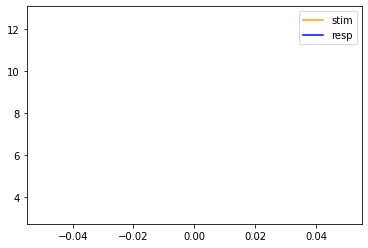

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
import os
results = list()
for type in range(2,3):
  for fre in range(4,7):
    print("Método "+str(type))
    eyedee = str(type)  # ID OF THE EXPERIMENT.
    o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
    num_blocks_start = int(5)
    num_blocks_end   = int(10)
    lambda_          = float(0.01)
    mid_shape        = int(10)
    D                = [0.05,0.02]
    dropout    = 0.05
    learning_rate = 1e-3
    epoch_num  = 20
    batch_size = 2048
    reg_par    = 1e-4
    # o_dim      = 1
    use_all_singular_values = False
    best_only  = True
    print(f"eyedee    : {eyedee}")
    print(f"best_only : {best_only}")
    print(f"epoch_num : {epoch_num}")
    print(f"dropout   : {dropout}")
    device = torch.device('cuda')
    torch.cuda.empty_cache()
    # CREATING A FOLDER TO STORE THE RESULTS
    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales_all_5/grupo50_freq"+str(fre)+"_cx_"
    path_name = folder_path+f"dmcca_{eyedee}_{lambda_}_{mid_shape}_{D[0]}/"
    # i = 1
    if not path.exists(path_name):
    #     path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
    #     i = i + 1
    # del i
      os.mkdir(path_name)
    print(path_name)

    def butter_bandpass(lowcut, highcut, fs, order=5):
        nyq = 0.5 * fs
        low = lowcut / nyq
        high = highcut / nyq
        b, a = butter(order, [low, high], btype='band')
        return b, a

    ###############################################
    ## freqs
    fmin = 3  # frecuencia mínima
    fmax = 34 # frecuencia máxima
    BW   = 2  # tamaño de ancho de banda
    overlap = 0.25
    step = BW*(1-overlap) # tamaño de traslape
    freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
    a = list()
    b = list()
    freqs_ = list()
    N = 2 # Numero de orden del filtro
    for fil in range(21):
        b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
        # b_, a_ = butter(N=N,Wn=Wn,btype='band')
        b.append(b_)
        a.append(a_)
    freqs_.append([b,a])
    ###############################################

    ##################### SEED #####################
    seed = np.ceil(np.random.rand(10)*100)
    seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
    print(seed)

    ###############################################
    # D = [0, 0.05, 0.1, 0.2]
    # D = [0.05, 0.2]
    # CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
    # COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
    # lambda_       = 0.1
    # MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
    # IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
    # mid_shape  = 60
    speech_dmcca = True
    if speech_dmcca:
        num_blocks = 31   # IF SPEECH DATA BY LIBERTO ET AL.

        # subs ARE THE SUBJECTS IDS TO WORK WITH
        for subs_ in range(1,2):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
          subs = [subs_]
          print("Grupo "+str(subs_))
          subs = sorted(subs) # TO KEEP THEIR IDS SORTED
          n_subs = len(subs)

          str_subs = str(subs[0])
          for each_sub in subs[1:]: 
              str_subs += f"_{each_sub}"

          # num_blocks_start = 0
          # num_blocks_end   = 1
          # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
          # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

          tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
          val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
          tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
          val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

          print(f"n_subs     : {n_subs}")
          print(f"subs       : {subs}")
          print(f"D          : {D}")
          print(f"num_blocks : {num_blocks}")
          print(f"num_blocks_start: {num_blocks_start}")
          print(f"num_blocks_end  : {num_blocks_end}")
          print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

          # data_subs_pre = list()
          results_name = f'{path_name}/Datos_{str(type)}.npy'
          if path.exists(results_name):
            data_subs_pre = np.save(results_name)
          else:
            # for block in range(num_blocks):
            data_subs_pre = load_dmcca_data_all_cxs_and_PSD_MUinf_freq(subs, mid_shape, type,fre, 31)
            # np.save(results_name, data_subs_pre)
          for d_cnt, dropout in enumerate(D):
              for block in range(len(data_subs_pre)):#(num_blocks_start, num_blocks_end):
                  # THE DATA data_subs_pre IS LOADED SUCH THAT 
                  # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
                  # AND THE LAST LIST HAS STIMULUS
                  # data_subs_pre IS A list OF SIZE N+1
                  # EACH ELEMENT IS A list OF SIZE 3
                  # SUCH THAT
                  # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
                  # AND
                  # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
                  
                  # DEEP MCCA
                  print("DEEP MCCA + LCCA")
                  dmlcs, dmdcs, data__,data_sub = dmcca_method(data_subs_pre[block], "speech", dropout, f"block_{block}_drpt_{dropout}_sub_{subs_}",freqs_)
                  tst_corrs[0, block, d_cnt] = dmlcs[0]
                  tst_corrs[1, block, d_cnt] = dmdcs[0]
                  print(tst_corrs)
                  val_corrs[0, block, d_cnt] = dmlcs[1]
                  val_corrs[1, block, d_cnt] = dmdcs[1]
                  print(val_corrs)
                  np.save(tst_corrs_name, tst_corrs)
                  np.save(val_corrs_name, val_corrs)              
                  print('saved SPEECH')
          results.append([tst_corrs,val_corrs])
        results_name = f'{path_name}/results_{str(type)}.npy'
        np.save(results_name, results)
# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

In [ ]:
fre

In [ ]:
data_subs_pre[0][1][0].shape

(815, 2250)

In [ ]:
for i in data_subs_pre[0]:
  print(i[1].shape)

(224, 10089)
(224, 4720)


# Prueba MCCA

In [ ]:
############################################
## freqs
fmin = 3  # frecuencia mínima
fmax = 34 # frecuencia máxima
BW   = 2  # tamaño de ancho de banda
overlap = 0.25
step = BW*(1-overlap) # tamaño de traslape
freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
a = list()
b = list()
freqs_ = list()
N = 2 # Numero de orden del filtro
for fil in range(21):
    b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
    # b_, a_ = butter(N=N,Wn=Wn,btype='band')
    b.append(b_)
    a.append(a_)
freqs_.append([b,a])

In [ ]:
eyedee = str(1)  # ID OF THE EXPERIMENT.
o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
num_blocks_start = int(0)
num_blocks_end   = int(1)
lambda_          = float(0.01)
mid_shape        = int(10)
D                = [0.05,0.02]
dropout    = 0.05
learning_rate = 1e-3
epoch_num  = 20
batch_size = 2048
reg_par    = 1e-4
# o_dim      = 1
use_all_singular_values = False
best_only  = True
print(f"eyedee    : {eyedee}")
print(f"best_only : {best_only}")
print(f"epoch_num : {epoch_num}")
print(f"dropout   : {dropout}")
device = torch.device('cuda')
torch.cuda.empty_cache()

num_blocks = 20        # Number of Sessins in the SPEECH DATA BY LIBERTO ET AL.
k = 1
# subs ARE THE SUBJECTS IDS TO WORK WITH
subs = list(np.arange(0,31,1))      # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
subs = sorted(subs) # TO KEEP THEIR IDS SORTED
n_subs = len(subs)

str_subs = str(subs[0])
for each_sub in subs[1:]: 
    str_subs += f"_{each_sub}"

num_blocks_start = 0
num_blocks_end   = 1
# CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
# CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

tst_corrs = np.zeros((num_blocks, n_subs))
val_corrs = np.zeros((num_blocks, n_subs))
# tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
# val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
print(f"n_subs     : {n_subs}")
print(f"subs       : {subs}")
print(f"num_blocks : {num_blocks}")
print(f"num_blocks_start: {num_blocks_start}")
print(f"num_blocks_end  : {num_blocks_end}")
print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")
fs = 1000
pca_chans = 10
for block in range(num_blocks_start, num_blocks_end):
    # THE DATA data_subs_pre IS LOADED SUCH THAT 
    # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
    # AND THE LAST LIST HAS STIMULUS
    # data_subs_pre IS A list OF SIZE N+1
    # EACH ELEMENT IS A list OF SIZE 3
    # SUCH THAT
    # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
    # AND
    # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
    data_subs_pre = load_mcca_data2(subs, k, block)

    ## LINEAR MCCA
    print("LINEAR MCCA + LCCA")
    lmc_corrs = np.zeros(tst_corrs.shape[1])

    # lmcca_data, lmlc_data, lmc_corrs, pre_lmdc_data = linear_mcca_with_stim(data_subs_pre, pca_chans, o_dim)

    # print(f'LMCCA + LCCA corrs are : {lmc_corrs}')
    # tst_corrs[block,:]  = lmc_corrs
    # np.save(tst_corrs_name, tst_corrs)


    # # PLOTTING LMLC OUTPUT 
    # for sub_num in range(n_subs):
    #     x1 = lmlc_data[sub_num][2][0]
    #     x2 = lmlc_data[sub_num][2][1]
    #     s = f"{path_name}/speech_plot_data_lmlc_sub_{sub_num}"
    #     plot_data(my_standardize(x1), my_standardize(x2), s)

    # SAVING THE LMLC OUTPUT
    # fp = open(f'{path_name}/speech_lmlc_data_block_{block}_{str_subs}.pkl', 'wb')
    # pkl.dump(lmlc_data, fp)
    # fp.close()
    # del lmlc_data


    # # EXTRAS:

    # # SAVING LMCCA + PROCESSED DATA SO THAT WE CAN DIRECTLY LOAD THEM TO DCCA METHOD FOR LMDC
    # fp = open(f'{path_name}/speech_pre_lmdc_data_block_{block}_{str_subs}.pkl', 'wb')
    # pkl.dump(pre_lmdc_data, fp)
    # fp.close()
    # del pre_lmdc_data

    # CAN PERFORM DCCA METHOD HERE.
    # print('saved')

eyedee    : 1
best_only : True
epoch_num : 20
dropout   : 0.05
n_subs     : 31
subs       : [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30]
num_blocks : 20
num_blocks_start: 0
num_blocks_end  : 1
num_blocks_net  : 1
block: 0
Data INITIALIZING for block : 0
(48, 2)
(48,)
(1240, 5760)
(1240, 5760)
LINEAR MCCA + LCCA


In [ ]:
data_subs_pre[-1][2].shape

(8, 5760)

In [ ]:
lmcca_data, lmlc_data, lmc_corrs, pre_lmdc_data = linear_mcca_with_stim(data_subs_pre, 1, o_dim)

/content/drive/Shareddrives/GCPDS/databases/Databases_musica/toolbox_deep/deep-cca-for-audio-EEG/cca_functions.py:38: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  x = np.array(x)


IndexError: ignored

In [ ]:
lmcca_data, lmlc_data, corr, pre_lmdc_data =linear_mcca(data_subs_pre,2, o_dim,freqs_)

In [ ]:
lmc_corrs

In [ ]:
corr

# 80-20 sin organizar 

In [ ]:
data_subs_pre[0][0][0].shape

(10148, 171)

In [ ]:
data_subs_pre[0][0][2].shape

(3245, 171)

In [ ]:
tst_corrs.shape

(2, 1, 1, 1)

In [ ]:
np.mean(tst_corrs[0,:,0,0])

0.5692803500492725

In [ ]:
np.mean(val_corrs[0,:,0,0])

0.5211359890516393

In [ ]:
tst_corrs[0,:,0,0]

array([0.64292856, 0.5404196 , 0.66674185, 0.74066429, 0.56407484,
       0.66524195, 0.33378248, 0.64497042, 0.24489778, 0.64908173])

In [ ]:
val_corrs[0,:,0,0]

array([0.55718854, 0.54370699, 0.61430214, 0.66232406, 0.46088255,
       0.61334867, 0.35404589, 0.52174143, 0.25866177, 0.62515784])

In [ ]:
data_subs_pre[0][1][0].shape

(90401, 8)

# 80-20 organizado

Método 3
eyedee    : 3
best_only : True
epoch_num : 20
dropout   : 0.05
[35.]
Grupo 0
n_subs     : 1
subs       : [0]
D          : [0.05, 0.02]
num_blocks : 10
num_blocks_start: 5
num_blocks_end  : 10
num_blocks_net  : 5
Data INITIALIZING for block : 0
stim 269
y_test 215
172 43 54
Stim_train (121573, 1)
Data INITIALIZING for block : 1
stim 269
y_test 215
172 43 54
Stim_train (123434, 1)
Data INITIALIZING for block : 2
stim 269
y_test 215
172 43 54
Stim_train (121766, 1)
Data INITIALIZING for block : 3
stim 269
y_test 215
172 43 54
Stim_train (123682, 1)
Data INITIALIZING for block : 4
stim 269
y_test 215
172 43 54
Stim_train (122713, 1)
Data INITIALIZING for block : 5
stim 269
y_test 215
172 43 54
Stim_train (121790, 1)
Data INITIALIZING for block : 6
stim 269
y_test 215
172 43 54
Stim_train (122382, 1)
Data INITIALIZING for block : 7
stim 269
y_test 215
172 43 54
Stim_train (122255, 1)
Data INITIALIZING for block : 8
stim 269
y_test 215
172 43 54
Stim_train (123742, 1)
Data INITIALIZ

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9981600379153809
CCA Model Ended.
LCCA is : [array(0.99816004), array(0.84224114)]
DMDC corrs are : [0.99816004]
DMCCA + DCCA : block_0_drpt_0.05
DCCA for block_0_drpt_0.05_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : 0.0017
  Validation CORRELATION : -0.0002
  Test CORRELATION       : -0.0004
  val. loss is : 0.0002 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0020
  Validation CORRELATION : 0.0001
  Test CORRELATION       : 0.0004
  val. loss is : -0.0001 & the min. loss is : 0.0002
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0002
  Validation CORRELATION : -0.0001
  Test CORRELATION       : -0.0022
  val. loss is : 0.0001 & the min. loss is : -0.0001
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0029
  Validation CORRELATION : 0.0000
  

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00031853, dtype=float32), array(0.00031853, dtype=float32)]
DMDC corrs are : [0.00031853]
DONE speech - block_0_drpt_0.05.
[[[[9.98160038e-01]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]]


 [[[3.18534439e-04]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]]]
[[[[8.42241142e

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9990113119927851
CCA Model Ended.
LCCA is : [array(0.99901131), array(0.97755352)]
DMDC corrs are : [0.99901131]
DMCCA + DCCA : block_1_drpt_0.05
DCCA for block_1_drpt_0.05_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : 0.0026
  Validation CORRELATION : 0.0004
  Test CORRELATION       : 0.0015
  val. loss is : -0.0004 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0045
  Validation CORRELATION : 0.0036
  Test CORRELATION       : 0.0001
  val. loss is : -0.0036 & the min. loss is : -0.0004
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0017
  Validation CORRELATION : -0.0076
  Test CORRELATION       : 0.0000
  val. loss is : 0.0076 & the min. loss is : -0.0036
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0041
  Validation CORRELATION : 0.0068
  T

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00427742, dtype=float32), array(-0.00427742, dtype=float32)]
DMDC corrs are : [-0.00427742]
DONE speech - block_1_drpt_0.05.
[[[[ 9.98160038e-01]
   [ 0.00000000e+00]]

  [[ 9.99011312e-01]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [ 0.00000000e+00]]

  [[-4.27741697e-03]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9974817557863171
CCA Model Ended.
LCCA is : [array(0.99748176), array(0.9813215)]
DMDC corrs are : [0.99748176]
DMCCA + DCCA : block_2_drpt_0.05
DCCA for block_2_drpt_0.05_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : -0.0080
  Validation CORRELATION : -0.0060
  Test CORRELATION       : 0.0014
  val. loss is : 0.0060 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0052
  Validation CORRELATION : -0.0001
  Test CORRELATION       : 0.0000
  val. loss is : 0.0001 & the min. loss is : 0.0060
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0103
  Validation CORRELATION : 0.0010
  Test CORRELATION       : 0.0011
  val. loss is : -0.0010 & the min. loss is : 0.0001
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0156
  Validation CORRELATION : 0.0048
  Test CO

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00031603, dtype=float32), array(-0.00031603, dtype=float32)]
DMDC corrs are : [-0.00031603]
DONE speech - block_2_drpt_0.05.
[[[[ 9.98160038e-01]
   [ 0.00000000e+00]]

  [[ 9.99011312e-01]
   [ 0.00000000e+00]]

  [[ 9.97481756e-01]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [ 0.00000000e+00]]

  [[-4.27741697e-03]
   [ 0.00000000e+00]]

  [[-3.16033867e-04]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9998163488276789
CCA Model Ended.
LCCA is : [array(0.99981635), array(0.98244427)]
DMDC corrs are : [0.99981635]
DMCCA + DCCA : block_3_drpt_0.05
DCCA for block_3_drpt_0.05_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : 0.0050
  Validation CORRELATION : 0.0024
  Test CORRELATION       : 0.0001
  val. loss is : -0.0024 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0030
  Validation CORRELATION : -0.0090
  Test CORRELATION       : -0.0001
  val. loss is : 0.0090 & the min. loss is : -0.0024
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0012
  Validation CORRELATION : 0.0001
  Test CORRELATION       : -0.0000
  val. loss is : -0.0001 & the min. loss is : -0.0024
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0009
  Validation CORRELATION : -0.0

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(3.8805658e-05, dtype=float32), array(3.8805658e-05, dtype=float32)]
DMDC corrs are : [3.88056578e-05]
DONE speech - block_3_drpt_0.05.
[[[[ 9.98160038e-01]
   [ 0.00000000e+00]]

  [[ 9.99011312e-01]
   [ 0.00000000e+00]]

  [[ 9.97481756e-01]
   [ 0.00000000e+00]]

  [[ 9.99816349e-01]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [ 0.00000000e+00]]

  [[-4.27741697e-03]
   [ 0.00000000e+00]]

  [[-3.16033867e-04]
   [ 0.00000000e+00]]

  [[ 3.88056578e-05]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.000

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9999394923061231
CCA Model Ended.
LCCA is : [array(0.99993949), array(0.99189629)]
DMDC corrs are : [0.99993949]
DMCCA + DCCA : block_4_drpt_0.05
DCCA for block_4_drpt_0.05_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : -0.0127
  Validation CORRELATION : -0.0009
  Test CORRELATION       : 0.0002
  val. loss is : 0.0009 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0108
  Validation CORRELATION : -0.0004
  Test CORRELATION       : 0.0002
  val. loss is : 0.0004 & the min. loss is : 0.0009
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0082
  Validation CORRELATION : -0.0032
  Test CORRELATION       : 0.0001
  val. loss is : 0.0032 & the min. loss is : 0.0004
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0114
  Validation CORRELATION : 0.0013
  Tes

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00024235, dtype=float32), array(-0.00024235, dtype=float32)]
DMDC corrs are : [-0.00024235]
DONE speech - block_4_drpt_0.05.
[[[[ 9.98160038e-01]
   [ 0.00000000e+00]]

  [[ 9.99011312e-01]
   [ 0.00000000e+00]]

  [[ 9.97481756e-01]
   [ 0.00000000e+00]]

  [[ 9.99816349e-01]
   [ 0.00000000e+00]]

  [[ 9.99939492e-01]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [ 0.00000000e+00]]

  [[-4.27741697e-03]
   [ 0.00000000e+00]]

  [[-3.16033867e-04]
   [ 0.00000000e+00]]

  [[ 3.88056578e-05]
   [ 0.00000000e+00]]

  [[-2.42349139e-04]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DMDC corrs are : [0.99922073]
DMCCA + DCCA : block_5_drpt_0.05
DCCA for block_5_drpt_0.05_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : -0.0054
  Validation CORRELATION : -0.0000
  Test CORRELATION       : 0.0006
  val. loss is : 0.0000 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0045
  Validation CORRELATION : -0.0005
  Test CORRELATION       : 0.0089
  val. loss is : 0.0005 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0023
  Validation CORRELATION : 0.0001
  Test CORRELATION       : 0.0049
  val. loss is : -0.0001 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0080
  Validation CORRELATION : -0.0000
  Test CORRELATION       : 0.0056
  val. loss is : 0.0000 & the min. loss is : -0.0001
 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.01251784, dtype=float32), array(-0.01251784, dtype=float32)]
DMDC corrs are : [-0.01251784]
DONE speech - block_5_drpt_0.05.
[[[[ 9.98160038e-01]
   [ 0.00000000e+00]]

  [[ 9.99011312e-01]
   [ 0.00000000e+00]]

  [[ 9.97481756e-01]
   [ 0.00000000e+00]]

  [[ 9.99816349e-01]
   [ 0.00000000e+00]]

  [[ 9.99939492e-01]
   [ 0.00000000e+00]]

  [[ 9.99220726e-01]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [ 0.00000000e+00]]

  [[-4.27741697e-03]
   [ 0.00000000e+00]]

  [[-3.16033867e-04]
   [ 0.00000000e+00]]

  [[ 3.88056578e-05]
   [ 0.00000000e+00]]

  [[-2.42349139e-04]
   [ 0.00000000e+00]]

  [[-1.25178359e-02]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9981871128821381
CCA Model Ended.
LCCA is : [array(0.99818711), array(0.92935655)]
DMDC corrs are : [0.99818711]
DMCCA + DCCA : block_6_drpt_0.05
DCCA for block_6_drpt_0.05_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : -0.0098
  Validation CORRELATION : -0.0038
  Test CORRELATION       : -0.0001
  val. loss is : 0.0038 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0141
  Validation CORRELATION : 0.0009
  Test CORRELATION       : 0.0000
  val. loss is : -0.0009 & the min. loss is : 0.0038
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0130
  Validation CORRELATION : 0.0048
  Test CORRELATION       : 0.0001
  val. loss is : -0.0048 & the min. loss is : -0.0009
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0097
  Validation CORRELATION : -0.0006
  Test 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(9.246681e-05, dtype=float32), array(9.246681e-05, dtype=float32)]
DMDC corrs are : [9.24668129e-05]
DONE speech - block_6_drpt_0.05.
[[[[ 9.98160038e-01]
   [ 0.00000000e+00]]

  [[ 9.99011312e-01]
   [ 0.00000000e+00]]

  [[ 9.97481756e-01]
   [ 0.00000000e+00]]

  [[ 9.99816349e-01]
   [ 0.00000000e+00]]

  [[ 9.99939492e-01]
   [ 0.00000000e+00]]

  [[ 9.99220726e-01]
   [ 0.00000000e+00]]

  [[ 9.98187113e-01]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [ 0.00000000e+00]]

  [[-4.27741697e-03]
   [ 0.00000000e+00]]

  [[-3.16033867e-04]
   [ 0.00000000e+00]]

  [[ 3.88056578e-05]
   [ 0.00000000e+00]]

  [[-2.42349139e-04]
   [ 0.00000000e+00]]

  [[-1.25178359e-02]
   [ 0.00000000e+00]]

  [[ 9.24668129e-05]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9935065046489594
CCA Model Ended.
LCCA is : [array(0.9935065), array(0.92830662)]
DMDC corrs are : [0.9935065]
DMCCA + DCCA : block_7_drpt_0.05
DCCA for block_7_drpt_0.05_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : -0.0054
  Validation CORRELATION : 0.0002
  Test CORRELATION       : 0.0004
  val. loss is : -0.0002 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0024
  Validation CORRELATION : 0.0005
  Test CORRELATION       : -0.0009
  val. loss is : -0.0005 & the min. loss is : -0.0002
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0015
  Validation CORRELATION : 0.0002
  Test CORRELATION       : -0.0001
  val. loss is : -0.0002 & the min. loss is : -0.0005
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : nan
  Validation CORRELATION : 0.0001
  Test

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00091357, dtype=float32), array(-0.00091357, dtype=float32)]
DMDC corrs are : [-0.00091357]
DONE speech - block_7_drpt_0.05.
[[[[ 9.98160038e-01]
   [ 0.00000000e+00]]

  [[ 9.99011312e-01]
   [ 0.00000000e+00]]

  [[ 9.97481756e-01]
   [ 0.00000000e+00]]

  [[ 9.99816349e-01]
   [ 0.00000000e+00]]

  [[ 9.99939492e-01]
   [ 0.00000000e+00]]

  [[ 9.99220726e-01]
   [ 0.00000000e+00]]

  [[ 9.98187113e-01]
   [ 0.00000000e+00]]

  [[ 9.93506505e-01]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [ 0.00000000e+00]]

  [[-4.27741697e-03]
   [ 0.00000000e+00]]

  [[-3.16033867e-04]
   [ 0.00000000e+00]]

  [[ 3.88056578e-05]
   [ 0.00000000e+00]]

  [[-2.42349139e-04]
   [ 0.00000000e+00]]

  [[-1.25178359e-02]
   [ 0.00000000e+00]]

  [[ 9.24668129e-05]
   [ 0.00000000e+00]]

  [[-9.13569063e-04]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9921680570211601
CCA Model Ended.
LCCA is : [array(0.99216806), array(0.86838534)]
DMDC corrs are : [0.99216806]
DMCCA + DCCA : block_8_drpt_0.05
DCCA for block_8_drpt_0.05_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : 0.0019
  Validation CORRELATION : -0.0001
  Test CORRELATION       : -0.0002
  val. loss is : 0.0001 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0030
  Validation CORRELATION : -0.0000
  Test CORRELATION       : 0.0003
  val. loss is : 0.0000 & the min. loss is : 0.0001
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0036
  Validation CORRELATION : 0.0010
  Test CORRELATION       : 0.0042
  val. loss is : -0.0010 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0028
  Validation CORRELATION : -0.0002
  Test 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.004192, dtype=float32), array(0.004192, dtype=float32)]
DMDC corrs are : [0.004192]
DONE speech - block_8_drpt_0.05.
[[[[ 9.98160038e-01]
   [ 0.00000000e+00]]

  [[ 9.99011312e-01]
   [ 0.00000000e+00]]

  [[ 9.97481756e-01]
   [ 0.00000000e+00]]

  [[ 9.99816349e-01]
   [ 0.00000000e+00]]

  [[ 9.99939492e-01]
   [ 0.00000000e+00]]

  [[ 9.99220726e-01]
   [ 0.00000000e+00]]

  [[ 9.98187113e-01]
   [ 0.00000000e+00]]

  [[ 9.93506505e-01]
   [ 0.00000000e+00]]

  [[ 9.92168057e-01]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [ 0.00000000e+00]]

  [[-4.27741697e-03]
   [ 0.00000000e+00]]

  [[-3.16033867e-04]
   [ 0.00000000e+00]]

  [[ 3.88056578e-05]
   [ 0.00000000e+00]]

  [[-2.42349139e-04]
   [ 0.00000000e+00]]

  [[-1.25178359e-02]
   [ 0.00000000e+00]]

  [[ 9.24668129e-05]
   [ 0.00000000e+00]]

  [[-9.13569063e-04]
   [ 0.00000000e+00]]

  [[ 4.19199886e-03]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9993922061906109
CCA Model Ended.
LCCA is : [array(0.99939221), array(0.98754013)]
DMDC corrs are : [0.99939221]
DMCCA + DCCA : block_9_drpt_0.05
DCCA for block_9_drpt_0.05_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : 0.0006
  Validation CORRELATION : 0.0003
  Test CORRELATION       : 0.0003
  val. loss is : -0.0003 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0014
  Validation CORRELATION : 0.0001
  Test CORRELATION       : 0.0000
  val. loss is : -0.0001 & the min. loss is : -0.0003
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0023
  Validation CORRELATION : 0.0056
  Test CORRELATION       : 0.0019
  val. loss is : -0.0056 & the min. loss is : -0.0003
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0050
  Validation CORRELATION : 0.0003
  Te

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00184898, dtype=float32), array(0.00184898, dtype=float32)]
DMDC corrs are : [0.00184898]
DONE speech - block_9_drpt_0.05.
[[[[ 9.98160038e-01]
   [ 0.00000000e+00]]

  [[ 9.99011312e-01]
   [ 0.00000000e+00]]

  [[ 9.97481756e-01]
   [ 0.00000000e+00]]

  [[ 9.99816349e-01]
   [ 0.00000000e+00]]

  [[ 9.99939492e-01]
   [ 0.00000000e+00]]

  [[ 9.99220726e-01]
   [ 0.00000000e+00]]

  [[ 9.98187113e-01]
   [ 0.00000000e+00]]

  [[ 9.93506505e-01]
   [ 0.00000000e+00]]

  [[ 9.92168057e-01]
   [ 0.00000000e+00]]

  [[ 9.99392206e-01]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [ 0.00000000e+00]]

  [[-4.27741697e-03]
   [ 0.00000000e+00]]

  [[-3.16033867e-04]
   [ 0.00000000e+00]]

  [[ 3.88056578e-05]
   [ 0.00000000e+00]]

  [[-2.42349139e-04]
   [ 0.00000000e+00]]

  [[-1.25178359e-02]
   [ 0.00000000e+00]]

  [[ 9.24668129e-05]
   [ 0.00000000e+00]]

  [[-9.13569063e-04]
   [ 0.00000000e+00]]

  [[ 4.19199886e-03]
   [ 0.00000000e+00]]

  [[ 1.84897613e-03]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9996430656611089
CCA Model Ended.
LCCA is : [array(0.99964307), array(0.96598362)]
DMDC corrs are : [0.99964307]
DMCCA + DCCA : block_0_drpt_0.02
DCCA for block_0_drpt_0.02_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : 0.0110
  Validation CORRELATION : 0.0003
  Test CORRELATION       : 0.0002
  val. loss is : -0.0003 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0011
  Validation CORRELATION : -0.0000
  Test CORRELATION       : 0.0021
  val. loss is : 0.0000 & the min. loss is : -0.0003
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0103
  Validation CORRELATION : -0.0001
  Test CORRELATION       : -0.0001
  val. loss is : 0.0001 & the min. loss is : -0.0003
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0032
  Validation CORRELATION : 0.000

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00553319, dtype=float32), array(-0.00553319, dtype=float32)]
DMDC corrs are : [-0.00553319]
DONE speech - block_0_drpt_0.02.
[[[[ 9.98160038e-01]
   [ 9.99643066e-01]]

  [[ 9.99011312e-01]
   [ 0.00000000e+00]]

  [[ 9.97481756e-01]
   [ 0.00000000e+00]]

  [[ 9.99816349e-01]
   [ 0.00000000e+00]]

  [[ 9.99939492e-01]
   [ 0.00000000e+00]]

  [[ 9.99220726e-01]
   [ 0.00000000e+00]]

  [[ 9.98187113e-01]
   [ 0.00000000e+00]]

  [[ 9.93506505e-01]
   [ 0.00000000e+00]]

  [[ 9.92168057e-01]
   [ 0.00000000e+00]]

  [[ 9.99392206e-01]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [-5.53318579e-03]]

  [[-4.27741697e-03]
   [ 0.00000000e+00]]

  [[-3.16033867e-04]
   [ 0.00000000e+00]]

  [[ 3.88056578e-05]
   [ 0.00000000e+00]]

  [[-2.42349139e-04]
   [ 0.00000000e+00]]

  [[-1.25178359e-02]
   [ 0.00000000e+00]]

  [[ 9.24668129e-05]
   [ 0.00000000e+00]]

  [[-9.13569063e-04]
   [ 0.00000000e+00]]

  [[ 4.19199886e-03]
   [ 0.00000000e+00]]

  [[ 1.84897613e-

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9994347564785567
CCA Model Ended.
LCCA is : [array(0.99943476), array(0.98527949)]
DMDC corrs are : [0.99943476]
DMCCA + DCCA : block_1_drpt_0.02
DCCA for block_1_drpt_0.02_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : -0.0087
  Validation CORRELATION : -0.0036
  Test CORRELATION       : -0.0002
  val. loss is : 0.0036 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0023
  Validation CORRELATION : -0.0002
  Test CORRELATION       : -0.0001
  val. loss is : 0.0002 & the min. loss is : 0.0036
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0048
  Validation CORRELATION : -0.0036
  Test CORRELATION       : -0.0000
  val. loss is : 0.0036 & the min. loss is : 0.0002
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0017
  Validation CORRELATION : -0.0012


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00045386, dtype=float32), array(0.00045386, dtype=float32)]
DMDC corrs are : [0.00045386]
DONE speech - block_1_drpt_0.02.
[[[[ 9.98160038e-01]
   [ 9.99643066e-01]]

  [[ 9.99011312e-01]
   [ 9.99434756e-01]]

  [[ 9.97481756e-01]
   [ 0.00000000e+00]]

  [[ 9.99816349e-01]
   [ 0.00000000e+00]]

  [[ 9.99939492e-01]
   [ 0.00000000e+00]]

  [[ 9.99220726e-01]
   [ 0.00000000e+00]]

  [[ 9.98187113e-01]
   [ 0.00000000e+00]]

  [[ 9.93506505e-01]
   [ 0.00000000e+00]]

  [[ 9.92168057e-01]
   [ 0.00000000e+00]]

  [[ 9.99392206e-01]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [-5.53318579e-03]]

  [[-4.27741697e-03]
   [ 4.53856133e-04]]

  [[-3.16033867e-04]
   [ 0.00000000e+00]]

  [[ 3.88056578e-05]
   [ 0.00000000e+00]]

  [[-2.42349139e-04]
   [ 0.00000000e+00]]

  [[-1.25178359e-02]
   [ 0.00000000e+00]]

  [[ 9.24668129e-05]
   [ 0.00000000e+00]]

  [[-9.13569063e-04]
   [ 0.00000000e+00]]

  [[ 4.19199886e-03]
   [ 0.00000000e+00]]

  [[ 1.84897613e-03]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9974610936904545
CCA Model Ended.
LCCA is : [array(0.99746109), array(0.94980014)]
DMDC corrs are : [0.99746109]
DMCCA + DCCA : block_2_drpt_0.02
DCCA for block_2_drpt_0.02_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : 0.0006
  Validation CORRELATION : -0.0039
  Test CORRELATION       : 0.0008
  val. loss is : 0.0039 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0005
  Validation CORRELATION : -0.0016
  Test CORRELATION       : 0.0004
  val. loss is : 0.0016 & the min. loss is : 0.0039
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0008
  Validation CORRELATION : -0.0000
  Test CORRELATION       : -0.0000
  val. loss is : 0.0000 & the min. loss is : 0.0016
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0150
  Validation CORRELATION : -0.0031
  Test

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00212136, dtype=float32), array(0.00212136, dtype=float32)]
DMDC corrs are : [0.00212136]
DONE speech - block_2_drpt_0.02.
[[[[ 9.98160038e-01]
   [ 9.99643066e-01]]

  [[ 9.99011312e-01]
   [ 9.99434756e-01]]

  [[ 9.97481756e-01]
   [ 9.97461094e-01]]

  [[ 9.99816349e-01]
   [ 0.00000000e+00]]

  [[ 9.99939492e-01]
   [ 0.00000000e+00]]

  [[ 9.99220726e-01]
   [ 0.00000000e+00]]

  [[ 9.98187113e-01]
   [ 0.00000000e+00]]

  [[ 9.93506505e-01]
   [ 0.00000000e+00]]

  [[ 9.92168057e-01]
   [ 0.00000000e+00]]

  [[ 9.99392206e-01]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [-5.53318579e-03]]

  [[-4.27741697e-03]
   [ 4.53856133e-04]]

  [[-3.16033867e-04]
   [ 2.12136377e-03]]

  [[ 3.88056578e-05]
   [ 0.00000000e+00]]

  [[-2.42349139e-04]
   [ 0.00000000e+00]]

  [[-1.25178359e-02]
   [ 0.00000000e+00]]

  [[ 9.24668129e-05]
   [ 0.00000000e+00]]

  [[-9.13569063e-04]
   [ 0.00000000e+00]]

  [[ 4.19199886e-03]
   [ 0.00000000e+00]]

  [[ 1.84897613e-03]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DMDC corrs are : [0.99272387]
DMCCA + DCCA : block_3_drpt_0.02
DCCA for block_3_drpt_0.02_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : 0.0014
  Validation CORRELATION : 0.0001
  Test CORRELATION       : -0.0001
  val. loss is : -0.0001 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : nan
  Validation CORRELATION : 0.0001
  Test CORRELATION       : 0.0002
  val. loss is : -0.0001 & the min. loss is : -0.0001
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0138
  Validation CORRELATION : -0.0022
  Test CORRELATION       : 0.0002
  val. loss is : 0.0022 & the min. loss is : -0.0001
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0049
  Validation CORRELATION : 0.0054
  Test CORRELATION       : -0.0002
  val. loss is : -0.0054 & the min. loss is : -0.00

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00023558, dtype=float32), array(-0.00023558, dtype=float32)]
DMDC corrs are : [-0.00023558]
DONE speech - block_3_drpt_0.02.
[[[[ 9.98160038e-01]
   [ 9.99643066e-01]]

  [[ 9.99011312e-01]
   [ 9.99434756e-01]]

  [[ 9.97481756e-01]
   [ 9.97461094e-01]]

  [[ 9.99816349e-01]
   [ 9.92723871e-01]]

  [[ 9.99939492e-01]
   [ 0.00000000e+00]]

  [[ 9.99220726e-01]
   [ 0.00000000e+00]]

  [[ 9.98187113e-01]
   [ 0.00000000e+00]]

  [[ 9.93506505e-01]
   [ 0.00000000e+00]]

  [[ 9.92168057e-01]
   [ 0.00000000e+00]]

  [[ 9.99392206e-01]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [-5.53318579e-03]]

  [[-4.27741697e-03]
   [ 4.53856133e-04]]

  [[-3.16033867e-04]
   [ 2.12136377e-03]]

  [[ 3.88056578e-05]
   [-2.35581771e-04]]

  [[-2.42349139e-04]
   [ 0.00000000e+00]]

  [[-1.25178359e-02]
   [ 0.00000000e+00]]

  [[ 9.24668129e-05]
   [ 0.00000000e+00]]

  [[-9.13569063e-04]
   [ 0.00000000e+00]]

  [[ 4.19199886e-03]
   [ 0.00000000e+00]]

  [[ 1.84897613e-

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9956886089783767
CCA Model Ended.
LCCA is : [array(0.99568861), array(0.97812585)]
DMDC corrs are : [0.99568861]
DMCCA + DCCA : block_4_drpt_0.02
DCCA for block_4_drpt_0.02_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : 0.0056
  Validation CORRELATION : -0.0076
  Test CORRELATION       : 0.0005
  val. loss is : 0.0076 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0014
  Validation CORRELATION : -0.0002
  Test CORRELATION       : 0.0001
  val. loss is : 0.0002 & the min. loss is : 0.0076
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0017
  Validation CORRELATION : 0.0006
  Test CORRELATION       : 0.0001
  val. loss is : -0.0006 & the min. loss is : 0.0002
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0434
  Validation CORRELATION : -0.0045
  Test CO

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(3.4701152e-05, dtype=float32), array(3.4701152e-05, dtype=float32)]
DMDC corrs are : [3.47011519e-05]
DONE speech - block_4_drpt_0.02.
[[[[ 9.98160038e-01]
   [ 9.99643066e-01]]

  [[ 9.99011312e-01]
   [ 9.99434756e-01]]

  [[ 9.97481756e-01]
   [ 9.97461094e-01]]

  [[ 9.99816349e-01]
   [ 9.92723871e-01]]

  [[ 9.99939492e-01]
   [ 9.95688609e-01]]

  [[ 9.99220726e-01]
   [ 0.00000000e+00]]

  [[ 9.98187113e-01]
   [ 0.00000000e+00]]

  [[ 9.93506505e-01]
   [ 0.00000000e+00]]

  [[ 9.92168057e-01]
   [ 0.00000000e+00]]

  [[ 9.99392206e-01]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [-5.53318579e-03]]

  [[-4.27741697e-03]
   [ 4.53856133e-04]]

  [[-3.16033867e-04]
   [ 2.12136377e-03]]

  [[ 3.88056578e-05]
   [-2.35581771e-04]]

  [[-2.42349139e-04]
   [ 3.47011519e-05]]

  [[-1.25178359e-02]
   [ 0.00000000e+00]]

  [[ 9.24668129e-05]
   [ 0.00000000e+00]]

  [[-9.13569063e-04]
   [ 0.00000000e+00]]

  [[ 4.19199886e-03]
   [ 0.00000000e+00]]

  [[ 1.848

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9999402034371109
CCA Model Ended.
LCCA is : [array(0.9999402), array(0.98753999)]
DMDC corrs are : [0.9999402]
DMCCA + DCCA : block_5_drpt_0.02
DCCA for block_5_drpt_0.02_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : -0.0003
  Validation CORRELATION : -0.0005
  Test CORRELATION       : 0.0057
  val. loss is : 0.0005 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0015
  Validation CORRELATION : -0.0002
  Test CORRELATION       : -0.0000
  val. loss is : 0.0002 & the min. loss is : 0.0005
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0099
  Validation CORRELATION : -0.0002
  Test CORRELATION       : -0.0001
  val. loss is : 0.0002 & the min. loss is : 0.0002
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0009
  Validation CORRELATION : -0.0000
  Test C

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00757364, dtype=float32), array(-0.00757364, dtype=float32)]
DMDC corrs are : [-0.00757364]
DONE speech - block_5_drpt_0.02.
[[[[ 9.98160038e-01]
   [ 9.99643066e-01]]

  [[ 9.99011312e-01]
   [ 9.99434756e-01]]

  [[ 9.97481756e-01]
   [ 9.97461094e-01]]

  [[ 9.99816349e-01]
   [ 9.92723871e-01]]

  [[ 9.99939492e-01]
   [ 9.95688609e-01]]

  [[ 9.99220726e-01]
   [ 9.99940203e-01]]

  [[ 9.98187113e-01]
   [ 0.00000000e+00]]

  [[ 9.93506505e-01]
   [ 0.00000000e+00]]

  [[ 9.92168057e-01]
   [ 0.00000000e+00]]

  [[ 9.99392206e-01]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [-5.53318579e-03]]

  [[-4.27741697e-03]
   [ 4.53856133e-04]]

  [[-3.16033867e-04]
   [ 2.12136377e-03]]

  [[ 3.88056578e-05]
   [-2.35581771e-04]]

  [[-2.42349139e-04]
   [ 3.47011519e-05]]

  [[-1.25178359e-02]
   [-7.57363625e-03]]

  [[ 9.24668129e-05]
   [ 0.00000000e+00]]

  [[-9.13569063e-04]
   [ 0.00000000e+00]]

  [[ 4.19199886e-03]
   [ 0.00000000e+00]]

  [[ 1.84897613e-

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9997667085853656
CCA Model Ended.
LCCA is : [array(0.99976671), array(0.98827017)]
DMDC corrs are : [0.99976671]
DMCCA + DCCA : block_6_drpt_0.02
DCCA for block_6_drpt_0.02_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : -0.0017
  Validation CORRELATION : -0.0004
  Test CORRELATION       : 0.0015
  val. loss is : 0.0004 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0030
  Validation CORRELATION : 0.0024
  Test CORRELATION       : -0.0034
  val. loss is : -0.0024 & the min. loss is : 0.0004
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : nan
  Validation CORRELATION : -0.0001
  Test CORRELATION       : 0.0000
  val. loss is : 0.0001 & the min. loss is : -0.0024
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : nan
  Validation CORRELATION : -0.0000
  Test 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00151995, dtype=float32), array(-0.00151995, dtype=float32)]
DMDC corrs are : [-0.00151995]
DONE speech - block_6_drpt_0.02.
[[[[ 9.98160038e-01]
   [ 9.99643066e-01]]

  [[ 9.99011312e-01]
   [ 9.99434756e-01]]

  [[ 9.97481756e-01]
   [ 9.97461094e-01]]

  [[ 9.99816349e-01]
   [ 9.92723871e-01]]

  [[ 9.99939492e-01]
   [ 9.95688609e-01]]

  [[ 9.99220726e-01]
   [ 9.99940203e-01]]

  [[ 9.98187113e-01]
   [ 9.99766709e-01]]

  [[ 9.93506505e-01]
   [ 0.00000000e+00]]

  [[ 9.92168057e-01]
   [ 0.00000000e+00]]

  [[ 9.99392206e-01]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [-5.53318579e-03]]

  [[-4.27741697e-03]
   [ 4.53856133e-04]]

  [[-3.16033867e-04]
   [ 2.12136377e-03]]

  [[ 3.88056578e-05]
   [-2.35581771e-04]]

  [[-2.42349139e-04]
   [ 3.47011519e-05]]

  [[-1.25178359e-02]
   [-7.57363625e-03]]

  [[ 9.24668129e-05]
   [-1.51994976e-03]]

  [[-9.13569063e-04]
   [ 0.00000000e+00]]

  [[ 4.19199886e-03]
   [ 0.00000000e+00]]

  [[ 1.84897613e-

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9960918075362936
CCA Model Ended.
LCCA is : [array(0.99609181), array(0.9542864)]
DMDC corrs are : [0.99609181]
DMCCA + DCCA : block_7_drpt_0.02
DCCA for block_7_drpt_0.02_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : 0.0090
  Validation CORRELATION : 0.0001
  Test CORRELATION       : -0.0003
  val. loss is : -0.0001 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0047
  Validation CORRELATION : 0.0003
  Test CORRELATION       : -0.0005
  val. loss is : -0.0003 & the min. loss is : -0.0001
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0021
  Validation CORRELATION : 0.0002
  Test CORRELATION       : -0.0001
  val. loss is : -0.0002 & the min. loss is : -0.0003
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0062
  Validation CORRELATION : -0.0000
  

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00023747, dtype=float32), array(-0.00023747, dtype=float32)]
DMDC corrs are : [-0.00023747]
DONE speech - block_7_drpt_0.02.
[[[[ 9.98160038e-01]
   [ 9.99643066e-01]]

  [[ 9.99011312e-01]
   [ 9.99434756e-01]]

  [[ 9.97481756e-01]
   [ 9.97461094e-01]]

  [[ 9.99816349e-01]
   [ 9.92723871e-01]]

  [[ 9.99939492e-01]
   [ 9.95688609e-01]]

  [[ 9.99220726e-01]
   [ 9.99940203e-01]]

  [[ 9.98187113e-01]
   [ 9.99766709e-01]]

  [[ 9.93506505e-01]
   [ 9.96091808e-01]]

  [[ 9.92168057e-01]
   [ 0.00000000e+00]]

  [[ 9.99392206e-01]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [-5.53318579e-03]]

  [[-4.27741697e-03]
   [ 4.53856133e-04]]

  [[-3.16033867e-04]
   [ 2.12136377e-03]]

  [[ 3.88056578e-05]
   [-2.35581771e-04]]

  [[-2.42349139e-04]
   [ 3.47011519e-05]]

  [[-1.25178359e-02]
   [-7.57363625e-03]]

  [[ 9.24668129e-05]
   [-1.51994976e-03]]

  [[-9.13569063e-04]
   [-2.37470435e-04]]

  [[ 4.19199886e-03]
   [ 0.00000000e+00]]

  [[ 1.84897613e-

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9948421864987491
CCA Model Ended.
LCCA is : [array(0.99484219), array(0.93094857)]
DMDC corrs are : [0.99484219]
DMCCA + DCCA : block_8_drpt_0.02
DCCA for block_8_drpt_0.02_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : -0.0009
  Validation CORRELATION : -0.0001
  Test CORRELATION       : -0.0001
  val. loss is : 0.0001 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0024
  Validation CORRELATION : 0.0001
  Test CORRELATION       : 0.0001
  val. loss is : -0.0001 & the min. loss is : 0.0001
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0014
  Validation CORRELATION : -0.0000
  Test CORRELATION       : -0.0005
  val. loss is : 0.0000 & the min. loss is : -0.0001
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0030
  Validation CORRELATION : -0.0000

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00073592, dtype=float32), array(0.00073592, dtype=float32)]
DMDC corrs are : [0.00073592]
DONE speech - block_8_drpt_0.02.
[[[[ 9.98160038e-01]
   [ 9.99643066e-01]]

  [[ 9.99011312e-01]
   [ 9.99434756e-01]]

  [[ 9.97481756e-01]
   [ 9.97461094e-01]]

  [[ 9.99816349e-01]
   [ 9.92723871e-01]]

  [[ 9.99939492e-01]
   [ 9.95688609e-01]]

  [[ 9.99220726e-01]
   [ 9.99940203e-01]]

  [[ 9.98187113e-01]
   [ 9.99766709e-01]]

  [[ 9.93506505e-01]
   [ 9.96091808e-01]]

  [[ 9.92168057e-01]
   [ 9.94842186e-01]]

  [[ 9.99392206e-01]
   [ 0.00000000e+00]]]


 [[[ 3.18534439e-04]
   [-5.53318579e-03]]

  [[-4.27741697e-03]
   [ 4.53856133e-04]]

  [[-3.16033867e-04]
   [ 2.12136377e-03]]

  [[ 3.88056578e-05]
   [-2.35581771e-04]]

  [[-2.42349139e-04]
   [ 3.47011519e-05]]

  [[-1.25178359e-02]
   [-7.57363625e-03]]

  [[ 9.24668129e-05]
   [-1.51994976e-03]]

  [[-9.13569063e-04]
   [-2.37470435e-04]]

  [[ 4.19199886e-03]
   [ 7.35916838e-04]]

  [[ 1.84897613e-03]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9982117496289817
CCA Model Ended.
LCCA is : [array(0.99821175), array(0.94385347)]
DMDC corrs are : [0.99821175]
DMCCA + DCCA : block_9_drpt_0.02
DCCA for block_9_drpt_0.02_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : 0.0039
  Validation CORRELATION : 0.0021
  Test CORRELATION       : 0.0064
  val. loss is : -0.0021 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : nan
  Validation CORRELATION : 0.0001
  Test CORRELATION       : -0.0001
  val. loss is : -0.0001 & the min. loss is : -0.0021
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0021
  Validation CORRELATION : 0.0004
  Test CORRELATION       : 0.0002
  val. loss is : -0.0004 & the min. loss is : -0.0021
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0044
  Validation CORRELATION : -0.0000


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00517265, dtype=float32), array(0.00517265, dtype=float32)]
DMDC corrs are : [0.00517265]
DONE speech - block_9_drpt_0.02.
[[[[ 9.98160038e-01]
   [ 9.99643066e-01]]

  [[ 9.99011312e-01]
   [ 9.99434756e-01]]

  [[ 9.97481756e-01]
   [ 9.97461094e-01]]

  [[ 9.99816349e-01]
   [ 9.92723871e-01]]

  [[ 9.99939492e-01]
   [ 9.95688609e-01]]

  [[ 9.99220726e-01]
   [ 9.99940203e-01]]

  [[ 9.98187113e-01]
   [ 9.99766709e-01]]

  [[ 9.93506505e-01]
   [ 9.96091808e-01]]

  [[ 9.92168057e-01]
   [ 9.94842186e-01]]

  [[ 9.99392206e-01]
   [ 9.98211750e-01]]]


 [[[ 3.18534439e-04]
   [-5.53318579e-03]]

  [[-4.27741697e-03]
   [ 4.53856133e-04]]

  [[-3.16033867e-04]
   [ 2.12136377e-03]]

  [[ 3.88056578e-05]
   [-2.35581771e-04]]

  [[-2.42349139e-04]
   [ 3.47011519e-05]]

  [[-1.25178359e-02]
   [-7.57363625e-03]]

  [[ 9.24668129e-05]
   [-1.51994976e-03]]

  [[-9.13569063e-04]
   [-2.37470435e-04]]

  [[ 4.19199886e-03]
   [ 7.35916838e-04]]

  [[ 1.84897613e-03]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.9989664682515571
CCA Model Ended.
LCCA is : [array(0.99896647), array(0.94598669)]
DMDC corrs are : [0.99896647]
DMCCA + DCCA : block_0_drpt_0.05
DCCA for block_0_drpt_0.05_sub_0
seed:     35.0
EPOCH : 0
  Training CORRELATION   : 0.0021
  Validation CORRELATION : 0.0005
  Test CORRELATION       : 0.0001
  val. loss is : -0.0005 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0044
  Validation CORRELATION : -0.0005
  Test CORRELATION       : -0.0000
  val. loss is : 0.0005 & the min. loss is : -0.0005
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0046
  Validation CORRELATION : 0.0007
  Test CORRELATION       : -0.0001
  val. loss is : -0.0007 & the min. loss is : -0.0005
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0035
  Validation CORRELATION : -0.0004
 

RuntimeError: ignored

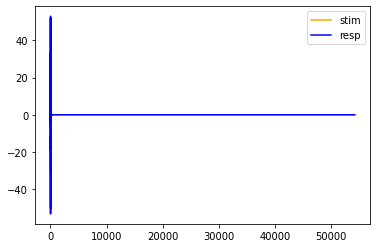

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
results = list()
for type in range(3,4):
  print("Método "+str(type))
  eyedee = str(type)  # ID OF THE EXPERIMENT.
  o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
  num_blocks_start = int(5)
  num_blocks_end   = int(10)
  lambda_          = float(0.01)
  mid_shape        = int(8)
  D                = [0.05,0.02]
  dropout    = 0.05
  learning_rate = 1e-3
  epoch_num  = 20
  batch_size = 2048
  reg_par    = 1e-4
  # o_dim      = 1
  use_all_singular_values = False
  best_only  = True
  print(f"eyedee    : {eyedee}")
  print(f"best_only : {best_only}")
  print(f"epoch_num : {epoch_num}")
  print(f"dropout   : {dropout}")
  device = torch.device('cuda')
  torch.cuda.empty_cache()
  # CREATING A FOLDER TO STORE THE RESULTS
  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales/grupo_"
  path_name = folder_path+f"dmcca_{eyedee}_{lambda_}_{mid_shape}_{D[0]}/"
  # i = 1
  if not path.exists(path_name):
      # path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
      # i = i + 1
  # del i
      os.mkdir(path_name)
      print(path_name)

  def butter_bandpass(lowcut, highcut, fs, order=5):
      nyq = 0.5 * fs
      low = lowcut / nyq
      high = highcut / nyq
      b, a = butter(order, [low, high], btype='band')
      return b, a

  ###############################################
  ## freqs
  fmin = 3  # frecuencia mínima
  fmax = 34 # frecuencia máxima
  BW   = 2  # tamaño de ancho de banda
  overlap = 0.25
  step = BW*(1-overlap) # tamaño de traslape
  freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
  a = list()
  b = list()
  freqs_ = list()
  N = 2 # Numero de orden del filtro
  for fil in range(21):
      b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
      # b_, a_ = butter(N=N,Wn=Wn,btype='band')
      b.append(b_)
      a.append(a_)
  freqs_.append([b,a])
  ###############################################

  ##################### SEED #####################
  seed = np.ceil(np.random.rand(10)*100)
  seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
  print(seed)

  ###############################################
  # D = [0, 0.05, 0.1, 0.2]
  # D = [0.05, 0.2]
  # CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
  # COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
  # lambda_       = 0.1
  # MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
  # IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
  # mid_shape  = 60
  speech_dmcca = True
  if speech_dmcca:
      num_blocks = 10   # IF SPEECH DATA BY LIBERTO ET AL.

      # subs ARE THE SUBJECTS IDS TO WORK WITH
      for subs_ in range(4):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
        subs = [subs_]
        print("Grupo "+str(subs_))
        subs = sorted(subs) # TO KEEP THEIR IDS SORTED
        n_subs = len(subs)

        str_subs = str(subs[0])
        for each_sub in subs[1:]: 
            str_subs += f"_{each_sub}"

        # num_blocks_start = 0
        # num_blocks_end   = 1
        # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
        # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

        tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
        val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

        print(f"n_subs     : {n_subs}")
        print(f"subs       : {subs}")
        print(f"D          : {D}")
        print(f"num_blocks : {num_blocks}")
        print(f"num_blocks_start: {num_blocks_start}")
        print(f"num_blocks_end  : {num_blocks_end}")
        print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

        data_subs_pre = list()
        results_name = f'{path_name}/Datos_{str(type)}.npy'
        if path.exists(results_name):
          data_subs_pre = np.save(results_name)
        else:
          for block in range(num_blocks):
            data_subs_pre.append(load_dmcca_data_cluster(subs, mid_shape, type, block))
            
          # np.save(results_name, data_subs_pre)
        for d_cnt, dropout in enumerate(D):
            for block in range(num_blocks):#(num_blocks_start, num_blocks_end):
                # THE DATA data_subs_pre IS LOADED SUCH THAT 
                # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
                # AND THE LAST LIST HAS STIMULUS
                # data_subs_pre IS A list OF SIZE N+1
                # EACH ELEMENT IS A list OF SIZE 3
                # SUCH THAT
                # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
                # AND
                # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
                
                # DEEP MCCA
                print("DEEP MCCA + LCCA")
                dmlcs, dmdcs = dmcca_method(data_subs_pre[block], "speech", dropout, f"block_{block}_drpt_{dropout}",freqs_)
                tst_corrs[0, block, d_cnt] = dmlcs[0]
                tst_corrs[1, block, d_cnt] = dmdcs[0]
                print(tst_corrs)
                val_corrs[0, block, d_cnt] = dmlcs[1]
                val_corrs[1, block, d_cnt] = dmdcs[1]
                print(val_corrs)
                np.save(tst_corrs_name, tst_corrs)
                np.save(val_corrs_name, val_corrs)              
                print('saved SPEECH')
        results.append([tst_corrs,val_corrs])
      results_name = f'{path_name}/results_{str(type)}.npy'
      np.save(results_name, results)
# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

In [ ]:
data_subs_pre[0][1][0].shape

(155359, 8)

In [ ]:
tst_corrs.shape

(2, 10, 2, 1)

In [ ]:
np.mean(tst_corrs[0,:,0,0])

0.4854182773014032

In [ ]:
np.mean(val_corrs[0,:,0,0])

0.4903429691307405

In [ ]:
tst_corrs[0,:,0,0]

array([0.32581398, 0.7106275 , 0.28615628, 0.63181812, 0.63728037,
       0.64725187, 0.13211255, 0.71718648, 0.73392018, 0.03201544])

In [ ]:
val_corrs[0,:,0,0]

array([0.36238739, 0.62641036, 0.31016445, 0.60540909, 0.62901815,
       0.69910934, 0.13605003, 0.67455066, 0.69992073, 0.16040948])

# RMS

Método 1
eyedee    : 1
best_only : True
epoch_num : 20
dropout   : 0.05
/content/drive/Shareddrives/GCPDS/databases/Databases_musica/grupo_dmcca_1_5_10_0.01_8_0.05/
[37.]
Grupo 3
n_subs     : 1
subs       : [3]
D          : [0.05]
num_blocks : 10
num_blocks_start: 5
num_blocks_end  : 10
num_blocks_net  : 5
Data INITIALIZING for block : 0
stim 205
y_test 164
131 33 41
Stim_train (125730, 1)
Data INITIALIZING for block : 1
stim 205
y_test 164
131 33 41
Stim_train (125803, 1)
Data INITIALIZING for block : 2
stim 205
y_test 164
131 33 41
Stim_train (125734, 1)
Data INITIALIZING for block : 3
stim 205
y_test 164
131 33 41
Stim_train (125489, 1)
Data INITIALIZING for block : 4
stim 205
y_test 164
131 33 41
Stim_train (125573, 1)
Data INITIALIZING for block : 5
stim 205
y_test 164
131 33 41
Stim_train (125489, 1)
Data INITIALIZING for block : 6
stim 205
y_test 164
131 33 41
Stim_train (125489, 1)
Data INITIALIZING for block : 7
stim 205
y_test 164
131 33 41
Stim_train (125487, 1)
Data INITIAL

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.4158038342104171
CCA Model Ended.
LCCA is : [array(0.41580383), array(0.42028759)]
DMDC corrs are : [0.41580383]
DMCCA + DCCA : block_0_drpt_0.05
DCCA for block_0_drpt_0.05_sub_0
seed:     37.0
EPOCH : 0
  Training CORRELATION   : 0.0037
  Validation CORRELATION : 0.0060
  Test CORRELATION       : -0.0234
  val. loss is : -0.0060 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0048


RuntimeError: ignored

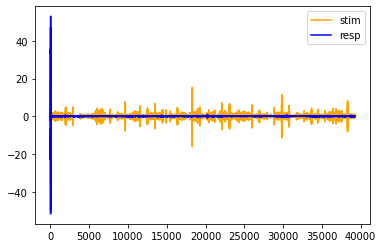

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
results_type2 = list()
for type in range(1,2):
  print("Método "+str(type))
  eyedee = str(type)  # ID OF THE EXPERIMENT.
  o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
  num_blocks_start = int(5)
  num_blocks_end   = int(10)
  lambda_          = float(0.1)
  mid_shape        = int(8)
  D                = [0.05]
  dropout    = 0.05
  learning_rate = 1e-3
  epoch_num  = 20
  batch_size = 2048
  reg_par    = 1e-4
  # o_dim      = 1
  use_all_singular_values = False
  best_only  = True
  print(f"eyedee    : {eyedee}")
  print(f"best_only : {best_only}")
  print(f"epoch_num : {epoch_num}")
  print(f"dropout   : {dropout}")
  device = torch.device('cuda')
  torch.cuda.empty_cache()
  # CREATING A FOLDER TO STORE THE RESULTS
  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/grupo_"
  path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}/"
  i = 1
  while path.exists(path_name):
      path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
      i = i + 1
  del i
  os.mkdir(path_name)
  print(path_name)

  def butter_bandpass(lowcut, highcut, fs, order=5):
      nyq = 0.5 * fs
      low = lowcut / nyq
      high = highcut / nyq
      b, a = butter(order, [low, high], btype='band')
      return b, a

  ###############################################
  ## freqs
  fmin = 3  # frecuencia mínima
  fmax = 34 # frecuencia máxima
  BW   = 2  # tamaño de ancho de banda
  overlap = 0.25
  step = BW*(1-overlap) # tamaño de traslape
  freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
  a = list()
  b = list()
  freqs_ = list()
  N = 2 # Numero de orden del filtro
  for fil in range(21):
      b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
      # b_, a_ = butter(N=N,Wn=Wn,btype='band')
      b.append(b_)
      a.append(a_)
  freqs_.append([b,a])
  ###############################################

  ##################### SEED #####################
  seed = np.ceil(np.random.rand(10)*100)
  seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
  print(seed)

  ###############################################
  # D = [0, 0.05, 0.1, 0.2]
  # D = [0.05, 0.2]
  # CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
  # COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
  # lambda_       = 0.1
  # MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
  # IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
  # mid_shape  = 60
  speech_dmcca = True
  if speech_dmcca:
      num_blocks = 10   # IF SPEECH DATA BY LIBERTO ET AL.
      results = list()
      # subs ARE THE SUBJECTS IDS TO WORK WITH
      for subs_ in range(3,4):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
        subs = [subs_]
        print("Grupo "+str(subs_))
        subs = sorted(subs) # TO KEEP THEIR IDS SORTED
        n_subs = len(subs)

        str_subs = str(subs[0])
        for each_sub in subs[1:]: 
            str_subs += f"_{each_sub}"

        # num_blocks_start = 0
        # num_blocks_end   = 1
        # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
        # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

        tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
        val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

        print(f"n_subs     : {n_subs}")
        print(f"subs       : {subs}")
        print(f"D          : {D}")
        print(f"num_blocks : {num_blocks}")
        print(f"num_blocks_start: {num_blocks_start}")
        print(f"num_blocks_end  : {num_blocks_end}")
        print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

        data_subs_pre = list()
        results_name = f'{path_name}/Datos_{str(type)}.npy'
        if path.exists(results_name):
          data_subs_pre = np.save(results_name)
        else:
          for block in range(num_blocks):
            data_subs_pre.append(load_dmcca_data_cluster(subs, mid_shape, type, block))
          # np.save(results_name, data_subs_pre)
        for d_cnt, dropout in enumerate(D):
            for block in range(num_blocks):#(num_blocks_start, num_blocks_end):
                # THE DATA data_subs_pre IS LOADED SUCH THAT 
                # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
                # AND THE LAST LIST HAS STIMULUS
                # data_subs_pre IS A list OF SIZE N+1
                # EACH ELEMENT IS A list OF SIZE 3
                # SUCH THAT
                # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
                # AND
                # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
                
                # DEEP MCCA
                print("DEEP MCCA + LCCA")
                dmlcs, dmdcs = dmcca_method(data_subs_pre[block], "speech", dropout, f"block_{block}_drpt_{dropout}",freqs_)
                tst_corrs[0, block, d_cnt] = dmlcs[0]
                tst_corrs[1, block, d_cnt] = dmdcs[0]
                print(tst_corrs)
                val_corrs[0, block, d_cnt] = dmlcs[1]
                val_corrs[1, block, d_cnt] = dmdcs[1]
                print(val_corrs)
                np.save(tst_corrs_name, tst_corrs)
                np.save(val_corrs_name, val_corrs)              
                print('saved SPEECH')
        results.append([tst_corrs,val_corrs])
      
  results_type2.append(results)
  results_name = f'{path_name}/results_{str(type)}.npy'
  np.save(results_name, results_type2)
# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

In [ ]:
results_type2.append(results)
results_name = f'{path_name}/results_{str(type)}.npy'
np.save(results_name, results_type2)

In [ ]:
results_type2

[[[array([[[[ 4.94259618e-01],
            [ 5.79059549e-01]],
   
           [[ 2.67989644e-01],
            [ 2.65496012e-01]],
   
           [[ 3.24437745e-01],
            [ 3.44213146e-01]],
   
           [[ 2.41177555e-01],
            [ 2.89817173e-01]],
   
           [[ 5.96824701e-01],
            [ 6.86218289e-01]],
   
           [[ 1.79731718e-01],
            [ 1.70578254e-01]],
   
           [[ 4.53690196e-01],
            [ 2.97717838e-01]],
   
           [[ 5.99590342e-01],
            [ 7.23538129e-01]],
   
           [[ 4.45116117e-01],
            [ 6.61020268e-01]],
   
           [[ 3.70130445e-01],
            [ 4.23085679e-01]]],
   
   
          [[[-3.54672968e-03],
            [ 2.42765527e-03]],
   
           [[-5.49082586e-04],
            [-7.87815172e-03]],
   
           [[-2.66508735e-03],
            [-1.37290999e-03]],
   
           [[-6.44907681e-03],
            [ 9.46872961e-03]],
   
           [[-3.04660969e-03],
            [-1.44731312e-

In [ ]:
import numpy as np
results_type2 = [[[np.array([[[[ 4.94259618e-01],
            [ 5.79059549e-01]],
   
           [[ 2.67989644e-01],
            [ 2.65496012e-01]],
   
           [[ 3.24437745e-01],
            [ 3.44213146e-01]],
   
           [[ 2.41177555e-01],
            [ 2.89817173e-01]],
   
           [[ 5.96824701e-01],
            [ 6.86218289e-01]],
   
           [[ 1.79731718e-01],
            [ 1.70578254e-01]],
   
           [[ 4.53690196e-01],
            [ 2.97717838e-01]],
   
           [[ 5.99590342e-01],
            [ 7.23538129e-01]],
   
           [[ 4.45116117e-01],
            [ 6.61020268e-01]],
   
           [[ 3.70130445e-01],
            [ 4.23085679e-01]]],
   
   
          [[[-3.54672968e-03],
            [ 2.42765527e-03]],
   
           [[-5.49082586e-04],
            [-7.87815172e-03]],
   
           [[-2.66508735e-03],
            [-1.37290999e-03]],
   
           [[-6.44907681e-03],
            [ 9.46872961e-03]],
   
           [[-3.04660969e-03],
            [-1.44731312e-05]],
   
           [[ 2.37902743e-03],
            [-6.11808500e-04]],
   
           [[-7.10096769e-03],
            [-1.35152694e-02]],
   
           [[-5.47311315e-03],
            [-1.61148496e-02]],
   
           [[-6.77838689e-03],
            [ 5.22545399e-03]],
   
           [[-1.47149526e-02],
            [ 1.44529482e-02]]]]), np.array([[[[ 4.91887041e-01],
            [ 5.91875076e-01]],
   
           [[ 3.18471027e-01],
            [ 3.28324843e-01]],
   
           [[ 3.25336266e-01],
            [ 3.47133830e-01]],
   
           [[ 2.15814693e-01],
            [ 2.45180265e-01]],
   
           [[ 6.54061771e-01],
            [ 7.53555812e-01]],
   
           [[ 2.10111605e-01],
            [ 1.94534437e-01]],
   
           [[ 4.32654183e-01],
            [ 3.18362918e-01]],
   
           [[ 6.03324676e-01],
            [ 7.69781211e-01]],
   
           [[ 4.81631007e-01],
            [ 6.84012820e-01]],
   
           [[ 3.94119298e-01],
            [ 4.34081105e-01]]],
   
   
          [[[-3.54672968e-03],
            [ 2.42765527e-03]],
   
           [[-5.49082586e-04],
            [-7.87815172e-03]],
   
           [[-2.66508735e-03],
            [-1.37290999e-03]],
   
           [[-6.44907681e-03],
            [ 9.46872961e-03]],
   
           [[-3.04660969e-03],
            [-1.44731312e-05]],
   
           [[ 2.37902743e-03],
            [-6.11808500e-04]],
   
           [[-7.10096769e-03],
            [-1.35152694e-02]],
   
           [[-5.47311315e-03],
            [-1.61148496e-02]],
   
           [[-6.77838689e-03],
            [ 5.22545399e-03]],
   
           [[-1.47149526e-02],
            [ 1.44529482e-02]]]])], [np.array([[[[ 2.83751913e-01],
            [ 2.20468240e-01]],
   
           [[ 7.48356582e-01],
            [ 8.49683306e-01]],
   
           [[ 4.05920376e-01],
            [ 7.05919869e-01]],
   
           [[ 3.74309156e-01],
            [ 6.66037087e-01]],
   
           [[ 2.12901058e-01],
            [ 2.79943985e-01]],
   
           [[ 4.05565628e-01],
            [ 6.35066378e-01]],
   
           [[ 4.05066274e-01],
            [ 6.94198655e-01]],
   
           [[ 4.14458309e-01],
            [ 7.44570614e-01]],
   
           [[ 6.87099377e-01],
            [ 8.33332687e-01]],
   
           [[ 3.36246781e-01],
            [ 3.65580436e-01]]],
   
   
          [[[ 5.23004960e-03],
            [ 8.89487751e-03]],
   
           [[ 3.67678655e-03],
            [ 9.92756337e-03]],
   
           [[ 1.97990052e-03],
            [ 3.03623849e-03]],
   
           [[ 2.61926022e-03],
            [ 1.22158183e-03]],
   
           [[-8.80183280e-03],
            [-2.60536117e-03]],
   
           [[ 5.88233722e-03],
            [ 4.83655138e-03]],
   
           [[ 4.28667711e-03],
            [ 6.53783651e-03]],
   
           [[ 3.31309927e-03],
            [-3.70150339e-03]],
   
           [[ 2.08121864e-03],
            [-5.39159111e-04]],
   
           [[-1.84088964e-02],
            [-3.66601138e-03]]]]), np.array([[[[ 3.04921304e-01],
            [ 2.58697534e-01]],
   
           [[ 7.20581961e-01],
            [ 8.20266684e-01]],
   
           [[ 4.17078693e-01],
            [ 7.14439883e-01]],
   
           [[ 3.76333739e-01],
            [ 6.75025061e-01]],
   
           [[ 2.33836684e-01],
            [ 3.07513292e-01]],
   
           [[ 4.64536950e-01],
            [ 7.16800254e-01]],
   
           [[ 4.61437819e-01],
            [ 7.61779138e-01]],
   
           [[ 3.96914132e-01],
            [ 7.32742934e-01]],
   
           [[ 6.12943601e-01],
            [ 7.67193073e-01]],
   
           [[ 3.92232757e-01],
            [ 4.06168187e-01]]],
   
   
          [[[ 5.23004960e-03],
            [ 8.89487751e-03]],
   
           [[ 3.67678655e-03],
            [ 9.92756337e-03]],
   
           [[ 1.97990052e-03],
            [ 3.03623849e-03]],
   
           [[ 2.61926022e-03],
            [ 1.22158183e-03]],
   
           [[-8.80183280e-03],
            [-2.60536117e-03]],
   
           [[ 5.88233722e-03],
            [ 4.83655138e-03]],
   
           [[ 4.28667711e-03],
            [ 6.53783651e-03]],
   
           [[ 3.31309927e-03],
            [-3.70150339e-03]],
   
           [[ 2.08121864e-03],
            [-5.39159111e-04]],
   
           [[-1.84088964e-02],
            [-3.66601138e-03]]]])], [np.array([[[[ 5.97154459e-01],
            [ 7.06972036e-01]],
   
           [[ 4.45388574e-01],
            [ 3.52329558e-01]],
   
           [[ 3.94146210e-01],
            [ 3.86931862e-01]],
   
           [[ 3.93798282e-01],
            [ 5.77830242e-01]],
   
           [[ 4.06979821e-01],
            [ 7.98702512e-01]],
   
           [[ 4.76202140e-01],
            [ 8.31538614e-01]],
   
           [[ 7.03062195e-01],
            [ 7.83827674e-01]],
   
           [[ 4.01428263e-01],
            [ 7.31885707e-01]],
   
           [[ 3.08113940e-01],
            [ 4.09294190e-01]],
   
           [[ 2.20380767e-01],
            [ 4.41711356e-01]]],
   
   
          [[[ 8.93880334e-03],
            [-8.55403603e-04]],
   
           [[-2.98513379e-03],
            [ 3.14573990e-03]],
   
           [[-1.39431413e-02],
            [-1.01239495e-02]],
   
           [[ 1.65602323e-02],
            [ 9.16025427e-04]],
   
           [[ 6.23173267e-03],
            [-4.00091894e-03]],
   
           [[-3.73121002e-03],
            [-2.87920493e-03]],
   
           [[ 3.23006175e-02],
            [ 1.34551395e-02]],
   
           [[-4.85806540e-03],
            [-1.72517803e-02]],
   
           [[-3.16303084e-03],
            [ 2.06793635e-03]],
   
           [[ 2.72791870e-02],
            [-5.41542948e-04]]]]), np.array([[[[ 5.93669034e-01],
            [ 7.13702923e-01]],
   
           [[ 5.42515474e-01],
            [ 4.46237040e-01]],
   
           [[ 4.66189166e-01],
            [ 4.39808350e-01]],
   
           [[ 4.28963348e-01],
            [ 6.16440149e-01]],
   
           [[ 5.54692022e-01],
            [ 7.70461999e-01]],
   
           [[ 5.12501657e-01],
            [ 8.55344873e-01]],
   
           [[ 7.24423356e-01],
            [ 7.34022370e-01]],
   
           [[ 3.88923290e-01],
            [ 6.98618658e-01]],
   
           [[ 3.04763787e-01],
            [ 4.23407802e-01]],
   
           [[ 2.52981937e-01],
            [ 5.19600671e-01]]],
   
   
          [[[ 8.93880334e-03],
            [-8.55403603e-04]],
   
           [[-2.98513379e-03],
            [ 3.14573990e-03]],
   
           [[-1.39431413e-02],
            [-1.01239495e-02]],
   
           [[ 1.65602323e-02],
            [ 9.16025427e-04]],
   
           [[ 6.23173267e-03],
            [-4.00091894e-03]],
   
           [[-3.73121002e-03],
            [-2.87920493e-03]],
   
           [[ 3.23006175e-02],
            [ 1.34551395e-02]],
   
           [[-4.85806540e-03],
            [-1.72517803e-02]],
   
           [[-3.16303084e-03],
            [ 2.06793635e-03]],
   
           [[ 2.72791870e-02],
            [-5.41542948e-04]]]])], [np.array([[[[ 0.27047712],
            [ 0.27769075]],
   
           [[ 0.51018498],
            [ 0.73955962]],
   
           [[ 0.3563054 ],
            [ 0.38679034]],
   
           [[ 0.38260686],
            [ 0.41377217]],
   
           [[ 0.18036123],
            [ 0.24240422]],
   
           [[ 0.31140761],
            [ 0.35863455]],
   
           [[ 0.55904585],
            [ 0.61151175]],
   
           [[ 0.37271205],
            [ 0.3901318 ]],
   
           [[ 0.39896191],
            [ 0.42359755]],
   
           [[ 0.27126981],
            [ 0.79545193]]],
   
   
          [[[ 0.00741817],
            [-0.00580089]],
   
           [[ 0.00667923],
            [-0.00933049]],
   
           [[ 0.00931477],
            [ 0.00860611]],
   
           [[ 0.01767049],
            [-0.05301914]],
   
           [[ 0.04044234],
            [ 0.01158386]],
   
           [[ 0.00153484],
            [ 0.00403161]],
   
           [[-0.00905639],
            [ 0.01750603]],
   
           [[ 0.00701124],
            [ 0.01899123]],
   
           [[ 0.01718635],
            [ 0.00454506]],
   
           [[-0.00858871],
            [ 0.02624677]]]]), np.array([[[[ 0.21852548],
            [ 0.22370762]],
   
           [[ 0.5186394 ],
            [ 0.73029161]],
   
           [[ 0.37386977],
            [ 0.40748311]],
   
           [[ 0.33791077],
            [ 0.3624945 ]],
   
           [[ 0.29485751],
            [ 0.3623007 ]],
   
           [[ 0.20893159],
            [ 0.46194727]],
   
           [[ 0.55585835],
            [ 0.60940802]],
   
           [[ 0.44275511],
            [ 0.42187102]],
   
           [[ 0.41816027],
            [ 0.47744724]],
   
           [[ 0.30148462],
            [ 0.76686753]]],
   
   
          [[[ 0.00741817],
            [-0.00580089]],
   
           [[ 0.00667923],
            [-0.00933049]],
   
           [[ 0.00931477],
            [ 0.00860611]],
   
           [[ 0.01767049],
            [-0.05301914]],
   
           [[ 0.04044234],
            [ 0.01158386]],
   
           [[ 0.00153484],
            [ 0.00403161]],
   
           [[-0.00905639],
            [ 0.01750603]],
   
           [[ 0.00701124],
            [ 0.01899123]],
   
           [[ 0.01718635],
            [ 0.00454506]],
   
           [[-0.00858871],
            [ 0.02624677]]]])]]]

In [ ]:
len(results_type2[0])

4

In [ ]:
np.mean(results_type2[0][2][0][0,:,0,0])

0.4346654651

In [ ]:
np.mean(results_type2[0][3][0][0,:,0,0])

0.36133328200000003

# 80-20 organizado

In [ ]:
data_subs_pre[0][1][0].shape

(155359, 8)

In [ ]:
tst_corrs.shape

(2, 10, 2, 1)

In [ ]:
np.mean(tst_corrs[0,:,0,0])

0.49195455464798615

In [ ]:
np.mean(val_corrs[0,:,0,0])

0.49137048314316256

In [ ]:
tst_corrs[0,:,0,0]

array([0.39993089, 0.39327756, 0.59244889, 0.5691353 , 0.63333561,
       0.4081389 , 0.47815258, 0.4851035 , 0.52413746, 0.43588486])

In [ ]:
val_corrs[0,:,0,0]

array([0.35045887, 0.44065526, 0.52919204, 0.54193274, 0.65220043,
       0.43283592, 0.47189807, 0.49252803, 0.54225904, 0.45974442])

# prueba organizando el CV

Método 1
eyedee    : 1
best_only : True
epoch_num : 20
dropout   : 0.05
/content/drive/Shareddrives/GCPDS/databases/Databases_musica/grupo_dmcca_1_5_10_0.1_8_0.05_42/
[52.]
Grupo 0
n_subs     : 1
subs       : [0]
D          : [0.05, 0.02]
num_blocks : 10
num_blocks_start: 5
num_blocks_end  : 10
num_blocks_net  : 5
Data INITIALIZING for block : 0


/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_split.py:296: FutureWarning: Setting a random_state has no effect since shuffle is False. This will raise an error in 0.24. You should leave random_state to its default (None), or set shuffle=True.
  FutureWarning


TRAIN: [ 22  23  24  25  26  27  28  29  30  31  32  33  34  35  36  37  38  39
  40  41  42  43  44  45  46  47  48  49  50  51  52  53  54  55  56  57
  58  59  60  61  62  63  64  65  66  67  68  69  70  71  72  73  74  75
  76  77  78  79  80  81  82  83  84  85  86  87  88  89  90  91  92  93
  94  95  96  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111
 112 113 114 115 116 117 118 119 120 121 122 123 124 125 126 127 128 129
 130 131 132 133 134 135 136 137 138 139 140 141 142 143 144 145 146 147
 148 149 150 151 152 153 154 155 156 157 158 159 160 161 162 163 164 165
 166 167 168 169 170 171 172 173 174 175 176 177 178 179 180 181 182 183
 184 185 186 187 188 189 190 191 192 193 194 195 196 197 198 199 200 201
 202 203 204 205 206 207 208 209 210 211 212 213 214 215] TEST: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21]
Stim_train (185952, 1)
TRAIN: [  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  44  45  46

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


DEEP MCCA + LCCA
Started multiway DCCA.
19
8
seed:     52.0
Started training.


/content/drive/Shareddrives/GCPDS/databases/Databases_musica/toolbox_deep/deep-cca-for-audio-EEG/deep_losses.py:35: UserWarning: torch.symeig is deprecated in favor of torch.linalg.eigh and will be removed in a future PyTorch release.
The default behavior has changed from using the upper triangular portion of the matrix by default to using the lower triangular portion.
L, _ = torch.symeig(A, upper=upper)
should be replaced with
L = torch.linalg.eigvalsh(A, UPLO='U' if upper else 'L')
and
L, V = torch.symeig(A, eigenvectors=True)
should be replaced with
L, V = torch.linalg.eigh(A, UPLO='U' if upper else 'L') (Triggered internally at  /pytorch/aten/src/ATen/native/BatchLinearAlgebra.cpp:2500.)
  [D1, V1] = torch.symeig(SigmaHat11, eigenvectors=True)


EPOCH : 0
  Training corr LOSS   : 0.3162
0.31622778288610687 - 0.6153053477570251 = 0.25469720363616943
  Validation corr LOSS : 0.3162
0.3162277936935425 - 0.41133183240890503 = 0.275094598531723
torch.Size([51737, 27])
  Test corr LOSS       : 0.3162
0.3162277638912201 - 0.592204749584198 = 0.25700730085372925
  val. loss is : -0.2751 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training corr LOSS   : 0.3162
0.3162277786286323 - 0.6153691076970362 = 0.25469091534614563
  Validation corr LOSS : 0.3162
0.3162277638912201 - 0.4152040183544159 = 0.2747073769569397
torch.Size([51737, 27])
  Test corr LOSS       : 0.3162
0.3162277936935425 - 0.5880674123764038 = 0.2574210464954376
  val. loss is : -0.2747 & the min. loss is : -0.2751
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training corr LOSS   : 0.3162
0.3162277789561303 - 0.6152601602313282 = 0.25470176339149475
  Validat

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.35982062008882126
CCA Model Ended.
LCCA is : [array(0.35982062), array(0.54489863)]
DMDC corrs are : [0.35982062]
DMCCA + DCCA : block_0_drpt_0.05
DCCA for block_0_drpt_0.05_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0067
  Validation CORRELATION : 0.0042
  Test CORRELATION       : 0.0073
  val. loss is : -0.0042 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0103
  Validation CORRELATION : 0.0067
  Test CORRELATION       : 0.0057
  val. loss is : -0.0067 & the min. loss is : -0.0042
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0112
  Validation CORRELATION : 0.0044
  Test CORRELATION       : -0.0072
  val. loss is : -0.0044 & the min. loss is : -0.0067
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : -0.0101
  Validation CORRELATION : -0.0413


The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00146905, dtype=float32), array(0.00146905, dtype=float32)]
DMDC corrs are : [0.00146905]
DONE speech - block_0_drpt_0.05.
[[[[0.35982062]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]]


 [[[0.00146905]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]]]
[[[[0.54489863]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.23208322819651633
CCA Model Ended.
LCCA is : [array(0.23208323), array(0.35568044)]
DMDC corrs are : [0.23208323]
DMCCA + DCCA : block_1_drpt_0.05
DCCA for block_1_drpt_0.05_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0061
  Validation CORRELATION : 0.0022
  Test CORRELATION       : 0.0015
  val. loss is : -0.0022 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0090
  Validation CORRELATION : 0.0089
  Test CORRELATION       : 0.0006
  val. loss is : -0.0089 & the min. loss is : -0.0022
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : nan
  Validation CORRELATION : 0.0046
  Test CORRELATION       : -0.0004
  val. loss is : -0.0046 & the min. loss is : -0.0089
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0132
  Validation CORRELATION : 0.0056
  Test

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00242969, dtype=float32), array(0.00242969, dtype=float32)]
DMDC corrs are : [0.00242969]
DONE speech - block_1_drpt_0.05.
[[[[0.35982062]
   [0.        ]]

  [[0.23208323]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]]


 [[[0.00146905]
   [0.        ]]

  [[0.00242969]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]]]
[[[[0.54489863]
   [0.        ]]

  [[0.35568044]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.13276178754232515
CCA Model Ended.
LCCA is : [array(0.13276179), array(0.2118918)]
DMDC corrs are : [0.13276179]
DMCCA + DCCA : block_2_drpt_0.05
DCCA for block_2_drpt_0.05_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0055
  Validation CORRELATION : -0.0008
  Test CORRELATION       : 0.0177
  val. loss is : 0.0008 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0148
  Validation CORRELATION : 0.0168
  Test CORRELATION       : -0.0080
  val. loss is : -0.0168 & the min. loss is : 0.0008
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0049
  Validation CORRELATION : 0.0380
  Test CORRELATION       : 0.0028
  val. loss is : -0.0380 & the min. loss is : -0.0168
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0037
  Validation CORRELATION : 0.0089
  Test C

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00275761, dtype=float32), array(0.00275761, dtype=float32)]
DMDC corrs are : [0.00275761]
DONE speech - block_2_drpt_0.05.
[[[[0.35982062]
   [0.        ]]

  [[0.23208323]
   [0.        ]]

  [[0.13276179]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]]


 [[[0.00146905]
   [0.        ]]

  [[0.00242969]
   [0.        ]]

  [[0.00275761]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]]]
[[[[0.54489863]
   [0.        ]]

  [[0.35568044]
   [0.        ]]

  [[0.2118918 ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.6317235986545434
CCA Model Ended.
LCCA is : [array(0.6317236), array(0.76730598)]
DMDC corrs are : [0.6317236]
DMCCA + DCCA : block_3_drpt_0.05
DCCA for block_3_drpt_0.05_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0084
  Validation CORRELATION : 0.0188
  Test CORRELATION       : 0.0084
  val. loss is : -0.0188 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : nan
  Validation CORRELATION : -0.0006
  Test CORRELATION       : -0.0042
  val. loss is : 0.0006 & the min. loss is : -0.0188
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0063
  Validation CORRELATION : 0.0026
  Test CORRELATION       : 0.0014
  val. loss is : -0.0026 & the min. loss is : -0.0188
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0005
  Validation CORRELATION : -0.0110
  

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00837454, dtype=float32), array(0.00837454, dtype=float32)]
DMDC corrs are : [0.00837454]
DONE speech - block_3_drpt_0.05.
[[[[0.35982062]
   [0.        ]]

  [[0.23208323]
   [0.        ]]

  [[0.13276179]
   [0.        ]]

  [[0.6317236 ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]]


 [[[0.00146905]
   [0.        ]]

  [[0.00242969]
   [0.        ]]

  [[0.00275761]
   [0.        ]]

  [[0.00837454]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0.        ]
   [0.        ]]]]
[[[[0.54489863]
   [0.        ]]

  [[0.35568044]
   [0.        ]]

  [[0.2118918 ]
   [0.        ]]

  [[0.76730598]
   [0.        ]]

  [[0.        ]
   [0.        ]]

  [[0

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.4064149910255206
CCA Model Ended.
LCCA is : [array(0.40641499), array(0.61867052)]
DMDC corrs are : [0.40641499]
DMCCA + DCCA : block_4_drpt_0.05
DCCA for block_4_drpt_0.05_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0030
  Validation CORRELATION : 0.0229
  Test CORRELATION       : 0.0054
  val. loss is : -0.0229 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0002
  Validation CORRELATION : 0.0208
  Test CORRELATION       : -0.0036
  val. loss is : -0.0208 & the min. loss is : -0.0229
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0017
  Validation CORRELATION : -0.0308
  Test CORRELATION       : -0.0084
  val. loss is : 0.0308 & the min. loss is : -0.0229
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0045
  Validation CORRELATION : 0.0

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(4.5303594e-05, dtype=float32), array(4.5303594e-05, dtype=float32)]
DMDC corrs are : [4.53035937e-05]
DONE speech - block_4_drpt_0.05.
[[[[3.59820620e-01]
   [0.00000000e+00]]

  [[2.32083228e-01]
   [0.00000000e+00]]

  [[1.32761788e-01]
   [0.00000000e+00]]

  [[6.31723599e-01]
   [0.00000000e+00]]

  [[4.06414991e-01]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]]


 [[[1.46905228e-03]
   [0.00000000e+00]]

  [[2.42968765e-03]
   [0.00000000e+00]]

  [[2.75760586e-03]
   [0.00000000e+00]]

  [[8.37453734e-03]
   [0.00000000e+00]]

  [[4.53035937e-05]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]]]
[[[[5

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.13493420935856687
CCA Model Ended.
LCCA is : [array(0.13493421), array(0.22855312)]
DMDC corrs are : [0.13493421]
DMCCA + DCCA : block_5_drpt_0.05
DCCA for block_5_drpt_0.05_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0051
  Validation CORRELATION : -0.0002
  Test CORRELATION       : 0.0112
  val. loss is : 0.0002 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0108
  Validation CORRELATION : 0.0015
  Test CORRELATION       : 0.0055
  val. loss is : -0.0015 & the min. loss is : 0.0002
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0116
  Validation CORRELATION : 0.0097
  Test CORRELATION       : -0.0024
  val. loss is : -0.0097 & the min. loss is : -0.0015
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0127
  Validation CORRELATION : 0.0039
  Tes

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.01540646, dtype=float32), array(0.01540646, dtype=float32)]
DMDC corrs are : [0.01540646]
DONE speech - block_5_drpt_0.05.
[[[[3.59820620e-01]
   [0.00000000e+00]]

  [[2.32083228e-01]
   [0.00000000e+00]]

  [[1.32761788e-01]
   [0.00000000e+00]]

  [[6.31723599e-01]
   [0.00000000e+00]]

  [[4.06414991e-01]
   [0.00000000e+00]]

  [[1.34934209e-01]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]]


 [[[1.46905228e-03]
   [0.00000000e+00]]

  [[2.42968765e-03]
   [0.00000000e+00]]

  [[2.75760586e-03]
   [0.00000000e+00]]

  [[8.37453734e-03]
   [0.00000000e+00]]

  [[4.53035937e-05]
   [0.00000000e+00]]

  [[1.54064633e-02]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]]]
[[[[5.44898628e

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.5115358658705289
CCA Model Ended.
LCCA is : [array(0.51153587), array(0.64591052)]
DMDC corrs are : [0.51153587]
DMCCA + DCCA : block_6_drpt_0.05
DCCA for block_6_drpt_0.05_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : -0.0006
  Validation CORRELATION : -0.0100
  Test CORRELATION       : -0.0075
  val. loss is : 0.0100 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0120
  Validation CORRELATION : -0.0357
  Test CORRELATION       : 0.0033
  val. loss is : 0.0357 & the min. loss is : 0.0100
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : -0.0050
  Validation CORRELATION : 0.0346
  Test CORRELATION       : 0.0081
  val. loss is : -0.0346 & the min. loss is : 0.0100
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0049
  Validation CORRELATION : 0.0153
  T

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00239628, dtype=float32), array(0.00239628, dtype=float32)]
DMDC corrs are : [0.00239628]
DONE speech - block_6_drpt_0.05.
[[[[3.59820620e-01]
   [0.00000000e+00]]

  [[2.32083228e-01]
   [0.00000000e+00]]

  [[1.32761788e-01]
   [0.00000000e+00]]

  [[6.31723599e-01]
   [0.00000000e+00]]

  [[4.06414991e-01]
   [0.00000000e+00]]

  [[1.34934209e-01]
   [0.00000000e+00]]

  [[5.11535866e-01]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]]


 [[[1.46905228e-03]
   [0.00000000e+00]]

  [[2.42968765e-03]
   [0.00000000e+00]]

  [[2.75760586e-03]
   [0.00000000e+00]]

  [[8.37453734e-03]
   [0.00000000e+00]]

  [[4.53035937e-05]
   [0.00000000e+00]]

  [[1.54064633e-02]
   [0.00000000e+00]]

  [[2.39627738e-03]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]

  [[0.00000000e+00]
   [0.00000000e+00]]]]
[[[[5.44898628e

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.45194371295216423
CCA Model Ended.
LCCA is : [array(0.45194371), array(0.6538816)]
DMDC corrs are : [0.45194371]
DMCCA + DCCA : block_7_drpt_0.05
DCCA for block_7_drpt_0.05_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : -0.0075
  Validation CORRELATION : -0.0056
  Test CORRELATION       : -0.0020
  val. loss is : 0.0056 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0088
  Validation CORRELATION : -0.0314
  Test CORRELATION       : 0.0050
  val. loss is : 0.0314 & the min. loss is : 0.0056
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0038
  Validation CORRELATION : -0.0240
  Test CORRELATION       : 0.0026
  val. loss is : 0.0240 & the min. loss is : 0.0056
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : -0.0014
  Validation CORRELATION : -0.00

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00111251, dtype=float32), array(-0.00111251, dtype=float32)]
DMDC corrs are : [-0.00111251]
DONE speech - block_7_drpt_0.05.
[[[[ 3.59820620e-01]
   [ 0.00000000e+00]]

  [[ 2.32083228e-01]
   [ 0.00000000e+00]]

  [[ 1.32761788e-01]
   [ 0.00000000e+00]]

  [[ 6.31723599e-01]
   [ 0.00000000e+00]]

  [[ 4.06414991e-01]
   [ 0.00000000e+00]]

  [[ 1.34934209e-01]
   [ 0.00000000e+00]]

  [[ 5.11535866e-01]
   [ 0.00000000e+00]]

  [[ 4.51943713e-01]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]]


 [[[ 1.46905228e-03]
   [ 0.00000000e+00]]

  [[ 2.42968765e-03]
   [ 0.00000000e+00]]

  [[ 2.75760586e-03]
   [ 0.00000000e+00]]

  [[ 8.37453734e-03]
   [ 0.00000000e+00]]

  [[ 4.53035937e-05]
   [ 0.00000000e+00]]

  [[ 1.54064633e-02]
   [ 0.00000000e+00]]

  [[ 2.39627738e-03]
   [ 0.00000000e+00]]

  [[-1.11250731e-03]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]

  [[ 0.00000000e+

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.0883932145293422
CCA Model Ended.
LCCA is : [array(0.08839321), array(0.17914058)]
DMDC corrs are : [0.08839321]
DMCCA + DCCA : block_8_drpt_0.05
DCCA for block_8_drpt_0.05_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0158
  Validation CORRELATION : -0.0095
  Test CORRELATION       : 0.0153
  val. loss is : 0.0095 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0156
  Validation CORRELATION : -0.0089
  Test CORRELATION       : 0.0049
  val. loss is : 0.0089 & the min. loss is : 0.0095
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0186
  Validation CORRELATION : -0.0067
  Test CORRELATION       : -0.0007
  val. loss is : 0.0067 & the min. loss is : 0.0089
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0018
  Validation CORRELATION : -0.0055
  Test C

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00606, dtype=float32), array(-0.00606, dtype=float32)]
DMDC corrs are : [-0.00606]
DONE speech - block_8_drpt_0.05.
[[[[ 3.59820620e-01]
   [ 0.00000000e+00]]

  [[ 2.32083228e-01]
   [ 0.00000000e+00]]

  [[ 1.32761788e-01]
   [ 0.00000000e+00]]

  [[ 6.31723599e-01]
   [ 0.00000000e+00]]

  [[ 4.06414991e-01]
   [ 0.00000000e+00]]

  [[ 1.34934209e-01]
   [ 0.00000000e+00]]

  [[ 5.11535866e-01]
   [ 0.00000000e+00]]

  [[ 4.51943713e-01]
   [ 0.00000000e+00]]

  [[ 8.83932145e-02]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 0.00000000e+00]]]


 [[[ 1.46905228e-03]
   [ 0.00000000e+00]]

  [[ 2.42968765e-03]
   [ 0.00000000e+00]]

  [[ 2.75760586e-03]
   [ 0.00000000e+00]]

  [[ 8.37453734e-03]
   [ 0.00000000e+00]]

  [[ 4.53035937e-05]
   [ 0.00000000e+00]]

  [[ 1.54064633e-02]
   [ 0.00000000e+00]]

  [[ 2.39627738e-03]
   [ 0.00000000e+00]]

  [[-1.11250731e-03]
   [ 0.00000000e+00]]

  [[-6.06000377e-03]
   [ 0.00000000e+00]]

  [[ 0.00000000e+00]
   [ 

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.07693655994873871
CCA Model Ended.
LCCA is : [array(0.07693656), array(0.12128948)]
DMDC corrs are : [0.07693656]
DMCCA + DCCA : block_9_drpt_0.05
DCCA for block_9_drpt_0.05_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0211
  Validation CORRELATION : -0.0060
  Test CORRELATION       : 0.0117
  val. loss is : 0.0060 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0006
  Validation CORRELATION : -0.0106
  Test CORRELATION       : 0.0130
  val. loss is : 0.0106 & the min. loss is : 0.0060
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0036
  Validation CORRELATION : -0.0005
  Test CORRELATION       : 0.0176
  val. loss is : 0.0005 & the min. loss is : 0.0060
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0107
  Validation CORRELATION : -0.0021
  T

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.01607017, dtype=float32), array(0.01607017, dtype=float32)]
DMDC corrs are : [0.01607017]
DONE speech - block_9_drpt_0.05.
[[[[ 3.59820620e-01]
   [ 0.00000000e+00]]

  [[ 2.32083228e-01]
   [ 0.00000000e+00]]

  [[ 1.32761788e-01]
   [ 0.00000000e+00]]

  [[ 6.31723599e-01]
   [ 0.00000000e+00]]

  [[ 4.06414991e-01]
   [ 0.00000000e+00]]

  [[ 1.34934209e-01]
   [ 0.00000000e+00]]

  [[ 5.11535866e-01]
   [ 0.00000000e+00]]

  [[ 4.51943713e-01]
   [ 0.00000000e+00]]

  [[ 8.83932145e-02]
   [ 0.00000000e+00]]

  [[ 7.69365599e-02]
   [ 0.00000000e+00]]]


 [[[ 1.46905228e-03]
   [ 0.00000000e+00]]

  [[ 2.42968765e-03]
   [ 0.00000000e+00]]

  [[ 2.75760586e-03]
   [ 0.00000000e+00]]

  [[ 8.37453734e-03]
   [ 0.00000000e+00]]

  [[ 4.53035937e-05]
   [ 0.00000000e+00]]

  [[ 1.54064633e-02]
   [ 0.00000000e+00]]

  [[ 2.39627738e-03]
   [ 0.00000000e+00]]

  [[-1.11250731e-03]
   [ 0.00000000e+00]]

  [[-6.06000377e-03]
   [ 0.00000000e+00]]

  [[ 1.60701666e-02]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.2657080103627259
CCA Model Ended.
LCCA is : [array(0.26570801), array(0.43331805)]
DMDC corrs are : [0.26570801]
DMCCA + DCCA : block_0_drpt_0.02
DCCA for block_0_drpt_0.02_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0135
  Validation CORRELATION : -0.0504
  Test CORRELATION       : 0.0166
  val. loss is : 0.0504 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0067
  Validation CORRELATION : -0.0033
  Test CORRELATION       : -0.0034
  val. loss is : 0.0033 & the min. loss is : 0.0504
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0047
  Validation CORRELATION : 0.0100
  Test CORRELATION       : 0.0024
  val. loss is : -0.0100 & the min. loss is : 0.0033
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0067
  Validation CORRELATION : -0.0001
  Test CO

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00601635, dtype=float32), array(0.00601635, dtype=float32)]
DMDC corrs are : [0.00601635]
DONE speech - block_0_drpt_0.02.
[[[[ 3.59820620e-01]
   [ 2.65708010e-01]]

  [[ 2.32083228e-01]
   [ 0.00000000e+00]]

  [[ 1.32761788e-01]
   [ 0.00000000e+00]]

  [[ 6.31723599e-01]
   [ 0.00000000e+00]]

  [[ 4.06414991e-01]
   [ 0.00000000e+00]]

  [[ 1.34934209e-01]
   [ 0.00000000e+00]]

  [[ 5.11535866e-01]
   [ 0.00000000e+00]]

  [[ 4.51943713e-01]
   [ 0.00000000e+00]]

  [[ 8.83932145e-02]
   [ 0.00000000e+00]]

  [[ 7.69365599e-02]
   [ 0.00000000e+00]]]


 [[[ 1.46905228e-03]
   [ 6.01634569e-03]]

  [[ 2.42968765e-03]
   [ 0.00000000e+00]]

  [[ 2.75760586e-03]
   [ 0.00000000e+00]]

  [[ 8.37453734e-03]
   [ 0.00000000e+00]]

  [[ 4.53035937e-05]
   [ 0.00000000e+00]]

  [[ 1.54064633e-02]
   [ 0.00000000e+00]]

  [[ 2.39627738e-03]
   [ 0.00000000e+00]]

  [[-1.11250731e-03]
   [ 0.00000000e+00]]

  [[-6.06000377e-03]
   [ 0.00000000e+00]]

  [[ 1.60701666e-02]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.2455184846437196
CCA Model Ended.
LCCA is : [array(0.24551848), array(0.38604506)]
DMDC corrs are : [0.24551848]
DMCCA + DCCA : block_1_drpt_0.02
DCCA for block_1_drpt_0.02_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0082
  Validation CORRELATION : 0.0050
  Test CORRELATION       : 0.0117
  val. loss is : -0.0050 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0041
  Validation CORRELATION : 0.0024
  Test CORRELATION       : 0.0091
  val. loss is : -0.0024 & the min. loss is : -0.0050
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0032
  Validation CORRELATION : -0.0097
  Test CORRELATION       : 0.0136
  val. loss is : 0.0097 & the min. loss is : -0.0050
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0162
  Validation CORRELATION : -0.0018

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.01462967, dtype=float32), array(0.01462967, dtype=float32)]
DMDC corrs are : [0.01462967]
DONE speech - block_1_drpt_0.02.
[[[[ 3.59820620e-01]
   [ 2.65708010e-01]]

  [[ 2.32083228e-01]
   [ 2.45518485e-01]]

  [[ 1.32761788e-01]
   [ 0.00000000e+00]]

  [[ 6.31723599e-01]
   [ 0.00000000e+00]]

  [[ 4.06414991e-01]
   [ 0.00000000e+00]]

  [[ 1.34934209e-01]
   [ 0.00000000e+00]]

  [[ 5.11535866e-01]
   [ 0.00000000e+00]]

  [[ 4.51943713e-01]
   [ 0.00000000e+00]]

  [[ 8.83932145e-02]
   [ 0.00000000e+00]]

  [[ 7.69365599e-02]
   [ 0.00000000e+00]]]


 [[[ 1.46905228e-03]
   [ 6.01634569e-03]]

  [[ 2.42968765e-03]
   [ 1.46296667e-02]]

  [[ 2.75760586e-03]
   [ 0.00000000e+00]]

  [[ 8.37453734e-03]
   [ 0.00000000e+00]]

  [[ 4.53035937e-05]
   [ 0.00000000e+00]]

  [[ 1.54064633e-02]
   [ 0.00000000e+00]]

  [[ 2.39627738e-03]
   [ 0.00000000e+00]]

  [[-1.11250731e-03]
   [ 0.00000000e+00]]

  [[-6.06000377e-03]
   [ 0.00000000e+00]]

  [[ 1.60701666e-02]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.17194163378173724
CCA Model Ended.
LCCA is : [array(0.17194163), array(0.29152511)]
DMDC corrs are : [0.17194163]
DMCCA + DCCA : block_2_drpt_0.02
DCCA for block_2_drpt_0.02_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0037
  Validation CORRELATION : -0.0300
  Test CORRELATION       : 0.0046
  val. loss is : 0.0300 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0056
  Validation CORRELATION : -0.0342
  Test CORRELATION       : -0.0079
  val. loss is : 0.0342 & the min. loss is : 0.0300
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0038
  Validation CORRELATION : -0.0261
  Test CORRELATION       : 0.0044
  val. loss is : 0.0261 & the min. loss is : 0.0300
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0007
  Validation CORRELATION : -0.0315
  T

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.0136972, dtype=float32), array(0.0136972, dtype=float32)]
DMDC corrs are : [0.0136972]
DONE speech - block_2_drpt_0.02.
[[[[ 3.59820620e-01]
   [ 2.65708010e-01]]

  [[ 2.32083228e-01]
   [ 2.45518485e-01]]

  [[ 1.32761788e-01]
   [ 1.71941634e-01]]

  [[ 6.31723599e-01]
   [ 0.00000000e+00]]

  [[ 4.06414991e-01]
   [ 0.00000000e+00]]

  [[ 1.34934209e-01]
   [ 0.00000000e+00]]

  [[ 5.11535866e-01]
   [ 0.00000000e+00]]

  [[ 4.51943713e-01]
   [ 0.00000000e+00]]

  [[ 8.83932145e-02]
   [ 0.00000000e+00]]

  [[ 7.69365599e-02]
   [ 0.00000000e+00]]]


 [[[ 1.46905228e-03]
   [ 6.01634569e-03]]

  [[ 2.42968765e-03]
   [ 1.46296667e-02]]

  [[ 2.75760586e-03]
   [ 1.36972005e-02]]

  [[ 8.37453734e-03]
   [ 0.00000000e+00]]

  [[ 4.53035937e-05]
   [ 0.00000000e+00]]

  [[ 1.54064633e-02]
   [ 0.00000000e+00]]

  [[ 2.39627738e-03]
   [ 0.00000000e+00]]

  [[-1.11250731e-03]
   [ 0.00000000e+00]]

  [[-6.06000377e-03]
   [ 0.00000000e+00]]

  [[ 1.60701666e-02]
  

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.6134387779546301
CCA Model Ended.
LCCA is : [array(0.61343878), array(0.75086548)]
DMDC corrs are : [0.61343878]
DMCCA + DCCA : block_3_drpt_0.02
DCCA for block_3_drpt_0.02_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : -0.0092
  Validation CORRELATION : -0.0269
  Test CORRELATION       : 0.0024
  val. loss is : 0.0269 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0002
  Validation CORRELATION : 0.0334
  Test CORRELATION       : -0.0009
  val. loss is : -0.0334 & the min. loss is : 0.0269
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : nan
  Validation CORRELATION : 0.0002
  Test CORRELATION       : 0.0005
  val. loss is : -0.0002 & the min. loss is : -0.0334
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : nan
  Validation CORRELATION : nan
  Test CORR

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.02311615, dtype=float32), array(0.02311615, dtype=float32)]
DMDC corrs are : [0.02311615]
DONE speech - block_3_drpt_0.02.
[[[[ 3.59820620e-01]
   [ 2.65708010e-01]]

  [[ 2.32083228e-01]
   [ 2.45518485e-01]]

  [[ 1.32761788e-01]
   [ 1.71941634e-01]]

  [[ 6.31723599e-01]
   [ 6.13438778e-01]]

  [[ 4.06414991e-01]
   [ 0.00000000e+00]]

  [[ 1.34934209e-01]
   [ 0.00000000e+00]]

  [[ 5.11535866e-01]
   [ 0.00000000e+00]]

  [[ 4.51943713e-01]
   [ 0.00000000e+00]]

  [[ 8.83932145e-02]
   [ 0.00000000e+00]]

  [[ 7.69365599e-02]
   [ 0.00000000e+00]]]


 [[[ 1.46905228e-03]
   [ 6.01634569e-03]]

  [[ 2.42968765e-03]
   [ 1.46296667e-02]]

  [[ 2.75760586e-03]
   [ 1.36972005e-02]]

  [[ 8.37453734e-03]
   [ 2.31161509e-02]]

  [[ 4.53035937e-05]
   [ 0.00000000e+00]]

  [[ 1.54064633e-02]
   [ 0.00000000e+00]]

  [[ 2.39627738e-03]
   [ 0.00000000e+00]]

  [[-1.11250731e-03]
   [ 0.00000000e+00]]

  [[-6.06000377e-03]
   [ 0.00000000e+00]]

  [[ 1.60701666e-02]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.5157013614427716
CCA Model Ended.
LCCA is : [array(0.51570136), array(0.70247893)]
DMDC corrs are : [0.51570136]
DMCCA + DCCA : block_4_drpt_0.02
DCCA for block_4_drpt_0.02_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : -0.0038
  Validation CORRELATION : -0.0254
  Test CORRELATION       : 0.0031
  val. loss is : 0.0254 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0056
  Validation CORRELATION : -0.0181
  Test CORRELATION       : 0.0017
  val. loss is : 0.0181 & the min. loss is : 0.0254
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : nan
  Validation CORRELATION : 0.0001
  Test CORRELATION       : -0.0000
  val. loss is : -0.0001 & the min. loss is : 0.0181
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : 0.0042
  Validation CORRELATION : 0.0234
  Test CORR

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00625481, dtype=float32), array(0.00625481, dtype=float32)]
DMDC corrs are : [0.00625481]
DONE speech - block_4_drpt_0.02.
[[[[ 3.59820620e-01]
   [ 2.65708010e-01]]

  [[ 2.32083228e-01]
   [ 2.45518485e-01]]

  [[ 1.32761788e-01]
   [ 1.71941634e-01]]

  [[ 6.31723599e-01]
   [ 6.13438778e-01]]

  [[ 4.06414991e-01]
   [ 5.15701361e-01]]

  [[ 1.34934209e-01]
   [ 0.00000000e+00]]

  [[ 5.11535866e-01]
   [ 0.00000000e+00]]

  [[ 4.51943713e-01]
   [ 0.00000000e+00]]

  [[ 8.83932145e-02]
   [ 0.00000000e+00]]

  [[ 7.69365599e-02]
   [ 0.00000000e+00]]]


 [[[ 1.46905228e-03]
   [ 6.01634569e-03]]

  [[ 2.42968765e-03]
   [ 1.46296667e-02]]

  [[ 2.75760586e-03]
   [ 1.36972005e-02]]

  [[ 8.37453734e-03]
   [ 2.31161509e-02]]

  [[ 4.53035937e-05]
   [ 6.25480944e-03]]

  [[ 1.54064633e-02]
   [ 0.00000000e+00]]

  [[ 2.39627738e-03]
   [ 0.00000000e+00]]

  [[-1.11250731e-03]
   [ 0.00000000e+00]]

  [[-6.06000377e-03]
   [ 0.00000000e+00]]

  [[ 1.60701666e-02]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.1485721684466299
CCA Model Ended.
LCCA is : [array(0.14857217), array(0.29393785)]
DMDC corrs are : [0.14857217]
DMCCA + DCCA : block_5_drpt_0.02
DCCA for block_5_drpt_0.02_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0057
  Validation CORRELATION : -0.0074
  Test CORRELATION       : 0.0047
  val. loss is : 0.0074 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0033
  Validation CORRELATION : 0.0008
  Test CORRELATION       : 0.0077
  val. loss is : -0.0008 & the min. loss is : 0.0074
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : 0.0122
  Validation CORRELATION : -0.0043
  Test CORRELATION       : 0.0079
  val. loss is : 0.0043 & the min. loss is : -0.0008
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0041
  Validation CORRELATION : 0.0077
  Te

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00487272, dtype=float32), array(-0.00487272, dtype=float32)]
DMDC corrs are : [-0.00487272]
DONE speech - block_5_drpt_0.02.
[[[[ 3.59820620e-01]
   [ 2.65708010e-01]]

  [[ 2.32083228e-01]
   [ 2.45518485e-01]]

  [[ 1.32761788e-01]
   [ 1.71941634e-01]]

  [[ 6.31723599e-01]
   [ 6.13438778e-01]]

  [[ 4.06414991e-01]
   [ 5.15701361e-01]]

  [[ 1.34934209e-01]
   [ 1.48572168e-01]]

  [[ 5.11535866e-01]
   [ 0.00000000e+00]]

  [[ 4.51943713e-01]
   [ 0.00000000e+00]]

  [[ 8.83932145e-02]
   [ 0.00000000e+00]]

  [[ 7.69365599e-02]
   [ 0.00000000e+00]]]


 [[[ 1.46905228e-03]
   [ 6.01634569e-03]]

  [[ 2.42968765e-03]
   [ 1.46296667e-02]]

  [[ 2.75760586e-03]
   [ 1.36972005e-02]]

  [[ 8.37453734e-03]
   [ 2.31161509e-02]]

  [[ 4.53035937e-05]
   [ 6.25480944e-03]]

  [[ 1.54064633e-02]
   [-4.87272115e-03]]

  [[ 2.39627738e-03]
   [ 0.00000000e+00]]

  [[-1.11250731e-03]
   [ 0.00000000e+00]]

  [[-6.06000377e-03]
   [ 0.00000000e+00]]

  [[ 1.60701666e-

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.48509595923293286
CCA Model Ended.
LCCA is : [array(0.48509596), array(0.61834897)]
DMDC corrs are : [0.48509596]
DMCCA + DCCA : block_6_drpt_0.02
DCCA for block_6_drpt_0.02_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0035
  Validation CORRELATION : -0.0010
  Test CORRELATION       : 0.0021
  val. loss is : 0.0010 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is False
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0052
  Validation CORRELATION : -0.0059
  Test CORRELATION       : 0.0034
  val. loss is : 0.0059 & the min. loss is : 0.0010
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : nan
  Validation CORRELATION : 0.0004
  Test CORRELATION       : -0.0016
  val. loss is : -0.0004 & the min. loss is : 0.0010
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 2

EPOCH : 3
  Training CORRELATION   : -0.0076
  Validation CORRELATION : 0.0079
  Test

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(-0.00859677, dtype=float32), array(-0.00859677, dtype=float32)]
DMDC corrs are : [-0.00859677]
DONE speech - block_6_drpt_0.02.
[[[[ 3.59820620e-01]
   [ 2.65708010e-01]]

  [[ 2.32083228e-01]
   [ 2.45518485e-01]]

  [[ 1.32761788e-01]
   [ 1.71941634e-01]]

  [[ 6.31723599e-01]
   [ 6.13438778e-01]]

  [[ 4.06414991e-01]
   [ 5.15701361e-01]]

  [[ 1.34934209e-01]
   [ 1.48572168e-01]]

  [[ 5.11535866e-01]
   [ 4.85095959e-01]]

  [[ 4.51943713e-01]
   [ 0.00000000e+00]]

  [[ 8.83932145e-02]
   [ 0.00000000e+00]]

  [[ 7.69365599e-02]
   [ 0.00000000e+00]]]


 [[[ 1.46905228e-03]
   [ 6.01634569e-03]]

  [[ 2.42968765e-03]
   [ 1.46296667e-02]]

  [[ 2.75760586e-03]
   [ 1.36972005e-02]]

  [[ 8.37453734e-03]
   [ 2.31161509e-02]]

  [[ 4.53035937e-05]
   [ 6.25480944e-03]]

  [[ 1.54064633e-02]
   [-4.87272115e-03]]

  [[ 2.39627738e-03]
   [-8.59677326e-03]]

  [[-1.11250731e-03]
   [ 0.00000000e+00]]

  [[-6.06000377e-03]
   [ 0.00000000e+00]]

  [[ 1.60701666e-

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.2665032937441899
CCA Model Ended.
LCCA is : [array(0.26650329), array(0.41411359)]
DMDC corrs are : [0.26650329]
DMCCA + DCCA : block_7_drpt_0.02
DCCA for block_7_drpt_0.02_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0040
  Validation CORRELATION : 0.0110
  Test CORRELATION       : 0.0048
  val. loss is : -0.0110 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : 0.0141
  Validation CORRELATION : 0.0124
  Test CORRELATION       : 0.0047
  val. loss is : -0.0124 & the min. loss is : -0.0110
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 1

EPOCH : 2
  Training CORRELATION   : -0.0051
  Validation CORRELATION : 0.0099
  Test CORRELATION       : -0.0003
  val. loss is : -0.0099 & the min. loss is : -0.0124
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 1.

EPOCH : 3
  Training CORRELATION   : 0.0008
  Validation CORRELATION : -0.0229
  

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.00062566, dtype=float32), array(0.00062566, dtype=float32)]
DMDC corrs are : [0.00062566]
DONE speech - block_7_drpt_0.02.
[[[[ 3.59820620e-01]
   [ 2.65708010e-01]]

  [[ 2.32083228e-01]
   [ 2.45518485e-01]]

  [[ 1.32761788e-01]
   [ 1.71941634e-01]]

  [[ 6.31723599e-01]
   [ 6.13438778e-01]]

  [[ 4.06414991e-01]
   [ 5.15701361e-01]]

  [[ 1.34934209e-01]
   [ 1.48572168e-01]]

  [[ 5.11535866e-01]
   [ 4.85095959e-01]]

  [[ 4.51943713e-01]
   [ 2.66503294e-01]]

  [[ 8.83932145e-02]
   [ 0.00000000e+00]]

  [[ 7.69365599e-02]
   [ 0.00000000e+00]]]


 [[[ 1.46905228e-03]
   [ 6.01634569e-03]]

  [[ 2.42968765e-03]
   [ 1.46296667e-02]]

  [[ 2.75760586e-03]
   [ 1.36972005e-02]]

  [[ 8.37453734e-03]
   [ 2.31161509e-02]]

  [[ 4.53035937e-05]
   [ 6.25480944e-03]]

  [[ 1.54064633e-02]
   [-4.87272115e-03]]

  [[ 2.39627738e-03]
   [-8.59677326e-03]]

  [[-1.11250731e-03]
   [ 6.25663728e-04]]

  [[-6.06000377e-03]
   [ 0.00000000e+00]]

  [[ 1.60701666e-02]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


0.5670110099101062
CCA Model Ended.
LCCA is : [array(0.56701101), array(0.61572093)]
DMDC corrs are : [0.56701101]
DMCCA + DCCA : block_8_drpt_0.02
DCCA for block_8_drpt_0.02_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : -0.0183
  Validation CORRELATION : 0.0776
  Test CORRELATION       : 0.0412
  val. loss is : -0.0776 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0153
  Validation CORRELATION : 0.0467
  Test CORRELATION       : 0.0070
  val. loss is : -0.0467 & the min. loss is : -0.0776
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : nan
  Validation CORRELATION : 0.0001
  Test CORRELATION       : -0.0001
  val. loss is : -0.0001 & the min. loss is : -0.0776
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : nan
  Validation CORRELATION : 0.0059
  T

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.04300904, dtype=float32), array(0.04300904, dtype=float32)]
DMDC corrs are : [0.04300904]
DONE speech - block_8_drpt_0.02.
[[[[ 3.59820620e-01]
   [ 2.65708010e-01]]

  [[ 2.32083228e-01]
   [ 2.45518485e-01]]

  [[ 1.32761788e-01]
   [ 1.71941634e-01]]

  [[ 6.31723599e-01]
   [ 6.13438778e-01]]

  [[ 4.06414991e-01]
   [ 5.15701361e-01]]

  [[ 1.34934209e-01]
   [ 1.48572168e-01]]

  [[ 5.11535866e-01]
   [ 4.85095959e-01]]

  [[ 4.51943713e-01]
   [ 2.66503294e-01]]

  [[ 8.83932145e-02]
   [ 5.67011010e-01]]

  [[ 7.69365599e-02]
   [ 0.00000000e+00]]]


 [[[ 1.46905228e-03]
   [ 6.01634569e-03]]

  [[ 2.42968765e-03]
   [ 1.46296667e-02]]

  [[ 2.75760586e-03]
   [ 1.36972005e-02]]

  [[ 8.37453734e-03]
   [ 2.31161509e-02]]

  [[ 4.53035937e-05]
   [ 6.25480944e-03]]

  [[ 1.54064633e-02]
   [-4.87272115e-03]]

  [[ 2.39627738e-03]
   [-8.59677326e-03]]

  [[-1.11250731e-03]
   [ 6.25663728e-04]]

  [[-6.06000377e-03]
   [ 4.30090390e-02]]

  [[ 1.60701666e-02]

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DMDC corrs are : [0.13599451]
DMCCA + DCCA : block_9_drpt_0.02
DCCA for block_9_drpt_0.02_sub_0
seed:     52.0
EPOCH : 0
  Training CORRELATION   : 0.0201
  Validation CORRELATION : 0.0093
  Test CORRELATION       : 0.0208
  val. loss is : -0.0093 & the min. loss is : 0.0000
  AND since, val_loss < min_loss is True
  Saved the model at epoch : 0

EPOCH : 1
  Training CORRELATION   : -0.0049
  Validation CORRELATION : -0.0080
  Test CORRELATION       : 0.0179
  val. loss is : 0.0080 & the min. loss is : -0.0093
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 2
  Training CORRELATION   : 0.0001
  Validation CORRELATION : 0.0071
  Test CORRELATION       : 0.0192
  val. loss is : -0.0071 & the min. loss is : -0.0093
  AND since, val_loss < min_loss is False
  Loaded the model from epoch : 0.

EPOCH : 3
  Training CORRELATION   : 0.0042
  Validation CORRELATION : -0.0037
  Test CORRELATION       : 0.0179
  val. loss is : 0.0037 & the min. loss is : -0.0

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


DCCA is : [array(0.01891714, dtype=float32), array(0.01891714, dtype=float32)]
DMDC corrs are : [0.01891714]
DONE speech - block_9_drpt_0.02.
[[[[ 3.59820620e-01]
   [ 2.65708010e-01]]

  [[ 2.32083228e-01]
   [ 2.45518485e-01]]

  [[ 1.32761788e-01]
   [ 1.71941634e-01]]

  [[ 6.31723599e-01]
   [ 6.13438778e-01]]

  [[ 4.06414991e-01]
   [ 5.15701361e-01]]

  [[ 1.34934209e-01]
   [ 1.48572168e-01]]

  [[ 5.11535866e-01]
   [ 4.85095959e-01]]

  [[ 4.51943713e-01]
   [ 2.66503294e-01]]

  [[ 8.83932145e-02]
   [ 5.67011010e-01]]

  [[ 7.69365599e-02]
   [ 1.35994512e-01]]]


 [[[ 1.46905228e-03]
   [ 6.01634569e-03]]

  [[ 2.42968765e-03]
   [ 1.46296667e-02]]

  [[ 2.75760586e-03]
   [ 1.36972005e-02]]

  [[ 8.37453734e-03]
   [ 2.31161509e-02]]

  [[ 4.53035937e-05]
   [ 6.25480944e-03]]

  [[ 1.54064633e-02]
   [-4.87272115e-03]]

  [[ 2.39627738e-03]
   [-8.59677326e-03]]

  [[-1.11250731e-03]
   [ 6.25663728e-04]]

  [[-6.06000377e-03]
   [ 4.30090390e-02]]

  [[ 1.60701666e-02]

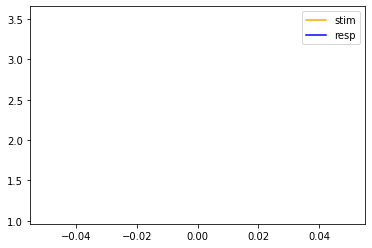

In [ ]:
# name_of_the_script = sys.argv[0].split('.')[0]
# a = sys.argv[1:]
from scipy.signal import butter
results = list()
for type in range(1,2):
  print("Método "+str(type))
  eyedee = str(type)  # ID OF THE EXPERIMENT.
  o_dim = int(1)   # THE INTERESTED OUTPUTS DIMENSIONALITY
  num_blocks_start = int(5)
  num_blocks_end   = int(10)
  lambda_          = float(0.1)
  mid_shape        = int(8)
  D                = [0.05,0.02]
  dropout    = 0.05
  learning_rate = 1e-3
  epoch_num  = 20
  batch_size = 2048
  reg_par    = 1e-4
  # o_dim      = 1
  use_all_singular_values = False
  best_only  = True
  print(f"eyedee    : {eyedee}")
  print(f"best_only : {best_only}")
  print(f"epoch_num : {epoch_num}")
  print(f"dropout   : {dropout}")
  device = torch.device('cuda')
  torch.cuda.empty_cache()
  # CREATING A FOLDER TO STORE THE RESULTS
  folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/grupo_"
  path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}/"
  i = 1
  while path.exists(path_name):
      path_name = folder_path+f"dmcca_{eyedee}_{num_blocks_start}_{num_blocks_end}_{lambda_}_{mid_shape}_{D[0]}_{i}/"
      i = i + 1
  del i
  os.mkdir(path_name)
  print(path_name)

  def butter_bandpass(lowcut, highcut, fs, order=5):
      nyq = 0.5 * fs
      low = lowcut / nyq
      high = highcut / nyq
      b, a = butter(order, [low, high], btype='band')
      return b, a

  ###############################################
  ## freqs
  fmin = 3  # frecuencia mínima
  fmax = 34 # frecuencia máxima
  BW   = 2  # tamaño de ancho de banda
  overlap = 0.25
  step = BW*(1-overlap) # tamaño de traslape
  freqs = np.asarray([[i-BW/2,i+BW/2] for i in np.arange(fmin,fmax,step)])
  a = list()
  b = list()
  freqs_ = list()
  N = 2 # Numero de orden del filtro
  for fil in range(21):
      b_, a_ = butter_bandpass(freqs[fil,0], freqs[fil,1], 80, order=3)
      # b_, a_ = butter(N=N,Wn=Wn,btype='band')
      b.append(b_)
      a.append(a_)
  freqs_.append([b,a])
  ###############################################

  ##################### SEED #####################
  seed = np.ceil(np.random.rand(10)*100)
  seed = np.ceil(np.random.rand(1)*100) * np.ones(1)
  print(seed)

  ###############################################
  # D = [0, 0.05, 0.1, 0.2]
  # D = [0.05, 0.2]
  # CAN REPLACE D WITH A SINGLE ELEMENT LIST WHOSE VALUE IS EQUAL TO THE DESIRED DROPOUT.
  # COEFFICIENT TO THE MSE REGULARIZATION LOSS OF THE DECODER
  # lambda_       = 0.1
  # MIDDLE LAYER UNITS IN THE DMCCA ARCHITECTURE
  # IS ALSO THE TIME-LAGS APPLIED TO THE STIMULUS
  # mid_shape  = 60
  speech_dmcca = True
  if speech_dmcca:
      num_blocks = 10   # IF SPEECH DATA BY LIBERTO ET AL.

      # subs ARE THE SUBJECTS IDS TO WORK WITH
      for subs_ in range(1):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
        subs = [subs_]
        print("Grupo "+str(subs_))
        subs = sorted(subs) # TO KEEP THEIR IDS SORTED
        n_subs = len(subs)

        str_subs = str(subs[0])
        for each_sub in subs[1:]: 
            str_subs += f"_{each_sub}"

        # num_blocks_start = 0
        # num_blocks_end   = 1
        # CAN CHANGE BOTH VALUES ACCORDING TO THE INTERESTED CROSS-VALIDATION EXPERIMENTS.
        # CAN SUBMIT THESE TWO AS THE ARGUMENTS AND PARSE OVER THERE, FOR BULK EXPERIMENTS.

        tst_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        val_corrs = np.zeros((2, num_blocks, len(D), n_subs))
        tst_corrs_name =  f'{path_name}/speech_corrs_{str_subs}.npy'
        val_corrs_name =  f'{path_name}/speech_corrs_val_{str_subs}.npy'

        print(f"n_subs     : {n_subs}")
        print(f"subs       : {subs}")
        print(f"D          : {D}")
        print(f"num_blocks : {num_blocks}")
        print(f"num_blocks_start: {num_blocks_start}")
        print(f"num_blocks_end  : {num_blocks_end}")
        print(f"num_blocks_net  : {num_blocks_end - num_blocks_start}")

        results_name = f'{path_name}/Datos_{str(type)}.npy'
        if path.exists(results_name):
          data_subs_pre = np.save(results_name)
        else:
          block = 0
          data_subs_pre = load_dmcca_data_cluster(subs, mid_shape, type, block)
          np.save(results_name, data_subs_pre)
        for d_cnt, dropout in enumerate(D):
            for block in range(num_blocks):#(num_blocks_start, num_blocks_end):
                # THE DATA data_subs_pre IS LOADED SUCH THAT 
                # ALL THE N EEG RESPONSES ARE LOADED IN THE FIRST N LISTS
                # AND THE LAST LIST HAS STIMULUS
                # data_subs_pre IS A list OF SIZE N+1
                # EACH ELEMENT IS A list OF SIZE 3
                # SUCH THAT
                # data_subs_pre[n] = [TRAINING_DATA, VALIDATION_DATA, TESTING_DATA]
                # AND
                # data_subs_pre[n][j].shape = [Number_of_samples, dimensions]
                
                # DEEP MCCA
                print("DEEP MCCA + LCCA")
                dmlcs, dmdcs = dmcca_method(data_subs_pre[block], "speech", dropout, f"block_{block}_drpt_{dropout}",freqs_)
                tst_corrs[0, block, d_cnt] = dmlcs[0]
                tst_corrs[1, block, d_cnt] = dmdcs[0]
                print(tst_corrs)
                val_corrs[0, block, d_cnt] = dmlcs[1]
                val_corrs[1, block, d_cnt] = dmdcs[1]
                print(val_corrs)
                np.save(tst_corrs_name, tst_corrs)
                np.save(val_corrs_name, val_corrs)              
                print('saved SPEECH')
        results.append([tst_corrs,val_corrs])
      results_name = f'{path_name}/results_{str(type)}.npy'
      np.save(results_name, results)
# FOR CUSTOM,
# ONE CAN REPLACE THE all_data LIST WITH THE INTERESTED DATASET.
# all_data IS A LIST OF N+1 ITEMS
# FIRST N ITEMS BELONG TO EEG RECORDINGS OF N SUBJECTS RESPECTIVELY.
# LAST  1 ITEM BELONGS TO THE COMMON STIMULI PROVIDED TO ALL THE SUBJECTS
# EACH ITEM OF THE (N+1) LENGTH LIST IS ARRANGED AS 
# [TRAINING_DATA, VALIDATION_DATA, TEST_DATA]
# EACH OF THESE DATA ARE IN THE SHAPE : NUMBER OF SAMPLES X VECTOR DIMENSION OF EACH SAMPLE
#
# AFTER LOADING THE DATA INTO all_data,
# ONE CAN CALL THE dmcca_method FUNCTION ON IT
# Then process the data through PCA and filterbank
# Then provide the data to LCCA or DCCA models to obtain final representations

In [ ]:
tst_corrs.shape

(2, 10, 2, 1)

In [ ]:
np.mean(tst_corrs[0,:,0,0])

0.30265477881670677

In [ ]:
np.mean(val_corrs[0,:,0,0])

0.4327222667717686

In [ ]:
tst_corrs[0,:,0,0]

array([0.35982062, 0.23208323, 0.13276179, 0.6317236 , 0.40641499,
       0.13493421, 0.51153587, 0.45194371, 0.08839321, 0.07693656])

In [ ]:
val_corrs[0,:,0,0]

array([0.54489863, 0.35568044, 0.2118918 , 0.76730598, 0.61867052,
       0.22855312, 0.64591052, 0.6538816 , 0.17914058, 0.12128948])

In [ ]:
import numpy as np
from sklearn.model_selection import train_test_split
X, y = np.arange(10).reshape((5, 2)), range(5)
X





list(y)


[0, 1, 2, 3, 4]

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=1)

X_train



array([[8, 9],
       [0, 1],
       [6, 7]])

In [ ]:
! pip install mido
! pip install rtmidi

     |████████████████████████████████| 51 kB 408 kB/s 
  Created wheel for rtmidi: filename=rtmidi-2.3.4-cp37-cp37m-linux_x86_64.whl size=277949 sha256=024337c14846502f4387d650906c2e2c3f8c4f33edd11d0a915574bc48512605
  Stored in directory: /root/.cache/pip/wheels/ac/28/8d/f3e2513e88bd3b33b43ad287c81816cdfdce1f30d23d59d124
Successfully built rtmidi


In [ ]:
import mido

middleC = 60
msg = mido.Message('note_on', note=middleC, velocity=64)
outport = mido.open_output('IAC Driver pioneer')
outport.send(msg)

# load model cca CX, organiza datos rotados

In [ ]:
Cx_sub = list()
Corr_sub = list()

cv_t = list()
for type in range(1,2):
  Cx_ = list()
  cv_s = list()
  indx_s = list()
  Corr_type = list()
  lista_data_sub = list()
  for subs_ in range(4):  # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
    eyedee = str(type)  # ID OF THE EXPERIMENT.
    o_dim = int(1)      # THE INTERESTED OUTPUTS DIMENSIONALITY
    num_blocks_start = int(5)
    num_blocks_end   = int(10)
    lambda_          = float(0.01)
    mid_shape        = int(80)
    D                = [0.05]
    dropout    = 0.05
    learning_rate = 1e-3
    epoch_num  = 20
    batch_size = 2048
    reg_par   = 1e-4
    folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales/grupo_cx_componentes_"
    folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/" # Path to the data folder here
    path_name = folder_path+f"dmcca_{eyedee}_{lambda_}_{mid_shape}_{D[0]}"
    dataset   = "speech"
    num_blocks = 10 # numero de folds
    wei_cx = list()
    Corr_f = list()
    # data   = list()
    tst_corrs_name =  f'{path_name}/speech_corrs_{subs_}.npy'
    if type == 1:
      resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_env_cx (1).mat")["resp"][0]
      indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_env_cx (1).mat")["matriz_selec"]
    elif type ==2:
      resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_RMS_cx.mat")["resp"][0]
      indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_RMS_cx.mat")["matriz_selec"]
    elif type ==3:
      resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_spectralflux_cx.mat")["resp"][0]
      indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_spectralflux_cx.mat")["matriz_selec"]
    elif type ==4:
      resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_PC1_cx.mat")["resp"][0]
      indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_PC1_cx.mat")["matriz_selec"]
    
    cv = list()
    train_ = list()
    val_   = list() # estandar escaler 
    test_  = list()
    # for d_cnt, dropout in enumerate(D):
    for block in range(num_blocks):
      datos_ = np.linspace(1, len(resp_data), num= len(resp_data))
      x_train_, x_test_ = train_test_split(datos_, test_size= 0.2,random_state=block)
      # print(x_train_)
      # x_train, x_test = train_test_split(resp_data, test_size= 0.2,random_state=block)
      # print('resp_data '+str(len(resp_data)))
      # print("X_train "+str(len(x_train)))
      # validation is now 80-20% of the initial data set
      x_train, x_val = train_test_split(x_train_, test_size=0.2, random_state=0)
      # print(len(x_train), len(x_val), len(x_test_))
      cv.append([x_train,x_val,x_test_])

      saving_name_root = f"block_{block}_drpt_{dropout}_sub_{subs_}"
      # saving_name_root = f"block_{block}_drpt_{dropout}" 
      save_model_name = f"{path_name}/{dataset}_dmcca_model_{saving_name_root}.path.tar"
      model = torch.load(save_model_name)
      wei_cx.append(model.state_dict()['enc_net0.one.weight'].cpu().detach().numpy())
      saving_name_root = f"block_{block}_drpt_{dropout}_sub_{subs_}"
      # data  = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.02_sub_{subs_}.pkl', 'rb'))
      # data.append(pkl.load(open(f'{path_name}/{dataset}_dmlc_data_{saving_name_root}.pkl', 'rb')))
      train = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.02_sub_{subs_}.pkl', 'rb'))[0][1][0]
      train_.append(np.reshape(train,(len(x_train),resp_data[0].shape[0],resp_data[0].shape[1])))
      val = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.02_sub_{subs_}.pkl', 'rb'))[1][1][0]
      val_.append(np.reshape(val,(len(x_val),resp_data[0].shape[0],resp_data[0].shape[1])))
      test = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.02_sub_{subs_}.pkl', 'rb'))[2][1][0]
      test_.append(np.reshape(test,(len(x_test_),resp_data[0].shape[0],resp_data[0].shape[1])))
      # results_name = f'{path_name}/results_{str(type)}.npy'
      # Corr_f.append()
    Corr_type.append(np.load(tst_corrs_name))
    Cx_.append(np.asarray(wei_cx))
    aa    = 0
    folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
    indx_ = np.reshape(indx,(indx.shape[0]*indx.shape[1]))
    posi  = np.where(indx_ == 1)[0]
    dat_cv = list()
    lista_data_fold = list()
    for fold in range(num_blocks):
      a1 = 0
      a2 = 0
      a3 = 0
      lista_ord_data = np.zeros((1240,59,171))
      datos_ind_2= np.zeros((1240))
      for tr in range(posi.shape[0]):
        if np.where(np.sort(cv[fold][0].astype(int))==tr)[0].shape[0]>0:
          datos_ind_2[posi[tr]] = 1
          lista_ord_data[tr] = train_[fold][np.where(cv[fold][0].astype(int)==tr)[0][0],:,:]
        elif np.where(np.sort(cv[fold][1].astype(int))==tr)[0].shape[0]>0:
          datos_ind_2[posi[tr]] = 2
          lista_ord_data[tr] = train_[fold][np.where(cv[fold][1].astype(int)==tr)[0][0],:,:]
        elif np.where(np.sort(cv[fold][2].astype(int))==tr)[0].shape[0]>0:
          datos_ind_2[posi[tr]] = 3
          lista_ord_data[tr] = train_[fold][np.where(cv[fold][2].astype(int)==tr)[0][0],:,:]
    
      lista_data_fold.append(lista_ord_data)
      dat_cv.append(datos_ind_2)
    cv_s.append(dat_cv)
    lista_data_sub.append(lista_data_fold)
    indx_s.append(indx_*(subs_+1))
  Corr_sub.append(Corr_type)
  Cx_sub.append(Cx_)

cv_sujetos = list()
datos_fold_ = list()
for fold in range(num_blocks):
  mat1 = cv_s[0][fold].reshape([31,40])
  mat2 = cv_s[1][fold].reshape([31,40])
  mat3 = cv_s[2][fold].reshape([31,40])
  mat4 = cv_s[3][fold].reshape([31,40])
  cv_sujetos.append(mat1+mat2+mat3+mat4)
  datos_fold =list()
  for tr in range(1240):
    datos_fold.append(lista_data_sub[0][fold][tr,:,:]+lista_data_sub[1][fold][tr,:,:]+\
                      lista_data_sub[2][fold][tr,:,:]+lista_data_sub[3][fold][tr,:,:])
  datos_fold_.append(datos_fold)

In [ ]:
datos_fold_[0][0].shape == datos_fold_[1][0].shape

True

In [ ]:
len(datos_fold_[0])

1240

# load model cca Cx

In [ ]:
Cx_sub   = list()
Corr_sub = list()
M_sub    = list()
cv_t = list()
for type in range(1,5):
  Cx_    = list()
  cv_s   = list()
  m_     = list()
  indx_s = list()
  Corr_type = list()
  lista_data_sub = list()
  for subs_ in range(1,2):  # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
    eyedee = str(type)  # ID OF THE EXPERIMENT.
    o_dim  = int(1)      # THE INTERESTED OUTPUTS DIMENSIONALITY
    num_blocks_start = int(5)
    num_blocks_end   = int(10)
    lambda_          = float(0.01)
    mid_shape        = int(80)
    D                = [0.05]
    dropout    = 0.05
    learning_rate = 1e-3
    epoch_num  = 20
    batch_size = 2048
    reg_par    = 1e-4
    folder_path= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales_all/grupo_cx_"
    folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
    path_name  = folder_path+f"dmcca_{eyedee}_{lambda_}_{mid_shape}_{D[0]}"
    dataset    = "speech"
    num_blocks = 10 # numero de folds
    wei_cx = list()
    wei_m  = list()
    Corr_f = list()
    # data   = list()
    tst_corrs_name =  f'{path_name}/speech_corrs_{subs_}.npy'
    if type == 1:
      resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_env_cx_all.mat")["resp"][0]
      indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_env_cx_all.mat")["matriz_selec"]
    elif type ==2:
      resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["resp"][0]
      indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["matriz_selec"]
    elif type ==3:
      resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["resp"][0]
      indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["matriz_selec"]
    elif type ==4:
      resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["resp"][0]
      indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["matriz_selec"]
    
    cv = list()
    train_ = list()
    val_   = list() # estandar escaler 
    test_  = list()
    kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
    # for d_cnt, dropout in enumerate(D):
    datos_ = np.linspace(1, len(resp_data), num= len(resp_data))
    block =0
    datos_ = np.linspace(1, len(resp_data), num= len(resp_data))
    for train_index, test_index in kf.split(datos_):
      # print("TRAIN:", train_index, "TEST:", test_index)
      X_train_, x_test_ = datos_[train_index], datos_[test_index]
      # y_train_, y_test = stim_data[train_index], stim_data[test_index]
      x_train, x_val = train_test_split(X_train_, test_size=1 - 0.8, random_state=0)
      # print(len(x_train), len(x_val), len(x_test_))
      cv.append([x_train,x_val,x_test_])

      saving_name_root = f"block_{block}_drpt_{dropout}_sub_{subs_}"
      # saving_name_root = f"block_{block}_drpt_{dropout}" 
      save_model_name = f"{path_name}/{dataset}_dmcca_model_{saving_name_root}.path.tar"
      model = torch.load(save_model_name)
      wei_cx.append(model.state_dict()['enc_net0.one.weight'].cpu().detach().numpy())
      wei_m.append(model.state_dict()['enc_net0.sec.weight'].cpu().detach().numpy())
      saving_name_root = f"block_{block}_drpt_{dropout}_sub_{subs_}"
      # data  = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.02_sub_{subs_}.pkl', 'rb'))
      # data.append(pkl.load(open(f'{path_name}/{dataset}_dmlc_data_{saving_name_root}.pkl', 'rb')))
      train = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.05_sub_{subs_}.pkl', 'rb'))[0][1][0]
      train_.append(np.reshape(train,(len(x_train),resp_data[0].shape[0],resp_data[0].shape[1])))
      val = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.05_sub_{subs_}.pkl', 'rb'))[1][1][0]
      val_.append(np.reshape(val,(len(x_val),resp_data[0].shape[0],resp_data[0].shape[1])))
      test = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.05_sub_{subs_}.pkl', 'rb'))[2][1][0]
      test_.append(np.reshape(test,(len(x_test_),resp_data[0].shape[0],resp_data[0].shape[1])))
      # results_name = f'{path_name}/results_{str(type)}.npy'
      # Corr_f.append()
      block+=1
    Corr_type.append(np.load(tst_corrs_name))
    Cx_.append(np.asarray(wei_cx))
    m_.append(np.asarray(wei_m))
    aa    = 0
    folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
    indx_ = np.reshape(indx,(indx.shape[0]*indx.shape[1]))
    posi  = np.where(indx_ == 1)[0]
    dat_cv = list()
    lista_data_fold = list()
    for fold in range(num_blocks):
      a1 = 0
      a2 = 0
      a3 = 0
      lista_ord_data = np.zeros((1240,59,171))
      datos_ind_2= np.zeros((1240))
      for tr in range(posi.shape[0]):
        if np.where(np.sort(cv[fold][0].astype(int))==tr)[0].shape[0]>0:
          datos_ind_2[posi[tr]] = 1
          lista_ord_data[tr] = train_[fold][np.where(cv[fold][0].astype(int)==tr)[0][0],:,:]
        elif np.where(np.sort(cv[fold][1].astype(int))==tr)[0].shape[0]>0:
          datos_ind_2[posi[tr]] = 2
          lista_ord_data[tr] = train_[fold][np.where(cv[fold][1].astype(int)==tr)[0][0],:,:]
        elif np.where(np.sort(cv[fold][2].astype(int))==tr)[0].shape[0]>0:
          datos_ind_2[posi[tr]] = 3
          lista_ord_data[tr] = train_[fold][np.where(cv[fold][2].astype(int)==tr)[0][0],:,:]
    
      lista_data_fold.append(lista_ord_data)
      dat_cv.append(datos_ind_2)
    cv_s.append(dat_cv)
    lista_data_sub.append(lista_data_fold)
    indx_s.append(indx_*(subs_+1))
  Corr_sub.append(Corr_type)
  Cx_sub.append(Cx_)
  M_sub.append(m_)
cv_sujetos = list()
datos_fold_ = list()
for fold in range(num_blocks):
  mat1 = cv_s[0][fold].reshape([31,40])
  # mat2 = cv_s[fold].reshape([31,40])
  # mat3 = cv_s[fold].reshape([31,40])
  # mat4 = cv_s[fold].reshape([31,40])
  cv_sujetos.append(mat1)
  datos_fold = np.zeros((lista_data_sub[0][fold].shape))
  for tr in range(1240):
    datos_fold[tr,:,:] = lista_data_sub[0][fold][tr,:,:]
  datos_fold_.append(datos_fold)

# load Cx version 2

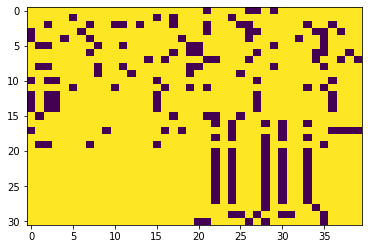

(1019,)
(36,)
(1019,)
(36,)
(1026,)
(29,)
(1023,)
(32,)
(1022,)
(33,)
(1023,)
(32,)
(1023,)
(32,)
(1023,)
(32,)
(1023,)
(32,)
(1019,)
(36,)
(1021,)
(34,)
(1022,)
(33,)
(1021,)
(34,)
(1021,)
(34,)
(1021,)
(34,)
(1020,)
(35,)
(1020,)
(35,)
(1025,)
(30,)
(1020,)
(35,)
(1021,)
(34,)
(1020,)
(35,)
(1020,)
(35,)
(1020,)
(35,)
(1020,)
(35,)
(1020,)
(35,)
(1020,)
(35,)
(1020,)
(35,)
(1020,)
(35,)
(1017,)
(38,)
(1021,)
(34,)
(1020,)
(35,)


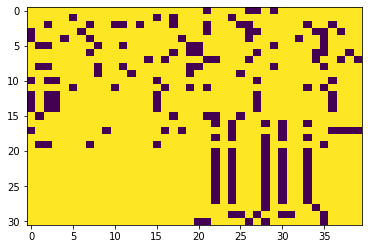

(1019,)
(36,)
(1019,)
(36,)
(1026,)
(29,)
(1023,)
(32,)
(1022,)
(33,)
(1023,)
(32,)
(1023,)
(32,)
(1023,)
(32,)
(1023,)
(32,)
(1019,)
(36,)
(1021,)
(34,)
(1022,)
(33,)
(1021,)
(34,)
(1021,)
(34,)
(1021,)
(34,)
(1020,)
(35,)
(1020,)
(35,)
(1025,)
(30,)
(1020,)
(35,)
(1021,)
(34,)
(1020,)
(35,)
(1020,)
(35,)
(1020,)
(35,)
(1020,)
(35,)
(1020,)
(35,)
(1020,)
(35,)
(1020,)
(35,)
(1020,)
(35,)
(1017,)
(38,)
(1021,)
(34,)
(1020,)
(35,)


In [ ]:
Cx_sub   = list()
Corr_sub = list()
M_sub    = list()
cv_t = list()

dat_gauss_t=list()
fr_l = [1,5]
for fre in fr_l:#range(1,7):
  for type in range(1,2):
    Cx_    = list()
    cv_s   = list()
    m_     = list()
    indx_s = list()
    Corr_type = list()
    lista_data_sub = list()
    lista_data_sub_s = list()
    for subs_ in range(1,2):  # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
      eyedee = str(type)      # ID OF THE EXPERIMENT.
      o_dim  = int(1)         # THE INTERESTED OUTPUTS DIMENSIONALITY
      num_blocks_start = int(5)
      num_blocks_end   = int(10)
      lambda_          = float(0.01)
      mid_shape        = int(10)
      D                = [0.05]
      dropout    = 0.05
      learning_rate = 1e-3
      epoch_num  = 20
      batch_size = 512
      reg_par    = 1e-4
      # folder_path= "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales_all_5/grupo2_cx_"
      # folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales_all_5/grupo2_freq"+str(fre)+"_cx_"
      folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales_all_5/grupo5_freq"+str(fre)+"_cx_"
      # folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales_all_5/grupo4_freq"+str(fre)+"_cx_"
      folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
      path_name  = folder_path+f"dmcca_{eyedee}_{lambda_}_{mid_shape}_{D[0]}"
      dataset    = "speech"
      num_blocks = 31 # numero de folds
      wei_cx = list()
      wei_m  = list()
      Corr_f = list()
      # data   = list()
      tst_corrs_name =  f'{path_name}/speech_corrs_{subs_}.npy'
      if type == 1:
        resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_env_cx_all.mat")["resp"][0]
        # indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_env_cx_all.mat")["matriz_selec"]
      # elif type ==2:
      #   resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["resp"][0]
      #   indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["matriz_selec"]
      # elif type ==3:
      #   resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["resp"][0]
      #   indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["matriz_selec"]
      # elif type ==4:
      #   resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["resp"][0]
      #   indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["matriz_selec"]
      
      # folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here

      # data_psd = scipy.io.loadmat(folder_path+f"/PSD_data_music2.mat")['Data_pow']
      # data_psd = data_psd[:,:,:4,:,:]
      # # data_psd = data_psd.reshape([data_psd.shape[0]*data_psd.shape[1],\
      #                               # data_psd.shape[2]*data_psd.shape[3]*data_psd.shape[4]])
      # print(data_psd.shape)
      # data_PLV_ = scipy.io.loadmat(folder_path+f"/PLV_all_subs31_music2.mat")['PLV']
      # data_PLV = np.zeros((data_PLV_.shape[0],data_PLV_.shape[1],19,7,data_PLV_.shape[4]))
      # for a1 in range(data_PLV_.shape[0]):
      #   for a2 in range(data_PLV_.shape[1]):
      #     for a3 in range(7):
      #       for a4 in range(data_PLV_.shape[4]):
      #         data_PLV[a1,a2,:,a3,a4] =  bct.strengths_und(squareform(data_PLV_[a1,a2,:,a3,a4]))
      # data_PLV = data_PLV[:,:,:,:4,:]
      # del data_PLV_
      # # data_PLV = data_PLV.reshape([data_PLV.shape[0]*data_PLV.shape[1],\
      #                               # data_PLV.shape[2]*data_PLV.shape[3]*data_PLV.shape[4]])
      # print(data_PLV.shape)
      # data_gauss_ = scipy.io.loadmat(folder_path+f"/conectividad_gauss.mat")['gaus']
      # data_gauss = np.zeros((data_gauss_.shape[0],data_gauss_.shape[1],19,data_gauss_.shape[3],data_gauss_.shape[4]))
      # for a1 in range(data_gauss_.shape[0]):
      #   for a2 in range(data_gauss_.shape[1]):
      #     for a3 in range(data_gauss_.shape[3]):
      #       for a4 in range(data_gauss_.shape[4]):
      #         data_gauss[a1,a2,:,a3,a4] =  bct.strengths_und(squareform(data_gauss_[a1,a2,:,a3,a4]))
      # del data_gauss_
      # data_gauss = data_gauss[:,:,:,:4,:]
      # data_gauss1 = data_gauss.reshape([data_gauss.shape[0]*data_gauss.shape[1],\
      #                                   data_gauss.shape[2]*data_gauss.shape[3]*data_gauss.shape[4]])
      # print(data_gauss.shape)
      # data_pac = list()
      # for s in range(31):
      #   data_pac.append(scipy.io.loadmat(folder_path+f"PLV_pac_music{s}_trials.mat")['temporal_plv'])
      # data_pac_ = np.asarray(data_pac)
      # del data_pac
      # data_pac = np.zeros((data_pac_.shape[0],data_pac_.shape[1],19,data_pac_.shape[3],data_pac_.shape[4],data_pac_.shape[5]))
      # for a1 in range(data_pac_.shape[0]):
      #   for a2 in range(data_pac_.shape[1]):
      #     for a3 in range(data_pac_.shape[3]):
      #       for a4 in range(data_pac_.shape[4]):
      #         for a5 in range(data_pac_.shape[5]):
      #           data_pac[a1,a2,:,a3,a4,a5] = bct.strengths_und(squareform(data_pac_[a1,a2,:,a3,a4,a5]))
      # data_pac = data_pac[:,:,:,:4,:4,:]
      # del data_pac_
      # data_pac1 = data_pac.reshape([data_pac.shape[0]*data_pac.shape[1],\
      #                               data_pac.shape[2]*data_pac.shape[3]*data_pac.shape[4]*data_pac.shape[5]])
      # print(data_pac.shape)
      # data_MuInf = scipy.io.loadmat(folder_path+'/mutual_inf_music2.mat')['Muinf']
      # data_MuInf = np.transpose(data_MuInf,[0,2,1,3])
      # data_MuInf = data_MuInf[:,:,:4,:]
      # data_MuInf1 = data_MuInf.reshape([data_MuInf.shape[0]*data_MuInf.shape[1],\
      #                                   data_MuInf.shape[2]*data_MuInf.shape[3]])
      # print(data_MuInf.shape)

      cv = list()
      train_ = list()
      val_   = list() # estandar escaler 
      test_  = list()
      train_s= list()
      val_s  = list() # estandar escaler 
      test_s = list()
      # kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
      # for d_cnt, dropout in enumerate(D):
      # datos_ = np.linspace(1, len(resp_data), num= len(resp_data))
      block =0
      datos_ = np.linspace(1, len(resp_data), num= len(resp_data))
      ind_s = np.arange(0,1240,40)
      
      folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
      # datos_stim_ = scipy.io.loadmat(folder_path_+f"/datos_stim_ord2.mat")["datos"]
      datos_stim_ = scipy.io.loadmat(folder_path_+f"/datos_stim_ord_all.mat")["datos"]
      datos_stim_[np.isnan(datos_stim_)]=0
      tr_cu      = loadmat(folder_path_+'/Trials_cuadrantes.mat')['trial_ord']
      tr_1 = tr_cu==1
      tr_2 = tr_cu==2
      tr_3 = tr_cu==3
      tr_4 = tr_cu==4
      tr_all = tr_1+tr_2+tr_3+tr_4
      pca = PCA(n_components=9)
      datos_stim = np.zeros((31,40,25,9))
      for sub in range(31):
        for tr in range(40):
          datos_stim[sub,tr,:,:] = pca.fit_transform(datos_stim_[sub,tr,:,:])
      datos_r = datos_stim.reshape([datos_stim.shape[0]*datos_stim.shape[1],datos_stim.shape[2]*datos_stim.shape[3]])
      plt.imshow(tr_all,aspect='auto')
      plt.show()
      tr_all   = np.reshape(tr_all,(tr_all.shape[0]*tr_all.shape[1]))
      
      # datos_stim = scipy.io.loadmat(folder_path_+'/conectividad_gauss.mat')['gaus']
      # datos_stim = datos_stim[:,:,:,2:5,:]
      # datos_r2 = datos_stim.reshape([datos_stim.shape[0]*datos_stim.shape[1],datos_stim.shape[2]*3*datos_stim.shape[4]])

      for subj in range(31):
        train_index_  = tr_all.astype(bool)
        train_index_[ind_s[subj]:ind_s[subj]+40] = False
        train_index = np.where(train_index_==True)[0]
        print(train_index.shape)
        test_index_ = np.zeros((1240)).astype(bool)
        test_index_[ind_s[subj]:ind_s[subj]+40] = True
        test_index_ = test_index_*tr_all
        # train_index_[ind_s[subj]:ind_s[subj]+40] = False
        test_index  = np.where(test_index_==True)[0]
        print(test_index.shape)

        # print(test_index.shape)
      # for train_index, test_index in kf.split(datos_):
        # print("TRAIN:", train_index, "TEST:", test_index)
        X_train_, x_test_ = datos_[train_index], datos_[test_index]
        # y_train_, y_test = stim_data[train_index], stim_data[test_index]
        x_train, x_val = train_test_split(X_train_, test_size=1 - 0.8, random_state=0)
        # print(len(x_train), len(x_val), len(x_test_))
        cv.append([x_train,x_val,x_test_])

        saving_name_root = f"block_{block}_drpt_{dropout}_sub_{subs_}"
        # saving_name_root = f"block_{block}_drpt_{dropout}" 
        save_model_name = f"{path_name}/{dataset}_dmcca_model_{saving_name_root}.path.tar"
        model = torch.load(save_model_name)
        wei_cx.append(model.state_dict()['enc_net0.one.weight'].cpu().detach().numpy())
        # wei_m.append(model.state_dict()['enc_nets.sec.weight'].cpu().detach().numpy())
        saving_name_root = f"block_{block}_drpt_{dropout}_sub_{subs_}"
        # data  = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.02_sub_{subs_}.pkl', 'rb'))
        # data.append(pkl.load(open(f'{path_name}/{dataset}_dmlc_data_{saving_name_root}.pkl', 'rb')))
        # eeg
        datos_stim = scipy.io.loadmat(folder_path_+'/conectividad_gauss.mat')['gaus']
        train = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.05_sub_{subs_}.pkl', 'rb'))[0][1][0]
        train_.append(train)#np.reshape(train,(len(train),datos_stim.shape[2],3,datos_stim.shape[4])))
        val = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.05_sub_{subs_}.pkl', 'rb'))[1][1][0]
        val_.append(val)#np.reshape(val,(len(val),datos_stim.shape[2],3,datos_stim.shape[4])))
        test = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.05_sub_{subs_}.pkl', 'rb'))[2][1][0]
        test_.append(test)#np.reshape(test,(len(test),datos_stim.shape[2],3,datos_stim.shape[4])))
        # music
        # train_stim = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.05_sub_{subs_}.pkl', 'rb'))[0][1][1]
        # train_s.append(train_stim)
        # val_stim = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.05_sub_{subs_}.pkl', 'rb'))[1][1][1]
        # val_s.append(val_stim)
        # test_stim = pkl.load(open(f'{path_name}/speech_dmcca_data_block_{block}_drpt_0.05_sub_{subs_}.pkl', 'rb'))[2][1][1]
        # test_s.append(test_stim)
        # results_name = f'{path_name}/results_{str(type)}.npy'
        # Corr_f.append()
        block+=1
      Corr_type.append(np.load(tst_corrs_name))
      Cx_.append(np.asarray(wei_cx))
      # m_.append(np.asarray(wei_m))
      aa    = 0
      folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
      indx_ = tr_all#np.reshape(indx,(indx.shape[0]*indx.shape[1]))
      posi  = np.where(indx_ == 1)[0]
      dat_cv = list()
      lista_data_fold = list()
      # lista_data_fold_s = list()
      # for fold in range(num_blocks):
      #   a1 = 0
      #   a2 = 0
      #   a3 = 0
      #   lista_ord_data = np.zeros((1240,27531)) #np.zeros((1240,datos_stim.shape[2],3,datos_stim.shape[4]))
      #   lista_ord_data_s = np.zeros((1240,2880))
      #   datos_ind_2= np.zeros((1240))
      #   for tr in range(posi.shape[0]):
      #     if np.where(np.sort(cv[fold][0].astype(int))==tr)[0].shape[0]>0:
      #       datos_ind_2[posi[tr]] = 1
      #       lista_ord_data[tr,:] = train_[fold][np.where(cv[fold][0].astype(int)==tr)[0][0],:]
      #       # lista_ord_data_s[tr,:] = train_s[fold][np.where(cv[fold][0].astype(int)==tr)[0][0],:]
      #     elif np.where(np.sort(cv[fold][1].astype(int))==tr)[0].shape[0]>0:
      #       datos_ind_2[posi[tr]] = 2
      #       lista_ord_data[tr,:] = val_[fold][np.where(cv[fold][1].astype(int)==tr)[0][0],:]
      #       # lista_ord_data_s[tr,:] = val_s[fold][np.where(cv[fold][1].astype(int)==tr)[0][0],:]
      #     elif np.where(np.sort(cv[fold][2].astype(int))==tr)[0].shape[0]>0:
      #       datos_ind_2[posi[tr]] = 3
      #       lista_ord_data[tr,:] = test_[fold][np.where(cv[fold][2].astype(int)==tr)[0][0],:]
      #       # lista_ord_data_s[tr,:] = test_s[fold][np.where(cv[fold][2].astype(int)==tr)[0][0],:]
      
      #   lista_data_fold.append(lista_ord_data)
      #   # lista_data_fold_s.append(lista_ord_data_s)
      #   dat_cv.append(datos_ind_2)
      # cv_s.append(dat_cv)
      # lista_data_sub.append(lista_data_fold)
      # # lista_data_sub_s.append(lista_data_fold_s)
      # indx_s.append(indx_*(subs_+1))
    # Corr_sub.append(Corr_type)

    
    dat_gauss = np.mean(np.mean(Cx_[0],axis=1),axis=0)
    dat_gauss = np.reshape(dat_gauss,(171,7,23))

    # normalizar
    dat_gauss_ = np.zeros((dat_gauss.shape))
    for ch in range(dat_gauss.shape[0]):
        min_ = np.min(np.squeeze(dat_gauss[ch,:]))
        max_ = np.max(np.squeeze(dat_gauss[ch,:]))
        dat_gauss_[ch,:] = (dat_gauss[ch,:]-min_)/(max_-min_)
    # dat_gauss_.shape
    dat_gauss_t.append(dat_gauss_)

    # Cx_sub.append(Cx_)
    # M_sub.append(m_)
  cv_sujetos = list()
  datos_fold_ = list()
  # datos_fold_ss=list()
  # for fold in range(num_blocks):
  #   mat1 = cv_s[0][fold].reshape([31,40])
  #   # mat2 = cv_s[fold].reshape([31,40])
  #   # mat3 = cv_s[fold].reshape([31,40])
  #   # mat4 = cv_s[fold].reshape([31,40])
  #   cv_sujetos.append(mat1)
  #   datos_fold = np.zeros((lista_data_sub[0][fold].shape))
  #   # datos_fold_s = np.zeros((lista_data_sub_s[0][fold].shape))
  #   for tr in range(1240):
  #     datos_fold[tr,:] = lista_data_sub[0][fold][tr,:] 
  #     # datos_fold_s[tr,:] = lista_data_sub_s[0][fold][tr,:]
  #   datos_fold_.append(datos_fold)
    # datos_fold_ss.append(datos_fold_s)
  # del lista_data_sub, lista_ord_data, datos_ind_2,mat1, lista_data_fold
  # del lista_data_sub_s, lista_ord_data_s, lista_data_fold_s,datos_fold_s



In [ ]:
dat_gauss_ = np.zeros((dat_gauss.shape))
  for ch in range(dat_gauss.shape[0]):
    temp_d = dat_gauss[ch,:]
    min_ = np.min(np.squeeze())
    max_ = np.max(np.squeeze(dat_gauss[ch,:]))
    dat_gauss_[ch,fre,:] = (dat_gauss[ch,:]-min_)/(max_-min_)

In [ ]:
np.mean(Corr_sub[0][0][0,:,0,0])

In [ ]:
np.mean(Corr_sub[0][0][0,:,1,0])

In [ ]:
np.mean(Corr_sub[0][0][1,:,0,0])

In [ ]:
np.mean(Corr_sub[0][0][1,:,1,0])

In [ ]:
np.mean([np.mean(Corr_sub[0][0][0,:,0,0]),np.mean(Corr_sub[0][0][0,:,1,0])])

In [ ]:
del lista_data_fold_s,datos_fold_s

In [ ]:
pkl.load(open(f'{path_name}/speech_dmcca_data_block_{0}_drpt_0.05_sub_{1}.pkl', 'rb'))[2][1][1].shape

(40, 944)

In [ ]:
train_stim.shape

(960, 2880)

In [ ]:
Corr_sub[0][0].shape

(2, 31, 2, 1)

In [ ]:
M_sub[0][0].shape

(10, 80, 80)

In [ ]:
model.state_dict()['enc_net0.one.weight'].shape

torch.Size([16, 10089])

In [ ]:
model.state_dict()['enc_nets.one.weight'].shape

torch.Size([16, 944])

In [ ]:
enc_nets.one.weight

In [ ]:
datos_fold_[0].shape

(1240, 59, 171)

In [ ]:
cv_sujetos[0].shape

(31, 40)

In [ ]:
cv_s[0][fold]

array([0., 1., 2., ..., 1., 2., 1.])

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: UserWarning: In Matplotlib 3.3 individual lines on a stem plot will be added as a LineCollection instead of individual lines. This significantly improves the performance of a stem plot. To remove this warning and switch to the new behaviour, set the "use_line_collection" keyword argument to True.
  


<StemContainer object of 3 artists>

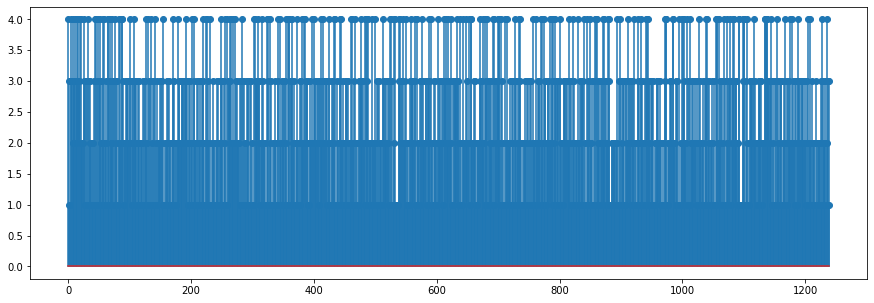

In [ ]:
plt.figure(figsize=(15,5))
plt.stem(indx_s[0]+indx_s[1]+indx_s[2]+indx_s[3])

In [ ]:
len(train_)

In [ ]:
sum(cv_s[0][0]>0)

270

In [ ]:
indx_s[0]

array([0, 1, 0, ..., 0, 1, 0], dtype=uint8)

In [ ]:
datos_ind_[tr]

In [ ]:
posi

In [ ]:
aa = 0
datos_ind_2= np.zeros((1240))
ind_ = np.sort(cv[fold][0].astype(int))
for tr in range(posi.shape[0]):
  if np.where(np.sort(cv[fold][0].astype(int))==tr)[0].shape[0]>0:
    datos_ind_2[posi[tr]] = 1
  elif np.where(np.sort(cv[fold][1].astype(int))==tr)[0].shape[0]>0:
    datos_ind_2[posi[tr]] = 2
  elif np.where(np.sort(cv[fold][2].astype(int))==tr)[0].shape[0]>0:
    datos_ind_2[posi[tr]] = 3

In [ ]:
datos_ind_2

array([0., 0., 0., ..., 0., 1., 0.])

In [ ]:
ind_

In [ ]:
posi

In [ ]:
aa= 0
for tr in range(posi.shape[0]):
  ind_ = np.sort(cv[fold][0].astype(int))
  for tr_ in range(ind_.shape[0]):
    if ind_[tr_] == posi[tr]:


In [ ]:
cv[0][1].shape[0]

44

In [ ]:
datos_ind_2[6]

0.0

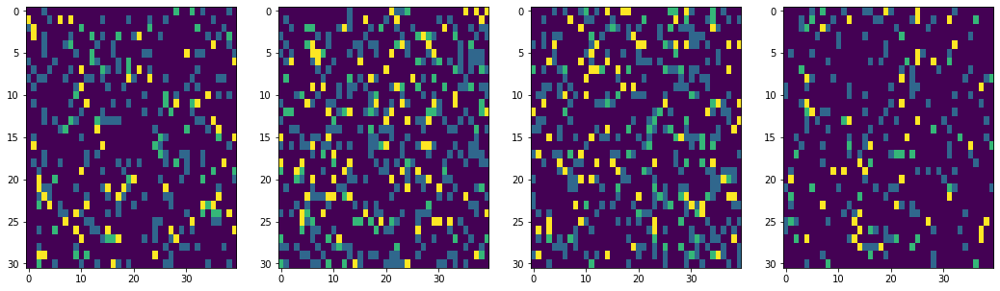

In [ ]:
fig,ax = plt.subplots(1,4,figsize=(18,5))
ax[0].imshow(cv_s[0][0].reshape([31,40]),aspect='auto')
ax[1].imshow(cv_s[1][0].reshape([31,40]),aspect='auto')
ax[2].imshow(cv_s[2][0].reshape([31,40]),aspect='auto')
ax[3].imshow(cv_s[3][0].reshape([31,40]),aspect='auto')

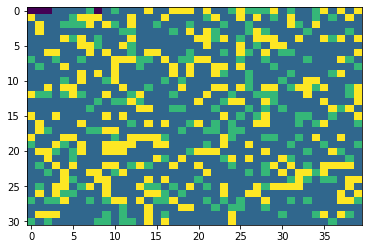

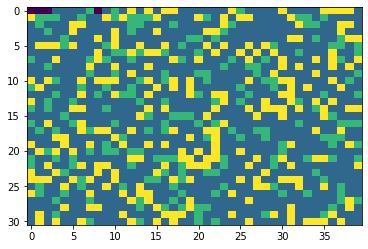

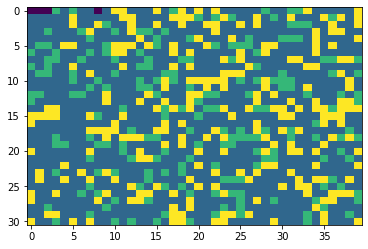

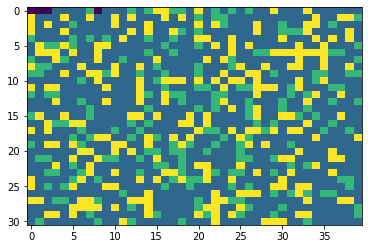

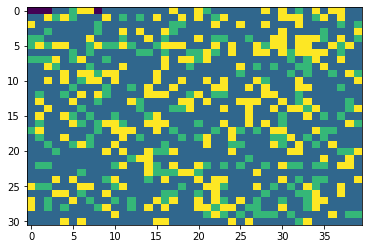

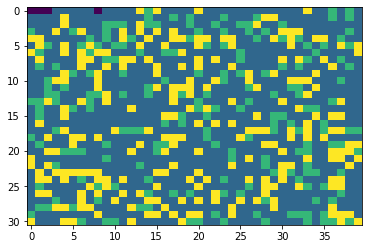

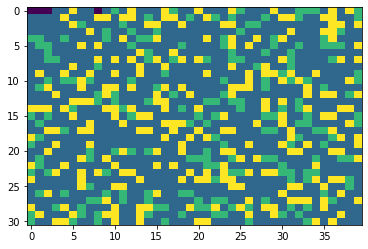

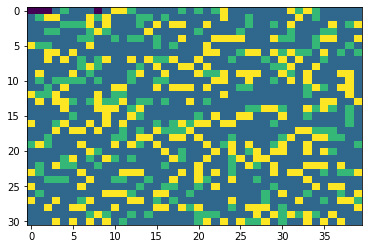

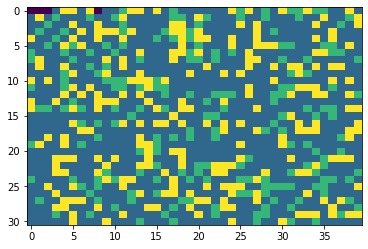

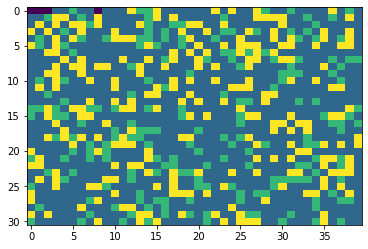

In [ ]:
for fold in range(10):
  mat1 = cv_s[0][fold].reshape([31,40])
  mat2 = cv_s[1][fold].reshape([31,40])
  mat3 = cv_s[2][fold].reshape([31,40])
  mat4 = cv_s[3][fold].reshape([31,40])
  plt.figure()
  plt.imshow(mat1+mat2+mat3+mat4,aspect='auto')

In [ ]:
model

dmcca_model_n_resp_1_stim(
  (drp): Dropout(p=0.05, inplace=False)
  (enc_net0): enc_model(
    (act): Sigmoid()
    (o_act): LeakyReLU(negative_slope=0.1)
    (drp): Dropout(p=0.05, inplace=False)
    (one): Linear(in_features=10089, out_features=16, bias=True)
    (sec): Linear(in_features=16, out_features=16, bias=True)
    (thr): Linear(in_features=16, out_features=10, bias=True)
  )
  (dec_net0): dec_model(
    (act): Sigmoid()
    (o_act): LeakyReLU(negative_slope=0.1)
    (drp): Dropout(p=0.05, inplace=False)
    (de1): Linear(in_features=20, out_features=16, bias=True)
    (de2): Linear(in_features=16, out_features=110, bias=True)
    (de3): Linear(in_features=110, out_features=10089, bias=True)
  )
  (enc_nets): enc_model(
    (act): Sigmoid()
    (o_act): LeakyReLU(negative_slope=0.1)
    (drp): Dropout(p=0.05, inplace=False)
    (one): Linear(in_features=944, out_features=16, bias=True)
    (sec): Linear(in_features=16, out_features=16, bias=True)
    (thr): Linear(in_featur

In [ ]:
model.state_dict()

# topoplot mne 

In [ ]:
!pip install -U mne
!pip install bctpy

  Using cached mne-0.24.1-py3-none-any.whl (7.4 MB)
  Attempting uninstall: mne
    Found existing installation: mne 0.19.0
    Uninstalling mne-0.19.0:
      Successfully uninstalled mne-0.19.0


In [ ]:
import mne

In [ ]:
from matplotlib.colors import LinearSegmentedColormap

cm_data = [[0.2081, 0.1663, 0.5292], [0.2116238095, 0.1897809524, 0.5776761905], 
 [0.212252381, 0.2137714286, 0.6269714286], [0.2081, 0.2386, 0.6770857143], 
 [0.1959047619, 0.2644571429, 0.7279], [0.1707285714, 0.2919380952, 
  0.779247619], [0.1252714286, 0.3242428571, 0.8302714286], 
 [0.0591333333, 0.3598333333, 0.8683333333], [0.0116952381, 0.3875095238, 
  0.8819571429], [0.0059571429, 0.4086142857, 0.8828428571], 
 [0.0165142857, 0.4266, 0.8786333333], [0.032852381, 0.4430428571, 
  0.8719571429], [0.0498142857, 0.4585714286, 0.8640571429], 
 [0.0629333333, 0.4736904762, 0.8554380952], [0.0722666667, 0.4886666667, 
  0.8467], [0.0779428571, 0.5039857143, 0.8383714286], 
 [0.079347619, 0.5200238095, 0.8311809524], [0.0749428571, 0.5375428571, 
  0.8262714286], [0.0640571429, 0.5569857143, 0.8239571429], 
 [0.0487714286, 0.5772238095, 0.8228285714], [0.0343428571, 0.5965809524, 
  0.819852381], [0.0265, 0.6137, 0.8135], [0.0238904762, 0.6286619048, 
  0.8037619048], [0.0230904762, 0.6417857143, 0.7912666667], 
 [0.0227714286, 0.6534857143, 0.7767571429], [0.0266619048, 0.6641952381, 
  0.7607190476], [0.0383714286, 0.6742714286, 0.743552381], 
 [0.0589714286, 0.6837571429, 0.7253857143], 
 [0.0843, 0.6928333333, 0.7061666667], [0.1132952381, 0.7015, 0.6858571429], 
 [0.1452714286, 0.7097571429, 0.6646285714], [0.1801333333, 0.7176571429, 
  0.6424333333], [0.2178285714, 0.7250428571, 0.6192619048], 
 [0.2586428571, 0.7317142857, 0.5954285714], [0.3021714286, 0.7376047619, 
  0.5711857143], [0.3481666667, 0.7424333333, 0.5472666667], 
 [0.3952571429, 0.7459, 0.5244428571], [0.4420095238, 0.7480809524, 
  0.5033142857], [0.4871238095, 0.7490619048, 0.4839761905], 
 [0.5300285714, 0.7491142857, 0.4661142857], [0.5708571429, 0.7485190476, 
  0.4493904762], [0.609852381, 0.7473142857, 0.4336857143], 
 [0.6473, 0.7456, 0.4188], [0.6834190476, 0.7434761905, 0.4044333333], 
 [0.7184095238, 0.7411333333, 0.3904761905], 
 [0.7524857143, 0.7384, 0.3768142857], [0.7858428571, 0.7355666667, 
  0.3632714286], [0.8185047619, 0.7327333333, 0.3497904762], 
 [0.8506571429, 0.7299, 0.3360285714], [0.8824333333, 0.7274333333, 0.3217], 
 [0.9139333333, 0.7257857143, 0.3062761905], [0.9449571429, 0.7261142857, 
  0.2886428571], [0.9738952381, 0.7313952381, 0.266647619], 
 [0.9937714286, 0.7454571429, 0.240347619], [0.9990428571, 0.7653142857, 
  0.2164142857], [0.9955333333, 0.7860571429, 0.196652381], 
 [0.988, 0.8066, 0.1793666667], [0.9788571429, 0.8271428571, 0.1633142857], 
 [0.9697, 0.8481380952, 0.147452381], [0.9625857143, 0.8705142857, 0.1309], 
 [0.9588714286, 0.8949, 0.1132428571], [0.9598238095, 0.9218333333, 
  0.0948380952], [0.9661, 0.9514428571, 0.0755333333], 
 [0.9763, 0.9831, 0.0538]]

parula_map = LinearSegmentedColormap.from_list('parula', cm_data)

## todo el tiempo

In [ ]:
Cx_sub[0][0].shape

(31, 16, 10089)

In [ ]:
Cx_sub[0][0].shape

(31, 16, 10089)

In [ ]:
resp_data[0].shape

(59, 171)

In [ ]:
Cx_topo_ = np.zeros((1,4,3,23,19))
for type in range(len(Cx_sub)):
  for subs_ in range(1):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
    Cx_topo = np.zeros((Cx_sub[type][subs_].shape[0],Cx_sub[type][subs_].shape[1],3,23,19))
    for fold in range(Cx_sub[type][subs_].shape[0]):
      for dim in range(Cx_sub[type][subs_].shape[1]):
        for fr in range(3):
          Conx = Cx_sub[type][subs_][fold,dim,:]
          Conx = np.reshape(Conx,(datos_stim.shape[2],3,datos_stim.shape[4]))
          for win in range(23):
            Cx_topo[fold,dim,fr,win,:] = bct.strengths_und(squareform(Conx[:,fr,win]))
    Cx_topo_[subs_,type,:,:,:] = np.squeeze(np.mean(np.squeeze(np.mean(Cx_topo,axis=0)),axis=0))
max_cx = np.max(np.max(np.max(Cx_topo_)))
max_cx_= np.max(np.max(Cx_topo_,axis=1),axis=1)
min_cx = np.min(np.min(np.min(Cx_topo_)))

In [ ]:
Cx_topo_ = np.zeros((4,4,19))
for type in range(len(Cx_sub)):
  for subs_ in range(4):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
    Cx_topo = np.zeros((Cx_sub[subs_][type].shape[0],Cx_sub[subs_][type].shape[1],19))
    for fold in range(Cx_sub[subs_][type].shape[0]):
      for dim in range(Cx_sub[subs_][type].shape[1]):
        Cx_topo[fold,dim,:] = bct.strengths_und(squareform(Cx_sub[subs_][type][fold,dim,:]))
    Cx_topo_[subs_,type,:] = np.squeeze(np.mean(np.squeeze(np.mean(Cx_topo,axis=0)),axis=0))
max_cx = np.max(np.max(np.max(Cx_topo_)))
max_cx_= np.max(np.max(Cx_topo_,axis=1),axis=1)
min_cx = np.min(np.min(np.min(Cx_topo_)))

In [ ]:
max_cx

0.05372735061377171

In [ ]:
np.max(np.max(Cx_topo_,axis=1),axis=1).shape

(4,)

In [ ]:
info

<Info | 16 non-empty fields
    bads : list | 0 items
    ch_names : list | Fp1, Fp2, F7, F3, Fz, F4, F8, T3, C3, ...
    chs : list | 19 items (EEG: 19)
    comps : list | 0 items
    custom_ref_applied : bool | False
    dev_head_t : Transform | 3 items
    events : list | 0 items
    highpass : float | 0.0 Hz
    hpi_meas : list | 0 items
    hpi_results : list | 0 items
    lowpass : float | 500.0 Hz
    meas_date : NoneType | unspecified
    nchan : int | 19
    proc_history : list | 0 items
    projs : list | 0 items
    sfreq : float | 1000.0 Hz
    acq_pars : NoneType
    acq_stim : NoneType
    ctf_head_t : NoneType
    description : NoneType
    dev_ctf_t : NoneType
    device_info : NoneType
    dig : NoneType
    experimenter : NoneType
    file_id : NoneType
    gantry_angle : NoneType
    helium_info : NoneType
    hpi_subsystem : NoneType
    kit_system_id : NoneType
    line_freq : NoneType
    meas_id : NoneType
    proj_id : NoneType
    proj_name : NoneType
    subje

In [ ]:
# channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 
            # 'Cz', 'C4',  'T4', 'T5', 'P3', 'Pz', 'P4', 'T6', 'O1', 'O2']
# n_channels = len(channels)
# ch_types = ['eeg']*n_channels
# info = mne.create_info(channels, ch_types=ch_types, sfreq=1000)
# info.channels.make_standard_montage('standard_1020')
# info.set_montage('standard_1005')    
itr = 1
fig = plt.figure(figsize=(20,20))
for type in range(len(Cx_sub)):
  for subs_ in range(4):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
    ax  = fig.add_subplot(4,4,itr)
    itr +=1
    mne.viz.plot_topomap(Cx_topo_[subs_,type,:],info, axes=ax, cmap=parula_map, 
                         show=False, sensors=True, extrapolate='head',
                         ch_type='eeg',vmin=min_cx,vmax=max_cx)
    if subs_ == 0 and type == 0:
      ax.set_title('Grupo 1')
    if subs_ == 1 and type == 0:
      ax.set_title('Grupo 2')
    if subs_ == 2 and type == 0:
      ax.set_title('Grupo 3')
    if subs_ == 3 and type == 0:
      ax.set_title('Grupo 4')
    if subs_ == 0 and type == 0:
      ax.set_ylabel('env')
    if subs_ == 0 and type == 1:
      ax.set_ylabel('RMS')
    if subs_ == 0 and type == 2:
      ax.set_ylabel('Spectral')
    if subs_ == 0 and type == 3:
      ax.set_ylabel('PC1')
plt.savefig('Cx_music.png')

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 
            'Cz', 'C4',  'T4', 'T5', 'P3', 'Pz', 'P4', 'T6', 'O1', 'O2']
n_channels = len(channels)
ch_types = ['eeg']*n_channels
info = mne.create_info(channels, ch_types=ch_types, sfreq=1000)
info.set_montage('standard_1005')    
itr = 1
fig = plt.figure(figsize=(20,20))
for type in range(len(Cx_sub)):
  for subs_ in range(4):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
    ax  = fig.add_subplot(4,4,itr)
    itr +=1
    mne.viz.plot_topomap(Cx_topo_[subs_,type,:],info, axes=ax, cmap=parula_map, 
                         show=False, sensors=True, extrapolate='head', 
                         ch_type='eeg',vmin=min_cx,vmax=max_cx)
    if subs_ == 0 and type == 0:
      ax.set_title('Grupo 1')
    if subs_ == 1 and type == 0:
      ax.set_title('Grupo 2')
    if subs_ == 2 and type == 0:
      ax.set_title('Grupo 3')
    if subs_ == 3 and type == 0:
      ax.set_title('Grupo 4')
    if subs_ == 0 and type == 0:
      ax.set_ylabel('env')
    if subs_ == 0 and type == 1:
      ax.set_ylabel('RMS')
    if subs_ == 0 and type == 2:
      ax.set_ylabel('Spectral')
    if subs_ == 0 and type == 3:
      ax.set_ylabel('PC1')
plt.savefig('Cx_music.png')

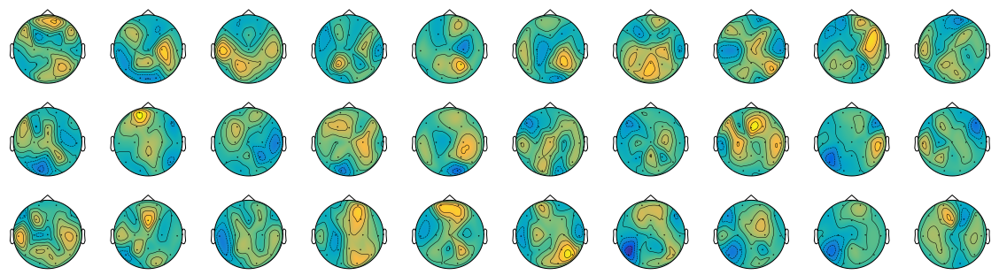

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 
            'Cz', 'C4',  'T4', 'T5', 'P3', 'Pz', 'P4', 'T6', 'O1', 'O2']
n_channels = len(channels)
# ch_types = ['eeg']*n_channels
# info = mne.create_info(channels, ch_types=ch_types, sfreq=1000)
# info.channels.make_standard_montage('standard_1020')
# info.set_montage('standard_1005')    
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
S_ERP = loadmat(load_path + f"Sujeto_"+str(1)+".mat")
data = S_ERP['music']
# data = np.transpose(data, (2,1,0)) # transponer en trials x canales x tiempo
data_target = data

# structure mne datos en (trials,canales,tiempo)
ch_types = ['eeg']*n_channels
info = mne.create_info(channels, ch_types=ch_types, sfreq=1000)
# info.set_montage('standard_1005')
raw = mne.EpochsArray(data_target, info)
biosemi_montage = mne.channels.make_standard_montage('standard_1005')
raw.set_montage(biosemi_montage)
itr = 1
fig = plt.figure(figsize=(20,5))
for type in range(len(Cx_sub)):
  for subs_ in range(1):       # REPLACE WITH THE REQUIRED SUBJECTS' IDS.
    for fr in range(3):
      for win in range(10):
        ax  = fig.add_subplot(3,10,itr)
        itr +=1
        mne.viz.plot_topomap(Cx_topo_[subs_,type,fr,win,:],raw.info, axes=ax, cmap=parula_map, 
                            show=False, sensors=True, extrapolate='head',vmin=min_cx,vmax=max_cx)
        # if subs_ == 0 and type == 0:
        #   ax.set_title('Todos')
        # if subs_ == 1 and type == 0:
        #   ax.set_title('Grupo 2')
        # if subs_ == 2 and type == 0:
        #   ax.set_title('Grupo 3')
        # if subs_ == 3 and type == 0:
        #   ax.set_title('Grupo 4')
        # if subs_ == 0 and type == 0:
        #   ax.set_ylabel('env')
        # if subs_ == 0 and type == 1:
        #   ax.set_ylabel('RMS')
        # if subs_ == 0 and type == 2:
        #   ax.set_ylabel('Spectral')
        # if subs_ == 0 and type == 3:
        #   ax.set_ylabel('PC1')
plt.savefig('Cx_music.png')

## en cada intante del tiempo

## mutual information corso2020

In [ ]:
## https://gist.github.com/naught101/4d1661b773471895fc52
'''
Non-parametric computation of entropy and mutual-information
Adapted by G Varoquaux for code created by R Brette, itself
from several papers (see in the code).
These computations rely on nearest-neighbor statistics
'''
import numpy as np

from scipy.special import gamma, psi
from scipy import ndimage
from scipy.linalg import det
from numpy import pi

from sklearn.neighbors import NearestNeighbors

__all__ = ['entropy', 'mutual_information', 'entropy_gaussian']

EPS = np.finfo(float).eps


def nearest_distances(X, k=1):
    '''
    X = array(N,M)
    N = number of points
    M = number of dimensions
    returns the distance to the kth nearest neighbor for every point in X
    '''
    knn = NearestNeighbors(n_neighbors=k)
    knn.fit(X)
    d, _ = knn.kneighbors(X)  # the first nearest neighbor is itself
    return d[:, -1]  # returns the distance to the kth nearest neighbor

def entropy_gaussian(C):
    '''
    Entropy of a gaussian variable with covariance matrix C
    '''
    if np.isscalar(C):  # C is the variance
        return .5 * (1 + np.log(2 * pi)) + .5 * np.log(C)
    else:
        n = C.shape[0]  # dimension
        return .5 * n * (1 + np.log(2 * pi)) + .5 * np.log(abs(det(C)))

def entropy(X, k=1):
    ''' Returns the entropy of the X.
    Parameters
    ===========
    X : array-like, shape (n_samples, n_features)
        The data the entropy of which is computed
    k : int, optional
        number of nearest neighbors for density estimation
    Notes
    ======
    Kozachenko, L. F. & Leonenko, N. N. 1987 Sample estimate of entropy
    of a random vector. Probl. Inf. Transm. 23, 95-101.
    See also: Evans, D. 2008 A computationally efficient estimator for
    mutual information, Proc. R. Soc. A 464 (2093), 1203-1215.
    and:
    Kraskov A, Stogbauer H, Grassberger P. (2004). Estimating mutual
    information. Phys Rev E 69(6 Pt 2):066138.
    '''

    # Distance to kth nearest neighbor
    r = nearest_distances(X, k)  # squared distances
    n, d = X.shape
    volume_unit_ball = (pi ** (.5 * d)) / gamma(.5 * d + 1)
    '''
    F. Perez-Cruz, (2008). Estimation of Information Theoretic Measures
    for Continuous Random Variables. Advances in Neural Information
    Processing Systems 21 (NIPS). Vancouver (Canada), December.
    return d * mean(log(r))+log(volume_unit_ball)+log(n-1)-log(k)
    '''
    return (d * np.mean(np.log(r + np.finfo(X.dtype).eps)) +
            np.log(volume_unit_ball) + psi(n) - psi(k))

def mutual_information(variables, k=1):
    '''
    Returns the mutual information between any number of variables.
    Each variable is a matrix X = array(n_samples, n_features)
    where
      n = number of samples
      dx,dy = number of dimensions
    Optionally, the following keyword argument can be specified:
      k = number of nearest neighbors for density estimation
    Example: mutual_information((X, Y)), mutual_information((X, Y, Z), k=5)
    '''
    if len(variables) < 2:
        raise AttributeError(
            "Mutual information must involve at least 2 variables")
    all_vars = np.hstack(variables)
    return (sum([entropy(X, k=k) for X in variables]) -
            entropy(all_vars, k=k))

def mutual_information_2d(x, y, sigma=1, normalized=False):
    """
    Computes (normalized) mutual information between two 1D variate from a
    joint histogram.
    Parameters
    ----------
    x : 1D array
        first variable
    y : 1D array
        second variable
    sigma: float
        sigma for Gaussian smoothing of the joint histogram
    Returns
    -------
    nmi: float
        the computed similariy measure
    """
    bins = (256, 256)

    jh = np.histogram2d(x, y, bins=bins)[0]

    # smooth the jh with a gaussian filter of given sigma
    ndimage.gaussian_filter(jh, sigma=sigma, mode='constant', output=jh)

    # compute marginal histograms
    jh = jh + EPS
    sh = np.sum(jh)
    jh = jh / sh
    s1 = np.sum(jh, axis=0).reshape((-1, jh.shape[0]))
    s2 = np.sum(jh, axis=1).reshape((jh.shape[1], -1))

    # Normalised Mutual Information of:
    # Studholme,  jhill & jhawkes (1998).
    # "A normalized entropy measure of 3-D medical image alignment".
    # in Proc. Medical Imaging 1998, vol. 3338, San Diego, CA, pp. 132-143.
    if normalized:
        mi = ((np.sum(s1 * np.log(s1)) + np.sum(s2 * np.log(s2))) /
              np.sum(jh * np.log(jh))) - 1
    else:
        mi = (np.sum(jh * np.log(jh)) - np.sum(s1 * np.log(s1)) -
              np.sum(s2 * np.log(s2)))

    return mi

# ###############################################################################
# # Tests

# def test_entropy():
#     # Testing against correlated Gaussian variables
#     # (analytical results are known)
#     # Entropy of a 3-dimensional gaussian variable
#     rng = np.random.RandomState(0)
#     n = 50000
#     d = 3
#     P = np.array([[1, 0, 0], [0, 1, .5], [0, 0, 1]])
#     C = np.dot(P, P.T)
#     Y = rng.randn(d, n)
#     X = np.dot(P, Y)
#     H_th = entropy_gaussian(C)
#     H_est = entropy(X.T, k=5)
#     # Our estimated entropy should always be less that the actual one
#     # (entropy estimation undershoots) but not too much
#     np.testing.assert_array_less(H_est, H_th)
#     np.testing.assert_array_less(.9 * H_th, H_est)

# def test_mutual_information():
#     # Mutual information between two correlated gaussian variables
#     # Entropy of a 2-dimensional gaussian variable
#     n = 50000
#     rng = np.random.RandomState(0)
#     # P = np.random.randn(2, 2)
#     P = np.array([[1, 0], [0.5, 1]])
#     C = np.dot(P, P.T)
#     U = rng.randn(2, n)
#     Z = np.dot(P, U).T
#     X = Z[:, 0]
#     X = X.reshape(len(X), 1)
#     Y = Z[:, 1]
#     Y = Y.reshape(len(Y), 1)
#     # in bits
#     MI_est = mutual_information((X, Y), k=5)
#     MI_th = (entropy_gaussian(C[0, 0]) +
#              entropy_gaussian(C[1, 1]) -
#              entropy_gaussian(C))
#     # Our estimator should undershoot once again: it will undershoot more
#     # for the 2D estimation that for the 1D estimation
#     print(MI_est, MI_th)
#     np.testing.assert_array_less(MI_est, MI_th)
#     np.testing.assert_array_less(MI_th, MI_est + .3)

# def test_degenerate():
#     # Test that our estimators are well-behaved with regards to
#     # degenerate solutions
#     rng = np.random.RandomState(0)
#     x = rng.randn(50000)
#     X = np.c_[x, x]
#     assert np.isfinite(entropy(X))
#     assert np.isfinite(mutual_information((x[:, np.newaxis],
#                                            x[:, np.newaxis])))
#     assert 2.9 < mutual_information_2d(x, x) < 3.1

# def test_mutual_information_2d():
#     # Mutual information between two correlated gaussian variables
#     # Entropy of a 2-dimensional gaussian variable
#     n = 50000
#     rng = np.random.RandomState(0)
#     # P = np.random.randn(2, 2)
#     P = np.array([[1, 0], [.9, .1]])
#     C = np.dot(P, P.T)
#     U = rng.randn(2, n)
#     Z = np.dot(P, U).T
#     X = Z[:, 0]
#     X = X.reshape(len(X), 1)
#     Y = Z[:, 1]
#     Y = Y.reshape(len(Y), 1)
#     # in bits
#     MI_est = mutual_information_2d(X.ravel(), Y.ravel())
#     MI_th = (entropy_gaussian(C[0, 0]) +
#              entropy_gaussian(C[1, 1]) -
#              entropy_gaussian(C))
#     print(MI_est, MI_th)
#     # Our estimator should undershoot once again: it will undershoot more
#     # for the 2D estimation that for the 1D estimation
#     np.testing.assert_array_less(MI_est, MI_th)
#     np.testing.assert_array_less(MI_th, MI_est + .2)


# if __name__ == '__main__':
#     # Run our tests
#     test_entropy()
#     test_mutual_information()
#     test_degenerate()
#     test_mutual_information_2d()

In [ ]:
dat_gauss = np.mean(np.mean(Cx_sub[0][0],axis=1),axis=0)

# dat_gauss = np.reshape(dat_gauss,(dim_gauss[2:]))
dat_gauss.shape

(19, 7, 20)

In [ ]:
dat_gauss.shape

(19, 7, 20)

In [ ]:
dat_gauss = np.mean(np.mean(Cx_sub[0][0],axis=1),axis=0)
dat_gauss = np.reshape(dat_gauss,(dim_gauss[2:]))
dat_gauss.shape

(19, 7, 20)

In [ ]:
# normalizar
dat_gauss_ = np.zeros((dat_gauss.shape))
for ch in range(dat_gauss.shape[0]):
  for fre in range(dat_gauss.shape[1]):
    min_ = np.min(np.squeeze(dat_gauss[ch,fre,:]))
    max_ = np.max(np.squeeze(dat_gauss[ch,fre,:]))
    dat_gauss_[ch,fre,:] = (dat_gauss[ch,fre,:]-min_)/(max_-min_)
dat_gauss_.shape

(19, 7, 20)

In [ ]:
Cx_sub[0][0]==Cx_sub[1][0]

In [ ]:
for fre in range(6):
  dat_gauss = np.mean(np.mean(Cx_sub[fre][0],axis=1),axis=0)
  dat_gauss = np.reshape(dat_gauss,(dim_PLV[2:]))

  # normalizar
  dat_gauss_ = np.zeros((dat_gauss.shape))
  for ch in range(dat_gauss.shape[0]):
      min_ = np.min(np.squeeze(dat_gauss[ch,:]))
      max_ = np.max(np.squeeze(dat_gauss[ch,:]))
      dat_gauss_[ch,:] = (dat_gauss[ch,:]-min_)/(max_-min_)
  # dat_gauss_.shape
  dat_gauss_t.append(dat_gauss_)

In [ ]:
dat_gauss_f = np.zeros((2,19))
for fre in range(2):#dat_gauss_.shape[1]):
  temp = np.mean(dat_gauss_t[fre],axis=1)
  for tao in range(19):
    dat_gauss_f[fre,tao] = mutual_information_2d(temp[:,tao],temp[:,tao+1])
dat_gauss_f.shape
aver = np.mean(dat_gauss_f,axis=0)
std_ = np.std(dat_gauss_f,axis=0)+np.random.rand(19)*0.1

In [ ]:
mean_std_PLV = [dat_gauss_f,aver,std_]

In [ ]:
savemat(folder_path_+'/mean_std_PLV.mat',{'mean_std_PLV':mean_std_PLV})

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [ ]:
mean_std_gauss = [dat_gauss_f,aver,std_]

In [ ]:
savemat(folder_path_+'/mean_std_gauss.mat',{'mean_std_gauss':mean_std_gauss
                                            })

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [ ]:
mean_std_PAC = [dat_gauss_f,aver,std_]

In [ ]:
savemat(folder_path_+'/mean_std_PAC.mat',{'mean_std_PAC':mean_std_PAC
                                            })

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:136: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order, subok=True)


In [ ]:
mean_std_PLV = loadmat(folder_path_+'/mean_std_PLV.mat')['mean_std_PLV']
mean_std_gauss = loadmat(folder_path_+'/mean_std_gauss.mat')['mean_std_gauss']
mean_std_PAC = loadmat(folder_path_+'/mean_std_PAC.mat')['mean_std_PAC']

In [ ]:
mean_std_PLV[0][1].shape

(1, 19)

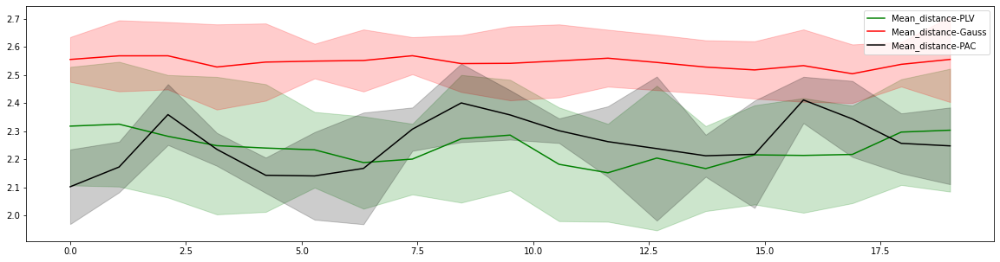

In [ ]:
plt.figure(figsize=(20,5))
# plt.plot(distan_psd[0,:],color='blue')
# plt.plot(distan_psd[1,:],color='blue',linestyle='--',alpha=0.8)
plt.plot(np.linspace(0, 19, 19),mean_std_PLV[0][1].ravel(),color='green')
plt.fill_between(np.linspace(0, 19, 19),
                 mean_std_PLV[0][1].ravel()-mean_std_PLV[0][2].ravel()-0.05,
                 mean_std_PLV[0][1].ravel()+mean_std_PLV[0][2].ravel()+0.05, 
                 alpha=0.2,color='green')
plt.plot(np.linspace(0, 19, 19),mean_std_gauss[0][1].ravel(),color='red')
plt.fill_between(np.linspace(0, 19, 19),
                 mean_std_gauss[0][1].ravel()-mean_std_gauss[0][2].ravel(),
                 mean_std_gauss[0][1].ravel()+mean_std_gauss[0][2].ravel(), 
                 alpha=0.2,color='red')
plt.plot(np.linspace(0, 19, 19),mean_std_PAC[0][1].ravel(),color='black')
plt.fill_between(np.linspace(0, 19, 19),
                 mean_std_PAC[0][1].ravel()-mean_std_PAC[0][2].ravel(),
                 mean_std_PAC[0][1].ravel()+mean_std_PAC[0][2].ravel(), 
                 alpha=0.2,color='black')

plt.legend(['Mean_distance-PLV','Mean_distance-Gauss','Mean_distance-PAC'])
plt.show()

In [ ]:
np.std(mean_std_PLV,axis=0).shape

(19,)

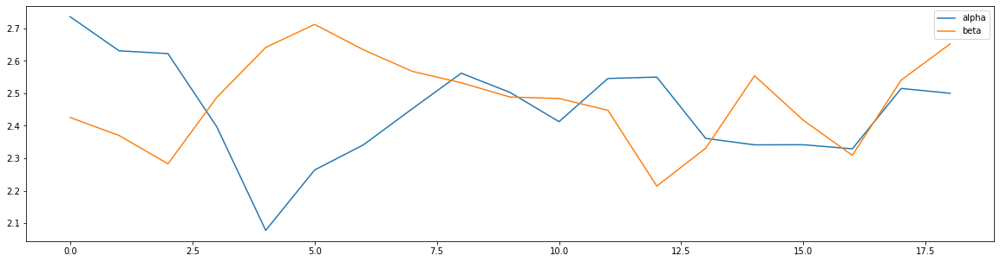

In [ ]:
plt.figure(figsize=(20,5))
plt.plot(dat_gauss_f[0,:])
plt.plot(dat_gauss_f[1,:])
plt.legend(['alpha','beta'])
plt.show()

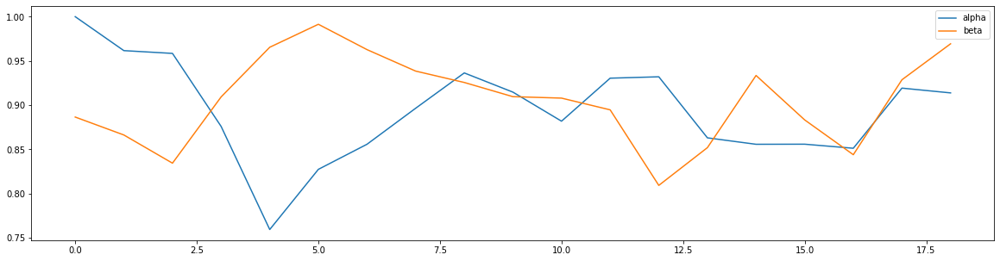

In [ ]:
 max_2 = np.max(dat_gauss_f)
plt.figure(figsize=(20,5))
plt.plot(dat_gauss_f[0,:]/max_2)
plt.plot(dat_gauss_f[1,:]/max_2)
plt.legend(['alpha','beta'])
plt.show()

# topoplots grupos

In [ ]:
!pip install -U mne==0.19
!pip install bctpy

In [ ]:
import numpy as np
import bct
import pickle
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import squareform
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
#-----------------------------------------------------------------------------------------------------------------
from sklearn.model_selection import KFold
from scipy.spatial.distance import pdist, squareform
from sklearn.preprocessing import StandardScaler,MinMaxScaler
from sklearn.decomposition import KernelPCA
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import euclidean_distances
import mne
from mne.viz import plot_topomap
# from mne.viz.topomap import _check_outlines, _draw_outlines
from mne.viz.utils import plt_show,tight_layout
from mne.io.pick import _picks_to_idx
from mne.time_frequency import tfr_array_morlet, csd_array_morlet, csd_array_fourier
#-----------------------------------------------------------------------------------------------------------------
from mpl_toolkits.mplot3d import Axes3D  # noqa
import matplotlib.colors as colors
import matplotlib.cm as cmx
from scipy.stats import kurtosis
import pywt
from scipy.signal import periodogram, welch
from scipy.stats import spearmanr
from joblib import Parallel, delayed
from scipy.stats import kendalltau
from joblib import load
import scipy.io as sio
## CKA
from sklearn.metrics import pairwise_distances  
from scipy.spatial.distance import squareform 
from mne.viz import plot_topomap
from scipy.stats import kurtosis
import pywt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import periodogram, welch
from scipy.stats import spearmanr
import matplotlib.colors as colors
import matplotlib.cm as cmx
from mne.time_frequency import tfr_array_morlet, csd_array_morlet, csd_array_fourier
from joblib import Parallel, delayed
from scipy.stats import kendalltau
from mne.viz.utils import plt_show,tight_layout
from mne.io.pick import _picks_to_idx
import tensorflow as tf
import tensorflow_probability as tfp
from sklearn.decomposition import PCA
from tensorflow.keras import regularizers
from sklearn.base import  BaseEstimator, TransformerMixin, ClassifierMixin
from sklearn.model_selection import train_test_split
tf.keras.backend.clear_session()
tf.random.set_seed(42)
import types
import tempfile

In [ ]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  # noqa
from mne.viz.utils import plt_show,tight_layout
from mne.io.pick import _picks_to_idx
from scipy.spatial.distance import squareform 
from mne.viz import plot_topomap
import matplotlib.colors as colors
import matplotlib.cm as cmx
from mne.viz.topomap import _check_outlines,_draw_outlines
#%% download data
FILEID = "1F9WpS7sKSFY73HSHYBgYXw9iyYalBKgh"
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O modCSP.py && rm -rf /tmp/cookies.txt > /dev/null
#%% download data
!pip install git+https://github.com/UN-GCPDS/python-gcpds.utils.git
# from MIfunctions import *

--2021-12-02 21:37:34--  https://docs.google.com/uc?export=download&confirm=kK1H&id=1F9WpS7sKSFY73HSHYBgYXw9iyYalBKgh
Resolving docs.google.com (docs.google.com)... 172.217.219.101, 172.217.219.113, 172.217.219.139, ...
Connecting to docs.google.com (docs.google.com)|172.217.219.101|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-04-5o-docs.googleusercontent.com/docs/securesc/ag3ee0e5qk6m883vh48sn3mqubb420bi/kkka82m2mkpfgtlv47a04ic6fp7t3evr/1638481050000/06932581800131476027/01779221028689579767Z/1F9WpS7sKSFY73HSHYBgYXw9iyYalBKgh?e=download [following]
--2021-12-02 21:37:34--  https://doc-04-5o-docs.googleusercontent.com/docs/securesc/ag3ee0e5qk6m883vh48sn3mqubb420bi/kkka82m2mkpfgtlv47a04ic6fp7t3evr/1638481050000/06932581800131476027/01779221028689579767Z/1F9WpS7sKSFY73HSHYBgYXw9iyYalBKgh?e=download
Resolving doc-04-5o-docs.googleusercontent.com (doc-04-5o-docs.googleusercontent.com)... 172.217.212.132, 2607:f8b0:4001:c03::84
Conne

In [ ]:
# función de topoplot con links
class FB_feats2(TransformerMixin,BaseEstimator):
    def __init__(self, fs=250,f_frec=np.array([[8,12],[12,30]]),vtw=np.array([[2.5,4.5],[3,5]]),gammad=1,feat='kcon',ncomp = 6,method='fft',normalize=True,n_cycles=7.0):
        self.vtw = vtw
        self.fs = fs
        self.f_frec = f_frec
        self.gammad = gammad
        self.feat = feat
        self.method = method
        self.normalize = normalize
        self.ncomp = ncomp
        self.n_cycles = n_cycles
    def connection_rho(self,rho,fs,channels_names,thr=0.9,mean_by_time_windows=None,mean_by_frequencies=None,figsize=(30,30),save=True,sbj='',acc='',format='png',path='',Ch='s',cmap_tplt='jet',normalizate='True',ch_ext=None):
        # whether mean_by_time_windows or mean_by_frequencies are True, the rho vector will be averaged over time or frequency.
        #but, also it can be a vector, such as, [0,0,1,1,2,2] that indicates  which indices of rho will be averaged.
        if Ch !='s':
            self.Ch = Ch
        self.P = int(0.5*self.Ch*(self.Ch-1))
        if ch_ext is not None:
            pCh = len(ch_ext)
            pp = int(0.5*pCh*(pCh-1))
            tmprho = rho.reshape(pp,-1)
            srhoMc= np.asarray([squareform(tmprho[:,i]) for i in range(tmprho.shape[-1])]).T
            chpt = np.isin(channels_names,ch_ext)
            tmpch = np.zeros((len(channels_names),len(channels_names),srhoMc.shape[-1]))
            for p in range(srhoMc.shape[-1]):
                k=0
                for i in range(len(chpt)):
                    if chpt[i]==True:
                        j=0
                        for ii in range(len(chpt)):
                            if chpt[ii]==True:
                                tmpch[i,ii,p] = srhoMc[j,k,p]
                                j+=1
                            else:
                                tmpch[i,ii,p] = 0
                        k+=1
                    else:
                        tmpch[i,:,p]=0
            ghj = np.asarray([squareform(tmpch[:,:,i]) for i in range(tmpch.shape[-1])]).T
            rho = ghj.ravel()
        rhoMc = rho.reshape(self.P,self.vtw.shape[0],self.f_frec.shape[0]) # Ch(Ch-1)/2, windows, bands
        if mean_by_frequencies is None:
            mean_by_frequencies = np.arange(self.f_frec.shape[0])
        if mean_by_time_windows is None:
            mean_by_time_windows = np.arange(self.vtw.shape[0])
        times = len(np.unique(mean_by_time_windows))
        frecs = len(np.unique(mean_by_frequencies))
        rhof=[]
        for i in np.unique(mean_by_frequencies):
            rhof.append(np.mean(rhoMc[:,:,mean_by_frequencies==i],axis=-1))
        rhof=np.array(rhof)
        #rhof = np.swapaxes(rhof,0,-1).squeeze()
        rhof = np.moveaxis(rhof, [0], [-1])
        rho = []
        for i in np.unique(mean_by_time_windows):
            rho.append(np.mean(rhof[:,mean_by_time_windows==i,:],axis=-2))
        rho=np.array(rho)
        #rho = np.swapaxes(rho,0,2).squeeze()
        rho = np.moveaxis(rho, [0], [-2])
        montage = mne.channels.read_montage('standard_1005')
        layout = mne.channels.read_layout('EEG1005')
        #montage = mne.channels.read_montage('biosemi128')
        #layout = montage.ch_names
        info = mne.create_info(layout.names, sfreq=fs, ch_types="eeg",
                                montage=montage)
        pos = np.array([(p[0] + p[2] / 2., p[1] + p[3] / 2.) for p in layout.pos])
        # pick channels
        picks = _picks_to_idx(info,channels_names)
        pos = pos[picks]
        # adjust positions
        pos, outlines = _check_outlines(pos, 'head')
        pos_x = pos[:,0]
        pos_y = pos[:,1]
        names = np.array(layout.names)[picks]
        if normalizate:
            rho=((rho-rho.min())/(rho.max()-rho.min()))
        cmap = cmap_tplt
        if normalizate:
            cNorm  = colors.Normalize(vmin=np.min(rho), vmax=np.max(rho))
        else:
            cNorm  = colors.Normalize(vmin=0, vmax=1)
        scalarMap = cmx.ScalarMappable(norm=cNorm,cmap=cmap)
        rhotopo = np.zeros((Ch,frecs,times))
        for time in np.arange(times):
            for frec in np.arange(frecs):
                rhotopo[:,frec,time] = squareform(rho[:,time,frec]).sum(axis=1)
        rhotopo = rhotopo-rhotopo.min()
        rhotopo /= rhotopo.max()
        #f,ax = plt.subplots(frecs,times,figsize=figsize)
        fig=plt.figure(figsize=figsize)
        itr=1
        for time in np.arange(times): 
            for frec in np.arange(frecs):
                ax = fig.add_subplot(frecs,times,itr)
                itr+=1
                rhok = squareform(rho[:,time,frec])
                #plot_topomap(rhotopo[:,frec,time], pos, axes=ax[frec,time], cmap=cmap_tplt, show=False, contours=0, sensors=False,vmin=0,vmax=1)
                plot_topomap(rhotopo[:,frec,time], pos, axes=ax, cmap=cmap_tplt, show=False, contours=0, sensors=False,vmin=0,vmax=1)
                if thr >1:
                    indx_pct = np.where(np.triu(rhok)>np.percentile(rho.ravel()[rho.ravel()>1e-8], thr))
                else:
                    indx_pct = np.where(np.triu(rhok)>thr)
                #ax[frec,time].set(xticks=[], yticks=[], aspect='equal')
                ax.set(xticks=[], yticks=[], aspect='equal')
                #ax[frec,time].scatter(pos[:,0],pos[:,1],100)
                #_draw_outlines(ax[frec,time], outlines)
                _draw_outlines(ax, outlines)
                for i in np.arange(np.shape(indx_pct)[-1]):
                    ch1=indx_pct[0][i]
                    ch2=indx_pct[1][i]     
                    #ax[frec,time].arrow(pos_x[ch1],pos_y[ch1],pos_x[ch2]-pos_x[ch1],
                            #pos_y[ch2]-pos_y[ch1],head_width=0.0,length_includes_head=False,
                            #width=0.003,color=scalarMap.to_rgba(rhok[ch1,ch2]))
                    ax.arrow(pos_x[ch1],pos_y[ch1],pos_x[ch2]-pos_x[ch1],
                            pos_y[ch2]-pos_y[ch1],head_width=0.0,length_includes_head=False,
                            width=0.003,color=scalarMap.to_rgba(rhok[ch1,ch2]))
                for ch1 in  np.unique(np.ravel(indx_pct)):
                    #ax[frec,time].scatter(pos_x[ch1],pos_y[ch1],50*np.sum(np.ravel(indx_pct)==ch1),'gray')
                    ax.scatter(pos_x[ch1],pos_y[ch1],50*np.sum(np.ravel(indx_pct)==ch1),'gray')
                    #ax[frec,time].annotate(names[ch1], xy=pos[ch1,:],size=15)
                    ax.annotate(names[ch1], xy=pos[ch1,:],size=15)
        cax = fig.add_axes([0.95, 0.15, 0.02, 0.75])
        sm = plt.cm.ScalarMappable(cmap=cmap)
        sm.set_array(rho.ravel())
        plt.colorbar(sm,cax=cax)
        if save ==True:
            plt.savefig(str(path)+'Cxsbj'+str(sbj)+'acc'+str(acc)+'.'+format,format=format)
        return

In [ ]:
vtw = list()
fs = 1000
for a in range(1):
  vtw.append([a+1,a+2])
  feat = FB_feats2(fs=fs,vtw=np.array([[1,45]]),
                f_frec=np.array(vtw))

In [ ]:
vtw

[[1, 2]]

In [ ]:
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3', 'Pz', 'P4', 'T6', 'O1', 'O2']
n_channels = len(channels)
# ch_types = ['eeg']*n_channels
# info = mne.create_info(channels, ch_types=ch_types, sfreq=1000)
# info.set_montage('standard_1005')

In [ ]:
# graficar los enlaces en el topoplot.
fs = 1000
Cx_topo = np.squeeze(np.mean(np.squeeze(np.mean(Cx_,axis=0)),axis=0))
feat.connection_rho(Cx_topo, fs, channels, thr=0.7, # umbral
                    figsize=(10, 10), save=False, sbj='', acc='', 
                    format='eps', path='', Ch=n_channels,
                    cmap_tplt='hot')

# SVM acc

In [ ]:
# y__ = loadmat('layer.mat')['lay']
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
y__ = loadmat(folder_path+'/Trials_cuadrantes')['trial_ord']
y__= y__.reshape([y__.shape[0]*y__.shape[1]])
y__.shape

(1240,)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.datasets import load_breast_cancer
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
 
# y = indx_s[0] # vector de las etiquetas.
folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
# y = loadmat(folder_path_2+'clusters_.mat')['clus'].reshape(-1)+1
y = y__.reshape(-1)
# y.shape
X = datos_fold_                          # datos de trials, tiempos, conexiones.
param_grid = {'C': [ 0.1, 1,],
              'gamma': [0.01, 0.1, 1],
              'kernel': ['rbf']}
grid_predictions_=list()
# kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
# kf = StratifiedKFold(n_splits=10,random_state=0,shuffle=True)
fold = 0
# for train_index, test_index in kf.split(resp_data,y):
ind_s = np.arange(0,1240,40)
for subj in range(31):
  train_index_  = tr_all.astype(bool)
  train_index_[ind_s[subj]:ind_s[subj]+40] = False
  train_index = np.where(train_index_==True)[0]
  # print(train_index.shape)
  test_index_ = np.zeros((1240)).astype(bool)
  test_index_[ind_s[subj]:ind_s[subj]+40] = True
  test_index_ = test_index_*tr_all
  # train_index_[ind_s[subj]:ind_s[subj]+40] = False
  test_index  = np.where(test_index_==True)[0]
  # print(test_index.shape)
  data_subs_pre = list()
  print("TRAIN:", train_index, "TEST:", test_index)
  X_train_, X_test_ = X[fold][train_index,:], X[fold][test_index,:]
  y_train_, y_test = y[train_index], y[test_index]
  # X_train_ = np.reshape(X_train_,(X_train_.shape[0],X_train_.shape[1]*X_train_.shape[2]*X_train_.shape[3]))
  # X_test_ = np.reshape(X_test_,(X_test_.shape[0],X_test_.shape[1]*X_test_.shape[2]*X_test_.shape[3]))
  # y_train_ = np.reshape(y_train_,(y_train_.shape[0],y_train_.shape[1]*y_train_.shape[2]))
  # y_test_ = np.reshape(y_test_,(y_test_.shape[0],y_test_.shape[1]*y_test_.shape[2]))
  # defining parameter range
  grid = GridSearchCV(SVC(), param_grid,
                      cv = 5, verbose = ,n_jobs=-1)
  # fitting the model for grid search
  
  grid.fit(X_train_, y_train_)
  # print best parameter after tuning
  print(grid.best_params_)
  # print how our model looks after hyper-parameter tuning
  print(grid.best_estimator_)
  grid_predictions = grid.predict(X_test_)
  # print classification report
  print(classification_report(y_test, grid_predictions))
  grid_predictions_.append(grid_predictions)
  fold += 1
  # concatenar los acierto de cada fold y luego comparar los aciertos por todos 

TRAIN: [  40   41   42 ... 1237 1238 1239] TEST: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 22 23 24
 25 28 30 31 32 33 34 35 36 37 38 39]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        11
         2.0       0.44      1.00      0.62        16
         3.0       0.00      0.00      0.00         2
         4.0       0.00      0.00      0.00         7

    accuracy                           0.44        36
   macro avg       0.11      0.25      0.15        36
weighted avg       0.20      0.44      0.27        36

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [40 41 42 43 44 46 47 48 49 50 51 52 53 54 56 58 59 60 61 62 63 65 66 67
 68 69 70 71 72 73 74 75 76 77 78 79]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        13
         2.0       0.31      1.00      0.47        11
         3.0       0.00      0.00      0.00         7
         4.0       0.00      0.00      0.00         5

    accuracy                           0.31        36
   macro avg       0.08      0.25      0.12        36
weighted avg       0.09      0.31      0.14        36

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [ 80  81  83  84  85  86  88  89  92  94  95  96  98  99 100 102 103 104
 107 108 109 110 111 112 114 115 117 118 119]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00         9
         2.0       0.24      1.00      0.39         7
         3.0       0.00      0.00      0.00         7
         4.0       0.00      0.00      0.00         6

    accuracy                           0.24        29
   macro avg       0.06      0.25      0.10        29
weighted avg       0.06      0.24      0.09        29

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [121 122 123 124 125 127 128 129 130 131 132 133 134 135 136 137 138 139
 140 142 143 144 145 148 149 150 151 152 153 156 158 159]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        16
         2.0       0.22      1.00      0.36         7
         3.0       0.00      0.00      0.00         2
         4.0       0.00      0.00      0.00         7

    accuracy                           0.22        32
   macro avg       0.05      0.25      0.09        32
weighted avg       0.05      0.22      0.08        32

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [161 162 163 165 166 168 169 170 171 172 173 174 175 176 177 179 180 181
 182 183 184 185 187 188 189 190 191 193 194 196 197 198 199]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        10
         2.0       0.24      1.00      0.39         8
         3.0       0.00      0.00      0.00         9
         4.0       0.00      0.00      0.00         6

    accuracy                           0.24        33
   macro avg       0.06      0.25      0.10        33
weighted avg       0.06      0.24      0.09        33

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [200 203 204 205 206 207 209 210 212 213 214 215 216 217 218 221 222 223
 224 225 226 227 228 230 231 232 233 234 236 237 238 239]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        11
         2.0       0.28      1.00      0.44         9
         3.0       0.00      0.00      0.00         5
         4.0       0.00      0.00      0.00         7

    accuracy                           0.28        32
   macro avg       0.07      0.25      0.11        32
weighted avg       0.08      0.28      0.12        32

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [240 241 242 243 244 245 246 248 249 250 251 252 253 254 255 256 258 261
 262 263 264 265 266 268 269 270 271 272 273 276 277 279]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        10
         2.0       0.31      1.00      0.48        10
         3.0       0.00      0.00      0.00         4
         4.0       0.00      0.00      0.00         8

    accuracy                           0.31        32
   macro avg       0.08      0.25      0.12        32
weighted avg       0.10      0.31      0.15        32

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [280 281 282 283 284 285 286 287 288 289 290 291 292 293 295 297 298 299
 300 303 304 305 307 308 309 310 311 312 313 315 316 318]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        10
         2.0       0.41      1.00      0.58        13
         3.0       0.00      0.00      0.00         7
         4.0       0.00      0.00      0.00         2

    accuracy                           0.41        32
   macro avg       0.10      0.25      0.14        32
weighted avg       0.17      0.41      0.23        32

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [320 323 324 325 326 327 329 330 332 333 334 335 336 337 338 341 342 343
 344 345 346 347 348 350 351 352 353 354 356 357 358 359]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        11
         2.0       0.28      1.00      0.44         9
         3.0       0.00      0.00      0.00         5
         4.0       0.00      0.00      0.00         7

    accuracy                           0.28        32
   macro avg       0.07      0.25      0.11        32
weighted avg       0.08      0.28      0.12        32

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [360 361 362 363 364 365 366 367 369 370 371 373 374 375 376 377 378 380
 381 382 383 384 386 387 388 389 390 391 392 393 394 395 396 397 398 399]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        12
         2.0       0.42      1.00      0.59        15
         3.0       0.00      0.00      0.00         3
         4.0       0.00      0.00      0.00         6

    accuracy                           0.42        36
   macro avg       0.10      0.25      0.15        36
weighted avg       0.17      0.42      0.25        36

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [401 404 405 406 407 408 409 410 411 412 413 414 416 417 418 419 420 421
 422 423 424 425 426 428 429 430 431 432 433 434 435 437 438 439]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        12
         2.0       0.35      1.00      0.52        12
         3.0       0.00      0.00      0.00         6
         4.0       0.00      0.00      0.00         4

    accuracy                           0.35        34
   macro avg       0.09      0.25      0.13        34
weighted avg       0.12      0.35      0.18        34

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [440 441 442 443 444 446 447 448 449 451 452 453 454 455 457 458 460 462
 463 464 465 466 467 468 469 470 471 472 474 476 477 478 479]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        11
         2.0       0.39      1.00      0.57        13
         3.0       0.00      0.00      0.00         4
         4.0       0.00      0.00      0.00         5

    accuracy                           0.39        33
   macro avg       0.10      0.25      0.14        33
weighted avg       0.16      0.39      0.22        33

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [481 484 485 486 487 488 489 490 491 492 493 494 496 497 498 499 500 501
 502 503 504 505 506 508 509 510 511 512 513 514 515 517 518 519]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        12
         2.0       0.35      1.00      0.52        12
         3.0       0.00      0.00      0.00         6
         4.0       0.00      0.00      0.00         4

    accuracy                           0.35        34
   macro avg       0.09      0.25      0.13        34
weighted avg       0.12      0.35      0.18        34

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [521 524 525 526 527 528 529 530 531 532 533 534 536 537 538 539 540 541
 542 543 544 545 546 548 549 550 551 552 553 554 555 557 558 559]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        12
         2.0       0.35      1.00      0.52        12
         3.0       0.00      0.00      0.00         6
         4.0       0.00      0.00      0.00         4

    accuracy                           0.35        34
   macro avg       0.09      0.25      0.13        34
weighted avg       0.12      0.35      0.18        34

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [561 564 565 566 567 568 569 570 571 572 573 574 576 577 578 579 580 581
 582 583 584 585 586 588 589 590 591 592 593 594 595 597 598 599]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        12
         2.0       0.35      1.00      0.52        12
         3.0       0.00      0.00      0.00         6
         4.0       0.00      0.00      0.00         4

    accuracy                           0.35        34
   macro avg       0.09      0.25      0.13        34
weighted avg       0.12      0.35      0.18        34

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [600 602 603 604 605 606 607 608 609 610 611 612 613 614 615 616 618 619
 620 623 624 626 627 628 629 630 631 632 633 634 635 636 637 638 639]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        11
         2.0       0.40      1.00      0.57        14
         3.0       0.00      0.00      0.00         2
         4.0       0.00      0.00      0.00         8

    accuracy                           0.40        35
   macro avg       0.10      0.25      0.14        35
weighted avg       0.16      0.40      0.23        35

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [640 641 642 643 644 645 646 647 648 649 650 651 652 653 654 655 656 657
 658 659 660 661 663 665 666 667 669 671 672 674 675 676 677 678 679]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        10
         2.0       0.46      1.00      0.63        16
         3.0       0.00      0.00      0.00         4
         4.0       0.00      0.00      0.00         5

    accuracy                           0.46        35
   macro avg       0.11      0.25      0.16        35
weighted avg       0.21      0.46      0.29        35

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [681 682 683 684 685 686 687 688 690 691 692 693 694 695 697 699 700 701
 702 703 705 706 707 708 709 711 712 713 714 715]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00         5
         2.0       0.43      1.00      0.60        13
         3.0       0.00      0.00      0.00         3
         4.0       0.00      0.00      0.00         9

    accuracy                           0.43        30
   macro avg       0.11      0.25      0.15        30
weighted avg       0.19      0.43      0.26        30

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [720 721 722 723 724 725 726 727 728 729 730 731 732 733 734 735 736 737
 738 739 740 741 743 745 746 747 749 751 752 754 755 756 757 758 759]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        10
         2.0       0.46      1.00      0.63        16
         3.0       0.00      0.00      0.00         4
         4.0       0.00      0.00      0.00         5

    accuracy                           0.46        35
   macro avg       0.11      0.25      0.16        35
weighted avg       0.21      0.46      0.29        35

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [760 763 764 765 766 768 769 770 771 772 773 774 776 777 778 779 780 781
 782 783 784 785 786 787 789 790 791 792 793 794 796 797 798 799]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00         9
         2.0       0.35      1.00      0.52        12
         3.0       0.00      0.00      0.00         4
         4.0       0.00      0.00      0.00         9

    accuracy                           0.35        34
   macro avg       0.09      0.25      0.13        34
weighted avg       0.12      0.35      0.18        34

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [800 801 802 803 804 805 806 807 808 809 810 811 812 813 814 815 816 817
 818 819 820 821 823 825 826 827 829 831 832 834 835 836 837 838 839]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        10
         2.0       0.46      1.00      0.63        16
         3.0       0.00      0.00      0.00         4
         4.0       0.00      0.00      0.00         5

    accuracy                           0.46        35
   macro avg       0.11      0.25      0.16        35
weighted avg       0.21      0.46      0.29        35

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [840 841 842 843 844 845 846 847 848 849 850 851 852 853 854 855 856 857
 858 859 860 861 863 865 866 867 869 871 872 874 875 876 877 878 879]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        10
         2.0       0.46      1.00      0.63        16
         3.0       0.00      0.00      0.00         4
         4.0       0.00      0.00      0.00         5

    accuracy                           0.46        35
   macro avg       0.11      0.25      0.16        35
weighted avg       0.21      0.46      0.29        35

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [880 881 882 883 884 885 886 887 888 889 890 891 892 893 894 895 896 897
 898 899 900 901 903 905 906 907 909 911 912 914 915 916 917 918 919]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        10
         2.0       0.46      1.00      0.63        16
         3.0       0.00      0.00      0.00         4
         4.0       0.00      0.00      0.00         5

    accuracy                           0.46        35
   macro avg       0.11      0.25      0.16        35
weighted avg       0.21      0.46      0.29        35

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [920 921 922 923 924 925 926 927 928 929 930 931 932 933 934 935 936 937
 938 939 940 941 943 945 946 947 949 951 952 954 955 956 957 958 959]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        10
         2.0       0.46      1.00      0.63        16
         3.0       0.00      0.00      0.00         4
         4.0       0.00      0.00      0.00         5

    accuracy                           0.46        35
   macro avg       0.11      0.25      0.16        35
weighted avg       0.21      0.46      0.29        35

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [960 961 962 963 964 965 966 967 968 969 970 971 972 973 974 975 976 977
 978 979 980 981 983 985 986 987 989 991 992 994 995 996 997 998 999]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        10
         2.0       0.46      1.00      0.63        16
         3.0       0.00      0.00      0.00         4
         4.0       0.00      0.00      0.00         5

    accuracy                           0.46        35
   macro avg       0.11      0.25      0.16        35
weighted avg       0.21      0.46      0.29        35

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [1000 1001 1002 1003 1004 1005 1006 1007 1008 1009 1010 1011 1012 1013
 1014 1015 1016 1017 1018 1019 1020 1021 1023 1025 1026 1027 1029 1031
 1032 1034 1035 1036 1037 1038 1039]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        10
         2.0       0.46      1.00      0.63        16
         3.0       0.00      0.00      0.00         4
         4.0       0.00      0.00      0.00         5

    accuracy                           0.46        35
   macro avg       0.11      0.25      0.16        35
weighted avg       0.21      0.46      0.29        35

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [1040 1041 1042 1043 1044 1045 1046 1047 1048 1049 1050 1051 1052 1053
 1054 1055 1056 1057 1058 1059 1060 1061 1063 1065 1066 1067 1069 1071
 1072 1074 1075 1076 1077 1078 1079]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        10
         2.0       0.46      1.00      0.63        16
         3.0       0.00      0.00      0.00         4
         4.0       0.00      0.00      0.00         5

    accuracy                           0.46        35
   macro avg       0.11      0.25      0.16        35
weighted avg       0.21      0.46      0.29        35

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [1080 1081 1082 1083 1084 1085 1086 1087 1088 1089 1090 1091 1092 1093
 1094 1095 1096 1097 1098 1099 1100 1101 1103 1105 1106 1107 1109 1111
 1112 1114 1115 1116 1117 1118 1119]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        10
         2.0       0.46      1.00      0.63        16
         3.0       0.00      0.00      0.00         4
         4.0       0.00      0.00      0.00         5

    accuracy                           0.46        35
   macro avg       0.11      0.25      0.16        35
weighted avg       0.21      0.46      0.29        35

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [1120 1121 1122 1123 1124 1125 1126 1127 1128 1129 1130 1131 1132 1133
 1134 1135 1136 1137 1138 1139 1140 1141 1142 1143 1144 1145 1146 1147
 1149 1150 1151 1152 1153 1155 1156 1157 1158 1159]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        14
         2.0       0.42      1.00      0.59        16
         3.0       0.00      0.00      0.00         2
         4.0       0.00      0.00      0.00         6

    accuracy                           0.42        38
   macro avg       0.11      0.25      0.15        38
weighted avg       0.18      0.42      0.25        38

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [1160 1161 1162 1163 1164 1165 1166 1167 1168 1169 1170 1171 1172 1173
 1174 1175 1176 1177 1178 1179 1180 1181 1182 1183 1186 1188 1189 1192
 1193 1194 1196 1197 1198 1199]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        12
         2.0       0.41      1.00      0.58        14
         3.0       0.00      0.00      0.00         1
         4.0       0.00      0.00      0.00         7

    accuracy                           0.41        34
   macro avg       0.10      0.25      0.15        34
weighted avg       0.17      0.41      0.24        34

TRAIN: [   0    1    2 ... 1197 1198 1199] TEST: [1200 1201 1202 1203 1204 1205 1206 1207 1208 1209 1210 1211 1212 1213
 1214 1215 1216 1217 1218 1219 1222 1223 1224 1225 1227 1229 1230 1231
 1232 1233 1234 1236 1237 1238 1239]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 0.1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=0.1, gamma=0.01)
              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00        14
         2.0       0.37      1.00      0.54        13
         3.0       0.00      0.00      0.00     

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
np.concatenate(grid_predictions_)

array([2., 2., 2., ..., 2., 2., 2.])

In [ ]:
# pred = np.asarray(grid_predictions_)
# pred = np.reshape(pred,(pred.shape[0]*pred.shape[1]))
pred = np.concatenate(grid_predictions_)
print(classification_report(y[tr_all], pred))

              precision    recall  f1-score   support

         1.0       0.00      0.00      0.00       337
         2.0       0.39      1.00      0.56       408
         3.0       0.00      0.00      0.00       132
         4.0       0.00      0.00      0.00       178

    accuracy                           0.39      1055
   macro avg       0.10      0.25      0.14      1055
weighted avg       0.15      0.39      0.22      1055



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.datasets import load_breast_cancer
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
 
# y = indx_s[0] # vector de las etiquetas.
folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
# y = loadmat(folder_path_2+'clusters_.mat')['clus'].reshape(-1)+1
y = y__.reshape(-1)

# y.shape
X = datos_fold_                          # datos de trials, tiempos, conexiones.
param_grid = {'C': [0.1, 1],
              'gamma': [0.1, 1],
              'kernel': ['poly']}
grid_predictions_=list()
# kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
# kf = StratifiedKFold(n_splits=10,random_state=0,shuffle=True)
fold = 0
# for train_index, test_index in kf.split(resp_data,y):
ind_s = np.arange(0,1240,40)
for subj in range(31):
  train_index_  = tr_all.astype(bool)
  train_index_[ind_s[subj]:ind_s[subj]+40] = False
  train_index = np.where(train_index_==True)[0]
  # print(train_index.shape)
  test_index_ = np.zeros((1240)).astype(bool)
  test_index_[ind_s[subj]:ind_s[subj]+40] = True
  test_index_ = test_index_*tr_all
  # train_index_[ind_s[subj]:ind_s[subj]+40] = False
  test_index  = np.where(test_index_==True)[0]
  # print(test_index.shape)
  data_subs_pre = list()
  print("TRAIN:", train_index, "TEST:", test_index)
  X_train_, X_test_ = X[fold][train_index,:], X[fold][test_index,:]
  y_train_, y_test = y[train_index], y[test_index]
  # X_train_ = np.reshape(X_train_,(X_train_.shape[0],X_train_.shape[1]*X_train_.shape[2]*X_train_.shape[3]))
  # X_test_ = np.reshape(X_test_,(X_test_.shape[0],X_test_.shape[1]*X_test_.shape[2]*X_test_.shape[3]))
  # y_train_ = np.reshape(y_train_,(y_train_.shape[0],y_train_.shape[1]*y_train_.shape[2]))
  # y_test_ = np.reshape(y_test_,(y_test_.shape[0],y_test_.shape[1]*y_test_.shape[2]))
  # defining parameter range
  grid = GridSearchCV(SVC(), param_grid,
                      cv = 5, verbose = 2,n_jobs=-1)
  # fitting the model for grid search
  
  grid.fit(X_train_, y_train_)
  # print best parameter after tuning
  print(grid.best_params_)
  # print how our model looks after hyper-parameter tuning
  print(grid.best_estimator_)
  grid_predictions = grid.predict(X_test_)
  # print classification report
  print(classification_report(y_test, grid_predictions))
  grid_predictions_.append(grid_predictions)
  fold += 1
  # concatenar los acierto de cada fold y luego comparar los aciertos por todos 

TRAIN: [  40   41   42 ... 1237 1238 1239] TEST: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 22 23 24
 25 28 30 31 32 33 34 35 36 37 38 39]
Fitting 5 folds for each of 4 candidates, totalling 20 fits


In [ ]:
pred = np.asarray(grid_predictions_)
pred = np.reshape(pred,(pred.shape[0]*pred.shape[1]))
print(classification_report(y, pred))

              precision    recall  f1-score   support

           1       0.00      0.00      0.00       271
           2       0.32      1.00      0.48       395
           3       0.00      0.00      0.00       369
           4       0.00      0.00      0.00       205

    accuracy                           0.32      1240
   macro avg       0.08      0.25      0.12      1240
weighted avg       0.10      0.32      0.15      1240



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
pred

array([2, 2, 2, ..., 2, 2, 2], dtype=int32)

In [ ]:
fold = 0
ind = datos_fold_[fold]==1+datos_fold_[fold]==2

In [ ]:
cv_sujetos[0]

array([[0., 0., 0., ..., 3., 1., 3.],
       [3., 1., 1., ..., 1., 3., 1.],
       [1., 3., 1., ..., 1., 1., 1.],
       ...,
       [1., 1., 1., ..., 1., 1., 1.],
       [1., 3., 3., ..., 3., 2., 1.],
       [2., 1., 2., ..., 1., 1., 1.]])

In [ ]:
ind1 = cv_sujetos[fold]==1
ind2 = cv_sujetos[fold]==2
ind  = ind1+ind2

In [ ]:
trial_sujeto = np.arange(0,1240,40)
len(trial_sujeto)

31

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.datasets import load_breast_cancer
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
 
# y = indx_s[0] # vector de las etiquetas.
folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
# y = loadmat(folder_path_2+'clusters_.mat')['clus'].reshape(-1)+1
y = y__.reshape(-1)
folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
datos_stim_ = scipy.io.loadmat(folder_path_+f"/datos_stim_ord2.mat")["datos"]
pca = PCA(n_components=9)
datos_stim = np.zeros((31,40,20,9))
for sub in range(31):
  for tr in range(40):
    datos_stim[sub,tr,:,:] = pca.fit_transform(datos_stim_[sub,tr,:,:])
datos_r = datos_stim.reshape([datos_stim.shape[0]*datos_stim.shape[1],datos_stim.shape[2]*datos_stim.shape[3]])

# y.shape
X = datos_r                          # datos de trials, tiempos, conexiones.
param_grid = {'C': [ 0.1, 1,],
              'gamma': [0.01, 0.1, 1],
              'kernel': ['rbf']}
grid_predictions_=list()
# kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
# kf = StratifiedKFold(n_splits=10,random_state=0,shuffle=True)
fold = 0
# for train_index, test_index in kf.split(resp_data,y):
ind_s = np.arange(0,1240,40)
for subj in range(31):
  train_index_  = np.ones((1240)).astype(bool)
  train_index_[ind_s[subj]:ind_s[subj]+40] = False
  train_index = np.where(train_index_==True)[0]
  # print(train_index.shape)
  test_index_ = np.abs(train_index_.astype(int)-1).astype(bool)
  test_index  = np.where(test_index_==True)[0]
  # print(test_index.shape)
  data_subs_pre = list()
  print("TRAIN:", train_index, "TEST:", test_index)
  X_train_, X_test_ = X[train_index,:], X[test_index,:]
  y_train_, y_test = y[train_index], y[test_index]
  X_train_ = np.reshape(X_train_,(X_train_.shape[0],X_train_.shape[1]))
  X_test_ = np.reshape(X_test_,(X_test_.shape[0],X_test_.shape[1]))
  # y_train_ = np.reshape(y_train_,(y_train_.shape[0],y_train_.shape[1]*y_train_.shape[2]))
  # y_test_ = np.reshape(y_test_,(y_test_.shape[0],y_test_.shape[1]*y_test_.shape[2]))
  # defining parameter range
  grid = GridSearchCV(SVC(), param_grid,
                      cv = 5, verbose = 1)
  # fitting the model for grid search
  
  grid.fit(X_train_, y_train_)
  # print best parameter after tuning
  print(grid.best_params_)
  # print how our model looks after hyper-parameter tuning
  print(grid.best_estimator_)
  grid_predictions = grid.predict(X_test_)
  # print classification report
  print(classification_report(y_test, grid_predictions))
  grid_predictions_.append(grid_predictions)
  fold += 1
  # concatenar los acierto de cada fold y luego comparar los aciertos por todos 

TRAIN: [  40   41   42 ... 1237 1238 1239] TEST: [ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23
 24 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=1, gamma=0.01)
              precision    recall  f1-score   support

           0       0.74      1.00      0.85        17
           1       1.00      0.91      0.95        11
           2       1.00      0.58      0.74        12

    accuracy                           0.85        40
   macro avg       0.91      0.83      0.85        40
weighted avg       0.89      0.85      0.84        40

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [40 41 42 43 44 45 46 47 48 49 50 51 52 53 54 55 56 57 58 59 60 61 62 63
 64 65 66 67 68 69 70 71 72 73 74 75 76 77 78 79]
Fitting 5 folds for each of 6 candidates, totalling 30 fits
{'C': 1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=1, gamma=0.01)
              precision    reca

In [ ]:
X[0].shape

(59, 171)

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.datasets import load_breast_cancer
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
 
# y = indx_s[0] # vector de las etiquetas.
folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
# y = loadmat(folder_path_2+'clusters_.mat')['clus'].reshape(-1)+1
y = y__.reshape(-1)
folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
datos_stim_ = scipy.io.loadmat(folder_path_+f"/datos_stim_ord2.mat")["datos"]
pca = PCA(n_components=9)
datos_stim = np.zeros((31,40,20,9))
for sub in range(31):
  for tr in range(40):
    datos_stim[sub,tr,:,:] = pca.fit_transform(datos_stim_[sub,tr,:,:])
datos_r = datos_stim.reshape([datos_stim.shape[0]*datos_stim.shape[1],datos_stim.shape[2]*datos_stim.shape[3]])
sub = 1
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/" # Path to the data folder here
resp_data = scipy.io.loadmat(folder_path+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_cx_all.mat")["resp"][0]

# y.shape
X = resp_data                          # datos de trials, tiempos, conexiones.
param_grid = {'C': [ 0.1, 1,],
              'gamma': [0.01, 0.1, 1],
              'kernel': ['rbf']}
grid_predictions_=list()
# kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
# kf = StratifiedKFold(n_splits=10,random_state=0,shuffle=True)
fold = 0
# for train_index, test_index in kf.split(resp_data,y):
ind_s = np.arange(0,1240,40)
for subj in range(31):
  train_index_  = np.ones((1240)).astype(bool)
  train_index_[ind_s[subj]:ind_s[subj]+40] = False
  train_index = np.where(train_index_==True)[0]
  # print(train_index.shape)
  test_index_ = np.abs(train_index_.astype(int)-1).astype(bool)
  test_index  = np.where(test_index_==True)[0]
  # print(test_index.shape)
  data_subs_pre = list()
  print("TRAIN:", train_index, "TEST:", test_index)
  X_train_, X_test_ = X[train_index], X[test_index]
  y_train_, y_test = y[train_index], y[test_index]
  # X_train_ = np.reshape(X_train_,(X_train_.shape[0],X_train_.shape[1]))
  # X_test_ = np.reshape(X_test_,(X_test_.shape[0],X_test_.shape[1]))
  # y_train_ = np.reshape(y_train_,(y_train_.shape[0],y_train_.shape[1]*y_train_.shape[2]))
  # y_test_ = np.reshape(y_test_,(y_test_.shape[0],y_test_.shape[1]*y_test_.shape[2]))
  # defining parameter range
  X_train = np.zeros((len(X_train_),X_train_[0].shape[0],X_train_[0].shape[1]))
  x_test = np.zeros((len(X_test_),X_test_[0].shape[0],X_test_[0].shape[1]))
  for tr in range(len(X_train_)):
    X_train[tr,:,:] = X_train_[tr]
  for tr in range(len(x_test_)):
    x_test[tr,:,:] = x_test_[tr]
  X_train = np.reshape(X_train,(X_train.shape[0],X_train.shape[1]*X_train.shape[2]))
  x_test = np.reshape(x_test,(x_test.shape[0],x_test.shape[1]*x_test.shape[2]))
  X_train[np.isnan(X_train)]=0
  x_test[np.isnan(x_test)]=0

  grid = GridSearchCV(SVC(), param_grid,
                      cv = 5, verbose = 1)
  # fitting the model for grid search
  
  grid.fit(X_train, y_train_)
  # print best parameter after tuning
  print(grid.best_params_)
  # print how our model looks after hyper-parameter tuning
  print(grid.best_estimator_)
  grid_predictions = grid.predict(x_test)
  # print classification report
  print(classification_report(y_test, grid_predictions))
  grid_predictions_.append(grid_predictions)
  fold += 1
  # concatenar los acierto de cada fold y luego comparar los aciertos por todos 

NameError: ignored

# SVM acc music

In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.datasets import load_breast_cancer
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
 
# y = indx_s[0] # vector de las etiquetas.
stim_data = scipy.io.loadmat(folder_path_+f"/Subject{1}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["stim"][0]
X = datos_fold_ss                          # datos de trials, tiempos, conexiones.
param_grid = {'C': [0.01, 0.1, 1,],
              'gamma': [0.01, 0.1, 1],
              'kernel': ['rbf']}
grid_predictions_=list()
# kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
kf = StratifiedKFold(n_splits=10,random_state=0,shuffle=True)

for train_index, test_index in kf.split(stim_data,y):
  data_subs_pre = list()
  print("TRAIN:", train_index, "TEST:", test_index)
  X_train_, X_test_ = X[fold][train_index], X[fold][test_index]
  y_train_, y_test = y[train_index], y[test_index]
  X_train = np.zeros((len(X_train_),X_train_[0].shape[0],X_train_[0].shape[1]))
  x_test = np.zeros((len(X_test_),X_test_[0].shape[0],X_test_[0].shape[1]))
  for tr in range(len(X_train_)):
    X_train[tr,:,:] = X_train_[tr]
  for tr in range(len(x_test_)):
    x_test[tr,:,:] = x_test_[tr]
  X_train = np.reshape(X_train,(X_train.shape[0],X_train.shape[1]*X_train.shape[2]))
  x_test = np.reshape(x_test,(x_test.shape[0],x_test.shape[1]*x_test.shape[2]))
  X_train[np.isnan(X_train)]=0
  x_test[np.isnan(x_test)]=0

  # defining parameter range
  grid = GridSearchCV(SVC(), param_grid,
                      cv = 5, verbose = 1)
  # fitting the model for grid search
  
  grid.fit(X_train, y_train_)
  # print best parameter after tuning
  print(grid.best_params_)
  # print how our model looks after hyper-parameter tuning
  print(grid.best_estimator_)
  grid_predictions = grid.predict(x_test)
  # print classification report
  print(classification_report(y_test, grid_predictions))
  grid_predictions_.append(grid_predictions)
  # concatenar los acierto de cada fold y luego comparar los aciertos por todos 

TRAIN: [   0    1    2 ... 1236 1238 1239] TEST: [   5    6    7   10   21   28   54   58   64   73   93   95   98  107
  113  115  123  144  146  162  165  166  173  176  181  197  223  227
  233  234  238  272  275  278  293  299  300  304  311  312  346  379
  389  391  394  402  457  459  461  475  476  479  486  497  500  504
  507  512  528  530  537  538  544  545  550  554  556  565  570  578
  586  588  596  603  611  643  648  663  667  668  669  676  689  690
  719  726  731  737  768  769  784  785  813  824  840  848  851  864
  883  904  938  957  958 1007 1017 1025 1027 1036 1041 1058 1071 1072
 1090 1121 1140 1150 1161 1166 1168 1174 1188 1231 1232 1237]
Fitting 5 folds for each of 9 candidates, totalling 45 fits
{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        27
           2       0.32      1.00      0.49        40
           3       0.00      0.00      0.0

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        27
           2       0.31      1.00      0.48        39
           3       0.00      0.00      0.00        37
           4       0.00      0.00      0.00        21

    accuracy                           0.31       124
   macro avg       0.08      0.25      0.12       124
weighted avg       0.10      0.31      0.15       124

TRAIN: [   1    2    3 ... 1237 1238 1239] TEST: [   0   37   39   40   44   59   62   77   85   87   97  105  112  116
  118  139  175  190  210  214  224  226  229  237  252  256  290  298
  303  307  317  321  353  375  380  382  385  392  397  416  427  430
  449  455  470  473  485  492  499  510  514  519  525  527  549  558
  566  577  591  595  600  604  617  638  641  644  645  647  660  661
  687  697  700  736  742  779  780  795  799  805  808  817  841  853
  865  869  870  873  890  899  91

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        27
           2       0.31      1.00      0.48        39
           3       0.00      0.00      0.00        37
           4       0.00      0.00      0.00        21

    accuracy                           0.31       124
   macro avg       0.08      0.25      0.12       124
weighted avg       0.10      0.31      0.15       124

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [  12   13   24   30   36   60   79   82   86   96  103  109  111  159
  161  170  183  194  198  208  219  235  236  260  261  269  270  284
  295  302  309  313  326  328  331  335  340  342  347  368  378  403
  408  409  415  422  423  426  445  448  466  490  540  543  553  590
  599  607  620  637  652  654  656  658  673  682  693  694  703  714
  718  721  724  728  733  759  760  781  782  804  816  820  823  829
  832  833  860  876  879  881  89

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        27
           2       0.31      1.00      0.48        39
           3       0.00      0.00      0.00        37
           4       0.00      0.00      0.00        21

    accuracy                           0.31       124
   macro avg       0.08      0.25      0.12       124
weighted avg       0.10      0.31      0.15       124

TRAIN: [   0    1    2 ... 1236 1237 1239] TEST: [   4   16   34   43   45   51  134  154  157  167  185  186  206  211
  213  215  239  244  249  251  280  289  294  315  318  322  324  329
  338  349  366  387  388  399  407  410  419  429  436  442  458  463
  503  511  513  517  534  571  589  609  615  618  630  649  653  677
  679  684  692  695  696  699  708  711  712  717  730  735  744  745
  761  775  783  793  800  818  849  857  858  868  886  891  902  909
  916  919  929  947  951  960  96

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        27
           2       0.31      1.00      0.48        39
           3       0.00      0.00      0.00        37
           4       0.00      0.00      0.00        21

    accuracy                           0.31       124
   macro avg       0.08      0.25      0.12       124
weighted avg       0.10      0.31      0.15       124

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [   3   38   52   55   63   67   78   99  106  121  125  126  138  158
  164  171  201  209  212  245  250  263  267  286  305  314  319  325
  348  356  359  369  398  413  420  440  444  456  460  465  467  480
  495  520  522  524  526  548  551  561  579  583  593  597  598  610
  613  616  626  627  633  657  659  671  698  710  715  751  770  771
  772  773  788  798  802  803  810  814  819  827  830  837  838  854
  885  893  898  901  917  927  93

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'C': 1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=1, gamma=0.01)
              precision    recall  f1-score   support

           1       0.25      0.04      0.06        28
           2       0.30      0.33      0.32        39
           3       0.31      0.65      0.42        37
           4       0.00      0.00      0.00        20

    accuracy                           0.31       124
   macro avg       0.22      0.25      0.20       124
weighted avg       0.24      0.31      0.24       124

TRAIN: [   0    1    2 ... 1236 1237 1238] TEST: [  33   35   47   56   65   76   83   94  101  110  132  136  142  148
  152  160  168  169  180  188  191  199  207  221  222  240  242  243
  248  268  281  283  285  292  297  301  306  308  343  352  354  367
  372  373  383  386  400  401  406  417  424  433  434  438  441  447
  451  452  474  478  484  516  529  533  535  562  568  572  584  605
  606  612  629  651  680  685  691  723  727  732  734  739  750  765
  766  797  811  843  845  8

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        27
           2       0.32      1.00      0.49        40
           3       0.00      0.00      0.00        37
           4       0.00      0.00      0.00        20

    accuracy                           0.32       124
   macro avg       0.08      0.25      0.12       124
weighted avg       0.10      0.32      0.16       124

TRAIN: [   0    1    2 ... 1237 1238 1239] TEST: [  18   23   41   46   50   61   66   68   71   75   80   84   88   90
  104  122  130  137  143  149  150  151  153  174  193  195  200  216
  220  230  246  247  262  264  287  288  291  332  334  336  355  358
  362  364  370  376  384  395  404  418  437  462  491  498  502  508
  539  564  567  569  580  594  623  635  640  662  666  672  707  725
  738  740  747  748  749  752  754  757  763  774  791  794  831  835
  846  861  871  874  906  921  92

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        27
           2       0.32      1.00      0.49        40
           3       0.00      0.00      0.00        37
           4       0.00      0.00      0.00        20

    accuracy                           0.32       124
   macro avg       0.08      0.25      0.12       124
weighted avg       0.10      0.32      0.16       124

TRAIN: [   0    1    3 ... 1237 1238 1239] TEST: [   2    8    9   14   20   22   26   29   31   32   57   89   91   92
  133  135  140  141  147  155  163  172  187  204  225  232  253  258
  271  276  277  279  351  361  363  374  405  411  412  414  428  439
  443  468  469  483  494  509  518  521  523  532  542  546  559  573
  574  587  602  619  621  622  632  650  665  702  709  716  720  729
  743  755  767  778  786  787  789  790  796  806  834  839  855  859
  863  880  895  911  912  914  93

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'C': 1, 'gamma': 0.01, 'kernel': 'rbf'}
SVC(C=1, gamma=0.01)
              precision    recall  f1-score   support

           1       0.33      0.04      0.07        27
           2       0.34      0.55      0.42        40
           3       0.29      0.43      0.34        37
           4       0.00      0.00      0.00        20

    accuracy                           0.31       124
   macro avg       0.24      0.25      0.21       124
weighted avg       0.27      0.31      0.25       124

TRAIN: [   0    2    3 ... 1237 1238 1239] TEST: [   1   19   25   27   49   81  102  108  114  119  120  124  156  177
  189  192  202  231  255  259  266  273  330  333  339  341  344  345
  350  371  393  396  421  425  431  435  446  454  464  481  482  487
  488  489  493  496  501  531  536  541  547  555  557  575  582  601
  614  625  628  646  655  664  675  678  681  683  686  705  706  741
  746  753  758  762  777  792  801  807  812  821  822  826  828  842
  867  872  875  877  888  8

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


{'C': 1, 'gamma': 1, 'kernel': 'rbf'}
SVC(C=1, gamma=1)
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        27
           2       0.32      1.00      0.49        40
           3       0.00      0.00      0.00        37
           4       0.00      0.00      0.00        20

    accuracy                           0.32       124
   macro avg       0.08      0.25      0.12       124
weighted avg       0.10      0.32      0.16       124



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
pred = np.asarray(grid_predictions_)
pred = np.reshape(pred,(pred.shape[0]*pred.shape[1]))
print(classification_report(y, pred))

              precision    recall  f1-score   support

           1       0.16      0.10      0.12       271
           2       0.31      0.46      0.37       395
           3       0.28      0.34      0.31       369
           4       0.07      0.02      0.03       205

    accuracy                           0.27      1240
   macro avg       0.21      0.23      0.21      1240
weighted avg       0.23      0.27      0.24      1240



In [ ]:
pred = np.asarray(grid_predictions_)
pred = np.reshape(pred,(pred.shape[0]*pred.shape[1]))
print(classification_report(y, pred))

              precision    recall  f1-score   support

           1       0.00      0.00      0.00       271
           2       0.32      0.99      0.48       395
           3       0.43      0.01      0.02       369
           4       0.00      0.00      0.00       205

    accuracy                           0.32      1240
   macro avg       0.19      0.25      0.12      1240
weighted avg       0.23      0.32      0.16      1240



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
pred = np.asarray(grid_predictions_)
pred = np.reshape(pred,(pred.shape[0]*pred.shape[1]))
print(classification_report(y, pred))

              precision    recall  f1-score   support

           1       0.21      0.09      0.12       271
           2       0.31      0.78      0.44       395
           3       0.29      0.10      0.15       369
           4       0.00      0.00      0.00       205

    accuracy                           0.30      1240
   macro avg       0.20      0.24      0.18      1240
weighted avg       0.23      0.30      0.21      1240



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
pred = np.asarray(grid_predictions_)
pred = np.reshape(pred,(pred.shape[0]*pred.shape[1]))
print(classification_report(y, pred))

              precision    recall  f1-score   support

           1       0.29      0.01      0.01       271
           2       0.32      0.89      0.47       395
           3       0.38      0.14      0.20       369
           4       0.00      0.00      0.00       205

    accuracy                           0.33      1240
   macro avg       0.25      0.26      0.17      1240
weighted avg       0.28      0.33      0.21      1240



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


# tsne Cx

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.

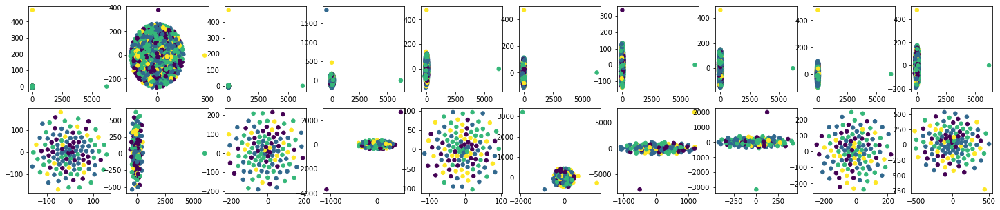

In [ ]:
from sklearn.manifold import TSNE
type = 1
subs_ = 1
eyedee = str(type)  # ID OF THE EXPERIMENT.
o_dim = int(1)      # THE INTERESTED OUTPUTS DIMENSIONALITY
num_blocks_start = int(5)
num_blocks_end   = int(10)
lambda_          = float(0.01)
mid_shape        = int(80)
D                = [0.05]
dropout    = 0.05
learning_rate = 1e-3
epoch_num  = 20
batch_size = 2048
reg_par   = 1e-4
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales_all/grupo_cx_"
folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
path_name = folder_path+f"dmcca_{eyedee}_{lambda_}_{mid_shape}_{D[0]}"
dataset   = "speech"
num_blocks = 10 # numero de folds
wei_cx = list()
Corr_f = list()
# data   = list()
tst_corrs_name =  f'{path_name}/speech_corrs_{subs_}.npy'
if type == 1:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_env_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_env_cx_all.mat")["matriz_selec"]
  stim_data = scipy.io.loadmat(folder_path_+f"/Subject{sub_}_Preprocessed_ENV_EEG3_env_cx_all.mat")["stim"][0]
elif type ==2:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["matriz_selec"]
elif type ==3:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["matriz_selec"]
elif type ==4:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["matriz_selec"]

cv = list()
train_ = list()
val_   = list() # estandar escaler 
test_  = list()

tsne_ = TSNE(n_components=2, init='pca')
kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
# for d_cnt, dropout in enumerate(D):
# block =0
datos_ = np.linspace(1, len(resp_data), num= len(resp_data))
fig,ax = plt.subplots(2,10,figsize=(25,5))
aa, bb = 0,0
folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
y = loadmat(folder_path_2+'clusters_.mat')['clus'].reshape(-1)+1
tsne_ = TSNE(n_components=2, init='pca')
for train_index, test_index in kf.split(resp_data):
  # print("TRAIN:", train_index, "TEST:", test_index)
  
  X_train_, x_test_ = resp_data[train_index], resp_data[test_index]
  X_train = np.zeros((len(X_train_),X_train_[0].shape[0],X_train_[0].shape[1]))
  x_test = np.zeros((len(x_test_),x_test_[0].shape[0],x_test_[0].shape[1]))
  for tr in range(len(X_train_)):
    X_train[tr,:,:] = X_train_[tr]
  for tr in range(len(x_test_)):
    x_test[tr,:,:] = x_test_[tr]
  X_train = np.reshape(X_train,(X_train.shape[0],X_train.shape[1]*X_train.shape[2]))
  x_test = np.reshape(x_test,(x_test.shape[0],x_test.shape[1]*x_test.shape[2]))
  X_train[np.isnan(X_train)]=0
  x_test[np.isnan(x_test)]=0
  
  tsne_train = tsne_.fit_transform(X_train)
  tsne_test  = tsne_.fit_transform(x_test)

  ax[0,aa].scatter(tsne_train[:,0],tsne_train[:,1],s=30,cmap='viridis',c=y[train_index]+1)
  ax[1,bb].scatter(tsne_test[:,0],tsne_test[:,1],s=30,cmap='viridis',c=y[test_index]+1)
  aa += 1
  bb += 1
plt.show()

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.

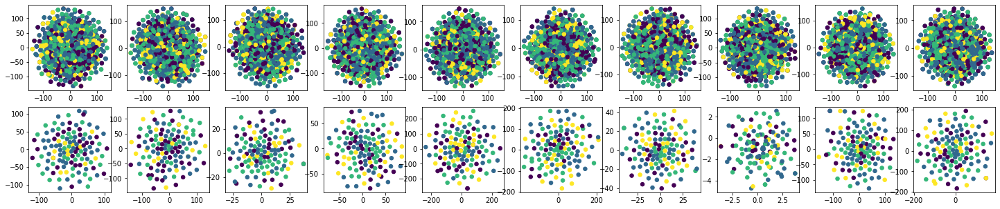

In [ ]:
from sklearn.manifold import TSNE
type = 1
subs_ = 1
eyedee = str(type)  # ID OF THE EXPERIMENT.
o_dim = int(1)      # THE INTERESTED OUTPUTS DIMENSIONALITY
num_blocks_start = int(5)
num_blocks_end   = int(10)
lambda_          = float(0.01)
mid_shape        = int(80)
D                = [0.05]
dropout    = 0.05
learning_rate = 1e-3
epoch_num  = 20
batch_size = 2048
reg_par   = 1e-4
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales_all/grupo_cx_"
folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
path_name = folder_path+f"dmcca_{eyedee}_{lambda_}_{mid_shape}_{D[0]}"
dataset   = "speech"
num_blocks = 10 # numero de folds
wei_cx = list()
Corr_f = list()
# data   = list()
tst_corrs_name =  f'{path_name}/speech_corrs_{subs_}.npy'
if type == 1:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_env_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_env_cx_all.mat")["matriz_selec"]
elif type ==2:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["matriz_selec"]
elif type ==3:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["matriz_selec"]
elif type ==4:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["matriz_selec"]

cv = list()
train_ = list()
val_   = list() # estandar escaler 
test_  = list()

tsne_ = TSNE(n_components=2, init='pca')
kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
# for d_cnt, dropout in enumerate(D):
# block =0
datos_ = np.linspace(1, len(resp_data), num= len(resp_data))
fig,ax = plt.subplots(2,10,figsize=(25,5))
aa, bb = 0,0
for train_index, test_index in kf.split(resp_data):
  # print("TRAIN:", train_index, "TEST:", test_index)
  
  X_train_, x_test_ = datos_fold_[0][train_index,:,:], datos_fold_[0][test_index,:,:]
  X_train = np.zeros((len(X_train_),X_train_[0].shape[0],X_train_[0].shape[1]))
  x_test = np.zeros((len(x_test_),x_test_[0].shape[0],x_test_[0].shape[1]))
  for tr in range(len(X_train_)):
    X_train[tr,:,:] = X_train_[tr]
  for tr in range(len(x_test_)):
    x_test[tr,:,:] = x_test_[tr]
  X_train = np.reshape(X_train,(X_train.shape[0],X_train.shape[1]*X_train.shape[2]))
  x_test = np.reshape(x_test,(x_test.shape[0],x_test.shape[1]*x_test.shape[2]))
  X_train[np.isnan(X_train)]=0
  x_test[np.isnan(x_test)]=0
  
  tsne_train = tsne_.fit_transform(X_train)
  tsne_test  = tsne_.fit_transform(x_test)

  ax[0,aa].scatter(tsne_train[:,0],tsne_train[:,1],s=30,cmap='viridis',c=y[train_index]+1)
  ax[1,bb].scatter(tsne_test[:,0],tsne_test[:,1],s=30,cmap='viridis',c=y[test_index]+1)
  aa += 1
  bb += 1
plt.show()

# Tsne music

/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:986: FutureWarning: The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/manifold/_t_sne.py:793: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.

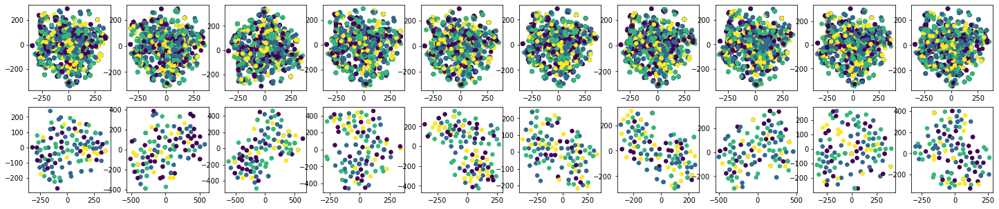

In [ ]:
from sklearn.manifold import TSNE
type = 1
subs_ = 1
sub = 1
eyedee = str(type)  # ID OF THE EXPERIMENT.
o_dim = int(1)      # THE INTERESTED OUTPUTS DIMENSIONALITY
num_blocks_start = int(5)
num_blocks_end   = int(10)
lambda_          = float(0.01)
mid_shape        = int(80)
D                = [0.05]
dropout    = 0.05
learning_rate = 1e-3
epoch_num  = 20
batch_size = 2048
reg_par   = 1e-4
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales_all/grupo_cx_"
folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
path_name = folder_path+f"dmcca_{eyedee}_{lambda_}_{mid_shape}_{D[0]}"
dataset   = "speech"
num_blocks = 10 # numero de folds
wei_cx = list()
Corr_f = list()
# data   = list()
tst_corrs_name =  f'{path_name}/speech_corrs_{subs_}.npy'
  
if type == 1:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_env_cx_all.mat")["resp"][0]
  stim_data = scipy.io.loadmat(folder_path_+f"/Subject{sub}_Preprocessed_ENV_EEG3_env_cx_all.mat")["stim"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_env_cx_all.mat")["matriz_selec"]
elif type ==2:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["matriz_selec"]
  stim_data = scipy.io.loadmat(folder_path_+f"/Subject{sub}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["stim"][0]
elif type ==3:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["matriz_selec"]
  stim_data = scipy.io.loadmat(folder_path_+f"/Subject{sub}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["stim"][0]
elif type ==4:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["matriz_selec"]
  stim_data = scipy.io.loadmat(folder_path_+f"/Subject{sub}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["stim"][0]

cv = list()
train_ = list()
val_   = list() # estandar escaler 
test_  = list()

tsne_ = TSNE(n_components=2, init='pca')
kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
# for d_cnt, dropout in enumerate(D):
# block =0
datos_ = np.linspace(1, len(resp_data), num= len(resp_data))
fig,ax = plt.subplots(2,10,figsize=(25,5))
aa, bb = 0,0
folder_path_2 = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/caracteristicas/"
y = loadmat(folder_path_2+'clusters_.mat')['clus'].reshape(-1)+1
tsne_ = TSNE(n_components=2, init='pca')
for train_index, test_index in kf.split(stim_data):
  # print("TRAIN:", train_index, "TEST:", test_index)
  
  X_train_, x_test_ = stim_data[train_index], stim_data[test_index]
  X_train = np.zeros((len(X_train_),X_train_[0].shape[0],X_train_[0].shape[1]))
  x_test = np.zeros((len(x_test_),x_test_[0].shape[0],x_test_[0].shape[1]))
  for tr in range(len(X_train_)):
    X_train[tr,:,:] = X_train_[tr]
  for tr in range(len(x_test_)):
    x_test[tr,:,:] = x_test_[tr]
  X_train = np.reshape(X_train,(X_train.shape[0],X_train.shape[1]*X_train.shape[2]))
  x_test = np.reshape(x_test,(x_test.shape[0],x_test.shape[1]*x_test.shape[2]))
  X_train[np.isnan(X_train)]=0
  x_test[np.isnan(x_test)]=0
  
  tsne_train = tsne_.fit_transform(X_train)
  tsne_test  = tsne_.fit_transform(x_test)

  ax[0,aa].scatter(tsne_train[:,0],tsne_train[:,1],s=30,cmap='viridis',c=y[train_index]+1)
  ax[1,bb].scatter(tsne_test[:,0],tsne_test[:,1],s=30,cmap='viridis',c=y[test_index]+1)
  aa += 1
  bb += 1
plt.show()

In [ ]:
from sklearn.manifold import TSNE
type = 1
subs_ = 1
eyedee = str(type)  # ID OF THE EXPERIMENT.
o_dim = int(1)      # THE INTERESTED OUTPUTS DIMENSIONALITY
num_blocks_start = int(5)
num_blocks_end   = int(10)
lambda_          = float(0.01)
mid_shape        = int(80)
D                = [0.05]
dropout    = 0.05
learning_rate = 1e-3
epoch_num  = 20
batch_size = 2048
reg_par   = 1e-4
folder_path = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Pruebas_finales_all/grupo_cx_"
folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" # Path to the data folder here
path_name = folder_path+f"dmcca_{eyedee}_{lambda_}_{mid_shape}_{D[0]}"
dataset   = "speech"
num_blocks = 10 # numero de folds
wei_cx = list()
Corr_f = list()
# data   = list()
tst_corrs_name =  f'{path_name}/speech_corrs_{subs_}.npy'
if type == 1:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_env_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_env_cx_all.mat")["matriz_selec"]
elif type ==2:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_RMS_cx_all.mat")["matriz_selec"]
elif type ==3:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_spectralflux_cx_all.mat")["matriz_selec"]
elif type ==4:
  resp_data = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["resp"][0]
  indx = scipy.io.loadmat(folder_path_+f"/Subject{subs_}_Preprocessed_ENV_EEG3_PC1_cx_all.mat")["matriz_selec"]

cv = list()
train_ = list()
val_   = list() # estandar escaler 
test_  = list()

tsne_ = TSNE(n_components=2, init='pca')
kf = RepeatedKFold(n_splits=10, n_repeats=1, random_state=0)
# for d_cnt, dropout in enumerate(D):
# block =0
datos_ = np.linspace(1, len(resp_data), num= len(resp_data))
fig,ax = plt.subplots(2,10,figsize=(25,5))
aa, bb = 0,0
for train_index, test_index in kf.split(resp_data):
  # print("TRAIN:", train_index, "TEST:", test_index)
  
  X_train_, x_test_ = datos_fold_[0][train_index,:,:], datos_fold_[0][test_index,:,:]
  X_train = np.zeros((len(X_train_),X_train_[0].shape[0],X_train_[0].shape[1]))
  x_test = np.zeros((len(x_test_),x_test_[0].shape[0],x_test_[0].shape[1]))
  for tr in range(len(X_train_)):
    X_train[tr,:,:] = X_train_[tr]
  for tr in range(len(x_test_)):
    x_test[tr,:,:] = x_test_[tr]
  X_train = np.reshape(X_train,(X_train.shape[0],X_train.shape[1]*X_train.shape[2]))
  x_test = np.reshape(x_test,(x_test.shape[0],x_test.shape[1]*x_test.shape[2]))
  X_train[np.isnan(X_train)]=0
  x_test[np.isnan(x_test)]=0
  
  tsne_train = tsne_.fit_transform(X_train)
  tsne_test  = tsne_.fit_transform(x_test)

  ax[0,aa].scatter(tsne_train[:,0],tsne_train[:,1],s=30,cmap='viridis',c=y[train_index]+1)
  ax[1,bb].scatter(tsne_test[:,0],tsne_test[:,1],s=30,cmap='viridis',c=y[test_index]+1)
  aa += 1
  bb += 1
plt.show()

# Acoplamiento de fase y amplitud PAC

In [ ]:
import os
import mne
import numpy as np
from numpy import angle, sin, cos, sqrt
# from scipy.io import loadmat
# from mat73 import loadmat
import scipy as sp
from scipy.io import savemat
from scipy.signal import butter, lfilter, welch, hanning, filtfilt, hilbert
import matplotlib.pyplot as plt

In [ ]:
#filtering functions
def butter_bandpass(lowcut, highcut, fs, order=4):
  #lowcut is the lower bound of the frequency that we want to isolate
  #hicut is the upper bound of the frequency that we want to isolate
  #fs is the sampling rate of our data
  nyq = 0.5 * fs #nyquist frequency - see http://www.dspguide.com/ if you want more info
  low = float(lowcut) / nyq
  high = float(highcut) / nyq
  b, a = butter(order, [low, high], btype='band')
  return b, a

##
def butter_bandpass_filter(mydata, lowcut, highcut, fs, order=4):
  b, a = butter_bandpass(lowcut, highcut, fs, order=order)
  y = filtfilt(b, a, mydata)
  return y

# PAC %estimation of phase-amplitude cross-frequency coupling

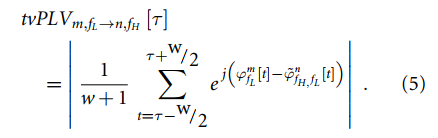

In [ ]:
def moving_multitrial_pac(data1,data2,fr1,fr2,Nsegments,sampling_freq,type):
  #calculating phase of theta
  phase_data = butter_bandpass_filter(data1, fr1[0], fr1[1],(sampling_freq))
  phase_data = angle(hilbert(phase_data))

  #calculating amplitude envelope of high gamma
  amp_data = butter_bandpass_filter(data2, fr2[0], fr2[1], (sampling_freq))
  amp_data = abs(hilbert(amp_data))

  # Filtering the amplitude of analytic signal of the high-frequency range within the
  # frequency range of the low-frequency band
  lowfromhigh = butter_bandpass_filter(amp_data, fr1[0], fr1[1],(sampling_freq))
  
  # lowfromhigh.shape
  low_Env_high_filtered_signals = lowfromhigh-np.tile(np.mean(lowfromhigh),(Ntrials,1))
  
  # get the phase
  Amp_phase_signals=angle(hilbert(low_Env_high_filtered_signals))
  Ntime = data1.shape[1]
  Nstep = np.floor(Ntime/Nsegments)
  if type == 'trials':
    temporal_ = np.zeros((Amp_phase_signals.shape[0],Nsegments))
  else:
    temporal_ = np.zeros((Nsegments))
  for ii in range(Nsegments): # repear over different segments
    start = np.floor((ii)*Nstep).astype(int)
    stop  = np.floor((ii+1)*Nstep).astype(int)
    if type == 'trials':
      plv = np.abs(np.sum(np.exp(1j*(phase_data[:,start:stop]-Amp_phase_signals[:,start:stop])),axis=1)/((Nstep)))
      temporal_[:,ii]=plv
    else:
      plv = np.abs(np.sum(np.sum(np.exp(1j*(phase_data[:,start:stop]-Amp_phase_signals[:,start:stop]))))/(Ntrials*(Nstep)))
      temporal_[ii]=plv
  return temporal_

In [ ]:
# Parameters
# Bands of rytms: delta to gamma.
phase_providing_band = [[1,4],[4,8],[8,10],[10,12],[12,20],[20,30],[30,45]] 
amplitude_providing_band = [[1,4],[4,8],[8,10],[10,12],[12,20],[20,30],[30,45]]
Ntrials   = data_ref[0].shape[0]
Nsegments = 8 # Number of segments in window.
Nchannels = data_ref[0].shape[1]
Nfreqs    = len(phase_providing_band)

In [ ]:
folder_path_ = "/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2" 

In [ ]:
#@title Texto de título predeterminado
temporal_plv = np.zeros((Ntrials,int(Nchannels*(Nchannels-1)/2),Nfreqs,Nfreqs,Nsegments))
# (Nodes,Nodes,Time)
for sub in range(len(Subjects)):
  cont_ch = 0 # contador de las subredes
  for ch1 in range(Nchannels):
    for ch2 in range(ch1+1,Nchannels-1):
      if ch1 != ch2:
        data1     = np.squeeze(data_ref[sub][:,ch1,:])
        data2     = np.squeeze(data_ref[sub][:,ch2,:])
        fr_1 = 0
        for fr1 in phase_providing_band:
          fr_2 = 0
          for fr2 in amplitude_providing_band:
            temporal_plv[:,cont_ch,fr_1,fr_2,:] = moving_multitrial_pac(data1,data2,fr1,fr2,Nsegments,sampling_freq,type='trials')
            fr_2 += 1
          fr_1 += 1
      cont_ch += 1
  print('PLV_pac_music'+str(sub))    
  savemat(folder_path_+'PLV_pac_music'+str(sub)+'_trials.mat',{'temporal_plv':temporal_plv})

PLV_pac_music0


In [ ]:
# PAC 
temporal_plv.shape
# np.transpose(temporal_plv, (0,4,1,2,3,5)).shape

(40, 171, 7, 7, 8)

In [ ]:
sub

In [ ]:
savemat(folder_path_+f'PLV_pac_music'+str(sub)+'_trials.mat',{'temporal_plv':temporal_plv})

# Kgauss

In [ ]:
! pip install bctpy
! pip install mne==0.19
#funciones de Daniel
FILEID = "1DOm75xoSPUbnFfcJBjVggPS0hzNEoWCG"
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O MIfunctions.py && rm -rf /tmp/cookies.txt

FILEID = "1F9WpS7sKSFY73HSHYBgYXw9iyYalBKgh" 
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id='$FILEID -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id="$FILEID -O modCSP.py && rm -rf /tmp/cookies.txt

--2021-12-21 19:38:11--  https://docs.google.com/uc?export=download&confirm=o9&id=1DOm75xoSPUbnFfcJBjVggPS0hzNEoWCG
Resolving docs.google.com (docs.google.com)... 142.250.136.138, 142.250.136.139, 142.250.136.101, ...
Connecting to docs.google.com (docs.google.com)|142.250.136.138|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [text/html]
Saving to: ‘MIfunctions.py’

MIfunctions.py          [ <=>                ]   3.17K  --.-KB/s    in 0.001s  

2021-12-21 19:38:11 (6.19 MB/s) - ‘MIfunctions.py’ saved [3251]

--2021-12-21 19:38:12--  https://docs.google.com/uc?export=download&confirm=46Co&id=1F9WpS7sKSFY73HSHYBgYXw9iyYalBKgh
Resolving docs.google.com (docs.google.com)... 142.250.136.138, 142.250.136.139, 142.250.136.113, ...
Connecting to docs.google.com (docs.google.com)|142.250.136.138|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-14-88-docs.googleusercontent.com/docs/securesc/oas1ur2a61i

In [ ]:
import os, sys
from scipy.io import loadmat
import numpy as np
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.model_selection import ShuffleSplit, cross_val_score
from sklearn.model_selection import train_test_split,GridSearchCV,cross_val_score, cross_val_predict
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, f1_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
import tensorflow as tf
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, f1_score
from sklearn.metrics import r2_score
from sklearn import linear_model
from scipy.stats import linregress
from scipy.stats import spearmanr
from sklearn.base import  BaseEstimator, TransformerMixin, ClassifierMixin
from sklearn.model_selection import StratifiedShuffleSplit
from scipy.signal import butter, filtfilt, lfilter, welch, lfilter_zi, stft
import pandas as pd
from scipy.stats import spearmanr
from sklearn.model_selection import LeaveOneOut
import pickle
from scipy.stats import spearmanr, pearsonr
import MIfunctions 

In [ ]:
# -*- coding: utf-8 -*-
"""
Created on Fri Jul 19 17:39:21 2019

@author:Usage
Here you can get help of any object by pressing Ctrl+I in front of it, either on the Editor or the Console.
 andre
"""
from scipy.signal import butter, lfilter, lfilter_zi, filtfilt #, freqz
import numpy as np
from mne.io import read_raw_edf
#from mne.decoding import CSP
from modCSP import CSP
import matplotlib.pyplot as plt
import pandas as pd
import json as  js #conda install -c jmcmurray json
import warnings
import seaborn as sns
import mne
from numpy import matlib
import matplotlib
import os
from matplotlib.animation import FuncAnimation
from ipywidgets import interact
warnings.filterwarnings("ignore")
Sujetos_giga = {}


#%%
def Read_GIGA_data_fCloud(path_filename,ch,vt,sbj_id):
    #--- info ----------------
    # 2  ---> sample rate 
    # 7  ---> imaginary_left 
    # 8  ---> imaginary_right 
    # 11 ---> imaginary_event 
    # 14 ---> bad_trials 
    # class1: left 
    # class2: right
    #------------------------
    raw     = sio.loadmat(path_filename)
    eeg_raw = raw['eeg']
    sfreq   = np.float(eeg_raw[0][0][2])
    id_MI   = np.where(eeg_raw[0][0][11]==1)
    id_MI   = id_MI[1]
    raw_c1  = []
    raw_c2  = []
    y_c1    = []
    y_c2    = []
    for i in range(len(id_MI)):
        l_thr = id_MI[i]-(sfreq*2-1) 
        h_thr = id_MI[i]+(sfreq*5)
        tmp_c1 = eeg_raw[0][0][7][ch,np.int(l_thr):np.int(h_thr)]
        tmp_c2 = eeg_raw[0][0][8][ch,np.int(l_thr):np.int(h_thr)]
        raw_c1.append(tmp_c1[:,np.int(vt[0]*sfreq):np.int(vt[1]*sfreq)])
        raw_c2.append(tmp_c2[:,np.int(vt[0]*sfreq):np.int(vt[1]*sfreq)])
        y_c1.append(1.0)
        y_c2.append(2.0)    
    # remove bad trials
    id_bad_tr_voltage_c1 = eeg_raw[0][0][14][0][0][0][0][0]
    id_bad_tr_voltage_c2 = eeg_raw[0][0][14][0][0][0][0][1]   
    id_bad_tr_mi_c1      = eeg_raw[0][0][14][0][0][1][0][0]
    id_bad_tr_mi_c2      = eeg_raw[0][0][14][0][0][1][0][1]
    ref_axis_c1          = 1
    ref_axis_c2          = 1    
    if id_bad_tr_mi_c1.shape[0]>id_bad_tr_mi_c1.shape[1]:
        id_bad_tr_mi_c1 = id_bad_tr_mi_c1.T
    if id_bad_tr_mi_c2.shape[0]>id_bad_tr_mi_c2.shape[1]:
        id_bad_tr_mi_c2 = id_bad_tr_mi_c2.T
    if id_bad_tr_voltage_c1.shape[1] == 0:
        id_bad_tr_voltage_c1 = np.reshape(id_bad_tr_voltage_c1, (id_bad_tr_voltage_c1.shape[0], id_bad_tr_mi_c1.shape[1]))
    if id_bad_tr_voltage_c2.shape[1] == 0:
        id_bad_tr_voltage_c2 = np.reshape(id_bad_tr_voltage_c2, (id_bad_tr_voltage_c2.shape[0], id_bad_tr_mi_c2.shape[1])) 
    if (id_bad_tr_voltage_c1.shape[1] > id_bad_tr_mi_c1.shape[1]):
        if id_bad_tr_mi_c1.shape[0] == 0:
            id_bad_tr_mi_c1 = np.reshape(id_bad_tr_mi_c1, (id_bad_tr_mi_c1.shape[0],id_bad_tr_voltage_c1.shape[1]))
            ref_axis_c1     = 0
    if (id_bad_tr_voltage_c2.shape[1] > id_bad_tr_mi_c2.shape[1]):
        if id_bad_tr_mi_c2.shape[0] == 0:
            id_bad_tr_mi_c2 = np.reshape(id_bad_tr_mi_c2, (id_bad_tr_mi_c2.shape[0],id_bad_tr_voltage_c2.shape[1]))
            ref_axis_c2     = 0
    if (id_bad_tr_mi_c1.shape[0] > id_bad_tr_voltage_c1.shape[0]):
        ref_axis_c1 = 0
    if (id_bad_tr_mi_c2.shape[0] > id_bad_tr_voltage_c2.shape[0]):
        ref_axis_c2 = 0
    if (id_bad_tr_voltage_c1.shape[0] > id_bad_tr_mi_c1.shape[0]):
        ref_axis_c1 = 0
    if (id_bad_tr_voltage_c2.shape[0] > id_bad_tr_mi_c2.shape[0]):
        ref_axis_c2 = 0    
    id_bad_tr_c1 = np.concatenate((id_bad_tr_voltage_c1,id_bad_tr_mi_c1),axis=ref_axis_c1)
    id_bad_tr_c1 = id_bad_tr_c1.ravel()-1
    for ele in sorted(id_bad_tr_c1, reverse = True):  
        del raw_c1[ele]
        del y_c1[ele]
    id_bad_tr_c2 = np.concatenate((id_bad_tr_voltage_c2,id_bad_tr_mi_c2),axis=ref_axis_c2)
    id_bad_tr_c2= id_bad_tr_c2.ravel()-1
    for ele in sorted(id_bad_tr_c2, reverse = True):  
        del raw_c2[ele]
        del y_c2[ele]     
    Xraw = np.array(raw_c1 + raw_c2)
    y    = np.array(y_c1 + y_c2)  
    return Xraw, y, sfreq
#%%
def leer_bci42a_train_full(path_filename,clases,Ch,vt):
    
    raw = read_raw_edf(path_filename,preload=False)
    sfreq=raw.info['sfreq']
    
    #raw.save('tempraw.fif',overwrite=True)#, tmin=3, tmax=5,overwrite = True)
    #rawo = mne.io.read_raw_fif('tempraw.fif', preload=True)  # load data  
    # depurar canales
    #rawo.plot()
    
    #clases_b = [769,770,771,772] #codigo clases
    i_muestras_   = raw._raw_extras[0]['events'][1]           # Indices de las actividades.
    i_clases_ = raw._raw_extras[0]['events'][2]           # Marcadores de las actividades.
    
    remov   = np.ndarray.tolist(i_clases_)                 # Quitar artefactos.
    Trials_eli = 1023                                   # Elimina los trials con artefactos.
    m       = np.array([i for i,x in enumerate(remov) if x==Trials_eli])   # Identifica en donde se encuentra los artefactos.
    m_      = m+1
    tt      = np.array(raw._raw_extras[0]['events'][0]*[1],dtype=bool)
    tt[m]   = False
    tt[m_]  = False
    i_muestras = i_muestras_[tt] # indices en muestra del inicio estimulo -> tomar 2 seg antes y 5 seg despues
    i_clases = i_clases_[tt] # tipo de clase
    
    #i_muestras = i_muestras_ # indices en muestra del inicio estimulo -> tomar 2 seg antes y 5 seg despues
    #i_clases = i_clases_ # tipo de clase
    
    
    #eli = 1023 
    #ind = i_clases_ != eli
    #i_clases = i_clases_[ind]
    #i_muestras = i_muestras_[ind]
    ni = np.zeros(len(clases))
    for i in range(len(clases)):
        ni[i] = np.sum(i_clases == clases[i]) #izquierda
    
    Xraw = np.zeros((int(np.sum(ni)),len(Ch),int(sfreq*(vt[1]+vt[0]))))
    y = np.zeros(int(np.sum(ni)))
    ii = 0
    for i in range(len(clases)):
        for j in range(len(i_clases)):
            if i_clases[j] == clases[i]:
                rc = raw[:,int(i_muestras[j]-vt[0]*sfreq):int(i_muestras[j]+vt[1]*sfreq)][0]
                rc = rc - np.mean(rc)
                Xraw[ii,:,:] = rc[Ch,:]
                y[ii] = int(i+1)
                ii += 1
    
    return i_muestras, i_clases, raw, Xraw, y, ni, m

#%%
def leer_bci42a_test_full(path_filename,clases,Ch,vt):
    
    raw = read_raw_edf(path_filename,preload=False)
    sfreq=raw.info['sfreq']
    
    #raw.save('tempraw.fif',overwrite=True)#, tmin=3, tmax=5,overwrite = True)
    #rawo = mne.io.read_raw_fif('tempraw.fif', preload=True)  # load data  
    # depurar canales
    #rawo.plot()
    
    #clases_b = [769,770,771,772] #codigo clases
    i_muestras_   = raw._raw_extras[0]['events'][1]           # Indices de las actividades.
    i_clases_ = raw._raw_extras[0]['events'][2]           # Marcadores de las actividades.
    
    #remov   = np.ndarray.tolist(i_clases_)                 # Quitar artefactos.
#    Trials_eli = 1023                                   # Elimina los trials con artefactos.
#    m       = np.array([i for i,x in enumerate(remov) if x==Trials_eli])   # Identifica en donde se encuentra los artefactos.
#    m_      = m+1
#    tt      = np.array(raw._raw_extras[0]['events'][0]*[1],dtype=bool)
#    tt[m]   = False
#    tt[m_]  = False
#    i_muestras = i_muestras_[tt] # indices en muestra del inicio estimulo -> tomar 2 seg antes y 5 seg despues
#    i_clases = i_clases_[tt] # tipo de clase
#    
    i_muestras = i_muestras_ # indices en muestra del inicio estimulo -> tomar 2 seg antes y 5 seg despues
    i_clases = i_clases_ # tipo de clase
    
    
    ni = np.zeros(len(clases))
    for i in range(len(clases)):
        ni[i] = np.sum(i_clases == clases[i]) #izquierda
    
    Xraw = np.zeros((int(np.sum(ni)),len(Ch),int(sfreq*(vt[1]+vt[0]))))
    #y = np.zeros(int(np.sum(ni)))
    ii = 0
    for i in range(len(clases)):
        for j in range(len(i_clases)):
            if i_clases[j] == clases[i]:
                rc = raw[:,int(i_muestras[j]-vt[0]*sfreq):int(i_muestras[j]+vt[1]*sfreq)][0]
                rc = rc - np.mean(rc)
                Xraw[ii,:,:] = rc[Ch,:]
                #y[ii] = int(clases[i])
                ii += 1
    
    return i_muestras, i_clases, raw, Xraw

#%% Filters

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    b, a = butter(order, [low, high], btype='band')
    return b, a
def butter_bandpass_filter(data, lowcut, highcut, fs, order=5):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    y = filtfilt(b,a,data)#lfilter(b, a, data)
    return y

#%% Bank filter
def bank_filter_epochsEEG(Xraw, fs, f_frec): #Xraw[nepochs,nchannels]
    nf,ff = f_frec.shape
    epochs,channels,T = Xraw.shape
    Xraw_f = np.zeros((epochs,channels,T,nf))
    for f in range(nf):
        lfc = f_frec[f,0]
        hfc = f_frec[f,1]
        b,a = butter_bandpass(lfc, hfc, fs)
        zi = lfilter_zi(b, a)
        Xraw_f[:,:,:,f] = filtfilt(b,a,Xraw,axis=2)
        #for n in range(epochs):
        #    for c in range(channels):
                #print(c)
        #        zi = lfilter_zi(b, a)
        #        Xraw_f[n,c,:,f] = lfilter(b, a, Xraw[n,c,:],zi = zi*Xraw[n,c,0])[0]
                #Xraw_f[n,c,:,f] = lfilter(b, a, Xraw[n,c,:])
    return Xraw_f

#%% CSP epochs
def CSP_epochsEEG(Xraw, y, ncomp): #Xraw[nepochs,nchannels]
    
    csp = CSP(n_components=ncomp, reg='empirical', log=True, norm_trace=False) 
    epochs,channels,T,nf = Xraw.shape
    Xcsp = np.zeros((epochs,ncomp,nf))
    csp_l = []
    for f in range(nf):
        
        csp_l.append(csp.fit(Xraw[:,:,:,f],y))
        Xcsp[:,:,f] = csp_l[f].transform(Xraw[:,:,:,f])
    
    return csp_l, Xcsp

#%% CSP custom sklearn

#from sklearn.metrics import pairwise_distances  
#from scipy.spatial.distance import squareform 


from sklearn.base import  BaseEstimator, TransformerMixin
class CSP_epochs_filter_extractor(TransformerMixin,BaseEstimator):
    def __init__(self, fs,f_frec=[4,30], ncomp=4,reg='empirical',PCov=False):
        self.reg = reg
        self.fs = fs
        self.PCov=PCov
        self.f_frec = f_frec
        self.ncomp = ncomp
        
    def _averagingEEG(self,X):
        epochs,channels,T = X.shape
        Xc = np.zeros((epochs,channels,T))
        for i in range(epochs):
            Xc[i,:,:] = X[i,:,:] - np.mean(X[i,:,:])
        return Xc    
        
    def _bank_filter_epochsEEG(self,X):
        nf,ff = self.f_frec.shape
        epochs,channels,T = X.shape
        X_f = np.zeros((epochs,channels,T,nf))
        for f in range(nf):
            lfc = self.f_frec[f,0]
            hfc = self.f_frec[f,1]
            b,a = butter_bandpass(lfc, hfc, self.fs)
            X_f[:,:,:,f] = filtfilt(b,a,X,axis=2)
        return X_f  
    def _CSP_epochsEEG(self,Xraw, y,*_):
        ncomp = self.ncomp
        mne.set_log_level('WARNING')
        if self.PCov==True:
            epochs,P,nf = Xraw.shape
            channels = int((1+np.sqrt(1+8*P))/2)
        else:  
            epochs,channels,T,nf = Xraw.shape
        Xcsp = np.zeros((epochs,self.ncomp,nf))
        self.filters  =np.zeros((self.ncomp,channels,nf))
        csp_l = []
        for f in range(nf):
            if self.PCov == True:
                csp_l+= [CSP(n_components=ncomp, reg=self.reg, log=True,transform_into='average_power',PCov = self.PCov).fit(Xraw[:,:,f],y)]
                Xcsp[:,:,f] = csp_l[f].transform(Xraw[:,:,f])
            else:
                csp_l+= [CSP(n_components=ncomp, reg=self.reg, log=True,transform_into='average_power',PCov = self.PCov).fit(Xraw[:,:,:,f],y)]
                Xcsp[:,:,f] = csp_l[f].transform(Xraw[:,:,:,f])
            self.filters[:,:,f] = csp_l[f].filters_[:self.ncomp]
        return csp_l, Xcsp

    def fit(self,Xraw,y, *_):
        if self.PCov == True:
            self.csp_l, self.Xcsp = self._CSP_epochsEEG(Xraw, y)
        else:
            Xraw = self._averagingEEG(Xraw)
            self.csp_l, self.Xcsp = self._CSP_epochsEEG(self._bank_filter_epochsEEG(Xraw), y)
        return self    

    
    def transform(self, Xraw, *_):
        if self.PCov == False:
            Xraw = self._averagingEEG(Xraw)
            Xraw = self._bank_filter_epochsEEG(Xraw)
            epochs,channels,T,nf = Xraw.shape
        else:
            #Xwtmpha = tfr_array_morlet(Xraw,sfreq=self.fs,freqs=np.mean(self.f_frec,axis=1),n_cycles=self.n_cycles,output="phase")
            epochs,P,nf  = Xraw.shape
            #epochs,channels,nf,T = Xwtmpha.shape
        ncomp = self.ncomp    
        result = np.zeros((epochs,ncomp,nf))   
        for f in range(nf):
            #if self.PCov == 'kernel':
            #    Cov = np.zeros((epochs,channels,channels))
                #for epoch in range(epochs):
                #Cov[epoch,:,:] = self.Kg(Xraw_f[epoch,:,:,f]) 
            #    Cov = np.array(Parallel(n_jobs=-1)(delayed(self.Kg)(Xraw_f[n,:,:,f]) for n in range(epochs))) 
            #    result[:,:,f] =  self.csp_l[f].transform(Cov)
            #elif self.PCov == 'PLV':
            #    Cov = np.array(Parallel(n_jobs=-1)(delayed(self.plv_phase_distance)(Xwtmpha[:,:,f,:],n) for n in range(epochs)))
            #    result[:,:,f] =  self.csp_l[f].transform(Cov)
            if self.PCov == True:
                result[:,:,f] =  self.csp_l[f].transform(Xraw[:,:,f]) 
            else:
                result[:,:,f] =  self.csp_l[f].transform(Xraw[:,:,:,f]) 
        result = result.reshape(np.size(result,0),-1)  
        return result 

def eeg_nor(Xraw,sca=1e5): #Xraw[epochs,ch,T]
    epochs,chs,T = Xraw.shape
    Xrawp = np.zeros((epochs,chs,T))
    for ep in range(epochs):
        for c in range(chs):
            Xrawp[ep,:,:] = sca*(Xraw[ep,:,:] - Xraw[ep,:,:].mean(axis=0))
    return Xrawp

def plot_eeg(data,sample_rate,channels_names,sca=0.75): #data[channels, samples]
    #  Como se conoce la frecuencia de muestreo es posible recuperar el vector del tiempo
    time = np.linspace(0, data.shape[1] / sample_rate, data.shape[1])

    fig = plt.gcf()#plt.figure(figsize=(16, 9), dpi=90)
    sumf = sca*np.max(sca*(data-matlib.repmat(data.mean(axis=1).reshape(-1,1),1,data.shape[1])))
     # Se reemplazan los valores numéricos del eje Y por los nombres de los canales
    plt.yticks(np.arange(0, sumf*len(channels_names),sumf),channels_names)
    color = sns.color_palette('husl',n_colors=data.shape[0])
    # Como los datos están en vertical (columnas) se reorientan con la transpuesta para poder visualizar los canales
    for i in range(data.shape[0]):  # se ignora la última columna
        # Para que no queden los canales sobrepuestos, antes de graficar se centra y se le suma un entero para desplazarlo ligeramente hacia arriba.
        plt.plot(time, (data[i,:] - data[i,:].mean()) + sumf*i,color=color[i])
    return


def plot_confusion_matrix_MS(cm_m, cm_s, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):

    
    fig, ax = plt.subplots()
    im = ax.imshow(cm_m, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm_m.shape[1]),
           yticks=np.arange(cm_m.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.1f' if normalize else 'd'
    thresh = cm_m.max() / 2.
    for i in range(cm_m.shape[0]):
        for j in range(cm_m.shape[1]):
            s = format(cm_m[i, j],'.1f') + "$\pm$" + format(cm_s[i, j],'.1f')
            ax.text(j, i, s,ha="center", va="center",
                    color="white" if cm_m[i, j] > thresh else "black",fontsize=12)
    fig.tight_layout()
    return ax

#%%

class Window_band_CSP_eppoch(TransformerMixin,BaseEstimator):
    def __init__(self,fs,vtw=[2.5,4.5],f_frec=[4,40],ncomp=6,reg='empirical',PCov=False):
        self.fs=fs
        self.ncomp=ncomp
        self.PCov=PCov
        self.vtw=vtw
        self.f_frec=f_frec
        self.reg=reg

    def fit_CSP_Xraw_time_samples(self,Xraw,y,vtw,fs,f_frec,ncomp):
        self.csp_c = [None]*len(vtw)
        self.filters = [None]*len(vtw)
        for i in range(len(vtw)):
            if self.PCov == False:
                X = Xraw[:,:,int(vtw[i][0]*fs):int(vtw[i][1]*fs)]
            else:
                X = Xraw[:,:,i,:]
            self.csp_c[i] = CSP_epochs_filter_extractor(fs=fs,f_frec=f_frec,ncomp=ncomp,reg=self.reg,PCov=self.PCov)
            self.csp_c[i].fit(X,y)
            self.filters[i] = self.csp_c[i].filters

    def fit(self,Xraw,y,*_):
        if self.PCov == True:
            Xraw = Xraw.reshape((len(Xraw),-1,len(self.vtw),len(self.f_frec)))
        self.fit_CSP_Xraw_time_samples(Xraw,y,self.vtw,self.fs,self.f_frec,self.ncomp) 
        return self  
    
    def transform(self, Xraw, *_):
        Xf = [None]*len(self.csp_c)
        if self.PCov == True:
            Xraw = Xraw.reshape((len(Xraw),-1,len(self.vtw),len(self.f_frec)))
        for i in range(len(self.csp_c)):
            if self.PCov == False:
                X = Xraw[:,:,int(self.vtw[i][0]*self.fs):int(self.vtw[i][1]*self.fs)]
            else: 
                X = Xraw[:,:,i,:]
            Xf[i] = self.csp_c[i].transform(X)
        return Xf #
    #def fit_transform(self,Xraw,y,*_):
    #    self.fit(Xraw,y)
    #    return self.transform(Xraw)
#%%
class Window_band_MM_eppoch(TransformerMixin,BaseEstimator):
    def __init__(self,fs,vtw=[[0,2],[2,4]],f_frec=np.array([[8,30]])):
        self.fs=fs
        self.vtw=vtw
        self.f_frec=f_frec
    def fit(self,Xraw,y,*_):
        pass 
    def transform(self, Xraw, *_):
        Xfil = bank_filter_epochsEEG(Xraw,self.fs,self.f_frec)
        for i in range(len(self.vtw)):
            Xfil_r = Xfil[:,:,int(self.fs*self.vtw[i][0]):int(self.fs*self.vtw[i][1]),:]
            Xm =np.zeros((Xfil_r.shape[0],Xfil_r.shape[1],len(self.vtw),len(self.f_frec),5))
            for band in range(len(self.f_frec)):
                Xm[:,:,i,band,0]=Xfil_r[:,:,:,band].mean(axis=-1)
                Xm[:,:,i,band,1]=Xfil_r[:,:,:,band].var(axis=-1)
                Xm[:,:,i,band,2]=Xfil_r[:,:,:,band].max(axis=-1)
                Xm[:,:,i,band,3]=Xfil_r[:,:,:,band].min(axis=-1)
                Xm[:,:,i,band,4]=np.median(Xfil_r[:,:,:,band],axis=-1)
            Xm = Xm.reshape((Xfil_r.shape[0],-1))
        return Xm
    def fit_transform(self,Xraw,y,*_):
        self.transform(Xraw,y)
        return self.transform(Xraw)
#%%
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lasso
from sklearn.base import  BaseEstimator, TransformerMixin
from sklearn.preprocessing import OneHotEncoder

class elastic_net_feats(TransformerMixin,BaseEstimator):
  def __init__(self,alpha=0,l1_ratio=0):
    self.alpha=alpha
    self.l1_ratio=l1_ratio
  def fit(self,X,y,*_):
    self.elatic = ElasticNet(alpha=self.alpha,l1_ratio=self.l1_ratio,random_state=0)
    #if len(np.unique(y))>2:
    mlb = OneHotEncoder()
    y=mlb.fit_transform(y.reshape((-1,1))).toarray()
    self.elatic.fit(X,y)
  def transform(self,X,*_):
    if len(self.elatic.coef_.shape)>1:
        Xr = np.dot(X,self.elatic.coef_.T)
    else:
        Xr = np.dot(X,self.elatic.coef_)
        Xr = Xr.reshape((-1,1))
    return Xr
  def fit_transform(self,X,y,*_):
    self.fit(X,y)
    return self.transform(X)

class Lasso_feats(TransformerMixin,BaseEstimator):
  def __init__(self,alpha=0):
    self.alpha=alpha
  def fit(self,X,y,*_):
    self.lasso = Lasso(alpha=self.alpha)
    self.lasso.fit(X,y)
  def transform(self,X,*_):
    Xr = X[:,np.abs(self.lasso.coef_)> 0]
    return Xr
  def fit_transform(self,X,y,*_):
    self.fit(X,y)
    return self.transform(X)
from numpy import swapaxes
class flatt(TransformerMixin,BaseEstimator):
    def __init__(self,axis=0):
        self.axis=axis
    def fit(self,X,*_):
        for i in range(len(X)):
            if i==0:
                Xx = X[i]
            else:
                Xx = np.concatenate((Xx,X[i]),axis=1)  
            if self.axis==1:
                Xx = Xx.T
        return Xx 
    def transform(self,X,*_):
        for i in range(len(X)):
            if i==0:
                Xx = X[i]
            else:
                Xx = np.concatenate((Xx,X[i]),axis=1)  
            if self.axis==1:
                Xx = Xx.T
        return Xx 
    def fit_transform(self,X,*_):
        for i in range(len(X)):
            if i==0:
                Xx = X[i]
            else:
                Xx = np.concatenate((Xx,X[i]),axis=1)  
            if self.axis==1:
                Xx = Xx.T
        return Xx

class Swapax_csp(TransformerMixin,BaseEstimator):
    def __init__(self,vtw,f_frec):
        self.vtw=vtw
        self.f_frec=f_frec
    def fit(self,X,*_):
        newkl = X.reshape((len(X),len(self.vtw),-1,len(self.f_frec)))
        newkl =np.swapaxes(newkl,1,2)
        return  newkl.reshape((len(X),-1))
    def transform(self,X,*_):
        newkl = X.reshape((len(X),len(self.vtw),-1,len(self.f_frec)))
        newkl =np.swapaxes(newkl,1,2)
        return  newkl.reshape((len(X),-1))
    def fit_transform(self,X,*_):
        newkl = X.reshape((len(X),len(self.vtw),-1,len(self.f_frec)))
        newkl =np.swapaxes(newkl,1,2)
        return  newkl.reshape((len(X),-1))

class Swapax(TransformerMixin,BaseEstimator):
    def __init__(self,col1=0,col2=1):
        self.col1 = col1
        self.col2 = col2
    def fit(self,X,y,*_):
        Xr = swapaxes(X,self.col1,self.col2)
        return Xr
    def transform(self,X,*_):
        Xr = swapaxes(X,self.col1,self.col2)
        return Xr
    def fit_transform(self,X,y,*_):
        Xr = swapaxes(X,self.col1,self.col2)
        return Xr 

class concat(TransformerMixin,BaseEstimator):
    def __init__(self,col1=0):
        self.col1 = col1
    def fit(self,X,y,*_):
        Xr = np.reshape(X,(np.shape(X)[0],-1))
        return Xr
    def transform(self,X,*_):
        Xr = np.reshape(X,(np.shape(X)[0],-1))
        return Xr
    def fit_transform(self,X,y,*_):
        Xr = np.reshape(X,(np.shape(X)[0],-1))
        return Xr     

class selectCSPwin_freq(TransformerMixin,BaseEstimator):
    def __init__(self,windows,freqs,f_frec):
        self.windows = windows
        self.freqs = freqs
        self.f_frec=f_frec
    def fit(self,X,y,*_):
        Xr=[]
        Wind,ind_inv = np.unique(self.windows,return_inverse=True)
        for ix in range(len(Wind)):
            tmp = X[Wind[ix]]
            tmp = tmp.reshape((tmp.shape[0],-1,len(self.f_frec)))
            Xr.append(tmp[:,:,self.freqs[ind_inv==ix]].reshape((tmp.shape[0],-1)))
        return Xr
    def transform(self,X,*_):
        Xr=[]
        Wind,ind_inv = np.unique(self.windows,return_inverse=True)
        for ix in range(len(Wind)):
            tmp = X[Wind[ix]]
            tmp = tmp.reshape((tmp.shape[0],-1,len(self.f_frec)))
            Xr.append(tmp[:,:,self.freqs[ind_inv==ix]].reshape((tmp.shape[0],-1)))
        return Xr
    def fit_transform(self,X,y,*_):
        Xr=[]
        Wind,ind_inv = np.unique(self.windows,return_inverse=True)
        for ix in range(len(Wind)):
            tmp = X[Wind[ix]]
            tmp = tmp.reshape((tmp.shape[0],-1,len(self.f_frec)))
            Xr.append(tmp[:,:,self.freqs[ind_inv==ix]].reshape((tmp.shape[0],-1)))
        return Xr  

#%%
from sklearn.decomposition import KernelPCA
from scipy.spatial.distance import squareform
from sklearn.metrics import pairwise_distances
import time
class Cov_epochs_filter_extractor(TransformerMixin,BaseEstimator):
    def __init__(self, fs,f_frec=[4,30],gamma=1,Normalize=False,alpha=1,eta=1):
        self.gamma = gamma
        self.fs = fs
        self.alpha=alpha
        self.eta=eta
        self.f_frec = f_frec
        self.Normalize = Normalize
        
    def _averagingEEG(self,X):
        epochs,channels,T = X.shape
        Xc = np.zeros((epochs,channels,T))
        for i in range(epochs):
            Xc[i,:,:] = X[i,:,:] - X[i,:,:].mean(axis=0)
        return Xc    
        
    def _bank_filter_epochsEEG(self,X):
        nf,ff = self.f_frec.shape
        epochs,channels,T = X.shape
        X_f = np.zeros((epochs,channels,T,nf))
        for f in range(nf):
            lfc = self.f_frec[f,0]
            hfc = self.f_frec[f,1]
            b,a = butter_bandpass(lfc, hfc, self.fs)
            X_f[:,:,:,f] = filtfilt(b,a,X,axis=2)
        return X_f    

    def _cov_epochsEEG(self,Xraw,*_):
        mne.set_log_level('WARNING')
        epochs,channels,T,nf = Xraw.shape
        #Xcov = np.zeros((epochs,int(channels*(channels-1)/2),nf))
        Xcov = np.zeros((epochs,int(channels*self.alpha),nf))
        self.epochs = epochs
        self.channels  = channels
        for f in range(nf):
            for i in  range(epochs):
                #C = pairwise_distances(Xraw[i,:,:,f],Xraw[i,:,:,f])
                #C = (C+C.T)/2 # ensure symmetry matrix
                #C = C-np.diag(np.diag(C))
                #np.corrcoef(Xraw[i,:,:,f])#Xraw[i,:,:,f].dot(Xraw[i,:,:,f].T) 
                #gamma0 = 1/np.median(squareform(C)**2)
                #C = np.exp(-.5*self.gamma*gamma0*(C**2))
                kpca = KernelPCA(n_components=self.alpha,kernel='rbf',gamma=self.eta)
                C = kpca.fit_transform(Xraw[i,:,:,f])
                #w ,v = np.linalg.eig(C)
                #indx = np.argsort(w)
                #w = w[indx]
                #v = v[:,indx]
                #cus = np.cumsum(w)/np.sum(w)<self.eta
                #C = v[:,cus].dot(np.diag(w[cus])).dot(v[:,cus].T)
                #C = (C+C.T)/2 # ensure symmetry matrix
                #C = C.dot(v[:,cus]).dot(np.diag(w[cus]))
                #Xcov[i,:,f] = squareform(C-np.diag(np.diag(C)))
                Xcov[i,:,f] = C.ravel()
        return Xcov.reshape(epochs,-1)
    
    def _cov_vec2mat(self,Xv):
        return Xv.reshape(self.epochs,int(self.channels*(self.channels-1)/2),len(self.f_frec))

    def fit(self,Xraw,y, *_):
        if self.Normalize==True:
            Xraw = self._averagingEEG(Xraw)
        Xraw_f = self._bank_filter_epochsEEG(Xraw)
        self.Xcov_v = self._cov_epochsEEG(Xraw_f)
        return self    
    
    def transform(self, Xraw, *_):
        if self.Normalize==True:
            Xraw = self._averagingEEG(Xraw)
        Xraw_f = self._bank_filter_epochsEEG(Xraw)
        return self._cov_epochsEEG(Xraw_f)
#%%
class Concat_epochs_filter_extractor(TransformerMixin,BaseEstimator):
    def __init__(self, fs,f_frec=[4,30],Normalize=False,StaditicFeatures=False):
        self.fs = fs
        self.f_frec = f_frec
        self.Normalize = Normalize
        self.StaditicFeatures = StaditicFeatures
        
    def _averagingEEG(self,X):
        epochs,channels,T = X.shape
        Xc = np.zeros((epochs,channels,T))
        for i in range(epochs):
            Xc[i,:,:] = X[i,:,:] - X[i,:,:].mean(axis=0)
        return Xc    
        
    def _bank_filter_epochsEEG(self,X):
        nf,ff = self.f_frec.shape
        epochs,channels,T = X.shape
        X_f = np.zeros((epochs,channels,T,nf))
        for f in range(nf):
            lfc = self.f_frec[f,0]
            hfc = self.f_frec[f,1]
            b,a = butter_bandpass(lfc, hfc, self.fs)
            X_f[:,:,:,f] = filtfilt(b,a,X,axis=2)
        return X_f    

    def _cov_epochsEEG(self,Xraw,*_):
        mne.set_log_level('WARNING')
        epochs,channels,T,nf = Xraw.shape
        self.epochs = epochs
        self.channels  = channels
        if self.StaditicFeatures == False:
            return Xraw.reshape((epochs,-1))
        else:
            Xst = np.zeros((epochs,channels,5,nf))
            for f in range(nf):
                for i in  range(epochs):
                    for c in range(channels):
                        Xst[i,c,0,f] = np.mean(Xraw[i,c,:,f])
                        Xst[i,c,1,f] = np.std(Xraw[i,c,:,f])
                        Xst[i,c,2,f] = np.min(Xraw[i,c,:,f])
                        Xst[i,c,3,f] = np.max(Xraw[i,c,:,f])
                        Xst[i,c,4,f] = np.median(Xraw[i,c,:,f])
            return Xst.reshape((epochs,-1))
    
    def fit(self,Xraw,y, *_):
        if self.Normalize==True:
            Xraw = self._averagingEEG(Xraw)
        Xraw_f = self._bank_filter_epochsEEG(Xraw)
        return self    
    
    def transform(self, Xraw, *_):
        if self.Normalize==True:
            Xraw = self._averagingEEG(Xraw)
        Xraw_f = self._bank_filter_epochsEEG(Xraw)
        return self._cov_epochsEEG(Xraw_f)

'''
def rho_topoplot(rho,info,channels_names,show_names=False,countours=0, cmap='jet',ax =None,fig=None,sca=1,colorbar=True,vmin=0,vmax=1):
    
    if ax == None: ax = plt.gca()
    if fig == None: fig = plt.gcf()
    rhoc = sca*rho
    if colorbar:
        cax = fig.add_axes([0.95, 0.15, 0.05, 0.75])
        norm = matplotlib.colors.Normalize(vmin=vmin,vmax=vmax)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
        sm.set_array([])
        plt.colorbar(sm,cax=cax)
    mne.viz.plot_topomap(rhoc,info, names=channels_names, 
                          show_names=show_names,contours=0,cmap=cmap,axes=ax,vmin=vmin,vmax=vmax,res=128)
    return

'''
from sklearn.metrics import pairwise_distances  
from scipy.spatial.distance import squareform 
from mne.viz import plot_topomap
from scipy.stats import kurtosis
import pywt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import periodogram, welch
from scipy.stats import spearmanr
import matplotlib.colors as colors
import matplotlib.cm as cmx
from mne.time_frequency import tfr_array_morlet, csd_array_morlet, csd_array_fourier
from joblib import Parallel, delayed
from scipy.stats import kendalltau
from mne.viz.topomap import _check_outlines, _draw_outlines
from mne.viz.utils import plt_show,tight_layout
from mne.io.pick import _picks_to_idx
import itertools
import numpy as np
import itertools
from sklearn.base import  BaseEstimator, TransformerMixin
from scipy.signal import butter, lfilter, lfilter_zi, filtfilt #, freqz
from joblib import Parallel, delayed
import numpy as np
import itertools
from sklearn.base import  BaseEstimator, TransformerMixin
from scipy.signal import butter, lfilter, lfilter_zi, filtfilt #, freqz
from joblib import Parallel, delayed
from itertools import islice
from scipy.spatial.distance import cdist
from itertools import permutations
import math
from scipy import special
class FB_feats(TransformerMixin,BaseEstimator):
    def __init__(self, fs=250,f_frec=np.array([[8,12],[12,30]]),vtw=np.array([[2.5,4.5],[3,5]]),gammad=1,
                feat='kcon',ncomp = 6,method='fft',normalize=True,n_cycles=7.0,motifs_transform=False,stride=1,
                     points=3,minus_resting=False,over_connexions=False,leg_order=10,m=4,
                     smoothing=1e-5,laplacian_montage=mne.channels.read_montage('standard_1005'),
                     channels_names=None):
        self.vtw = vtw
        self.fs = fs
        self.f_frec = f_frec
        self.gammad = gammad
        self.feat = feat
        self.method = method
        self.normalize = normalize
        self.ncomp = ncomp
        self.n_cycles = n_cycles
        self.motifs_transform=motifs_transform
        self.stride=stride
        self.points=points
        self.minus_resting=minus_resting
        self.over_connexions=over_connexions
        self.leg_order=leg_order
        self.laplacian_montage=laplacian_montage
        self.smoothing = smoothing
        self.m=m
        self.channels_names=channels_names
##################
    def surface_laplacian(self, data):
        """
        References:
            - Perrin, F., Pernier, J., Bertrand, O. & Echallier, J.F. (1989). Spherical splines for scalp 
            potential and current density mapping. Electroencephalography and clinical Neurophysiology, 72, 
            184-187.
            - Cohen, M.X. (2014). Surface Laplacian In Analyzing neural time series data: theory and practice 
            (pp. 275-290). London, England: The MIT Press.
        """      
        #x = self.laplacian_montage.pos[:,0]
        #y = self.laplacian_montage.pos[:,1]
        #z = self.laplacian_montage.pos[:,2]

        #####################
        #montage = mne.channels.read_montage('standard_1005')
        layout = mne.channels.read_layout('EEG1005')
        #montage = mne.channels.read_montage('biosemi128')
        #layout = montage.ch_names
        info = mne.create_info(layout.names, sfreq=self.fs, ch_types="eeg",
                                montage=self.laplacian_montage)
        pos = self.laplacian_montage.pos
        #pos = layout.pos#np.array([(p[0] + p[2] / 2., p[1] + p[3] / 2.) for p in layout.pos])
        # pick channels
        picks = _picks_to_idx(info,self.channels_names)
        pos = pos[picks]
        # adjust positions
        #pos, outlines = _check_outlines(pos, 'head')
        x = pos[:,0]
        y = pos[:,1]
        z = pos[:,2]
        ##########################
        #arrange data
        data = np.moveaxis(data, 0, -1)
        orig_data_size = np.squeeze(data.shape)

        numelectrodes = len(x)
        
        # normalize cartesian coordenates to sphere unit
        def cart2sph(x, y, z):
            hxy = np.hypot(x, y)
            r = np.hypot(hxy, z)
            el = np.arctan2(z, hxy)
            az = np.arctan2(y, x)
            return az, el, r

        junk1, junk2, spherical_radii = cart2sph(x,y,z)
        maxrad = np.max(spherical_radii)
        x = x/maxrad
        y = y/maxrad
        z = z/maxrad
        
        # compute cousine distance between all pairs of electrodes
        cosdist = np.zeros((numelectrodes, numelectrodes))
        for i in range(numelectrodes):
            for j in range(i+1,numelectrodes):
                cosdist[i,j] = 1 - (((x[i] - x[j])**2 + (y[i] - y[j])**2 + (z[i] - z[j])**2)/2)

        cosdist = cosdist + cosdist.T + np.identity(numelectrodes)

        # get legendre polynomials
        legpoly = np.zeros((self.leg_order, numelectrodes, numelectrodes))
        for ni in range(self.leg_order):
            for i in range(numelectrodes):
                for j in range(i+1, numelectrodes):
                    #temp = special.lpn(8,cosdist[0,1])[0][8]
                    legpoly[ni,i,j] = special.lpn(ni+1,cosdist[i,j])[0][ni+1]

        legpoly = legpoly + np.transpose(legpoly,(0,2,1))

        for i in range(self.leg_order):
            legpoly[i,:,:] = legpoly[i,:,:] + np.identity(numelectrodes)

        # compute G and H matrixes
        twoN1 = np.multiply(2, range(1, self.leg_order+1))+1
        gdenom = np.power(np.multiply(range(1, self.leg_order+1), range(2, self.leg_order+2)), self.m, dtype=float)
        hdenom = np.power(np.multiply(range(1, self.leg_order+1), range(2, self.leg_order+2)), self.m-1, dtype=float)

        G = np.zeros((numelectrodes, numelectrodes))
        H = np.zeros((numelectrodes, numelectrodes))

        for i in range(numelectrodes):
            for j in range(i, numelectrodes):

                g = 0
                h = 0

                for ni in range(self.leg_order):
                    g = g + (twoN1[ni] * legpoly[ni,i,j]) / gdenom[ni]
                    h = h - (twoN1[ni] * legpoly[ni,i,j]) / hdenom[ni]

                G[i,j] = g / (4*math.pi)
                H[i,j] = -h / (4*math.pi)

        G = G + G.T
        H = H + H.T

        G = G - np.identity(numelectrodes) * G[1,1] / 2
        H = H - np.identity(numelectrodes) * H[1,1] / 2

        data = np.reshape(data, (orig_data_size[0], np.prod(orig_data_size[1:3])))

        # compute C matrix
        Gs = G + np.identity(numelectrodes) * self.smoothing
        GsinvS = np.sum(np.linalg.inv(Gs), 0)
        dataGs = np.dot(data.T, np.linalg.inv(Gs))
        C = dataGs - np.dot(np.atleast_2d(np.sum(dataGs, 1)/np.sum(GsinvS)).T, np.atleast_2d(GsinvS))

        # apply transform
        surf_lap = np.reshape(np.transpose(np.dot(C,np.transpose(H))), orig_data_size)

        return np.moveaxis(surf_lap, -1, 0)
    def takens_delay_embedding(self,x):
        '''
        takens delay embedding of a time serie
        INPUT
        -----
            1. x: (1D array) unidimensional time serie in R^{T}
            2. tau: (int) time delay embedding in N
            3. dim: (int) embedding dimension in N
        OUTPUT
        ------
            1. x_emb: (2D array) embedding time serie in R^{row_emb,dim}
        '''
        tau = int(self.stride)
        dim = int(self.points)
        if tau <= 0 or dim <= 0:
            raise ValueError("The time delay embedding and embedding dimension have to be greater than zero")
        len_    = x.shape[0]
        row_emb = len_ - (dim-1)*tau
        if row_emb <= 0:
            raise ValueError("The embeddings dimension and time delay embedding doesn't fit the time serie")
        x_emb = np.zeros((row_emb,dim))
        for i,j in enumerate(np.arange(0,tau*dim,tau)):
            x_emb[:,i] = x[np.arange(j,j + row_emb)]
        return x_emb

    def motif_representation_EEG_DB(self,X):
        """
        motif representation of EEG signals Database
        INPUT
        -----
            1. X: (3D array) EEG signals Database in R^{trialsxchxT}
            2. degree: (int) embedding dimension in N
            3. lag: (int) time delay embedding in N
        OUTPUT
        ------
            1. X_motif: (3D array) motif EEG signals Database in R^{trialsxchx(T - (degree-1)*lag)}
        """
        degree=self.points
        lag=self.stride
        motifs = np.array(list(permutations(np.arange(degree, dtype=np.ushort), degree)), dtype=np.ushort)
        motifs_order = np.argsort(motifs, axis=1)
        X_emb = np.zeros((X.shape[0], X.shape[1], (X.shape[-1] - (degree-1)*lag), degree))
        for n in np.arange(X.shape[0]):
            for ch in np.arange(X.shape[1]):
                X_emb[n, ch, :, :] = self.takens_delay_embedding(X[n, ch, :])
        X_emb = X_emb.reshape(-1, degree)
        X_emb_order = np.argsort(X_emb,axis=1)
        X_motif = np.zeros(X_emb.shape[0])
        for motif in np.arange(motifs_order.shape[0]):
            X_motif[(X_emb_order==motifs_order[motif]).prod(axis=1).astype(bool)]=motif
        return X_motif.reshape(X.shape[0], X.shape[1], (X.shape[-1] - (degree-1)*lag))
#################
    def butter_bandpass(self, lowcut, highcut, order=5):
      nyq = 0.5 * self.fs
      low = lowcut / nyq
      high = highcut / nyq
      b, a = butter(order, [low, high], btype='band')
      return b, a

    def _bank_filter_epochsEEG(self,X):
        X_f = np.zeros((X.shape[0],X.shape[1],X.shape[2],self.f_frec.shape[0])) #epochs, Ch, Time, bands
        for f in range(self.f_frec.shape[0]):
            lfc = self.f_frec[f,0]
            hfc = self.f_frec[f,1]
            b,a = self.butter_bandpass(lfc, hfc)
            X_f[:,:,:,f] = filtfilt(b,a,X,axis=2)
        return X_f    
    def calculo_cwt(self,x,fs):
        wname     = 'cmor'
        delta     = 1/fs
        coef,freq = pywt.cwt(x.T,np.arange(1,32),wname,delta)
        return coef, freq

    def _cwt_feat_extraction(self,Xraw):
        Xfeat = np.zeros((Xraw.shape[0],Xraw.shape[1],len(self.vtw),len(self.f_frec)))
        for tr in range(Xraw.shape[0]):#loop across trials
            for ch in range(Xraw.shape[1]):#loop across channels
                for w in range(self.vtw.shape[0]): #windows
                    coef, freq = self.calculo_cwt(np.squeeze(Xraw[tr,ch,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1])]),self.fs)
                    coef       = np.abs(coef)
                    for fb in range(self.f_frec.shape[0]):#loop across filter bands
                        coef_mat           = coef[np.where((freq > self.f_frec[fb,0]) & (freq <self.f_frec[fb,1])),:]
                        coef_mat           = np.squeeze(coef_mat[0,:,:])
                        Xfeat[tr,ch,w,fb]    = np.mean(coef_mat.flatten())
        return Xfeat
    def _FB_PLVEEG(self,Xraw):
        Xcov = np.zeros((Xraw.shape[0],int(0.5*Xraw.shape[1]*(Xraw.shape[1]-1)),self.vtw.shape[0],self.f_frec.shape[0]))
        for w in range(self.vtw.shape[0]): #windows
            if self.feat == 'PLV' or self.feat == 'pli':
                Xwtmpha = tfr_array_morlet(Xraw[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1])],sfreq=self.fs,freqs=np.mean(self.f_frec,axis=1),n_cycles=self.n_cycles,output="phase")
                for f in range(self.f_frec.shape[0]): #frequencies
                    Xcov[:,:,w,f] = np.array(Parallel(n_jobs=-1)(delayed(self.plv_phase_distance)(Xwtmpha,f,n) for n in range(Xraw.shape[0])))
            elif self.feat == 'cds':
                tmpfrec = np.mean(self.f_frec,axis=1)
                for trial in range(len(Xraw)):
                    Xcdstmp = csd_array_morlet(Xraw[trial:trial+1,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1])],sfreq=self.fs,frequencies=np.mean(self.f_frec,axis=1),n_cycles=self.n_cycles)
                    for f in range(self.f_frec.shape[0]):
                        #Xcdstmp = csd_array_fourier(Xraw[trial:trial+1,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1])],sfreq=self.fs,fmin=self.f_frec[f,0],fmax=self.f_frec[f,1])
                        k = np.real(Xcdstmp.get_data(frequency=tmpfrec[f]))
                        k = k - np.diag(np.diag(k))
                        k = 0.5*(k+k.T)
                        Xcov[trial,:,w,f] = squareform(k)
        return Xcov
    def plv(self,x,y):
        er = np.exp(1j*(x-y))
        return abs(np.mean(er))
    def pli(self,x,y):
        er = np.sign(np.sin(x-y))
        #er = np.sign((x-y))
        return abs(np.mean(er))
    def plv_phase_distance(self,Xwtmpha,f,n):
        if self.feat == 'PLV':
            k = pairwise_distances(Xwtmpha[n,:,f,:],Xwtmpha[n,:,f,:],metric=self.plv)
        else:
            k = pairwise_distances(Xwtmpha[n,:,f,:],Xwtmpha[n,:,f,:],metric=self.pli)
        k = 0.5*(k+k.T)
        k -= np.diag(np.diag(k))
        return squareform(k)     
    def _FB_momentsEEG(self,Xraw_f):
        self.P = 6
        Xfeat = np.zeros((Xraw_f.shape[0],Xraw_f.shape[1],self.P,self.vtw.shape[0],self.f_frec.shape[0]))  # epochs, Ch, 6moments, windows, bands
        for w in range(self.vtw.shape[0]): #windows
          for f in range(self.f_frec.shape[0]): #bands
              Xfeat[:,:,0,w,f] = Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f].mean(axis=-1)
              Xfeat[:,:,1,w,f] = Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f].var(axis=-1)
              Xfeat[:,:,2,w,f] = Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f].min(axis=-1)
              Xfeat[:,:,3,w,f] = Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f].max(axis=-1)
              Xfeat[:,:,4,w,f] = np.median(Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f],axis=-1)
              Xfeat[:,:,4,w,f] = kurtosis(Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f],axis=-1)
        return Xfeat
    def kcov(self,X): #epochs, Ch, T
      Xcov = np.zeros((X.shape[0],int(0.5*X.shape[1]*(X.shape[1]-1))))
      utri_ind =  np.triu_indices(X.shape[1], 1)
      #tmp = np.ones((X.shape[1],X.shape[1]))-np.eye(X.shape[1],X.shape[1])
      for n in range(X.shape[0]):
        if self.feat == 'kcon_surr':
            if n == X.shape[0]-1:
                #dd = pairwise_distances(X[n],X[0])
                dd = cdist(X[n],X[0],'euclidean')
            else:
                #dd = pairwise_distances(X[n],X[n+1])
                dd = cdist(X[n],X[n+1],'euclidean')
        else:
            #dd = pairwise_distances(X[n],X[n])
            dd = cdist(X[n],X[n],'euclidean')
        sigma = np.median(dd[utri_ind])
        #dd = 0.5*(dd + dd.T)*tmp
        #g = self.gammad/(2*np.median(squareform(dd))**2)
        #k = np.exp(-g*(dd**2))
        #N = np.shape(k)[0]
        #h = np.eye(N) - (1.0/N)*np.ones([N,1])*np.ones([1,N]) #matrix for centered kernel
        #kc = np.dot(h,np.dot(k,h))
        #k = k - np.diag(np.diag(k))
        #k = 0.5*(k+k.T)
        #k = k - np.diag(np.diag(k))
        K = np.exp(-1*(self.gammad/(2*sigma**2))*(dd**2))        
        Xcov[n,:] = K[utri_ind]#squareform(k)
      return Xcov
    def kcon_pearson(self,X):
        Xcov = np.zeros((X.shape[0],int(0.5*X.shape[1]*(X.shape[1]-1))))
        for n in range(X.shape[0]):
            k = np.corrcoef(X[n])
            k = k - np.diag(np.diag(k))
            k = 0.5*(k+k.T) 
            Xcov[n,:] = squareform(k)
        return Xcov
    def kcon_spearman(self,X):
        Xcov = np.zeros((X.shape[0],int(0.5*X.shape[1]*(X.shape[1]-1))))
        for n in range(X.shape[0]):
            k =  spearmanr(X[n].T)[0]
            k = k - np.diag(np.diag(k))
            k = 0.5*(k+k.T)    
            Xcov[n,:] = squareform(k)
        return Xcov
    def kendal_d1(self,x,y):
        return kendalltau(x,y)[0]
    def kendal_d2(self,X,n):
        k = pairwise_distances(X[n],X[n],metric=self.plv)
        k = k - np.diag(np.diag(k))
        k = 0.5*(k+k.T)
        return squareform(k)    
    def kcon_kendall(self,X):
        #Xcov = np.zeros((X.shape[0],int(0.5*X.shape[1]*(X.shape[1]-1))))
        #for n in range(X.shape[0]):
        tmp=[]
        for i in range(len(X[n])):
            for j in np.arange(len(X[n])-1-i)+1:
                tmp.append(kendalltau(X[n][i],X[n][j])[0])
            #Xcov[n,:] = np.asarray(tmp)
        return np.asarray(tmp)        
    def _FB_KcovEEG(self,Xraw_f):
      self.P = int(0.5*Xraw_f.shape[1]*(Xraw_f.shape[1]-1))
      Xfeat = np.zeros((Xraw_f.shape[0],self.P,self.vtw.shape[0],self.f_frec.shape[0]))  # epochs, Ch(Ch-1)/2, windows, bands
      for w in range(self.vtw.shape[0]): #windows
        for f in range(self.f_frec.shape[0]): #bands
            if self.feat=='kcon' or self.feat == 'kcon_surr':
                if self.motifs_transform:
                    Xfeat[:,:,w,f] =  self.kcov(self.motif_representation_EEG_DB(Xraw_f[:,:,:,w,f]))
                else:
                    Xfeat[:,:,w,f] =  self.kcov(Xraw_f[:,:,:,w,f])
                    #Xfeat[:,:,w,f] =  self.kcov(Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f])
            elif self.feat=='Kcon_pearson':
                if self.motifs_transform:
                    Xfeat[:,:,w,f] =  self.kcon_pearson(self.motfis_trasnform(Xraw_f[:,:,:,w,f]))
                else:
                    Xfeat[:,:,w,f] =  self.kcon_pearson(Xraw_f[:,:,:,w,f])
                #Xfeat[:,:,w,f] =  self.kcon_pearson(Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f])
            elif self.feat=='Kcon_spearman':
                if self.motifs_transform:
                    Xfeat[:,:,w,f] =  self.kcon_spearman(self.motfis_trasnform(Xraw_f[:,:,:,w,f]))
                else:
                    Xfeat[:,:,w,f] =  self.kcon_spearman(Xraw_f[:,:,:,w,f])                
                #Xfeat[:,:,w,f] =  self.kcon_spearman(Xraw_f[:,:,:,w,f]) 
                #Xfeat[:,:,w,f] =  self.kcon_spearman(Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f]) 
            elif self.feat=='Kcon_kendall':
                if self.motifs_transform:
                    XXtmp = self.motfis_trasnform(Xraw_f[:,:,:,w,f])
                else:
                    XXtmp = Xraw_f[:,:,:,w,f]
                #XXtmp = Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f]
                Xfeat[:,:,w,f] =  np.array(Parallel(n_jobs=-1)(delayed(self.kendal_d2)(XXtmp,n) for n in range(Xraw_f.shape[0])))  
      return Xfeat  
    def _spectral_entropy(self,x,fs):
        if self.method == 'fft':
            _, psd = periodogram(x, fs)
        elif self.method == 'welch':
            _, psd = welch(x,fs, nperseg=None)
        psd_norm = np.divide(psd, psd.sum())
        Xse = -np.multiply(psd_norm, np.log2(psd_norm)).sum()
        if self.normalize:
            Xse /= np.log2(psd_norm.size)        
        return Xse
    def _FBse(self,Xraw_f):
        Xfeat = np.zeros((Xraw_f.shape[0],Xraw_f.shape[1],self.vtw.shape[0],self.f_frec.shape[0]))
        for tr in range(Xraw_f.shape[0]):#loop across trials
            for ch in range(Xraw_f.shape[1]):#loop across channels
                for w in range(self.vtw.shape[0]): #windows
                    for f in range(self.f_frec.shape[0]): #bands  
                        Xfeat[tr,ch,w,f] = self._spectral_entropy(Xraw_f[tr,ch,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),f],self.fs)   

        return Xfeat
    def _averagingEEG(self,X):
        epochs,channels,T = X.shape
        Xc = np.zeros((epochs,channels,T))
        for i in range(epochs):
            Xc[i,:,:] = X[i,:,:] - np.mean(X[i,:,:])
        return Xc 
    def fit(self,Xraw,y, *_): #epochs, Ch, T
      self.Ch = Xraw.shape[1]
      self.y=y
      if self.feat == 'cwt+csp':
          self.csp = Window_band_CSP_eppoch(fs=self.fs,vtw=self.vtw,f_frec=self.f_frec,ncomp=self.ncomp)
          if self.normalize:
              Xraw = self._averagingEEG(Xraw)
          if self.channels_names is not None:
              Xraw = self.surface_laplacian(Xraw)              
          self.csp.fit(Xraw,y)
      return    
    def make_time_window(self,Xraw_f):
        X_tiw = np.zeros((Xraw_f.shape[0],Xraw_f.shape[1],int(self.fs*(self.vtw[0,1]-self.vtw[0,0])),self.vtw.shape[0],Xraw_f.shape[3]))
        for w in range(self.vtw.shape[0]):
           X_tiw[:,:,:,w,:] = Xraw_f[:,:,int(self.fs*self.vtw[w,0]):int(self.fs*self.vtw[w,1]),:]
        return X_tiw
    def transform(self, Xraw, *_):
        scaler = MinMaxScaler()
        if self.channels_names is not None:
            Xraw = self.surface_laplacian(Xraw)
        if self.normalize:
            Xraw = self._averagingEEG(Xraw)      
        if self.feat == 'moments':
            Xfeat = self._FB_momentsEEG(self._bank_filter_epochsEEG(Xraw))
        elif self.feat == 'Dwt':
            Xfeat = self._cwt_feat_extraction(Xraw)
        elif self.feat == 'spectral entropy':
            Xfeat = self._FBse(self._bank_filter_epochsEEG(Xraw))
        elif self.feat == 'cwt+csp':
            ft = flatt()
            Xcsp = scaler.fit_transform(ft.fit_transform(self.csp.transform(Xraw)).reshape(Xraw.shape[0],-1))
            Xcwt = scaler.fit_transform(self._cwt_feat_extraction(Xraw).reshape(Xraw.shape[0],-1))
            Xfeat = np.concatenate((Xcwt,Xcsp),axis=1)
        elif self.feat == 'PLV' or self.feat == 'pli' or self.feat == 'cds':
            Xfeat = self._FB_PLVEEG(Xraw)
        else:
            X_tiw =  self.make_time_window(self._bank_filter_epochsEEG(Xraw))
            Xfeat = self._FB_KcovEEG(X_tiw)
        Xfeat_return=Xfeat.reshape(Xraw.shape[0],-1)
        if self.minus_resting:
            Xfeat_return=self.minusresting(Xfeat_return)
        return Xfeat_return.reshape(Xraw.shape[0],-1)
    def minusresting(self,X):
        xr = X.reshape(X.shape[0],-1,len(self.vtw),len(self.f_frec))
        if self.over_connexions:
            sumxrw = xr
            feat_xrm = np.ones((X.shape[0],xr.shape[1],len(self.vtw),len(self.f_frec)))
        else:
            xrm = np.ones((X.shape[0],self.Ch,self.Ch,len(self.vtw),len(self.f_frec)))
            for w in range(len(self.vtw)):
                for f in range(len(self.f_frec)):
                    xrm[:,:,:,w,f] = np.asarray([squareform(x_) for x_ in xr[:,:,w,f]])                
            sumxrw = xrm.sum(axis=1)
            feat_xrm = np.ones((X.shape[0],self.Ch,len(self.vtw),len(self.f_frec)))
        try:
            self.resting_mn = sumxrw[self.y==2].mean(axis=2).mean(axis=0)
            #self.resting_mn = sumxrw[self.y==3].mean(axis=2).mean(axis=0)
        except:
            tmp=0
        for w in range(len(self.vtw)):
            for f in range(len(self.f_frec)):
                feat_xrm[:,:,w,f] = np.asarray([ (self.resting_mn[:,f]-x_)/self.resting_mn[:,f] for x_ in sumxrw[:,:,w,f]])
        return feat_xrm
    def fit_transform(self, Xraw, y, *_):
      self.fit(Xraw,y)
      return self.transform(Xraw)
    def vreshape(self,rho): #rho in F
        if self.feat == 'moments':# Ch, 5moments, windows, bands
            rhoM = rho.reshape(self.Ch,self.P,self.vtw.shape[0],self.f_frec.shape[0])
            rhoM = rhoM.sum(axis=1) #Ch,windows,bands
        elif np.logical_or(self.feat == 'Dwt',self.feat == 'spectral entropy'):
            rhoM = rho.reshape(self.Ch,self.vtw.shape[0],self.f_frec.shape[0]) #Ch,windows,bands
        elif self.feat == 'cwt+csp':  
            Ncwt =  self.Ch*self.vtw.shape[0]*self.f_frec.shape[0]
            rhoM = rho[:Ncwt].reshape(self.Ch,self.vtw.shape[0],self.f_frec.shape[0])
            filters = self.csp.filters
            ncomp = self.csp.ncomp
            rho = rho[Ncwt:]
            rho = rho.reshape((len(self.vtw),ncomp,-1))
            rhocka = np.zeros((self.Ch,len(self.vtw),len(self.f_frec)))
            for i in range(len(self.vtw)):
                for j in range(len(self.f_frec)):
                    rhocka[:,i,j] =  np.sum(np.diag(np.abs(rho[i,:,j])).dot(np.abs(filters[i][:,:,j])),0)
            rhoM = np.concatenate((rhoM,rhocka),axis=0)
        else:
          self.P = int(0.5*self.Ch*(self.Ch-1))
          rhoMc = rho.reshape(self.P,self.vtw.shape[0],self.f_frec.shape[0]) # Ch(Ch-1)/2, windows, bands
          rhoM = np.zeros((self.Ch,self.vtw.shape[0],self.f_frec.shape[0]))#Ch,windows,bands
          for w in range(self.vtw.shape[0]):
              for f in range(self.f_frec.shape[0]):
                rhoM[:,w,f] = squareform(rhoMc[:,w,f]).sum(axis=1)

        rhoM = rhoM - rhoM.min()
        rhoM /= rhoM.max() #rho [0,1]
        self.rhoMat = rhoM ##Ch,windows,bands
        return rhoM

    def Wt_FB_plot_topomap(self,rhoM,info,figsize=(5,5),save=True,sbj=0,acc=0,format='png',path='s'):
        #f,ax = plt.subplots(len(self.f_frec),len(self.vtw),figsize=figsize)
        cmap='jet'
        f=plt.figure(figsize=figsize)
        itr=1
        for w in range(len(self.vtw)):
          for ff in range(len(self.f_frec)):
            ax = f.add_subplot(len(self.f_frec),len(self.vtw),itr)
            itr+=1              
            plot_topomap(rhoM[:,w,ff], info, axes=ax, show=False,cmap=cmap,vmin=0,vmax=1)
            ax.set_title(str(self.f_frec[ff])+'[Hz]'+str(self.vtw[w])+'[s]')
        cax = f.add_axes([0.95, 0.15, 0.02, 0.75])
        sm = plt.cm.ScalarMappable(cmap=cmap)
        sm.set_array([])
        plt.colorbar(sm,cax=cax)
        if save ==True:
            plt.savefig(str(path)+'sbj'+str(sbj)+'acc'+str(acc)+'.'+format,format=format)
        return
    def rho_plot(self,rho,info,figsize=(5,5),save=True,sbj=0,acc=0,format='png',path='',Ch='s'):
        if Ch !='s':
            self.Ch = Ch
        rhoM = self.vreshape(rho)
        if self.feat == 'cwt+csp': 
            self.Wt_FB_plot_topomap(rhoM[:int(self.Ch)],info,figsize,save,'cwt'+str(sbj),acc,format)
            self.Wt_FB_plot_topomap(rhoM[int(self.Ch):],info,figsize,save,'csp'+str(sbj),acc,format)
        else:
            self.Wt_FB_plot_topomap(rhoM,info,figsize,save,sbj,acc,format,path)
        return
    def connection_rho(self,rho,fs,channels_names,thr=0.9,mean_by_time_windows=None,
                        mean_by_frequencies=None,figsize=(30,30),save=True,sbj='',acc='',
                        format='png',path='',Ch='s',cmap_tplt='jet',normalizate=True,
                        ch_ext=None,size_names=15):
        # whether mean_by_time_windows or mean_by_frequencies are True, the rho vector will be averaged over time or frequency.
        #but, also it can be a vector, such as, [0,0,1,1,2,2] that indicates  which indices of rho will be averaged.
        if Ch !='s':
            self.Ch = Ch
        self.P = int(0.5*self.Ch*(self.Ch-1))
        if ch_ext is not None:
            pCh = len(ch_ext)
            pp = int(0.5*pCh*(pCh-1))
            tmprho = rho.reshape(pp,-1)
            srhoMc= np.asarray([squareform(tmprho[:,i]) for i in range(tmprho.shape[-1])]).T
            chpt = np.isin(channels_names,ch_ext)
            tmpch = np.zeros((len(channels_names),len(channels_names),srhoMc.shape[-1]))
            for p in range(srhoMc.shape[-1]):
                k=0
                for i in range(len(chpt)):
                    if chpt[i]==True:
                        j=0
                        for ii in range(len(chpt)):
                            if chpt[ii]==True:
                                tmpch[i,ii,p] = srhoMc[j,k,p]
                                j+=1
                            else:
                                tmpch[i,ii,p] = 0
                        k+=1
                    else:
                        tmpch[i,:,p]=0
            ghj = np.asarray([squareform(tmpch[:,:,i]) for i in range(tmpch.shape[-1])]).T
            rho = ghj.ravel()
        rhoMc = rho.reshape(self.P,self.vtw.shape[0],self.f_frec.shape[0]) # Ch(Ch-1)/2, windows, bands
        if mean_by_frequencies is None:
            mean_by_frequencies = np.arange(self.f_frec.shape[0])
        if mean_by_time_windows is None:
            mean_by_time_windows = np.arange(self.vtw.shape[0])
        times = len(np.unique(mean_by_time_windows))
        frecs = len(np.unique(mean_by_frequencies))
        rhof=[]
        for i in np.unique(mean_by_frequencies):
            rhof.append(np.mean(rhoMc[:,:,mean_by_frequencies==i],axis=-1))
        rhof=np.array(rhof)
        #rhof = np.swapaxes(rhof,0,-1).squeeze()
        rhof = np.moveaxis(rhof, [0], [-1])
        rho = []
        for i in np.unique(mean_by_time_windows):
            rho.append(np.mean(rhof[:,mean_by_time_windows==i,:],axis=-2))
        rho=np.array(rho)
        #rho = np.swapaxes(rho,0,2).squeeze()
        rho = np.moveaxis(rho, [0], [-2])
        montage = mne.channels.read_montage('standard_1005')
        layout = mne.channels.read_layout('EEG1005')
        #montage = mne.channels.read_montage('biosemi128')
        #layout = montage.ch_names
        info = mne.create_info(layout.names, sfreq=fs, ch_types="eeg",
                                montage=montage)
        pos = np.array([(p[0] + p[2] / 2., p[1] + p[3] / 2.) for p in layout.pos])
        # pick channels
        picks = _picks_to_idx(info,channels_names)
        pos = pos[picks]
        # adjust positions
        pos, outlines = _check_outlines(pos, 'head')
        pos_x = pos[:,0]
        pos_y = pos[:,1]
        names = np.array(layout.names)[picks]
        if normalizate:
            rho=((rho-rho.min())/(rho.max()-rho.min()))
        cmap = plt.cm.jet
        #if normalizate:
        cNorm  = colors.Normalize(vmin=np.min(rho), vmax=np.max(rho))
        #else:
            #cNorm  = colors.Normalize(vmin=0, vmax=1)
        scalarMap = cmx.ScalarMappable(norm=cNorm,cmap=cmap)
        rhotopo = np.zeros((Ch,frecs,times))
        for time in np.arange(times):
            for frec in np.arange(frecs):
                rhotopo[:,frec,time] = squareform(rho[:,time,frec]).sum(axis=1)
        rhotopo = rhotopo-rhotopo.min()
        rhotopo /= rhotopo.max()
        #f,ax = plt.subplots(frecs,times,figsize=figsize)
        fig=plt.figure(figsize=figsize)
        itr=1
        for time in np.arange(times): 
            for frec in np.arange(frecs):
                ax = fig.add_subplot(frecs,times,itr)
                itr+=1
                rhok = squareform(rho[:,time,frec])
                #plot_topomap(rhotopo[:,frec,time], pos, axes=ax[frec,time], cmap=cmap_tplt, show=False, contours=0, sensors=False,vmin=0,vmax=1)
                plot_topomap(rhotopo[:,frec,time], pos, axes=ax, cmap=cmap_tplt, show=False, contours=0, sensors=False,vmin=0,vmax=1)
                if thr >1:
                    indx_pct = np.where(np.triu(rhok)>np.percentile(rho.ravel()[rho.ravel()>1e-8], thr))
                else:
                    indx_pct = np.where(np.triu(rhok)>thr)
                #ax[frec,time].set(xticks=[], yticks=[], aspect='equal')
                ax.set(xticks=[], yticks=[], aspect='equal')
                #ax[frec,time].scatter(pos[:,0],pos[:,1],100)
                #_draw_outlines(ax[frec,time], outlines)
                _draw_outlines(ax, outlines)
                for i in np.arange(np.shape(indx_pct)[-1]):
                    ch1=indx_pct[0][i]
                    ch2=indx_pct[1][i]     
                    #ax[frec,time].arrow(pos_x[ch1],pos_y[ch1],pos_x[ch2]-pos_x[ch1],
                            #pos_y[ch2]-pos_y[ch1],head_width=0.0,length_includes_head=False,
                            #width=0.003,color=scalarMap.to_rgba(rhok[ch1,ch2]))
                    ax.arrow(pos_x[ch1],pos_y[ch1],pos_x[ch2]-pos_x[ch1],
                            pos_y[ch2]-pos_y[ch1],head_width=0.0,length_includes_head=False,   
                            width=0.003,color=scalarMap.to_rgba(rhok[ch1,ch2]))
                for ch1 in  np.unique(np.ravel(indx_pct)):
                    #ax[frec,time].scatter(pos_x[ch1],pos_y[ch1],50*np.sum(np.ravel(indx_pct)==ch1),'gray')
                    ax.scatter(pos_x[ch1],pos_y[ch1],50*np.sum(np.ravel(indx_pct)==ch1),'gray')
                    #ax[frec,time].annotate(names[ch1], xy=pos[ch1,:],size=15)
                    ax.annotate(names[ch1], xy=pos[ch1,:],size=size_names)
        #cax_con=fig.add_axes([ax[-1,-1].get_position().x1 + 0.05,axs[-1,-1].get_position().y0,0.02,axs[0,-1].get_position().y1-axs[-1,-1].get_position().y0])
        #cax_tplt=fig.add_axes([ax[-1,0].get_position().x0,axs[-1,0].get_position().y0 - 0.05,axs[-1,-1].get_position().x1-axs[-1,0].get_position().x0,0.02])
        cax_con = fig.add_axes([0.95, 0.15, 0.02, 0.75])
        cax_tplt = fig.add_axes([0.13, 0.13, 0.75, 0.02])
        # Mappeable objects for connectivities and topomaps colorbars
        sm1 = plt.cm.ScalarMappable(norm=cNorm,cmap=cmap)
        sm1.set_array(rho.ravel())
        sm2 = plt.cm.ScalarMappable(cmap=cmap_tplt)
        sm2.set_array(rhotopo.ravel())
        fig.colorbar(sm1,cax=cax_con)
        fig.colorbar(sm2,cax=cax_tplt, orientation='horizontal')
        if save ==True:
            plt.savefig(str(path)+'Cxsbj'+str(sbj)+'acc'+str(acc)+'.'+format,format=format)
        return
# %%


In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'

In [ ]:
!pip install -U git+https://github.com/UN-GCPDS/python-gcpds.utils.git > /dev/null
from gcpds.utils import loaddb

  Running command git clone -q https://github.com/UN-GCPDS/python-gcpds.utils.git /tmp/pip-req-build-j0_7ppzw


In [ ]:
# chanel_compartidos = np.asarray(['Fp1', 'AF7', 'AF3', 'F3', 'F7', 'FC5', 'FC3', 'FC1', 'C1', 'C3', 'C5', 'T7', 'TP7', 'CP5',
#                       'CP3', 'CP1', 'P1', 'P3', 'P7', 'PO3', 'O1', 'Oz', 'POz', 'Pz', 'CPz', 'Fp2', 'AF8', 'AF4',
#                       'Fz', 'F4', 'F8', 'FC6', 'FC4', 'FC2', 'Cz', 'C2', 'C4', 'C6', 'T8', 'TP8', 'CP6', 'CP4', 
#                       'CP2', 'P2', 'P4', 'P8', 'PO4', 'O2'])
# channels_all = np.asarray(db.metadata['channel_names'])
# pos_cha = []#cposicion de canales compartidos entre las dos gigas
# for i in range(len(chanel_compartidos)):
#   pos_cha.append(np.where(channels_all == chanel_compartidos[i])[0][0])

In [ ]:
vtw = np.array([[0,1],[0.5,1.5],[1,2],[1.5,2.5],[2,3],[2.5,3.5],
          [3,4],[3.5,4.5],[4,5],[4.5,5.5],[5,6],[5.5,6.5],
          [6,7],[6.5,7.5],[7,8],[7.5,8.5],[8,9],[8.5,10.5],
          [9,10],[9.5,10.5],[10,11],[10.5,11.5],[11,12]])
vtw.shape
windows = np.arange(3000,14500,500)
windows

array([ 3000,  3500,  4000,  4500,  5000,  5500,  6000,  6500,  7000,
        7500,  8000,  8500,  9000,  9500, 10000, 10500, 11000, 11500,
       12000, 12500, 13000, 13500, 14000])

In [ ]:
fs=1000

# indx = loadmat('Means_giga_mayo.mat')['S1'].ravel()
for sbj in range(31):
  resting = list()
  print('sujeto: ', sbj)
  # data = loadmat('/content/Resting/s'+str(sbj)+'_r.mat')
  # datacut = data['resting'][10*fs:-1,pos_cha].T
  for win in range(vtw.shape[0]):
    print('Window',win)
    # if (datacut.shape[1] // (fs*2))*1024 < datacut.shape[1]:
      # datacut = datacut[:,0:(datacut.shape[1] // (fs*2))*1024]
    X =  data_ref[sbj][:,:,windows[win]:windows[win]+1000]#datacut.reshape((datacut.shape[1] // (fs*2)), datacut.shape[0],fs*2)
    print(X.shape)
    model =  FB_feats(fs=fs,f_frec=np.array([[1,4],[4,8],[8,12],[12,16],[16,20],[20,30],[30,45]]),vtw=np.array([[0,1]]),feat='kcon')
    pearson_conect= model.transform(X).reshape(X.shape[0], int((19*(19-1))/2), 7)
    print(pearson_conect.shape)
    # resting = np.mean((pearson_conect),axis=0)    #promedio por trials
    resting.append(pearson_conect)    #promedio por trials
    
  resting2 = np.asarray(resting)
  
  with open(load_path+'/kcon_music'+str(sbj)+'.p','wb') as handle:
              pickle.dump(resting2,handle)   


sujeto:  0
Window 0
(40, 19, 1000)
(40, 171, 7)
Window 1
(40, 19, 1000)
(40, 171, 7)
Window 2
(40, 19, 1000)
(40, 171, 7)
Window 3
(40, 19, 1000)
(40, 171, 7)
Window 4
(40, 19, 1000)
(40, 171, 7)
Window 5
(40, 19, 1000)
(40, 171, 7)
Window 6
(40, 19, 1000)
(40, 171, 7)
Window 7
(40, 19, 1000)
(40, 171, 7)
Window 8
(40, 19, 1000)
(40, 171, 7)
Window 9
(40, 19, 1000)
(40, 171, 7)
Window 10
(40, 19, 1000)
(40, 171, 7)
Window 11
(40, 19, 1000)
(40, 171, 7)
Window 12
(40, 19, 1000)
(40, 171, 7)
Window 13
(40, 19, 1000)
(40, 171, 7)
Window 14
(40, 19, 1000)
(40, 171, 7)
Window 15
(40, 19, 1000)
(40, 171, 7)
Window 16
(40, 19, 1000)
(40, 171, 7)
Window 17
(40, 19, 1000)
(40, 171, 7)
Window 18
(40, 19, 1000)
(40, 171, 7)
Window 19
(40, 19, 1000)
(40, 171, 7)
Window 20
(40, 19, 1000)
(40, 171, 7)
Window 21
(40, 19, 1000)
(40, 171, 7)
Window 22
(40, 19, 1000)
(40, 171, 7)
sujeto:  1
Window 0
(40, 19, 1000)
(40, 171, 7)
Window 1
(40, 19, 1000)
(40, 171, 7)
Window 2
(40, 19, 1000)
(40, 171, 7)
Win

In [ ]:
# Cargar conectividades de los sujetos
  #Giga

# physionet
#SS=np.concatenate([np.arange(1,106)])
#path = '/content/drive/MyDrive/proyecto_regresores/kcon_resting_giga/'
# path = '/content/drive/MyDrive/proyecto_regresores/giga17andgiga19_data/kcon_giga17/'

Con_pearson = list() 
for fr in range(7):# 4) 1. alpha, 2. beta low, 3. beta mid y 4. high beta.
  Con_ = list()
  for s in range(31):
    #name_ = 'phy'
    #tem = pickle.load(open(path+'pearson_physionet_resting'+str(np.int(SS[s]))+'.p', "rb" ))
    name_ = 'giga'
    tem = pickle.load(open(load_path+'kcon_music'+str(s)+'.p', "rb" ))
    Con_.append([np.asarray([tem[:,:,:,fr]])])
  Con_pearson.append(np.squeeze(np.asarray(Con_)))

In [ ]:
XT2 = np.asarray(Con_pearson)#np.concatenate(Con_pearson,axis=1)
XT2 = np.transpose(XT2,[1,3,4,0,2])
XT = np.reshape(XT2,(XT2.shape[0]*XT2.shape[1],XT2.shape[2]*XT2.shape[3]*XT2.shape[4]))
XT.shape

(1240, 27531)

In [ ]:
XT2.shape

(31, 40, 171, 7, 23)

X normalized dimensions: (1240, 27531) 1.0 0.0


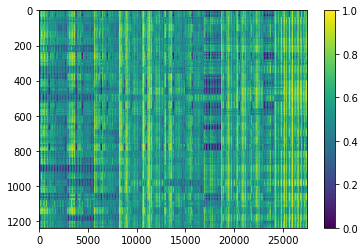

In [ ]:
#----------------------------------------------------------------------------------------------------------------
# for each sample (row) we apply min-max transformation
XT_norm = np.zeros((XT.shape))
for k in range(XT.shape[0]):
  XT_norm[k,:] = (XT[k,:]-XT[k,:].min())/(XT[k,:].max()-XT[k,:].min())
print('X normalized dimensions:',XT_norm.shape,XT_norm.max(),XT_norm.min())
#----------------------------------------------------------------------------------------------------------------
# plot resulting matrix
plt.imshow(XT_norm,aspect='auto')
plt.colorbar()
plt.show()
#----------------------------------------------------------------------------------------------------------------
del XT

In [ ]:
savemat(load_path+'conectividad_gauss.mat',{'gaus':XT2})

# PLV

In [ ]:
# !pip install -U git+https://github.com/UN-GCPDS/python-gcpds.filters.git
# !pip install -U git+https://github.com/UN-GCPDS/python-gcpds.utils.git
# !pip install -U mne 
# !pip install bctpy

In [ ]:
def _FB_PLVEEG(Xraw,vtw,f_frec,n_cycles,fs):
  Xcov = np.zeros((Xraw.shape[0],int(0.5*Xraw.shape[1]*(Xraw.shape[1]-1)),vtw.shape[0],f_frec.shape[0]))
  for w in range(vtw.shape[0]): #windows
    Xwtmpha = tfr_array_morlet(Xraw[:,:,int(fs*vtw[w,0]):int(fs*vtw[w,1])],sfreq=fs,freqs=f_frec,n_cycles=n_cycles,output="phase",n_jobs=-1)
    for f in range(f_frec.shape[0]): #frequencies
        Xcov[:,:,w,f] = np.array(Parallel(n_jobs=-1)(delayed(plv_phase_distance)(Xwtmpha,f,n) for n in range(Xraw.shape[0])))
      
  return Xcov
def plv(x,y):
  er = np.exp(1j*(x-y))
  return abs(np.mean(er))
def plv_phase_distance(Xwtmpha,f,n):
  k = pairwise_distances(Xwtmpha[n,:,f,:],Xwtmpha[n,:,f,:],metric=plv)
  k = 0.5*(k+k.T)
  k -= np.diag(np.diag(k))
  return squareform(k) 


In [ ]:
import mne
from mne.connectivity import spectral_connectivity as connectivity
# drive y datos
from google.colab import drive
import requests
# estructuras
import pandas as pd
# 
from ipywidgets import interact_manual
from ipywidgets import interact
# módulo para entrenamiento
from sklearn.pipeline import Pipeline
from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import make_scorer
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
# system
import os
from time import time
# data
import pickle
import numpy as np
from numpy import angle, sin, cos, sqrt
from scipy.io import loadmat, savemat
import scipy as sp
from scipy.io import savemat
from scipy.signal import butter, lfilter, welch, hanning, filtfilt, hilbert
# figuras
import matplotlib.pyplot as plt
from gcpds.utils import loaddb
from gcpds.utils.visualizations import plot_eeg, plot_topoplot
# MNE toolbox
import mne
import bct
from mne.preprocessing import ICA
# módulo de multiproceso de las tareas.
import multiprocessing
from sklearn.metrics import pairwise_distances  
from scipy.spatial.distance import squareform 
from mne.viz import plot_topomap
from scipy.stats import kurtosis
import pywt
from sklearn.preprocessing import MinMaxScaler
from scipy.signal import periodogram, welch
from scipy.stats import spearmanr
import matplotlib.colors as colors
import matplotlib.cm as cmx
from mne.time_frequency import tfr_array_morlet, csd_array_morlet, csd_array_fourier
from joblib import Parallel, delayed
from scipy.stats import kendalltau
# from mne.viz.topomap import _check_outlines, _draw_outlines
# from mne.viz.utils import plt_show,tight_layout
from mne.io.pick import _picks_to_idx
import itertools
import numpy as np
import itertools
from sklearn.base import  BaseEstimator, TransformerMixin
from scipy.signal import butter, lfilter, lfilter_zi, filtfilt #, freqz
from joblib import Parallel, delayed
import numpy as np
import itertools
from sklearn.base import  BaseEstimator, TransformerMixin
from scipy.signal import butter, lfilter, lfilter_zi, filtfilt #, freqz
from joblib import Parallel, delayed
from itertools import islice
from scipy.spatial.distance import cdist
from itertools import permutations
import math
from scipy import special
from sklearn.decomposition import KernelPCA
from scipy.spatial.distance import squareform
from sklearn.metrics import pairwise_distances
import time
from sklearn.linear_model import ElasticNet
from sklearn.linear_model import Lasso
from sklearn.base import  BaseEstimator, TransformerMixin
from sklearn.preprocessing import OneHotEncoder
from scipy.signal import butter, lfilter, lfilter_zi, filtfilt #, freqz
import numpy as np
from mne.io import read_raw_edf
#from mne.decoding import CSP
# from modCSP import CSP
import matplotlib.pyplot as plt
import pandas as pd
import json as js #conda install -c jmcmurray json
import warnings
import seaborn as sns
import mne
from numpy import matlib
import matplotlib
import os
from matplotlib.animation import FuncAnimation
from ipywidgets import interact


In [ ]:
# Sujetos de la base de datos
Subjects = list(np.arange(1,32))
# canales de la base de datos
channels = ['Fp1', 'Fp2', 'F7', 'F3', 'Fz', 'F4', 'F8', 'T3', 'C3', 'Cz', 'C4',
            'T4', 'T5', 'P3', 'Pz', 'P4', 'T6', 'O1', 'O2']
n_channels = len(channels)
# Frecuencia de muestreo de la base de datos.
sampling_freq  = 1000
# ubicación de la base de datos.
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
# Método utilizado para la función de ICA de MNE.
# method = 'fastica'
# Número de núcleos para ell multiproceso
# pool = multiprocessing.Pool(processes=multiprocessing.cpu_count())
# ciclo de los sujetos.
y = list()
n_cy = 5
# f_frec = np.array([[1,4],[4,8],[8,12],[12,16],[16,20],[20,30],[30,45]])
f_frec = np.arange(1., 44., 2.)
n_cy = f_frec/n_cy
# vtw= np.array([[0,2],[1,3],[2,4],[3,5],[4,6],[5,7]])
tau = 0.5
overlap = 1-0.5
ti = 3
tf = 15
tti = np.arange(ti,tf-tau+(tau*overlap),tau*overlap)
ttf = np.arange(ti+tau,tf+tau*overlap,tau*overlap)
vtw = np.array([tti,ttf]).T
PLV = list()
data_ref = list()
for s in Subjects:
  # carga de la información del sujetos.
  S_ERP = loadmat(load_path + f"Sujeto_"+str(s)+".mat")
  print('sujeto: ', s)
  data = S_ERP['music']
  # data = np.transpose(data, (2,1,0)) # transponer en trials x canales x tiempo
  data_target = data#[:,:,::4]
  
  # structure mne datos en (trials,canales,tiempo)
  ch_types = ['eeg']*n_channels
  info = mne.create_info(channels, ch_types=ch_types, sfreq=sampling_freq)
  # info.set_montage('standard_1005')
  raw = mne.EpochsArray(data_target, info)
  biosemi_montage = mne.channels.make_standard_montage('standard_1005')
  raw.set_montage(biosemi_montage)

  # feat = FB_feats(fs=sampling_freq,vtw=vtw,f_frec=f_frec,gammad=1,feat='PLV')
  # filtro la señal de 0.5 - 50 Hz.
  raw.filter(0.5,100)

  # señal sin quitar los artefactos.
  # plt.figure(figsize=(20,8))
  # plot_eeg(raw.get_data()[0,:,:],channels,sampling_freq)

  # Repairing artifacts with ICA
  # ica.plot_sources(raw, show_scrollbars=False)
  # ica = ICA(n_components=n_channels, method=method, max_iter='auto', random_state=0)
  # ica.fit(raw)
  # componentes = ica.get_sources(raw).get_data()
  
  # señal sin quitar los artefactos.
  # plt.figure(figsize=(20,8))
  # plot_eeg(componentes[0,:,:],channels,sampling_freq)
  
  # Parametros para el análisis de la entropia.
  # tau     = 10              # 20   30 
  # window  = 1*sampling_freq # 3,   3   segundo de la ventana.
  # step    = window*0.5      # 50%, 80% de traslape.
  # windows = list(np.arange(0,componentes.shape[2]-window,step))

  # start_time = time.time()
  # entropy_tr = list()
  # for tr in range(data_target.shape[0]):
  #   data = list()
  #   for time_ in range(len(windows)):
  #     signal = np.squeeze(raw.get_data()[tr,:,int(windows[time_]):int(windows[time_]+window)])
  #     data.append(signal)
  #   # estimación de la entropía de la señal.
  #   entropy_tr.append(np.asarray(pool.map(fun_entropy, data)))
  # entropy_raw = np.asarray(entropy_tr)
  # print('Tiempo de la entropia de componentes {tim}'.format(tim=(time.time()-start_time)))
  # # ica.plot_sources(mne.io.RawArray(raw.get_data()[0], info))
  
  # start_time = time.time()
  # entropy_tr = list()
  # for tr in range(data_target.shape[0]):
  #   data = list()
  #   for time_ in range(len(windows)):
  #     signal = np.squeeze(componentes[tr,:,int(windows[time_]):int(windows[time_]+window)])
  #     data.append(signal)
  #   # estimación de la entropía de las componentes.
  #   entropy_tr.append(np.asarray(pool.map(fun_entropy, data)))
  # entropy_com = np.asarray(entropy_tr)
  # print('Tiempo de la entropia de componentes {tim}'.format(tim=(time.time()-start_time)))
  
  # raw2 = raw.copy()
  # comp_ = []
  # for tr in range(entropy_com.shape[0]):
  #   datos_ = np.max(entropy_com[tr,:,:],axis=0)-np.min(entropy_com[0,:,:],axis=0)
  #   datos_f = np.asarray([round(a,1) for a in datos_])
  #   comp_.append(np.where((datos_f>0)==True)[0])
  # pos = list(np.unique(np.concatenate(comp_)))
  # ica.exclude = [0,1]          # indices chosen based on various plots above sujeto 2.
  # ica.apply(raw2)
  
  # # figura señal quitando artefactos
  # plt.figure(figsize=(20,8))
  # plot_eeg(raw2.get_data()[0,:,:],channels,sampling_freq)

  # start_time = time.time()
  # entropy_tr = list()
  # for tr in range(data_target.shape[0]):
  #   data = list()
  #   for time_ in range(len(windows)):
  #     signal = np.squeeze(raw2.get_data()[tr,:,int(windows[time_]):int(windows[time_]+window)])
  #     data.append(signal)
  #   # estimación de la entropía de la señal quitando artefactos.
  #   entropy_tr.append(np.asarray(pool.map(fun_entropy, data)))
  # entropy_ica = np.asarray(entropy_tr)
  # print('Tiempo de la entropia de la señal {tim}'.format(tim=(time.time()-start_time)))

  # # CAR common average reference
  # # En la señal.
  rereferenced_raw, ref_data = mne.set_eeg_reference(raw, ref_channels='average',projection=True,verbose=0)
  # data_ref.append(rereferenced_raw.get_data())
  data_ref = rereferenced_raw.get_data()
  PLV.append(_FB_PLVEEG(data_ref,vtw,f_frec,n_cy,sampling_freq))
  # # En la señal reconstruida.
  # rereferenced_raw_ica, ref_data = mne.set_eeg_reference(raw2, ref_channels='average',projection=True,verbose=0)
  # data_ref_ica.append(rereferenced_raw.get_data())
  # data_ref_ica = rereferenced_raw_ica.get_data()
  # savemat(load_path+f'Resultado_music_Sujeto'+str(s)+'.mat',{'X_ica':raw2.get_data(),'X_raw':raw.get_data(),'ref_raw':data_ref,
            # 'ref_ica':data_ref_ica,'H_raw':entropy_raw,'H_com':entropy_com,'H_ica':entropy_ica})
  savemat(load_path+f'PLV_all_subs'+str(s)+'_music2.mat',{'PLV':PLV})

sujeto:  1
sujeto:  2
sujeto:  3
sujeto:  4
sujeto:  5
sujeto:  6
sujeto:  7
sujeto:  8
sujeto:  9
sujeto:  10
sujeto:  11
sujeto:  12
sujeto:  13
sujeto:  14
sujeto:  15
sujeto:  16
sujeto:  17
sujeto:  18
sujeto:  19
sujeto:  20
sujeto:  21
sujeto:  22
sujeto:  23
sujeto:  24
sujeto:  25
sujeto:  26
sujeto:  27
sujeto:  28
sujeto:  29
sujeto:  30
sujeto:  31


# características dde musica PCA + varimax

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat,savemat
from sklearn.decomposition import FactorAnalysis, PCA
from sklearn.preprocessing import StandardScaler

In [ ]:
load_path = '/content/drive/Shareddrives/GCPDS/databases/Databases_musica/Affective music listening 2/'
# data = loadmat(load_path+'datos_stim_ord2.mat')['datos']
data = loadmat(load_path+'datos_stim_ord_all.mat')['datos']
data.shape

(31, 40, 25, 260)

In [ ]:
data = data[:,:,:5,:]
np.save('data.npy', data)

In [ ]:
tr_cu= loadmat(load_path+'Trials_cuadrantes.mat')['trial_ord']

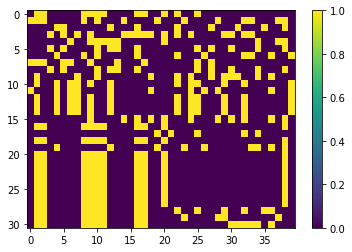

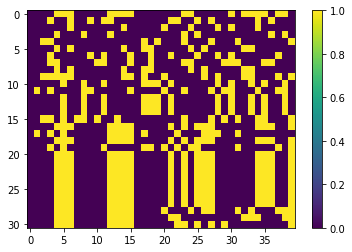

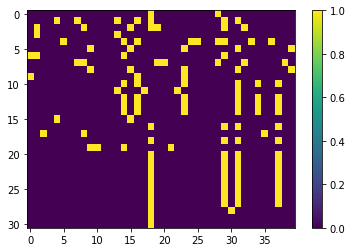

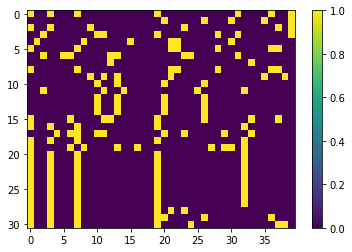

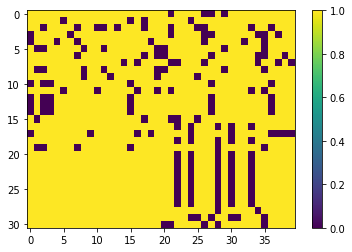

In [ ]:
tr_1 = tr_cu==1
tr_2 = tr_cu==2
tr_3 = tr_cu==3
tr_4 = tr_cu==4
tr_all = tr_1+tr_2+tr_3+tr_4

plt.figure()
plt.imshow(tr_1,aspect='auto')
plt.colorbar()
plt.show()

plt.figure()
plt.imshow(tr_2,aspect='auto')
plt.colorbar()
plt.show()

plt.figure()
plt.imshow(tr_3,aspect='auto')
plt.colorbar()
plt.show()

plt.figure()
plt.imshow(tr_4,aspect='auto')
plt.colorbar()
plt.show()

plt.figure()
plt.imshow(tr_all,aspect='auto')
plt.colorbar()
plt.show()


In [ ]:
data = np.transpose(data,[2,0,1,3])
data.shape

(25, 31, 40, 260)

In [ ]:
np.sum(np.sum(np.sum(np.sum(np.isnan(data)))))

1004

In [ ]:
data1 = np.reshape(data,(data.shape[0],data.shape[1]*data.shape[2],data.shape[3]))
print(data.shape)
data_2=data1[:,tr_all.reshape([tr_all.shape[0]*tr_all.shape[1]]),:]
print(data_2.shape)
dataf = data_2.reshape([data_2.shape[0],data_2.shape[1]*data_2.shape[2]])
print(dataf.shape)
dataf[np.isnan(dataf)]=0

(25, 31, 40, 260)
(25, 1055, 260)
(25, 274300)


In [ ]:
data_f = np.zeros((20,62289))
for s in range(20):
  print(dataf[s,dataf[s,:]!=0].shape)

(274300,)
(274300,)
(274300,)
(274300,)
(274300,)
(274300,)
(274300,)
(271788,)
(274300,)
(274300,)
(274300,)
(274300,)
(274300,)
(274300,)
(274300,)
(274300,)
(274300,)
(274300,)
(274300,)
(274300,)


In [ ]:
dataf

array([[ 2.90000000e+02,  4.80000000e+02,  4.00000000e+02, ...,
         2.70000000e+02,  2.10000000e+02,  1.90000000e+02],
       [ 9.60560383e+02,  1.24033712e+03,  1.15481032e+03, ...,
         1.30153855e+03,  9.62341402e+02,  9.98533574e+02],
       [ 5.32359081e-01,  5.32359081e-01,  5.32359081e-01, ...,
         4.73903967e-01,  4.73903967e-01,  4.73903967e-01],
       ...,
       [ 2.88700239e+00,  2.88700239e+00,  2.88700239e+00, ...,
         1.34845613e-01,  1.34845613e-01,  1.34845613e-01],
       [ 2.21731850e-02,  6.96938113e-03,  6.57137687e-03, ...,
        -2.48120472e-01, -2.56773913e-01, -2.67405690e-01],
       [ 6.62723820e-01,  6.50788139e-01,  6.44972402e-01, ...,
         8.44346048e-01,  8.58142316e-01,  8.64567217e-01]])

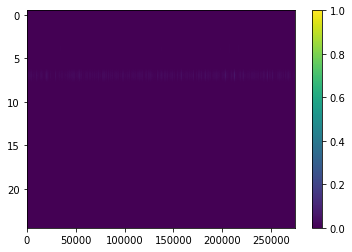

In [ ]:
plt.imshow(dataf/np.max(dataf),aspect='auto')
plt.colorbar()
plt.show()

In [ ]:
X = StandardScaler().fit_transform(dataf)
transformer = FactorAnalysis(n_components=9, random_state=0, rotation='varimax')
X_transformed_all = transformer.fit_transform(dataf)

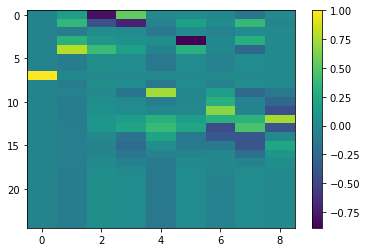

In [ ]:
plt.figure()
plt.imshow(X_transformed_all/np.max(X_transformed_all),aspect='auto')
plt.colorbar()
plt.show()

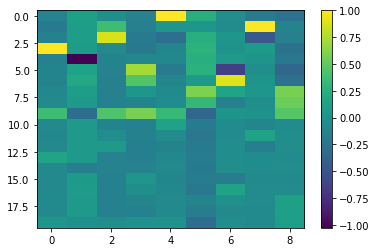

In [ ]:
plt.figure()
plt.imshow(X_transformed_all/np.max(X_transformed_all),aspect='auto')
plt.colorbar()
plt.show()

In [ ]:
data1 = np.reshape(data,(data.shape[0],data.shape[1]*data.shape[2],data.shape[3]))
print(data.shape)
data_2=data1[:,tr_1.reshape([tr_1.shape[0]*tr_1.shape[1]]),:]
print(data_2.shape)
dataf = data_2.reshape([data_2.shape[0],data_2.shape[1]*data_2.shape[2]])
print(dataf.shape)
dataf[np.isnan(dataf)]=0
X = StandardScaler().fit_transform(dataf)
transformer = FactorAnalysis(n_components=9, random_state=0, rotation='varimax')
X_transformed_1 = transformer.fit_transform(X)

(25, 31, 40, 260)
(25, 337, 260)
(25, 87620)


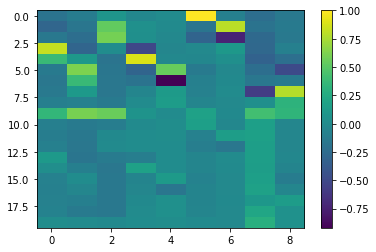

In [ ]:
plt.figure()
plt.imshow(X_transformed_1/np.max(X_transformed_1),aspect='auto')
plt.colorbar()
plt.show()

In [ ]:
data1 = np.reshape(data,(data.shape[0],data.shape[1]*data.shape[2],data.shape[3]))
print(data.shape)
data_2=data1[:,tr_2.reshape([tr_2.shape[0]*tr_2.shape[1]]),:]
print(data_2.shape)
dataf = data_2.reshape([data_2.shape[0],data_2.shape[1]*data_2.shape[2]])
print(dataf.shape)
dataf[np.isnan(dataf)]=0
X = StandardScaler().fit_transform(dataf)
transformer = FactorAnalysis(n_components=9, random_state=0, rotation='varimax')
X_transformed_2 = transformer.fit_transform(X)

(25, 31, 40, 260)
(25, 408, 260)
(25, 106080)


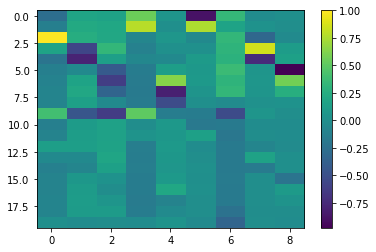

In [ ]:
plt.figure()
plt.imshow(X_transformed_2/np.max(X_transformed_2),aspect='auto')
plt.colorbar()
plt.show()

In [ ]:
data1 = np.reshape(data,(data.shape[0],data.shape[1]*data.shape[2],data.shape[3]))
print(data.shape)
data_2=data1[:,tr_3.reshape([tr_3.shape[0]*tr_3.shape[1]]),:]
print(data_2.shape)
dataf = data_2.reshape([data_2.shape[0],data_2.shape[1]*data_2.shape[2]])
print(dataf.shape)
dataf[np.isnan(dataf)]=0
X = StandardScaler().fit_transform(dataf)
transformer = FactorAnalysis(n_components=9, random_state=0, rotation='varimax')
X_transformed_3 = transformer.fit_transform(X)

(25, 31, 40, 260)
(25, 132, 260)
(25, 34320)


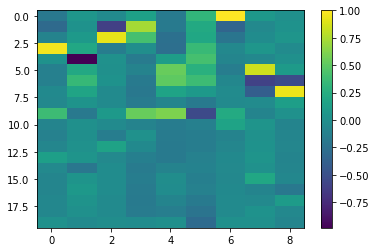

In [ ]:
plt.figure()
plt.imshow(X_transformed_3/np.max(X_transformed_3),aspect='auto')
plt.colorbar()
plt.show()

In [ ]:
data1 = np.reshape(data,(data.shape[0],data.shape[1]*data.shape[2],data.shape[3]))
print(data.shape)
data_2=data1[:,tr_4.reshape([tr_4.shape[0]*tr_4.shape[1]]),:]
print(data_2.shape)
dataf = data_2.reshape([data_2.shape[0],data_2.shape[1]*data_2.shape[2]])
print(dataf.shape)
dataf[np.isnan(dataf)]=0
X = StandardScaler().fit_transform(dataf)
transformer = FactorAnalysis(n_components=9, random_state=0, rotation='varimax')
X_transformed_4 = transformer.fit_transform(X)

(25, 31, 40, 260)
(25, 178, 260)
(25, 46280)


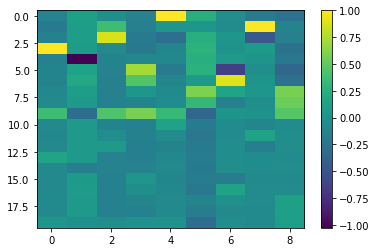

In [ ]:
plt.figure()
plt.imshow(X_transformed_4/np.max(X_transformed_4),aspect='auto')
plt.colorbar()
plt.show()

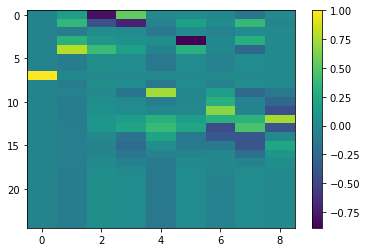

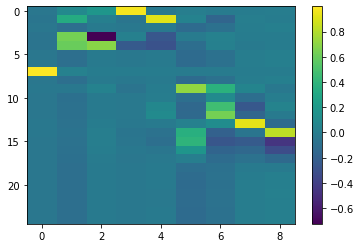

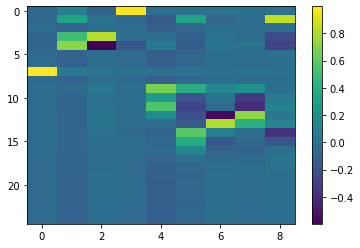

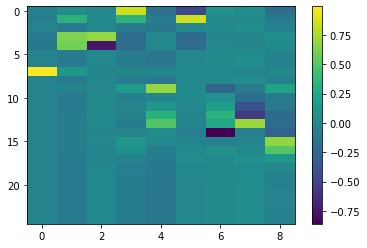

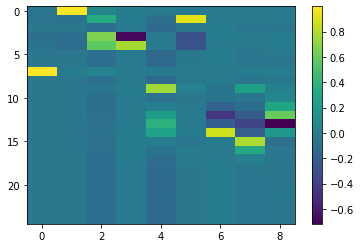

In [ ]:
max_ = np.max([np.max(X_transformed_all),np.max(X_transformed_1),np.max(X_transformed_2),\
               np.max(X_transformed_3),np.max(X_transformed_4)])
plt.figure()
plt.imshow(X_transformed_all/max_,aspect='auto')
plt.colorbar()
# plt.yticks=(list(np.arange(0,25,1)),list(np.arange(0,25,1)))
plt.show()


plt.figure()
plt.imshow(X_transformed_1/max_,aspect='auto')
plt.colorbar()
plt.show()
plt.figure()
plt.imshow(X_transformed_2/max_,aspect='auto')
plt.colorbar()
plt.show()
plt.figure()
plt.imshow(X_transformed_3/max_,aspect='auto')
plt.colorbar()
plt.show()
plt.figure()
plt.imshow(X_transformed_4/max_,aspect='auto')
plt.colorbar()
plt.show()

In [ ]:
data_2.shape

(20, 178, 350)

In [ ]:
data

In [ ]:
from scipy import signal
import matplotlib.pyplot as plt
rng = np.random.default_rng()

In [ ]:
fs = 1000
N = 12000
amp = 2 * np.sqrt(2)
noise_power = 0.01 * fs / 2
time = np.arange(N) / float(fs)
mod = 500*np.cos(2*np.pi*0.25*time)
carrier = amp * np.sin(2*np.pi*3e3*time + mod)
noise = rng.normal(scale=np.sqrt(noise_power),
                   size=time.shape)
noise *= np.exp(-time/5)
x = carrier + noise

In [ ]:
window = signal.get_window('hamming', 260)
# win = signal.get_window(260, 260, fftbins=True)

print(window.shape)
# window

(260,)


In [ ]:
f, t, Zxx = signal.stft(x, fs,window='hann',noverlap=50,nperseg=96)
print(x.shape)
print('fs: ',fs)
print(f.shape)
print(t.shape)

(12000,)
fs:  1000
(49,)
(262,)


In [ ]:
f


array([  0.        ,  10.41666667,  20.83333333,  31.25      ,
        41.66666667,  52.08333333,  62.5       ,  72.91666667,
        83.33333333,  93.75      , 104.16666667, 114.58333333,
       125.        , 135.41666667, 145.83333333, 156.25      ,
       166.66666667, 177.08333333, 187.5       , 197.91666667,
       208.33333333, 218.75      , 229.16666667, 239.58333333,
       250.        , 260.41666667, 270.83333333, 281.25      ,
       291.66666667, 302.08333333, 312.5       , 322.91666667,
       333.33333333, 343.75      , 354.16666667, 364.58333333,
       375.        , 385.41666667, 395.83333333, 406.25      ,
       416.66666667, 427.08333333, 437.5       , 447.91666667,
       458.33333333, 468.75      , 479.16666667, 489.58333333,
       500.        ])